In [52]:
#IMPORT SOME BASIC LIBRARIES 
import requests
import json
import torch
import os
from tqdm import tqdm


from pathlib import Path
from torch.utils.data import DataLoader
import time

In [54]:

with open(r"/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/random_testing/reactant/react_full_4173.json", "r") as read_file:
    full = json.load(read_file)

In [55]:
len(full)

4173

In [56]:
from sklearn.model_selection import train_test_split

train, _ = train_test_split(full, test_size=0.30, random_state=42)
valid, test = train_test_split(_, test_size=0.50, random_state=42)

In [7]:
len(train), len(valid), len(test)

(107, 23, 23)

In [19]:
def read_data(squad):


    contexts = []
    questions = []
    answers = []

    for group in squad:
    # for passage in group['paragraphs']:
        context = group['context']
        for qa in group['qas']:
            question = qa['question']
            for answer in qa['answers']:
                contexts.append(context)
                questions.append(question)
                answers.append(answer)

    return contexts, questions, answers


train_contexts, train_questions, train_answers = read_data(train)
valid_contexts, valid_questions, valid_answers = read_data(valid)
test_contexts, test_questions, test_answers = read_data(test)

In [20]:
len(train_contexts), len(train_answers)

print("shape of train:>>", len(train_contexts))
print("shape of valid:>>", len(valid_contexts))
print("shape of test:>>", len(test_contexts))

shape of train:>> 57496
shape of valid:>> 12406
shape of test:>> 12428


In [10]:
train_contexts[0]

'Plastics play an important role in the transition from the current linear economy to a more circular one, but ideas differ about this role. These ideas were studied in this article as a form of futurity framing. These framings may hinder or contribute to a transition toward a circular bioeconomy by opening up or closing down alternative paradigms for thinking about plastics in the future. Based on a media analysis of four Dutch national newspapers and international academic papers, three futurity frames were found regarding the role of different types of plastics in a linear economy, a circular economy, or an economy in transition. (1) In newspapers and academic sources, traditional plastics were considered part of a linear economy. (2) In both sources, all sorts of actors saw a future for plastics with improved material properties in a transition toward a circular economy, but in combination with a change in consumer behavior and waste management systems. (3) In both academic journal

In [11]:
train_questions[0]

'What are the reactants used?'

In [12]:
train_answers[0]

{'text': 'plastics', 'answer_start': 368}

In [13]:
def add_end_idx(answers, contexts):
    for answer, context in zip(answers, contexts):
        gold_text = answer['text']
        start_idx = answer['answer_start']
        end_idx = start_idx + len(gold_text)

        # sometimes squad answers are off by a character or two so we fix this
        if context[start_idx:end_idx] == gold_text:
            answer['answer_end'] = end_idx
        elif context[start_idx-1:end_idx-1] == gold_text:
            answer['answer_start'] = start_idx - 1
            answer['answer_end'] = end_idx - 1     # When the gold label is off by one character
        elif context[start_idx-2:end_idx-2] == gold_text:
            answer['answer_start'] = start_idx - 2
            answer['answer_end'] = end_idx - 2     # When the gold label is off by two characters
        else:
            answer['answer_end'] = end_idx

add_end_idx(train_answers, train_contexts)
add_end_idx(valid_answers, valid_contexts)
add_end_idx(test_answers, test_contexts)

In [14]:
# You can see that now we get the answer_end also
print(train_questions[-10])
print(train_answers[-10])
print(train_contexts[-10])

What are the reactants used?
{'text': 'polypropylene (PP) plastics', 'answer_start': 288, 'answer_end': 315}
Cyanobacteria and plastics, as the two major problems of the water environment crisis, need to be solved urgently. In particular, there is no reasonable method for simultaneously treating these wastes and recovering useful resources from them. Therefore, the mixture of cyanobacteria and polypropylene (PP) plastics is directly pyrolyzed at different activation conditions to synthesize the composite carbon (CPC) materials, which have excellent performance in water contaminant removal. The result indicates that the added PP is beneficial to improve the properties of CPC material, increasing its specific surface area and pore volume (up to 2811 m2/g and 1.992 cm3/g, respectively). The application performance of CPC materials is mainly determined by the surface area and pore volume. Therefore, the CPC materials exhibit a higher methylene blue (MB) adsorption (maximum 490 mg/g). This 

In [15]:
from transformers import BertTokenizerFast

tokenizer = BertTokenizerFast.from_pretrained('bert-base-cased')

train_encodings = tokenizer(train_contexts, train_questions, truncation=True, padding=True)
valid_encodings = tokenizer(valid_contexts, valid_questions, truncation=True, padding=True)
test_encodings = tokenizer(test_contexts, test_questions, truncation=True, padding=True)

In [16]:
train_encodings.keys()

dict_keys(['input_ids', 'token_type_ids', 'attention_mask'])

In [17]:
no_of_encodings = len(valid_encodings['input_ids'])
print(f'We have {no_of_encodings} context-question pairs')

We have 12406 context-question pairs


In [18]:
no_of_encodings = len(test_encodings['input_ids'])
print(f'We have {no_of_encodings} context-question pairs')

We have 12428 context-question pairs


In [19]:
no_of_encodings = len(train_encodings['input_ids'])
print(f'We have {no_of_encodings} context-question pairs')

We have 57496 context-question pairs


In [20]:
print(train_encodings['input_ids'][0])

[101, 26759, 1116, 1505, 1126, 1696, 1648, 1107, 1103, 6468, 1121, 1103, 1954, 7378, 4190, 1106, 170, 1167, 8287, 1141, 117, 1133, 4133, 11271, 1164, 1142, 1648, 119, 1636, 4133, 1127, 2376, 1107, 1142, 3342, 1112, 170, 1532, 1104, 175, 3818, 20172, 23431, 119, 1636, 23431, 1116, 1336, 24856, 1200, 1137, 8681, 1106, 170, 6468, 1755, 170, 8287, 25128, 10294, 19608, 1118, 2280, 1146, 1137, 5134, 1205, 4174, 26213, 1116, 1111, 2422, 1164, 5828, 1116, 1107, 1103, 2174, 119, 7457, 1113, 170, 2394, 3622, 1104, 1300, 2954, 1569, 6195, 1105, 1835, 3397, 4580, 117, 1210, 175, 3818, 20172, 11382, 1127, 1276, 4423, 1103, 1648, 1104, 1472, 3322, 1104, 5828, 1116, 1107, 170, 7378, 4190, 117, 170, 8287, 4190, 117, 1137, 1126, 4190, 1107, 6468, 119, 113, 122, 114, 1130, 6195, 1105, 3397, 3509, 117, 2361, 5828, 1116, 1127, 1737, 1226, 1104, 170, 7378, 4190, 119, 113, 123, 114, 1130, 1241, 3509, 117, 1155, 12072, 1104, 5681, 1486, 170, 2174, 1111, 5828, 1116, 1114, 4725, 2578, 4625, 1107, 170, 6468, 17

In [21]:
tokenizer.decode(train_encodings['input_ids'][0])

'[CLS] Plastics play an important role in the transition from the current linear economy to a more circular one, but ideas differ about this role. These ideas were studied in this article as a form of futurity framing. These framings may hinder or contribute to a transition toward a circular bioeconomy by opening up or closing down alternative paradigms for thinking about plastics in the future. Based on a media analysis of four Dutch national newspapers and international academic papers, three futurity frames were found regarding the role of different types of plastics in a linear economy, a circular economy, or an economy in transition. ( 1 ) In newspapers and academic sources, traditional plastics were considered part of a linear economy. ( 2 ) In both sources, all sorts of actors saw a future for plastics with improved material properties in a transition toward a circular economy, but in combination with a change in consumer behavior and waste management systems. ( 3 ) In both acad

In [22]:
def add_token_positions(encodings, answers):
    start_positions = []
    end_positions = []
    for i in range(len(answers)):
        # print(i)
        start_positions.append(encodings.char_to_token(i, answers[i]['answer_start']))
        end_positions.append(encodings.char_to_token(i, answers[i]['answer_end'] - 1))
        # print(i)

        # if start position is None, the answer passage has been truncated
        if start_positions[-1] is None:
            start_positions[-1] = tokenizer.model_max_length
        if end_positions[-1] is None:
            end_positions[-1] = tokenizer.model_max_length

        encodings.update({'start_positions': start_positions, 'end_positions': end_positions})

In [23]:
add_token_positions(train_encodings, train_answers)
add_token_positions(valid_encodings, valid_answers)
add_token_positions(test_encodings, test_answers)

In [24]:
train_encodings['start_positions'][:10]

[73, 134, 184, 28, 1, 7, 179, 238, 287, 47]

# Dataset definition 🗄️
We have to define our dataset using the PyTorch Dataset class from torch.utils in order create our dataloaders after that.

In [25]:
class SQuAD_Dataset(torch.utils.data.Dataset):
    def __init__(self, encodings):
        self.encodings = encodings
    def __getitem__(self, idx):
        return {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
    def __len__(self):
        return len(self.encodings.input_ids)

In [26]:
train_dataset = SQuAD_Dataset(train_encodings)
valid_dataset = SQuAD_Dataset(valid_encodings)
test_dataset  = SQuAD_Dataset(test_encodings)

**Dataloader**

In [27]:
from torch.utils.data import DataLoader

# Define the dataloaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=16)
test_loader  = DataLoader(test_dataset, batch_size=16)

# Load pretrained bert
We are going to use the bert-case-uncased from the huggingface transformers.

In [28]:
from transformers import BertForQuestionAnswering

#model = BertForQuestionAnswering.from_pretrained("bert-base-uncased")

In [29]:
# Check on the available device - use GPU
device = torch.device('cuda:1') if torch.cuda.is_available() else torch.device('cpu')
print(f'Working on {device}')

Working on cuda:1


In [30]:
from transformers import AdamW
import torch.nn as nn

model = BertForQuestionAnswering.from_pretrained('bert-base-cased').to(device)

optim = AdamW(model.parameters(), lr=5e-5)
# optim = AdamW(model.parameters(), lr=3e-5)
# optim = AdamW(model.parameters(), lr=2e-5)

# epochs = 2
epochs = 10
# epochs = 4

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForQuestionAnswering: ['cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForQuestionAnswering were not initialized from the model checkpoint at bert-base-cased and a

In [31]:
val_loader = valid_loader

In [32]:
whole_train_eval_time = time.time()

train_losses = []
val_losses = []

print_every = 100

for epoch in range(epochs):
    epoch_time = time.time()

    # Set model in train mode
    model.train()

    loss_of_epoch = 0

    print("############Train############")

    for batch_idx,batch in enumerate(train_loader): 

        optim.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        start_positions = batch['start_positions'].to(device)
        end_positions = batch['end_positions'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask, start_positions=start_positions, end_positions=end_positions)
        loss = outputs[0]
        # do a backwards pass 
        loss.backward()
        # update the weights
        optim.step()
        # Find the total loss
        loss_of_epoch += loss.item()

        if (batch_idx+1) % print_every == 0:
            print("Batch {:} / {:}".format(batch_idx+1,len(train_loader)),"\nLoss:", round(loss.item(),1),"\n")

    loss_of_epoch /= len(train_loader)
    train_losses.append(loss_of_epoch)

    ##########Evaluation##################

    # Set model in evaluation mode
    model.eval()

    print("############Evaluate############")

    loss_of_epoch = 0

    for batch_idx,batch in enumerate(val_loader):

        with torch.no_grad():

            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            start_positions = batch['start_positions'].to(device)
            end_positions = batch['end_positions'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask, start_positions=start_positions, end_positions=end_positions)
            loss = outputs[0]
            # Find the total loss
            loss_of_epoch += loss.item()

        if (batch_idx+1) % print_every == 0:
            print("Batch {:} / {:}".format(batch_idx+1,len(val_loader)),"\nLoss:", round(loss.item(),1),"\n")

    loss_of_epoch /= len(val_loader)
    val_losses.append(loss_of_epoch)

    # Print each epoch's time and train/val loss 
    print("\n-------Epoch ", epoch+1,
        "-------"
        "\nTraining Loss:", train_losses[-1],
        "\nValidation Loss:", val_losses[-1],
        "\nTime: ",(time.time() - epoch_time),
        "\n-----------------------",
        "\n\n")

print("Total training and evaluation time: ", (time.time() - whole_train_eval_time))

############Train############
Batch 100 / 3594 
Loss: 2.4 

Batch 200 / 3594 
Loss: 2.1 

Batch 300 / 3594 
Loss: 2.3 

Batch 400 / 3594 
Loss: 2.2 

Batch 500 / 3594 
Loss: 2.2 

Batch 600 / 3594 
Loss: 2.0 

Batch 700 / 3594 
Loss: 2.8 

Batch 800 / 3594 
Loss: 2.8 

Batch 900 / 3594 
Loss: 2.2 

Batch 1000 / 3594 
Loss: 2.2 

Batch 1100 / 3594 
Loss: 2.2 

Batch 1200 / 3594 
Loss: 1.9 

Batch 1300 / 3594 
Loss: 2.1 

Batch 1400 / 3594 
Loss: 2.1 

Batch 1500 / 3594 
Loss: 2.0 

Batch 1600 / 3594 
Loss: 1.9 

Batch 1700 / 3594 
Loss: 2.3 

Batch 1800 / 3594 
Loss: 1.9 

Batch 1900 / 3594 
Loss: 2.1 

Batch 2000 / 3594 
Loss: 2.2 

Batch 2100 / 3594 
Loss: 1.9 

Batch 2200 / 3594 
Loss: 1.9 

Batch 2300 / 3594 
Loss: 2.0 

Batch 2400 / 3594 
Loss: 2.1 

Batch 2500 / 3594 
Loss: 1.8 

Batch 2600 / 3594 
Loss: 2.3 

Batch 2700 / 3594 
Loss: 2.3 

Batch 2800 / 3594 
Loss: 1.9 

Batch 2900 / 3594 
Loss: 1.8 

Batch 3000 / 3594 
Loss: 2.1 

Batch 3100 / 3594 
Loss: 1.7 

Batch 3200 / 3594 

Batch 2400 / 3594 
Loss: 2.1 

Batch 2500 / 3594 
Loss: 1.6 

Batch 2600 / 3594 
Loss: 1.6 

Batch 2700 / 3594 
Loss: 1.6 

Batch 2800 / 3594 
Loss: 1.5 

Batch 2900 / 3594 
Loss: 1.8 

Batch 3000 / 3594 
Loss: 1.9 

Batch 3100 / 3594 
Loss: 2.1 

Batch 3200 / 3594 
Loss: 1.9 

Batch 3300 / 3594 
Loss: 2.3 

Batch 3400 / 3594 
Loss: 2.0 

Batch 3500 / 3594 
Loss: 1.8 

############Evaluate############
Batch 100 / 776 
Loss: 1.4 

Batch 200 / 776 
Loss: 1.9 

Batch 300 / 776 
Loss: 1.6 

Batch 400 / 776 
Loss: 1.7 

Batch 500 / 776 
Loss: 1.8 

Batch 600 / 776 
Loss: 1.5 

Batch 700 / 776 
Loss: 1.9 


-------Epoch  6 -------
Training Loss: 1.7854612949959887 
Validation Loss: 1.815983185141357 
Time:  2895.7169466018677 
----------------------- 


############Train############
Batch 100 / 3594 
Loss: 1.9 

Batch 200 / 3594 
Loss: 1.7 

Batch 300 / 3594 
Loss: 2.0 

Batch 400 / 3594 
Loss: 1.5 

Batch 500 / 3594 
Loss: 2.2 

Batch 600 / 3594 
Loss: 1.8 

Batch 700 / 3594 
Loss: 1.7 

Ba

# Step 12: Plot train and validation losses

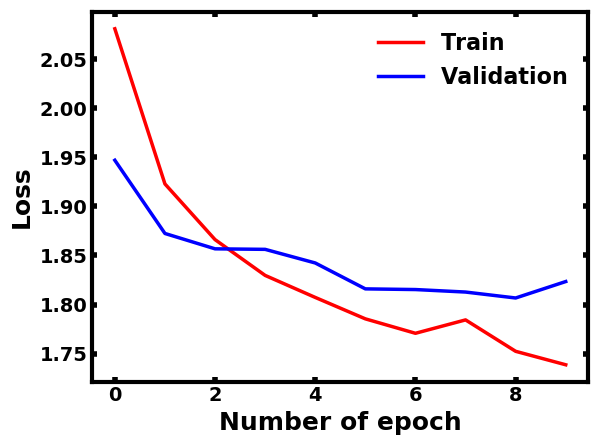

In [35]:
import matplotlib.pyplot as plt

plt.plot(range(len(train_losses)), train_losses, color='red', label= 'Train', linewidth=2.5)
plt.plot(range(len(val_losses)), val_losses, color =  'Blue', label = 'Validation', linewidth=2.5)
#plt.title('Classification loss')
plt.legend(frameon=False,prop={'weight':'bold',"size":16})
plt.xlabel('Number of epoch',fontweight='bold', fontsize=18)
plt.ylabel('Loss',fontweight='bold', fontsize=18)
#plt.title('GP Regression',fontweight='bold')
#plt.axis('square')
from matplotlib import rc

plt.rcParams['axes.linewidth'] = 3

plt.tick_params(axis="x", direction="in",width=4)
plt.tick_params(axis="y", direction="in", width=4)

rc('font', weight='bold')

plt.tick_params(bottom=True, top=True, left=True, right=True)
plt.tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False)
plt.xticks(rotation = '0', fontsize = 14)
plt.yticks(rotation = '0', fontsize = 14)
#plt.legend(handles=h, labels=np.arange(0.9,0.85), title="Quality")
#plt.rcParams.update({'legend.fontweight':'bold'}
#plt.savefig('line_plot.pdf')
plt.savefig(r'/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/curve_learnin/learning_react.pdf', dpi=5000)
plt.show()

In [ ]:

fig,ax = plt.subplots(1,1,figsize=(15,10))

ax.set_title("Train and Validation Losses",size=20)
ax.set_ylabel('Loss', fontsize = 20) 
ax.set_xlabel('Epochs', fontsize = 25) 
_=ax.plot(train_losses)
_=ax.plot(val_losses)
_=ax.legend(('Train','Val'),loc='upper right')

**Save the model in my drive in order not to run it each time**

In [34]:
model_path = "/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/"
model.save_pretrained(model_path)
tokenizer.save_pretrained(model_path)

('/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/tokenizer_config.json',
 '/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/special_tokens_map.json',
 '/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/vocab.txt',
 '/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/added_tokens.json',
 '/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/tokenizer.json')

# Test
We are evaluating the model on the validation set by checking the model's predictions for the answer's start and end indexes and comparing with the true ones.

In [29]:
model.eval()

acc = []

for batch in tqdm(valid_loader):
    with torch.no_grad():
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        start_true = batch['start_positions'].to(device)
        end_true = batch['end_positions'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)

        start_pred = torch.argmax(outputs['start_logits'], dim=1)
        end_pred = torch.argmax(outputs['end_logits'], dim=1)

        acc.append(((start_pred == start_true).sum()/len(start_pred)).item())
        acc.append(((end_pred == end_true).sum()/len(end_pred)).item())

acc = sum(acc)/len(acc)

print("\n\nT/P\tanswer_start\tanswer_end\n")
for i in range(len(start_true)):
    print(f"true\t{start_true[i]}\t{end_true[i]}\n"
        f"pred\t{start_pred[i]}\t{end_pred[i]}\n")

100%|████████████████████████████████████████████████████████████████| 537/537 [02:17<00:00,  3.90it/s]



T/P	answer_start	answer_end

true	36	39
pred	58	61

true	58	61
pred	58	61

true	102	106
pred	58	61

true	512	512
pred	58	61

true	141	145
pred	58	61

true	5	7
pred	5	7



# Data load for testing

In [30]:
import json
with open(r"/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/data/data qna/data_individual/with_dupli/bert/react_test.json", "r") as read_file:
    train_ca = json.load(read_file)

In [31]:
len(train_ca)

1883

In [8]:
##data list
context = []
answerss = []
question =[]

#loop data points
def extractquestions(test):
    for trai in test:
        context.append(trai['context'])
        question.append(trai['qas'][0]['question'])

    for sample in test:
        gold_answers = []
        for ans in sample['qas'][0]['answers']:
            gold_answers.append(ans['text'])
        answerss.append(gold_answers)
        
    return context, answerss, question



In [9]:
context, answerss, question = extractquestions(full)

In [10]:
len(answerss), len(question)

(153, 153)

# Ask question
We are going to use some functions from the official Evaluation Script v2.0 of SQuAD in order to test the fine-tuned model by asking some questions given a context. I have also looked at this notebook which evaluates BERT on SQuAD.

**Respectively, load the saved model**

In [57]:
from transformers import BertForQuestionAnswering, BertTokenizerFast

model_path = "/home/user3/Documents/avan_phd/Objective_3/Objective_3_QnA/result/reactant/pretrain_model/react_only/"
model = BertForQuestionAnswering.from_pretrained(model_path)
tokenizer = BertTokenizerFast.from_pretrained(model_path)

device = torch.device('cuda:1') if torch.cuda.is_available() else torch.device('cpu')
print(f'Working on {device}')

model = model.to(device)

Working on cuda:1


In [58]:
##data list
context = []
answerss = []
question =[]

#loop data points
def extractquestions(test):
    for trai in test:
        context.append(trai['context'])
        question.append(trai['qas'][0]['question'])

    for sample in test:
        gold_answers = []
        for ans in sample['qas'][0]['answers']:
            gold_answers.append(ans['text'])
        answerss.append(gold_answers)
        
    return context, answerss, question

context, answerss, question = extractquestions(full)

In [59]:
F1 = []
preci = []
recal = []

In [60]:
def get_prediction_f1_0(context, question,f):
    inputs = tokenizer.encode_plus(question, context, return_tensors='pt').to(device)
    try:
        outputs = model(**inputs)
        start_logits = outputs[0]
        end_logits = outputs[1]

        def to_list(tensor):
            return tensor.detach().cpu().tolist()

        # convert our start and end logit tensors to lists
        start_logits = to_list(start_logits)[0]
        end_logits = to_list(end_logits)[0]

        # sort our start and end logits from largest to smallest, keeping track of the index
        start_idx_and_logit = sorted(enumerate(start_logits), key=lambda x: x[1], reverse=True)
        end_idx_and_logit = sorted(enumerate(end_logits), key=lambda x: x[1], reverse=True)

        # select the top n (in this case, 5)
#         print(start_idx_and_logit[:5])
#         print(end_idx_and_logit[:5]) 

        start_indexes = [idx for idx, logit in start_idx_and_logit[:5]]
        end_indexes = [idx for idx, logit in end_idx_and_logit[:5]]

        # convert the token ids from a tensor to a list
        tokens = to_list(inputs['input_ids'])[0]

        # question tokens are defined as those between the CLS token (101, at position 0) and first SEP (102) token 
        question_indexes = [i+1 for i, token in enumerate(tokens[1:tokens.index(102)])]

        import collections

        # keep track of all preliminary predictions
        PrelimPrediction = collections.namedtuple( 
            "PrelimPrediction", ["start_index", "end_index", "start_logit", "end_logit"]
        )

        prelim_preds = []
        for start_index in start_indexes:
            for end_index in end_indexes:
                # throw out invalid predictions
                if start_index in question_indexes:
                    continue
                if end_index in question_indexes:
                    continue
                if end_index < start_index:
                    continue
                prelim_preds.append(
                    PrelimPrediction(
                        start_index = start_index,
                        end_index = end_index,
                        start_logit = start_logits[start_index],
                        end_logit = end_logits[end_index]
                    )
                )

        # sort preliminary predictions by their score
        prelim_preds = sorted(prelim_preds, key=lambda x: (x.start_logit + x.end_logit), reverse=True)

        # keep track of all best predictions
        BestPrediction = collections.namedtuple(  # pylint: disable=invalid-name
            "BestPrediction", ["text", "start_logit", "end_logit"]
        )

        nbest = []
        nbest_text =[]
        seen_predictions = []
        
        print("Number of best>>>>", f)
        for pred in prelim_preds:

            # for now we only care about the top 5 best predictions
            if len(nbest) >= f: 
                break

            # loop through predictions according to their start index
            if pred.start_index > 0: # non-null answers have start_index > 0

                text = tokenizer.convert_tokens_to_string(
                    tokenizer.convert_ids_to_tokens(
                        tokens[pred.start_index:pred.end_index+1]
                    )
                )
                # clean whitespace
                text = text.strip()
                text = " ".join(text.split())

                if text in seen_predictions:
                    continue

                # flag this text as being seen -- if we see it again, don't add it to the nbest list
                seen_predictions.append(text) 

                # add this text prediction to a pruned list of the top 5 best predictions
                nbest.append(BestPrediction(text=text, start_logit=pred.start_logit, end_logit=pred.end_logit))

        # and don't forget -- include the null answer!
        nbest.append(BestPrediction(text="", start_logit=start_logits[0], end_logit=end_logits[0]))

    except:
        print('no available')
        
        answer = "Nothing"
        
        seen_predictions = ["nothings"]
        
#     # Python code to remove whitespace
#     def remove(answer):
#         answer = 
#         return answer

    return seen_predictions

In [61]:
def normalize_text(s):
    """Removing articles and punctuation, and standardizing whitespace are all typical text processing steps."""
    import string, re
    def remove_articles(text):
        regex = re.compile(r"\b(a|an|the)\b", re.UNICODE)
        return re.sub(regex, " ", text)
    def white_space_fix(text):
        return " ".join(text.split())
    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)
    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

In [62]:
def compute_f1(prediction, truth):
    pred_tokens = normalize_text(prediction).split()
    truth_tokens = normalize_text(truth).split()
    
    # if either the prediction or the truth is no-answer then f1 = 1 if they agree, 0 otherwise
    if len(pred_tokens) == 0 or len(truth_tokens) == 0:
        return int(pred_tokens == truth_tokens)
    
    common_tokens = set(pred_tokens) & set(truth_tokens)
    
    # if there are no common tokens then f1 = 0
    if len(common_tokens) == 0:
        return 0
    
    prec = len(common_tokens) / len(pred_tokens)
    rec = len(common_tokens) / len(truth_tokens)
    
    return 2 * (prec * rec) / (prec + rec)

In [63]:
def exact_match(prediction, truth):
    return bool(normalize_text(prediction) == normalize_text(truth))

In [64]:
def question_answer(context, question,answerss,f):
    prediction = get_prediction_f1_0(context,question,f)
    #em_score = exact_match(prediction, answer)
    #f1_score = compute_f1(prediction, answer)
    temp_f1 = []
    for pre in prediction:
        
        print(answerss, pre)

        if len(answerss) != 0:
            em_score = max((exact_match(pre.replace(" ", ""), answer.replace(" ", ""))) for answer in answerss)
    #         for answer in answerss:
    #             presion, recall = comput_prec_recall(prediction, answer.replace(" ", ""))
    # #         presion, recall = max((comput_prec_recall(prediction, answer)) for answer in answerss)
    #         print(presion, recall)

            f1_score = max((compute_f1(pre.replace(" ", ""), answer.replace(" ", ""))) for answer in answerss)
            print(f1_score)
    #         if f1_score == 1.0:
            temp_f1.append(f1_score)
    

    #         elif f1_score == 0:
    #             prediction_0 = get_prediction_f1_0(context,question)
    #             print(prediction_0)

    #             f1_score_0 = max((compute_f1(prediction_0, answer)) for answer in answerss)
    #             print(f1_score_0)
    #             F1.append(f1_score_0)

    #         preci.append(presion)
    #         recal.append(recall)
        else:
            em_score = 0
            f1_score = 0
            temp_f1 = [0]
            
    #if max(temp_f1) <=1.0:
    print(temp_f1)   
    if max(temp_f1) ==1.0:
        F1.append(max(temp_f1))
        
        
    else:
        temp_f1 = []
        for pre in prediction:

            print(answerss, pre)

            if len(answerss) != 0:
                em_score = max((exact_match(pre, answer)) for answer in answerss)
        #         for answer in answerss:
        #             presion, recall = comput_prec_recall(prediction, answer.replace(" ", ""))
        # #         presion, recall = max((comput_prec_recall(prediction, answer)) for answer in answerss)
        #         print(presion, recall)

                f1_score = max((compute_f1(pre, answer)) for answer in answerss)
                print(f1_score)
        #         if f1_score == 1.0:
                temp_f1.append(f1_score)


        #         elif f1_score == 0:
        #             prediction_0 = get_prediction_f1_0(context,question)
        #             print(prediction_0)

        #             f1_score_0 = max((compute_f1(prediction_0, answer)) for answer in answerss)
        #             print(f1_score_0)
        #             F1.append(f1_score_0)

        #         preci.append(presion)
        #         recal.append(recall)
            else:
                em_score = 0
                f1_score = 0
                temp_f1 = [0]
                
        print(temp_f1)
                
        F1.append(max(temp_f1))

    
    
    
    print(f'Question: {question}')
    print(f'Prediction: {prediction}')
    print(f'True Answer: {answerss}')
    print(f'Exact match: {em_score}')
    print(f'F1 score: {max(temp_f1)}\n')

In [65]:
for i in range(len(full)):
    print(i)
    question_answer(context[i], question[0],answerss[i], len(answerss[i]))

0
Number of best>>>> 10
['plastic waste', 'plastic', 'high-density polyethylene', 'downgrade plastic', 'low-density polyethylene', 'polypropylene', 'polystyrene', 'polyethylene terephthalate', 'plastic fuel', 'recycled plastic'] plastic waste
1.0
['plastic waste', 'plastic', 'high-density polyethylene', 'downgrade plastic', 'low-density polyethylene', 'polypropylene', 'polystyrene', 'polyethylene terephthalate', 'plastic fuel', 'recycled plastic'] plastic waste as a renewable energy resource with maximizing economic feasibility and mitigating environmental pollution. To derive the optimal sorting and recycling strategies of plastic waste, a novel optimization model is developed ; it calculates the overall profit by subtracting the profit of recycling plastic from the total annualized cost. Then the model is used to identify the optimal strategy to sort and recycle plastic waste as a renewable energy resource in mixed - integer nonlinear programming that maximizes the overall profit. In

Number of best>>>> 15
['31 recycled waste plastic samples', 'The plastics', 'recycled waste plastic', 'The recycled waste plastics', 'recycled waste plastic', 'recycled waste plastic material', 'recycled low-density poly(ethylene', ', linear low-density poly(ethylene', 'high density poly(ethylene', 'poly(propylene', 'commingled plastics', 'plastic aggregate (dry method', 'poly(ethylene terephthalate', 'low-density linear low-density poly(ethylene', 'recycled waste plastics'] recycled waste plastic samples
0
['31 recycled waste plastic samples', 'The plastics', 'recycled waste plastic', 'The recycled waste plastics', 'recycled waste plastic', 'recycled waste plastic material', 'recycled low-density poly(ethylene', ', linear low-density poly(ethylene', 'high density poly(ethylene', 'poly(propylene', 'commingled plastics', 'plastic aggregate (dry method', 'poly(ethylene terephthalate', 'low-density linear low-density poly(ethylene', 'recycled waste plastics'] recycled waste plastic sample

Number of best>>>> 10
['plastics', 'plastic production', 'plastic wastes', 'significant waste', 'waste', 'commodity plastics', 'plastic waste', 'plastic upcycling', 'waste plastics', 'circular plastic economy'] plastic waste
1.0
['plastics', 'plastic production', 'plastic wastes', 'significant waste', 'waste', 'commodity plastics', 'plastic waste', 'plastic upcycling', 'waste plastics', 'circular plastic economy'] plastics are no doubt among the most versatile ones. However, the extreme increases in plastic production as well as the difficulty of the material for degradation have led to a huge number of plastic waste
0
['plastics', 'plastic production', 'plastic wastes', 'significant waste', 'waste', 'commodity plastics', 'plastic waste', 'plastic upcycling', 'waste plastics', 'circular plastic economy'] plastic production as well as the difficulty of the material for degradation have led to a huge number of plastic waste
0
['plastics', 'plastic production', 'plastic wastes', 'signific

Number of best>>>> 5
['plastic’s material', 'plastic packaging', 'household plastic sorting recycling factors', 'waste', 'plastic packaging'] waste
1.0
['plastic’s material', 'plastic packaging', 'household plastic sorting recycling factors', 'waste', 'plastic packaging'] waste ) showed significant positive relationships with Finnish recycling behaviour ; the subjective norm ( social norms ) had an insignificant relationship. Age, living quarters, the time spent recycling, the distance to collection points, and the willingness to improve also related significantly to diligent plastic waste sorting
0
['plastic’s material', 'plastic packaging', 'household plastic sorting recycling factors', 'waste', 'plastic packaging'] plastic ’ s material use vanishes after a short first - use cycle. Yet over half of plastic packaging could be recycled effectively, economically, and in an environmentally sound manner, with individuals and households playing a focal role in raising recycling rates. This

Number of best>>>> 7
['waste plastic', 'waste storage', 'polycyclic aromatic hydrocarbons', 'polychlorinated biphenyis', 'washing wastewater', 'washing wastewater', 'waste plastic recovery process'] waste plastic in a certificated factory in industrial park in Eastern China is provided in this paper. The process involves raw material storage, washing, closed crushing, closed regeneration, product storage, and waste storage. Particulate matters, heavy metals, polycyclic aromatic hydrocarbons ( PAHs ), polychlorinated biphenyis ( PCBs ), and polybrominated diphenyl ethers ( PBDEs ) emitted from the production process are analyzed. A total of 25 atmospheric samples, 6 soil samples, and 2 water samples are sampled in and around the factory. The following conclusions could be concluded : ( 1 ) the concentrations of Cu and Pb are significantly higher than that of Ni, Cr and Cd in total suspended particulate matters ; ( 2 ) PHE, DghiP, NAP and FLA are the main PAHs components in the air ; PHE

Number of best>>>> 4
['plastic wastes', 'complex plastic wastes', 'plastic reject', 'polychlorinated dibenzo-p-dioxins'] plastic wastes
1.0
['plastic wastes', 'complex plastic wastes', 'plastic reject', 'polychlorinated dibenzo-p-dioxins'] plastic wastes. This article summarizes the results from comparative tests of combustion and gasification of two complex plastic wastes
0
['plastic wastes', 'complex plastic wastes', 'plastic reject', 'polychlorinated dibenzo-p-dioxins'] complex plastic wastes
1.0
['plastic wastes', 'complex plastic wastes', 'plastic reject', 'polychlorinated dibenzo-p-dioxins'] plastic wastes. This article summarizes the results from comparative tests of combustion and gasification of two complex plastic wastes : a plastic reject
0
[1.0, 0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['plastic wastes', 'plastic wastes. This article summarizes the results from comparative tests of combustion and gasification of two complex plastic wastes', 'complex pla

Number of best>>>> 2
['nylon waste', 'post-consumer nylon waste'] nylon waste
1.0
['nylon waste', 'post-consumer nylon waste'] nylon waste is being generated as paintbrushes, and how to reuse post - consumer nylon waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['nylon waste', 'nylon waste is being generated as paintbrushes, and how to reuse post - consumer nylon waste']
True Answer: ['nylon waste', 'post-consumer nylon waste']
Exact match: False
F1 score: 1.0

73
Number of best>>>> 3
['rubber-plastic composite modified particles', 'waste rubber powder', 'rubber-plastic composite modified asphalt'] rubber - plastic composite modified particles
1.0
['rubber-plastic composite modified particles', 'waste rubber powder', 'rubber-plastic composite modified asphalt'] rubber - plastic composite modified particles was studied. By controlling the index of melting rate, the composite modified particles suitable for direct injection method are produced. Then the optimal meltin

Number of best>>>> 2
['non-biodegradable plastic waste materials', 'polypropylene (PP) plastic waste'] non - biodegradable plastic waste materials
1.0
['non-biodegradable plastic waste materials', 'polypropylene (PP) plastic waste'] non - biodegradable plastic waste materials can be a viable solution for minimizing the consumption of natural resources for construction purposes and reducing environmental hazards. Thus, this study inspects the potentialities of polypropylene ( PP ) plastic waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['non - biodegradable plastic waste materials', 'non - biodegradable plastic waste materials can be a viable solution for minimizing the consumption of natural resources for construction purposes and reducing environmental hazards. Thus, this study inspects the potentialities of polypropylene ( PP ) plastic waste']
True Answer: ['non-biodegradable plastic waste materials', 'polypropylene (PP) plastic waste']
Exact match: False
F1 score

Number of best>>>> 10
['plastic consumption', 'plastics', 'effective plastic waste management techniques', 'plastic', 'plastic pollution', 'industrial scale plastic pyrolysis', 'plastic pyrolysis research', 'plastic pyrolysis', 'plastic/biomass mixtures', 'plastic pyrolysis progress'] plastic consumption and the accumulation of plastics in landfills, oceans, and broader ecosystems has also made negative, potentially irreversible environmental impacts. In recent decades, scientists and engineers have spent significant time and resources searching for more effective plastic waste management techniques based on thermochemical routes like pyrolysis. Indeed, plastic to fuel conversion has the potential to severely limit plastic pollution and to contribute to the circular economy, but industrial scale plastic pyrolysis
0
['plastic consumption', 'plastics', 'effective plastic waste management techniques', 'plastic', 'plastic pollution', 'industrial scale plastic pyrolysis', 'plastic pyrolysis

Number of best>>>> 5
['Polyvinyl chloride plastic', 'glass waste', 'Glass PVC waste materials', 'total solid wastes', 'recycled PVC waste glass aggregates'] glass waste
1.0
['Polyvinyl chloride plastic', 'glass waste', 'Glass PVC waste materials', 'total solid wastes', 'recycled PVC waste glass aggregates'] glass waste have proven to be significant environmental concerns considering their restricted reuse and complicated recycling procedures. Glass and PVC waste materials form a substantial portion of total solid wastes
0
['Polyvinyl chloride plastic', 'glass waste', 'Glass PVC waste materials', 'total solid wastes', 'recycled PVC waste glass aggregates'] Polyvinyl chloride plastic ( PVC ) and glass waste
0
['Polyvinyl chloride plastic', 'glass waste', 'Glass PVC waste materials', 'total solid wastes', 'recycled PVC waste glass aggregates'] total solid wastes
1.0
['Polyvinyl chloride plastic', 'glass waste', 'Glass PVC waste materials', 'total solid wastes', 'recycled PVC waste glass a

Number of best>>>> 9
['plastic pollution', 'post-use plastic mulching', 'plastic mulching management scenarios', 'i.e., plastic mulching', 'biodegradable plastic', 'polyethylene mulching', 'plastic mulching', 'wasted plastic mulching', 'sustainable plastic pollution management'] plastic pollution in rural areas. China has explored different approaches to manage post - use plastic mulching
0
['plastic pollution', 'post-use plastic mulching', 'plastic mulching management scenarios', 'i.e., plastic mulching', 'biodegradable plastic', 'polyethylene mulching', 'plastic mulching', 'wasted plastic mulching', 'sustainable plastic pollution management'] post - use plastic mulching
1.0
['plastic pollution', 'post-use plastic mulching', 'plastic mulching management scenarios', 'i.e., plastic mulching', 'biodegradable plastic', 'polyethylene mulching', 'plastic mulching', 'wasted plastic mulching', 'sustainable plastic pollution management'] plastic pollution
1.0
['plastic pollution', 'post-use pl

Number of best>>>> 11
['plastics', 'plastic waste', 'Conventional plastic recycling methods', 'mixed plastics', 'pretreated ocean-bound plastic waste', 'high-density polyethylene', '(HDPE) waste', 'HDPE waste react', 'post-consumer HDPE waste bottles', 'heterogeneous plastic waste', 'ocean plastic waste'] plastics has become a serious environmental issue. Particularly, recovering plastic waste
0
['plastics', 'plastic waste', 'Conventional plastic recycling methods', 'mixed plastics', 'pretreated ocean-bound plastic waste', 'high-density polyethylene', '(HDPE) waste', 'HDPE waste react', 'post-consumer HDPE waste bottles', 'heterogeneous plastic waste', 'ocean plastic waste'] plastic waste
1.0
['plastics', 'plastic waste', 'Conventional plastic recycling methods', 'mixed plastics', 'pretreated ocean-bound plastic waste', 'high-density polyethylene', '(HDPE) waste', 'HDPE waste react', 'post-consumer HDPE waste bottles', 'heterogeneous plastic waste', 'ocean plastic waste'] post - consum

Token indices sequence length is longer than the specified maximum sequence length for this model (602 > 512). Running this sequence through the model will result in indexing errors


Number of best>>>> 14
['Excessive waste', 'waste', 'plastic', 'plastic content', 'WEEE plastics', 'polymer composition', 'WEEE polymer', 'These polymers', 'polymers', 'main polymer', 'unidentified polymers', 'unidentified WEEE polymer', 'bromine-free plastics', 'WEEE polymers'] waste is continually accumulating owing to increased consumption, and an excellent example is the consumption of electrical and electronic equipment ( EEE ), which are eventually transformed into waste from electrical and electronic equipment ( WEEE ). WEEE is an interesting material stream because it includes various valuable materials that have great potential for recycling and reutilization. To maximize recycling and utilization potential, all fractions in WEEE must be reviewed from a sustainable perspective. Several WEEE contain plastic, which comprises approximately one - third of the total WEEE composition ; thus, this plastic content is a good target for recycling purposes. However, the recycling of WEEE 

Number of best>>>> 7
['plastic products', 'global plastic pollution', 'plastic waste', 'biaxially oriented polypropylene', '(BOPP) film waste', 'biaxially-oriented film wastes', 'mechanically-recycled convention polypropylene (PP) products'] plastic waste
1.0
['plastic products', 'global plastic pollution', 'plastic waste', 'biaxially oriented polypropylene', '(BOPP) film waste', 'biaxially-oriented film wastes', 'mechanically-recycled convention polypropylene (PP) products'] plastic products is very important to solve global plastic pollution in the era of green development and low - carbon economy. Giving that the mainstream of processing plastic waste
0
['plastic products', 'global plastic pollution', 'plastic waste', 'biaxially oriented polypropylene', '(BOPP) film waste', 'biaxially-oriented film wastes', 'mechanically-recycled convention polypropylene (PP) products'] global plastic pollution in the era of green development and low - carbon economy. Giving that the mainstream of p

Number of best>>>> 6
['“plastic waste', 'The expanded polystyrene', '(EPS) plastic industry', 'plastic manufacturing industries', 'post-consumer EPS waste', 'plastic waste'] plastic waste
1.0
['“plastic waste', 'The expanded polystyrene', '(EPS) plastic industry', 'plastic manufacturing industries', 'post-consumer EPS waste', 'plastic waste'] “ plastic waste
1.0
['“plastic waste', 'The expanded polystyrene', '(EPS) plastic industry', 'plastic manufacturing industries', 'post-consumer EPS waste', 'plastic waste'] plastic waste ” has been steadily increasing to the point of being considered a high impact pollutant. The expanded polystyrene ( EPS ) plastic industry
0
['“plastic waste', 'The expanded polystyrene', '(EPS) plastic industry', 'plastic manufacturing industries', 'post-consumer EPS waste', 'plastic waste'] plastic waste ” has been steadily increasing to the point of being considered a high impact pollutant. The expanded polystyrene ( EPS ) plastic industry aware of the issue is

Number of best>>>> 6
['waste plastic materials', 'plastic recycling units', 'This study randomly mixed plastic materials', 'HDPE plastic', 'plastics', 'waste plastics'] waste plastic materials to enhance the engineering properties of soil is a sustainable approach. Additionally, the use of raw products directly from plastic recycling units in the form of flakes and pellets as soil additives has the potential to further enhance the economic benefits of this method. This study randomly mixed plastic materials
0
['waste plastic materials', 'plastic recycling units', 'This study randomly mixed plastic materials', 'HDPE plastic', 'plastics', 'waste plastics'] waste plastic materials
1.0
['waste plastic materials', 'plastic recycling units', 'This study randomly mixed plastic materials', 'HDPE plastic', 'plastics', 'waste plastics'] plastic recycling units in the form of flakes and pellets as soil additives has the potential to further enhance the economic benefits of this method. This study

Number of best>>>> 4
['waste recycled plastic biocomposites', 'plastics', 'petroleum-based plastics', 'waste recycling biocomposites'] waste
0
['waste recycled plastic biocomposites', 'plastics', 'petroleum-based plastics', 'waste recycling biocomposites'] waste and recycled plastic biocomposites
0
['waste recycled plastic biocomposites', 'plastics', 'petroleum-based plastics', 'waste recycling biocomposites'] waste and recycled plastic biocomposites. In the overview, the distinctions between composites and biocomposites are discussed, including the history of biocomposites as well as their properties. Additionally, education regarding biocomposites general understandings from a variety of fields, including public perception and university settings, are overviewed. Physical properties and chemical composition variations between biocomposites plastics and petroleum - based plastics
0
['waste recycled plastic biocomposites', 'plastics', 'petroleum-based plastics', 'waste recycling biocom

Number of best>>>> 9
['high-performing polyurethane elastomers', 'polyurethane elastomer', 'polyethylene terephthalate (PET) waste bottles', 'waste PET', 'polyurethane elastomers', 'The polyurethanes', 'polyurethane products', 'waste PET plastic recycling', 'polyurethane industrial chain'] waste PET
1.0
['high-performing polyurethane elastomers', 'polyurethane elastomer', 'polyethylene terephthalate (PET) waste bottles', 'waste PET', 'polyurethane elastomers', 'The polyurethanes', 'polyurethane products', 'waste PET plastic recycling', 'polyurethane industrial chain'] polyurethane elastomers
1.0
['high-performing polyurethane elastomers', 'polyurethane elastomer', 'polyethylene terephthalate (PET) waste bottles', 'waste PET', 'polyurethane elastomers', 'The polyurethanes', 'polyurethane products', 'waste PET plastic recycling', 'polyurethane industrial chain'] polyurethane elastomers with significant mechanical properties, crystallinity, excellent stretchability and good transparency a

Number of best>>>> 7
['waste PET', 'plastic waste', 'chemical depolymerization', 'polymerizable N1, N4-bis(6-aminohexyl)terephthalamide (BAHT) monomer', 'bio-based thermoplastic', '(co)polyamides', 'solvent-free melt polycondensation'] plastic waste
1.0
['waste PET', 'plastic waste', 'chemical depolymerization', 'polymerizable N1, N4-bis(6-aminohexyl)terephthalamide (BAHT) monomer', 'bio-based thermoplastic', '(co)polyamides', 'solvent-free melt polycondensation'] plastic waste into high - value - added products including fuel, monomer, and refinery feedstock. Therefore, in this study, the chemical depolymerization
0
['waste PET', 'plastic waste', 'chemical depolymerization', 'polymerizable N1, N4-bis(6-aminohexyl)terephthalamide (BAHT) monomer', 'bio-based thermoplastic', '(co)polyamides', 'solvent-free melt polycondensation'] chemical depolymerization
1.0
['waste PET', 'plastic waste', 'chemical depolymerization', 'polymerizable N1, N4-bis(6-aminohexyl)terephthalamide (BAHT) monomer'

Number of best>>>> 5
['carbon fiber reinforced plastic', '(CFRP) waste', 'waste', 'prospective CFRP waste', 'CFRP waste'] waste
1.0
['carbon fiber reinforced plastic', '(CFRP) waste', 'waste', 'prospective CFRP waste', 'CFRP waste'] waste to landfill or incineration can cause serious environmental implications. In recent years, efforts have been made to utilize recycled carbon fibers ( rCFs ) into the cement composites. However, no information is available on the environmental impacts of utilizing rCFs into the cement composites. In this study, efforts were made to assess the resourceful recycling of this waste to cement - based materials and to investigate the effects of recycled carbon fibers ( rCFs ) as reinforcement on the mechanical performance and environmental impacts of cement composites. Moreover, in - use stocks of carbon fiber reinforced plastic ( CFRP ) in commercial aeronautical and wind power sectors of China were calculated to estimate the prospective CFRP waste
0
['carb

Number of best>>>> 9
['plastics', 'polymeric materials', 'waste polymeric materials', 'waste thermoplastic', 'polymeric waste materials', 'waste plastic', 'waste plastics', 'polymers', 'thermoplastics'] plastics and rubbers are in widespread use, and the recycling of these polymeric materials
0
['plastics', 'polymeric materials', 'waste polymeric materials', 'waste thermoplastic', 'polymeric waste materials', 'waste plastic', 'waste plastics', 'polymers', 'thermoplastics'] polymeric materials
1.0
['plastics', 'polymeric materials', 'waste polymeric materials', 'waste thermoplastic', 'polymeric waste materials', 'waste plastic', 'waste plastics', 'polymers', 'thermoplastics'] plastics
1.0
['plastics', 'polymeric materials', 'waste polymeric materials', 'waste thermoplastic', 'polymeric waste materials', 'waste plastic', 'waste plastics', 'polymers', 'thermoplastics'] plastics and rubbers are in widespread use, and the recycling of these polymeric materials has not kept pace with the inc

Number of best>>>> 6
['waste plastic resource recovery', 'waste plastic', 'original waste plastic', 'waste plastic cleaning', 'different waste plastic recycling methods', 'plastic'] waste plastic
1.0
['waste plastic resource recovery', 'waste plastic', 'original waste plastic', 'waste plastic cleaning', 'different waste plastic recycling methods', 'plastic'] waste plastic resource recovery from landfilled refuse via a novel waterless cleaning method. Composition analysis showed that the content of waste plastic from landfilled refuse had differences between different regions, and the specific weight content range was between 15 – 40 %. Moreover, when the landfill time was less than 7 years, the high calorific value ( > 35 MJ / kg ) and mechanical property ( declining range < 3 % ) of waste plastic were basically the same as those of the original waste plastic
0
['waste plastic resource recovery', 'waste plastic', 'original waste plastic', 'waste plastic cleaning', 'different waste plas

Number of best>>>> 6
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] industrial waste
1.0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] waste
1.0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] industrial waste, in the production of wood plastic composite
0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] waste, in the production of wood plastic composite
0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] wood plastic composite
1.0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'th

Number of best>>>> 6
['plastic waste', 'plastic composites', 'polymer composites', 'plastic composite waste consumption', 'plastic composite materials', 'plastics'] plastic waste in the environment. The end - of - life ( EOL ) treatments for plastic composites
0
['plastic waste', 'plastic composites', 'polymer composites', 'plastic composite waste consumption', 'plastic composite materials', 'plastics'] polymer composites
1.0
['plastic waste', 'plastic composites', 'polymer composites', 'plastic composite waste consumption', 'plastic composite materials', 'plastics'] plastic composites
1.0
['plastic waste', 'plastic composites', 'polymer composites', 'plastic composite waste consumption', 'plastic composite materials', 'plastics'] plastic waste in the environment. The end - of - life ( EOL ) treatments for plastic composites are imperative as these materials cannot be easily disposed of. The recycling methodologies adopted for polymer composites
0
['plastic waste', 'plastic composites'

Number of best>>>> 7
['plastic wastes', 'waste recycling', 'solid waste', 'polyethylene', 'poly-ethylene terephthalate', 'plastic', 'recycled plastic'] plastic wastes has become a major environmental challenge. Problems stem from factors such as the limited reuse and difficulty of waste recycling
0
['plastic wastes', 'waste recycling', 'solid waste', 'polyethylene', 'poly-ethylene terephthalate', 'plastic', 'recycled plastic'] plastic wastes
1.0
['plastic wastes', 'waste recycling', 'solid waste', 'polyethylene', 'poly-ethylene terephthalate', 'plastic', 'recycled plastic'] plastic wastes has become a major environmental challenge. Problems stem from factors such as the limited reuse and difficulty of waste recycling. Plastic is an important type of solid waste
0
['plastic wastes', 'waste recycling', 'solid waste', 'polyethylene', 'poly-ethylene terephthalate', 'plastic', 'recycled plastic'] plastic wastes has become a major environmental challenge. Problems stem from factors such as t

Number of best>>>> 6
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] industrial waste
1.0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] waste
1.0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] industrial waste, in the production of wood plastic composite
0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] waste, in the production of wood plastic composite
0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'thermoplastics', 'waste'] wood plastic composite
1.0
['industrial waste', 'wood plastic composite', 'high density polyethylene', 'polypropylene calcium carbonate', 'th

Number of best>>>> 4
['plastic wastes', 'single-use plastic products', 'plastic waste valorization', 'plastics'] plastic wastes
1.0
['plastic wastes', 'single-use plastic products', 'plastic waste valorization', 'plastics'] plastic wastes has become an urgent issue due to the overconsumption of single - use plastic products
0
['plastic wastes', 'single-use plastic products', 'plastic waste valorization', 'plastics'] plastic wastes has become an urgent issue due to the overconsumption of single - use plastic products. As a promising avenue for plastic waste valorization
0
['plastic wastes', 'single-use plastic products', 'plastic waste valorization', 'plastics'] plastic wastes has become an urgent issue due to the overconsumption of single - use plastic products. As a promising avenue for plastic waste valorization, chemical recycling by converting plastics
0
[1.0, 0, 0, 0]
Question: What are the reactants used?
Prediction: ['plastic wastes', 'plastic wastes has become an urgent issue d

Number of best>>>> 2
['polymer´s structure', 'polymer'] polymer´s structure
1.0
['polymer´s structure', 'polymer'] polymer
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['polymer´s structure', 'polymer']
True Answer: ['polymer´s structure', 'polymer']
Exact match: True
F1 score: 1.0

342
Number of best>>>> 11
['food waste', 'plastic packaging', 'polymer types', 'plastic recycling', 'plastic', 'household waste', 'recycled plastics', 'plastic materials', '(polyethylene terephthalate', '-design plastic packaging', 'plastics'] plastic packaging has unrivalled technical features for food applications and low cost, the great number of polymer types and the various applications in several sectors make plastic recycling
0
['food waste', 'plastic packaging', 'polymer types', 'plastic recycling', 'plastic', 'household waste', 'recycled plastics', 'plastic materials', '(polyethylene terephthalate', '-design plastic packaging', 'plastics'] plastic packaging
1.0
['food waste', '

Number of best>>>> 4
['plastic waste', 'solid waste', 'recycled plastic replaced waste', 'plastic aggregate'] plastic waste
1.0
['plastic waste', 'solid waste', 'recycled plastic replaced waste', 'plastic aggregate'] plastic waste is adopted in many fields like construction, infrastructure, architecture, tiles and coatings etc. A common building material is concrete, and as the world's population grows, so does the need for it. Stating the above scenario, natural resources like sand, gravel and other constituents of concrete are depleting gradually. To overcome the situation, constituents are usually replaced by solid waste
0
['plastic waste', 'solid waste', 'recycled plastic replaced waste', 'plastic aggregate'] plastic waste is adopted in many fields like construction, infrastructure, architecture, tiles and coatings etc. A common building material is concrete, and as the world's population grows, so does the need for it. Stating the above scenario, natural resources like sand, grave

no available
['plastic waste', 'plastic', 'low-density polyethylene', 'high-density polyethylene', 'waste types', 'plastic wastes', 'plastic feedstock'] nothings
0
[0]
['plastic waste', 'plastic', 'low-density polyethylene', 'high-density polyethylene', 'waste types', 'plastic wastes', 'plastic feedstock'] nothings
0
[0]
Question: What are the reactants used?
Prediction: ['nothings']
True Answer: ['plastic waste', 'plastic', 'low-density polyethylene', 'high-density polyethylene', 'waste types', 'plastic wastes', 'plastic feedstock']
Exact match: False
F1 score: 0

369
Number of best>>>> 10
['plastics', 'plastic waste', 'Increased plastic waste volume', 'disposed plastic’s treatment', 'plastic’s life cycle', 'plastic', 'waste plastic', 'waste', 'waste plastics', 'chemical depolymerization'] plastics increases with the passes of the time. Plastic is used widely due to having the properties like low cost, easy processable and light weight. Dumping of plastic waste
0
['plastics', 'plastic

Number of best>>>> 5
['express delivery package waste', 'foamed plastic', 'soft plastic', 'plastic incineration', 'waste management'] express delivery package waste
1.0
['express delivery package waste', 'foamed plastic', 'soft plastic', 'plastic incineration', 'waste management'] waste management
1.0
['express delivery package waste', 'foamed plastic', 'soft plastic', 'plastic incineration', 'waste management'] express delivery package waste ( EDPW ). The optimisation of EDPW systems is important to achieve low - carbon development. To quantify the impact and C - footprint reduction potential, a comprehensive life cycle assessment enhanced by parameterisation and global sensitivity analysis was conducted on Chinese EDPW systems managing fractions of cardboard, paper and envelope, foamed plastic, soft plastic and woven bag. Material flow analysis reveals that 65 % of the EDPW is recycled and cardboard is the dominant contributor. The environmental impacts from EDPW to most impact categ

Number of best>>>> 3
['global waste plastics', 'waste plastics', 'recycled plastic concrete'] waste plastics
1.0
['global waste plastics', 'waste plastics', 'recycled plastic concrete'] global waste plastics
1.0
['global waste plastics', 'waste plastics', 'recycled plastic concrete'] waste plastics are gradually increasing. Adding recycled particles of waste plastics to concrete materials can effectively recover waste plastics, but it will also have an impact on the sodium sulfate resistanceperformance of concrete. In this work, at the macro level, the three concentrations ( 3 %, 5 %, and 7 % ) sodium sulfate resistance of recycled plastic concrete
0
[1.0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['waste plastics', 'global waste plastics', 'waste plastics are gradually increasing. Adding recycled particles of waste plastics to concrete materials can effectively recover waste plastics, but it will also have an impact on the sodium sulfate resistanceperformance of concr

Number of best>>>> 10
['plastics', 'plastic waste', 'Increased plastic waste volume', 'disposed plastic’s treatment', 'plastic’s life cycle', 'plastic', 'waste plastic', 'waste', 'waste plastics', 'chemical depolymerization'] plastics increases with the passes of the time. Plastic is used widely due to having the properties like low cost, easy processable and light weight. Dumping of plastic waste
0
['plastics', 'plastic waste', 'Increased plastic waste volume', 'disposed plastic’s treatment', 'plastic’s life cycle', 'plastic', 'waste plastic', 'waste', 'waste plastics', 'chemical depolymerization'] plastic
1.0
['plastics', 'plastic waste', 'Increased plastic waste volume', 'disposed plastic’s treatment', 'plastic’s life cycle', 'plastic', 'waste plastic', 'waste', 'waste plastics', 'chemical depolymerization'] plastics increases with the passes of the time. Plastic is used widely due to having the properties like low cost, easy processable and light weight. Dumping of plastic waste kn

Number of best>>>> 3
['polymers', 'post-consumer plastics', 'plastic waste'] polymers. The objective of this study is to assess the economic feasibility of converting post - consumer plastics to fuel or oil using pyrolysis, and to assess the processing and market conditions required for a successful deployment of pyrolysis technologies. The economic feasibility of converting plastic waste
0
['polymers', 'post-consumer plastics', 'plastic waste'] polymers. The objective of this study is to assess the economic feasibility of converting post - consumer plastics
0
['polymers', 'post-consumer plastics', 'plastic waste'] plastic waste
1.0
[0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['polymers. The objective of this study is to assess the economic feasibility of converting post - consumer plastics to fuel or oil using pyrolysis, and to assess the processing and market conditions required for a successful deployment of pyrolysis technologies. The economic feasibility of conv

Number of best>>>> 9
['plastics', 'waste', 'plastic waste', 'plastic production/consumption', 'plastic waste upcycling technologies', 'plastic waste conversion methods', 'Plastic waste compositions', 'polymer design', 'polymer modification'] waste
1.0
['plastics', 'waste', 'plastic waste', 'plastic production/consumption', 'plastic waste upcycling technologies', 'plastic waste conversion methods', 'Plastic waste compositions', 'polymer design', 'polymer modification'] plastics are discarded worldwide each year, leading to a significant mass of waste
0
['plastics', 'waste', 'plastic waste', 'plastic production/consumption', 'plastic waste upcycling technologies', 'plastic waste conversion methods', 'Plastic waste compositions', 'polymer design', 'polymer modification'] waste in landfills and pollution to soil, air, and waterways. Upcycling is an efficient way to transform plastic waste
0
['plastics', 'waste', 'plastic waste', 'plastic production/consumption', 'plastic waste upcycling te

Number of best>>>> 17
['post-consumer plastic', 'conventional petrochemical polymers', 'bio)degradable plastics', 'waste management', 'positive plastic pollution', 'plastic', 'municipal solid waste management cycle', 'conventional unconventional petrochemical bio-based polymers', 'polymer (bio)degradability', 'plastics', 'plastic waste', 'plastics', 'organic waste', 'current waste treatment facility', 'waste', 'plastic pollution', 'full-scale waste treatment plants'] waste management
1.0
['post-consumer plastic', 'conventional petrochemical polymers', 'bio)degradable plastics', 'waste management', 'positive plastic pollution', 'plastic', 'municipal solid waste management cycle', 'conventional unconventional petrochemical bio-based polymers', 'polymer (bio)degradability', 'plastics', 'plastic waste', 'plastics', 'organic waste', 'current waste treatment facility', 'waste', 'plastic pollution', 'full-scale waste treatment plants'] waste management system and in the environment ( if not c

Number of best>>>> 4
['plastic waste', 'global plastics trading patterns', 'waste plastic', 'European plastic waste trade'] plastic waste
1.0
['plastic waste', 'global plastics trading patterns', 'waste plastic', 'European plastic waste trade'] plastic waste, the Basel Convention ( Amendment ) and the outbreak of the COVID - 19 epidemic have brought new possibilities and challenges to the development of global plastics trading patterns. The spatial and temporal evolution of the Global Plastic Waste Trade Network ( GPWTN ), the prediction of the trade “ sources ” and “ sinks ” of the dominated countries in the future have not been well studied. In this paper, GPWTN is established based on the global import and export data of waste plastic
0
['plastic waste', 'global plastics trading patterns', 'waste plastic', 'European plastic waste trade'] plastic waste, the Basel Convention ( Amendment ) and the outbreak of the COVID - 19 epidemic have brought new possibilities and challenges to the 

Number of best>>>> 7
['waste management hierarchy', 'plastic crisis', 'plastic waste', 'plastic', 'new plastic waste', 'plastic problem', 'plastic packaging'] plastic crisis
1.0
['waste management hierarchy', 'plastic crisis', 'plastic waste', 'plastic', 'new plastic waste', 'plastic problem', 'plastic packaging'] plastic crisis, while effective measures for prevention are hardly introduced. Moreover, approaches are rarely tailored to individual consumers ’ needs for reducing plastic waste
0
['waste management hierarchy', 'plastic crisis', 'plastic waste', 'plastic', 'new plastic waste', 'plastic problem', 'plastic packaging'] plastic crisis, while effective measures for prevention are hardly introduced. Moreover, approaches are rarely tailored to individual consumers ’ needs for reducing plastic waste. This paper is the first to collect and structure stakeholder knowledge on measures that enable consumers to use plastic more sustainably and, in particular, to prevent the generation of

Number of best>>>> 12
['solid waste management systems', 'plastic materials', 'plastics', 'waste', 'plastic wastes', 'post-industrial plastic waste', 'dead-end plastics', 'plastic waste', 'total plastic waste', 'waste', 'best plastic waste collection methods', 'waste collection method'] waste
1.0
['solid waste management systems', 'plastic materials', 'plastics', 'waste', 'plastic wastes', 'post-industrial plastic waste', 'dead-end plastics', 'plastic waste', 'total plastic waste', 'waste', 'best plastic waste collection methods', 'waste collection method'] plastic materials
1.0
['solid waste management systems', 'plastic materials', 'plastics', 'waste', 'plastic wastes', 'post-industrial plastic waste', 'dead-end plastics', 'plastic waste', 'total plastic waste', 'waste', 'best plastic waste collection methods', 'waste collection method'] waste management systems is the ever - growing use and disposal of plastic materials
0
['solid waste management systems', 'plastic materials', 'plas

Number of best>>>> 2
['agricultural plastic waste', 'plastics manufacturing industry'] agricultural plastic waste
1.0
['agricultural plastic waste', 'plastics manufacturing industry'] agricultural plastic waste ( APW ) generated are continuously rising, creating the need for sustainable management, especially in countries with large agricultural areas. This paper proposes a location allocation model for the establishment of centers for process and recycling of APW, presenting an enormous opportunity for the plastics manufacturing industry
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['agricultural plastic waste', 'agricultural plastic waste ( APW ) generated are continuously rising, creating the need for sustainable management, especially in countries with large agricultural areas. This paper proposes a location allocation model for the establishment of centers for process and recycling of APW, presenting an enormous opportunity for the plastics manufacturing industry'

Number of best>>>> 2
['waste plastic films', 'waste plastics'] waste plastic films
1.0
['waste plastic films', 'waste plastics'] waste plastic films ( linear low - density polyethylene - LLDPE ) to rejuvenate laboratory - aged bitumen. Initially, the neat bitumen was aged through thermal ageing ( Pressure Ageing Vessel – PAV ) and then the aged binder was mixed with bio - oil from waste plastics
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste plastic films', 'waste plastic films ( linear low - density polyethylene - LLDPE ) to rejuvenate laboratory - aged bitumen. Initially, the neat bitumen was aged through thermal ageing ( Pressure Ageing Vessel – PAV ) and then the aged binder was mixed with bio - oil from waste plastics']
True Answer: ['waste plastic films', 'waste plastics']
Exact match: False
F1 score: 1.0

513
Number of best>>>> 9
['increasingly dire plastic waste crisis', 'plastic/sand roof tiles', 'waste plastic/sand roof tiles', 'plastic pavers', 'waste 

Number of best>>>> 6
['Municipal solid waste', 'wasted resources', 'recyclable waste resources', 'MSW recyclable waste materials management', 'recyclable waste materials', 'waste'] waste
1.0
['Municipal solid waste', 'wasted resources', 'recyclable waste resources', 'MSW recyclable waste materials management', 'recyclable waste materials', 'waste'] waste ( MSW ) management that seeks to recover wasted resources and return them to the system as secondary commodities ( hence, it promotes circularity in resource recovery systems ) is a process instigated by recycling value chains. Recycling value chains are termed as the chain of processes ( i. e., value chain activities and performance ) and structures ( formal / informal networks of stakeholders ) created and shaped by the relations of stakeholders operating across the value chain, aimed at connecting production with the management of recyclable waste resources. At present, recycling processes and structures are not well depicted in the

Number of best>>>> 2
['Plastic wastes', 'different plastic waste'] different plastic waste
1.0
['Plastic wastes', 'different plastic waste'] wastes can be recycled and put into good use as construction material additives to improve clay bricks ’ thermal, mechanical and physicochemical performances. This paper aims to design a forecasting model to predict brick samples ’ properties at different plastic waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['different plastic waste', 'wastes can be recycled and put into good use as construction material additives to improve clay bricks ’ thermal, mechanical and physicochemical performances. This paper aims to design a forecasting model to predict brick samples ’ properties at different plastic waste']
True Answer: ['Plastic wastes', 'different plastic waste']
Exact match: False
F1 score: 1.0

539
Number of best>>>> 6
['plastic products', 'plastic waste', 'plastic waste incineration', 'recycled plastic aggregate', 'plastics'

Number of best>>>> 3
['plastics', 'plastic films', 'plastic waste'] plastics is often based on trial and error. To gain more understanding of the removal kinetics of VOCs, which contribute to the odor profile, the influence of temperature and particle size on their removal from plastic films
0
['plastics', 'plastic films', 'plastic waste'] plastic films
1.0
['plastics', 'plastic films', 'plastic waste'] plastics is often based on trial and error. To gain more understanding of the removal kinetics of VOCs, which contribute to the odor profile, the influence of temperature and particle size on their removal from plastic films and bottles were investigated at lab scale. For this purpose, the VOC removal from plastic films and bottles in water, caustic soda and a caustic soda + detergent solution was monitored at different temperatures and particle sizes by means of GC - MS analysis. It was found that an increase in temperature from 28°C to 85°C results in an improved removal for all washi

Number of best>>>> 1
['fine recycled concrete waste'] fine recycled concrete waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['fine recycled concrete waste']
True Answer: ['fine recycled concrete waste']
Exact match: True
F1 score: 1.0

566
Number of best>>>> 4
['waste', 'plastic brick', 'plastics', 'low-density polyethene'] waste
1.0
['waste', 'plastic brick', 'plastics', 'low-density polyethene'] waste from nature, industry, and agriculture into construction materials appears to be a possible solution to pollution and the cost - effective construction design challenge. Furthermore, using waste in brick production can help to conserve natural resources, protect the environment, preserve land for development, and provide a cost - effective solution for designing green structures. This study aims to investigate the possibility of using plastic brick
0
['waste', 'plastic brick', 'plastics', 'low-density polyethene'] waste from nature, industry, and agriculture into con

Number of best>>>> 9
['pandemic, plastic products', 'household plastics', 'plastic waste', 'non-biodegradable plastics materials', 'plastic debris', 'microplastics', 'nanoplastics', 'abandoned plastics', 'waste management'] plastic waste
1.0
['pandemic, plastic products', 'household plastics', 'plastic waste', 'non-biodegradable plastics materials', 'plastic debris', 'microplastics', 'nanoplastics', 'abandoned plastics', 'waste management'] plastic products ( e. g., household plastics, PPE and sanitizer bottles ) have substantially prevented the spread of this virus. Since the outbreak, approximately 1. 6 million tons of plastic waste
0
['pandemic, plastic products', 'household plastics', 'plastic waste', 'non-biodegradable plastics materials', 'plastic debris', 'microplastics', 'nanoplastics', 'abandoned plastics', 'waste management'] plastic products
0
['pandemic, plastic products', 'household plastics', 'plastic waste', 'non-biodegradable plastics materials', 'plastic debris', 'micr

Number of best>>>> 2
['plastic waste derivatives', '(a) MPC [magnetic plastic char'] plastic waste derivatives
1.0
['plastic waste derivatives', '(a) MPC [magnetic plastic char'] plastic waste derivatives. The coating of magnetite on the chars'surface was evident from the SEM micrographs. Infusion of magnetite nanoparticles in the native chars aided in the reduction of the composite particles'sizes, thus, forming high surface area composites. Screening of uptake capacities among various blends of char and magnetite were surveyed. Composites of both kinds with a 1 : 5 ratio of char : iron salts composition answered well. The pHZPC and zeta potential values of the composites indicated the neutral charge on the composites'surface. This suggested the need for a highly acidic environment for efficient Cr ( VI ) removal. Optimum economic conditions for Cr ( VI ) removal were obtained from the batch studies ( solution pH - 1. 5 ; contact time - ( a ) MPC [ magnetic plastic char ] - 60 min
0
[

no available
['waste lead-acid batteries', 'waste lead-acid battery', 'waste LABs'] nothings
0
[0]
['waste lead-acid batteries', 'waste lead-acid battery', 'waste LABs'] nothings
0
[0]
Question: What are the reactants used?
Prediction: ['nothings']
True Answer: ['waste lead-acid batteries', 'waste lead-acid battery', 'waste LABs']
Exact match: False
F1 score: 0

606
Number of best>>>> 4
['waste management problem', 'plastic waste', 'Plastic waste', 'plastic restoration'] waste management problem, with just 10 % – 12 % of all plastic waste
0
['waste management problem', 'plastic waste', 'Plastic waste', 'plastic restoration'] waste management problem, with just 10 % – 12 % of all plastic waste produced globally being regenerated / recycled. Plastic waste takes a long time to decompose after disposal, and the decay process influences the environment. As a result of the condition, effective technologies for plastic restoration
0
['waste management problem', 'plastic waste', 'Plastic waste

Number of best>>>> 2
['wastes', 'waste'] wastes
1.0
['wastes', 'waste'] waste
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['wastes', 'waste']
True Answer: ['wastes', 'waste']
Exact match: True
F1 score: 1.0

619
Number of best>>>> 11
['plastics', 'specific plastic polymers', '25 produced polymers', 'realistic plastic recycling challenges', 'municipal waste', 'ABS plastic', 'European polymer demand data', 'polymer type', 'Commodity plastics', 'engineering high performance plastics', '15 demanded polymers'] plastics, insights in the environmental impacts of recycling and optimal recycling choices for specific plastic polymers are crucial. This was obtained by determining the environmental performance of 10 selected recycling technologies with varying TRL levels, using the chemical properties of the top 25 produced polymers in Europe. The results were collected in a life cycle assessment ( LCA ) ‘ matrix ’ model. To simulate realistic plastic recycling challenges, ca

Number of best>>>> 4
['textile waste', 'mixed waste', 'waste', 'textile waste landfills'] waste
1.0
['textile waste', 'mixed waste', 'waste', 'textile waste landfills'] textile waste
1.0
['textile waste', 'mixed waste', 'waste', 'textile waste landfills'] waste are increasing exponentially. For instance, according to the World Bank, Chile has increased textile imports by 500 % in the last 20 years, even though the population has only increased by 26 %. This textile import increase has resulted in the clothing desert that has been seen recently in northern Chile because most of the textiles at the end of their useful life will be disposed of in landfills or open dumps. This evidences the urgency of more efficient technologies that reduce the consumption of resources and that value waste on the way to a circular and sustainable economy. Since the textile recycling industry and environmental impact studies are currently in their nascent stages in Chile, the objective of this article is to

Number of best>>>> 5
['plastic residue', 'recycled plastic products', 'virgin polyethylene terephthalate', 'plastic materials', 'recycled plastic content'] plastic residue
1.0
['plastic residue', 'recycled plastic products', 'virgin polyethylene terephthalate', 'plastic materials', 'recycled plastic content'] recycled plastic products
1.0
['plastic residue', 'recycled plastic products', 'virgin polyethylene terephthalate', 'plastic materials', 'recycled plastic content'] plastic residue. Plastic recycling is an interesting alternative to mitigate this problem. However, recycled plastic products
0
['plastic residue', 'recycled plastic products', 'virgin polyethylene terephthalate', 'plastic materials', 'recycled plastic content'] recycled plastic products may have pollutants from their recycling process, collecting system and / or previous life which may hurt consumers health, thus making it key to authenticate and characterize recycled materials. An innovative non - targeted methodolog

Number of best>>>> 6
['waste', 'plastic packaging waste flow', 'Brazilian post-consumer plastic packaging waste', 'plastic packaging', 'waste management stage', ', informal waste collectors'] waste
1.0
['waste', 'plastic packaging waste flow', 'Brazilian post-consumer plastic packaging waste', 'plastic packaging', 'waste management stage', ', informal waste collectors'] waste. However, robust information on plastic packaging waste flow
0
['waste', 'plastic packaging waste flow', 'Brazilian post-consumer plastic packaging waste', 'plastic packaging', 'waste management stage', ', informal waste collectors'] waste. However, robust information on plastic packaging waste flow is generally not available, especially for developing countries such as Brazil. We analyzed and quantified Brazilian post - consumer plastic packaging waste ( PPW ) flows using material flow analysis ( MFA ) for the year 2017. The system modeled covered from the manufacturing stage of plastic packaging up to its waste 

Number of best>>>> 1
['plastic pollution housing deficit'] plastic pollution
0
[0]
['plastic pollution housing deficit'] plastic pollution
0.6666666666666666
[0.6666666666666666]
Question: What are the reactants used?
Prediction: ['plastic pollution']
True Answer: ['plastic pollution housing deficit']
Exact match: False
F1 score: 0.6666666666666666

671
Number of best>>>> 1
['waste printed circuit broad (WPCB) powder'] waste
0
[0]
['waste printed circuit broad (WPCB) powder'] waste
0.2857142857142857
[0.2857142857142857]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['waste printed circuit broad (WPCB) powder']
Exact match: False
F1 score: 0.2857142857142857

672
Number of best>>>> 1
['waste glass'] waste glass
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste glass']
True Answer: ['waste glass']
Exact match: True
F1 score: 1.0

673
Number of best>>>> 6
['widely polymeric materials', 'plastics', 'plastic waste', 'bio-waste derived recyclab

Number of best>>>> 1
['waste management'] waste management
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste management']
True Answer: ['waste management']
Exact match: True
F1 score: 1.0

684
Number of best>>>> 7
['waste', 'waste recycling', 'waste generation', 'recycled wastes', 'wastes', 'glass wastes', 'wastes'] waste generated globally every year are also growing exponentially. As such, the implementation of waste recycling through its utilization as a component of a construction material, particularly one with a global demand as high as concrete, is a strategy which acts in both planes : material efficiency and waste generation. This paper details the results of a systematic review performed on the scientific literature that concerns the possibility of incorporating recycled wastes
0
['waste', 'waste recycling', 'waste generation', 'recycled wastes', 'wastes', 'glass wastes', 'wastes'] recycled wastes
1.0
['waste', 'waste recycling', 'waste generation', 'recycl

no available
['Waste plastics', 'Enzymatic plastic depolymerization', 'plastic recycling', 'widely biodegradable plastic', 'PCL-depolymerizing enzyme', 'higher PCL-depolymerizing activity', 'The PCL-depolymerizing activity', 'depolymerization', '40 h depolymerization reaction'] nothings
0
[0]
['Waste plastics', 'Enzymatic plastic depolymerization', 'plastic recycling', 'widely biodegradable plastic', 'PCL-depolymerizing enzyme', 'higher PCL-depolymerizing activity', 'The PCL-depolymerizing activity', 'depolymerization', '40 h depolymerization reaction'] nothings
0
[0]
Question: What are the reactants used?
Prediction: ['nothings']
True Answer: ['Waste plastics', 'Enzymatic plastic depolymerization', 'plastic recycling', 'widely biodegradable plastic', 'PCL-depolymerizing enzyme', 'higher PCL-depolymerizing activity', 'The PCL-depolymerizing activity', 'depolymerization', '40 h depolymerization reaction']
Exact match: False
F1 score: 0

697
Number of best>>>> 8
['plastic waste managemen

Number of best>>>> 1
['waste glass'] crushed waste glass
0
[0]
['waste glass'] crushed waste glass
0.8
[0.8]
Question: What are the reactants used?
Prediction: ['crushed waste glass']
True Answer: ['waste glass']
Exact match: False
F1 score: 0.8

710
Number of best>>>> 3
['Food waste', 'food waste recycling', 'food waste'] Food waste
1.0
['Food waste', 'food waste recycling', 'food waste'] food waste recycling
1.0
['Food waste', 'food waste recycling', 'food waste'] food waste
1.0
[1.0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['Food waste', 'food waste recycling', 'food waste']
True Answer: ['Food waste', 'food waste recycling', 'food waste']
Exact match: True
F1 score: 1.0

711
Number of best>>>> 6
['waste plastic', 'microplastics', 'prepared microplastics', 'synthetic wastewater', 'The waste plastic', 'microplastics preparation'] waste plastic
1.0
['waste plastic', 'microplastics', 'prepared microplastics', 'synthetic wastewater', 'The waste plastic', 'microplast

Number of best>>>> 1
['plastic waste'] plastic waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plastic waste']
True Answer: ['plastic waste']
Exact match: True
F1 score: 1.0

725
Number of best>>>> 8
['plastic items', 'plastic garbage', 'Recycled plastic', 'generated plastic garbage', 'plastic waste', 'post-consumer plastics', 'waste', 'plastic trash'] plastic items, there is a significant annual flow of plastic garbage ( 34. 7 lakh tonnes per annum ( TPA ) ) to the ultimate consumers, which poses a substantial environmental threat. Recycled plastic makes up 50 % of all generated plastic garbage and remaining retained as plastic waste
0
['plastic items', 'plastic garbage', 'Recycled plastic', 'generated plastic garbage', 'plastic waste', 'post-consumer plastics', 'waste', 'plastic trash'] plastic waste
1.0
['plastic items', 'plastic garbage', 'Recycled plastic', 'generated plastic garbage', 'plastic waste', 'post-consumer plastics', 'waste', 'plastic trash'] plasti

Number of best>>>> 11
['municipal solid wastes', 'waste materials', 'plastic consumption', 'plastic-related waste', 'plastic waste', 'recycled plastic', 'SCC comprising waste', 'plastic recycling method', 'plastic materials', 'plastic aggregates', 'plastic fibers'] plastic consumption
1.0
['municipal solid wastes', 'waste materials', 'plastic consumption', 'plastic-related waste', 'plastic waste', 'recycled plastic', 'SCC comprising waste', 'plastic recycling method', 'plastic materials', 'plastic aggregates', 'plastic fibers'] plastic consumption across the globe can be observed. This has caused enormous quantities of plastic - related waste. Producing new materials such as mortar or concrete from recycling of plastic waste ( PW ) seems to be one of the best solution for disposing of PW since it is considered to be environmentally and economically advantageous. In modern constructions, self - compacting concrete ( SCC ) is employed as a main cementitious material, which functions comp

Number of best>>>> 5
['plastic residues', 'different plastic types', 'plastic products', 'polyethylene', 'different plastic wastes'] plastic residues
1.0
['plastic residues', 'different plastic types', 'plastic products', 'polyethylene', 'different plastic wastes'] plastic residues of industrial processes and the end - of - life tires. The small - scale pilot prototype is specifically designed for carrying out an experimental campaign aimed at determining the influence of different plastic types
0
['plastic residues', 'different plastic types', 'plastic products', 'polyethylene', 'different plastic wastes'] plastic residues of industrial processes and the end - of - life tires. The small - scale pilot prototype is specifically designed for carrying out an experimental campaign aimed at determining the influence of different plastic types on the yield and on the quality of the liquid oil, gas and char obtained in the pyrolysis process. The study investigates the effect of different mixt

Number of best>>>> 12
['wastewater treatment beverage clarification', 'inorganic polymeric membranes', 'polymers', 'polypropylene', 'polyethylene', 'polysulphones', 'polymeric membranes', 'plastics', 'polymers', 'Recycling polymers', 'recycled polymers', 'base polymers'] polymeric membranes
1.0
['wastewater treatment beverage clarification', 'inorganic polymeric membranes', 'polymers', 'polypropylene', 'polyethylene', 'polysulphones', 'polymeric membranes', 'plastics', 'polymers', 'Recycling polymers', 'recycled polymers', 'base polymers'] polymeric membranes. Varieties of polymers such as polypropylene
0
['wastewater treatment beverage clarification', 'inorganic polymeric membranes', 'polymers', 'polypropylene', 'polyethylene', 'polysulphones', 'polymeric membranes', 'plastics', 'polymers', 'Recycling polymers', 'recycled polymers', 'base polymers'] polypropylene
1.0
['wastewater treatment beverage clarification', 'inorganic polymeric membranes', 'polymers', 'polypropylene', 'polyethy

Number of best>>>> 5
['The extensively agricultural polyethylene mulch', 'textile waste', 'degradable plastic film', 'degradable plastic film treatment', 'industrial waste utilization'] degradable plastic film treatment
1.0
['The extensively agricultural polyethylene mulch', 'textile waste', 'degradable plastic film', 'degradable plastic film treatment', 'industrial waste utilization'] degradable plastic film treatment ( 2851. 3 kg / arc ) were similar. The superior thermal insulation value of the new mulch, which was at least 9. 4 % higher than the control, facilitated its capacity to substantially moderate soil temperature. The weed germination suppression ratio of the new mulch was 50 % higher than the control because it was 100 - fold thicker and showed 54. 6 % lower light transmittance. In addition, after 90 days in the soil, the new mulch evidently degraded. Therefore, this newly developed degradable nonwoven mulch addresses the issue of industrial waste utilization
0
['The exten

Number of best>>>> 9
['Electronic waste', '-waste) pollution', 'improper e-waste disposal', 'waste', 'e-waste area', 'typical e-waste recycling city', 'e-waste recycling', 'domestic waste', 'e-waste-polluted areas'] waste
1.0
['Electronic waste', '-waste) pollution', 'improper e-waste disposal', 'waste', 'e-waste area', 'typical e-waste recycling city', 'e-waste recycling', 'domestic waste', 'e-waste-polluted areas'] waste ( e - waste ) pollution is of great concern due to the release of hazardous chemicals during the improper e - waste disposal. Many chemicals leached from e - waste were reported to pose estrogenic effects. To date, little is known regarding the occurrence and biological effects of estrogenic chemicals in sediments near an e - waste area
0
['Electronic waste', '-waste) pollution', 'improper e-waste disposal', 'waste', 'e-waste area', 'typical e-waste recycling city', 'e-waste recycling', 'domestic waste', 'e-waste-polluted areas'] waste ( e - waste ) pollution is of g

Number of best>>>> 4
['waste', 'waste glass powder', 'milled waste glass', 'waste glass'] waste
1.0
['waste', 'waste glass powder', 'milled waste glass', 'waste glass'] waste dumped in landfills is undesirable. This endeavor reviews the previous research on the behavior of Ultra - High - Performance Concrete ( UHPC ) incorporating waste glass powder as an eco - friendly cementitious material. A summarization was performed as well for previous works which used milled waste glass
0
['waste', 'waste glass powder', 'milled waste glass', 'waste glass'] waste dumped in landfills is undesirable. This endeavor reviews the previous research on the behavior of Ultra - High - Performance Concrete ( UHPC ) incorporating waste glass powder
0
['waste', 'waste glass powder', 'milled waste glass', 'waste glass'] waste glass powder as an eco - friendly cementitious material. A summarization was performed as well for previous works which used milled waste glass
0
[1.0, 0, 0, 0]
Question: What are the re

Number of best>>>> 13
['recycled plastic aggregates', 'plastic aggregates', 'treated untreated PET plastic aggregate', 'treated untreated mixed plastic type aggregates', 'plastic', 'plastic surface', 'recycled plastic aggregates', 'PET plastic surface treatment', 'treated mixed plastic types', 'treated plastic surface', 'treated PET plastic surface', 'plastic', 'treated mixed recycled plastic'] plastic aggregates
1.0
['recycled plastic aggregates', 'plastic aggregates', 'treated untreated PET plastic aggregate', 'treated untreated mixed plastic type aggregates', 'plastic', 'plastic surface', 'recycled plastic aggregates', 'PET plastic surface treatment', 'treated mixed plastic types', 'treated plastic surface', 'treated PET plastic surface', 'plastic', 'treated mixed recycled plastic'] recycled plastic aggregates
1.0
['recycled plastic aggregates', 'plastic aggregates', 'treated untreated PET plastic aggregate', 'treated untreated mixed plastic type aggregates', 'plastic', 'plastic sur

Number of best>>>> 4
['Plastic waste', 'waste', 'plastic waste', 'plastic wastes'] waste
1.0
['Plastic waste', 'waste', 'plastic waste', 'plastic wastes'] waste has become a serious environmental issue and has attracted increasing attention. Various treatment technologies have been developed for the remediation of this waste, including degradation, recycling and upcycling, and transformation to value - added products has been extensively studied. Transitioning plastic waste
0
['Plastic waste', 'waste', 'plastic waste', 'plastic wastes'] waste has become a serious environmental issue and has attracted increasing attention. Various treatment technologies have been developed for the remediation of this waste, including degradation, recycling and upcycling, and transformation to value - added products has been extensively studied. Transitioning plastic waste into carbon - based functional materials is especially attractive because of the practical applications of plastic wastes
0
['Plastic

Number of best>>>> 7
['Plastic waste management', 'plastic waste', 'plastic waste', 'single use plastic food containers', 'polypropylene polymer based food containers', 'polypropylene boxes', 'opaque polypropylene boxes'] plastic waste
1.0
['Plastic waste management', 'plastic waste', 'plastic waste', 'single use plastic food containers', 'polypropylene polymer based food containers', 'polypropylene boxes', 'opaque polypropylene boxes'] plastic waste generated globally. Repurposing the plastic waste is one of the possible solutions for managing such material. The present study explores the possibilities of using single use plastic food containers
0
['Plastic waste management', 'plastic waste', 'plastic waste', 'single use plastic food containers', 'polypropylene polymer based food containers', 'polypropylene boxes', 'opaque polypropylene boxes'] plastic waste generated globally. Repurposing the plastic waste is one of the possible solutions for managing such material. The present study

Number of best>>>> 2
['systematically substituted hydrogen-rich plastic waste', 'polypropylene (PP'] systematically substituted hydrogen - rich plastic waste
1.0
['systematically substituted hydrogen-rich plastic waste', 'polypropylene (PP'] systematically substituted hydrogen - rich plastic waste ‘ polypropylene
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['systematically substituted hydrogen - rich plastic waste', 'systematically substituted hydrogen - rich plastic waste ‘ polypropylene']
True Answer: ['systematically substituted hydrogen-rich plastic waste', 'polypropylene (PP']
Exact match: False
F1 score: 1.0

860
Number of best>>>> 7
['Plastic waste', 'Plastic wastes', 'The plastics', 'wastes', 'plastic wastes', 'plastic waste', 'recycled plastic wastes'] wastes
1.0
['Plastic waste', 'Plastic wastes', 'The plastics', 'wastes', 'plastic wastes', 'plastic waste', 'recycled plastic wastes'] plastic waste
1.0
['Plastic waste', 'Plastic wastes', 'The plastics', 'wast

Number of best>>>> 5
['electronic electrical waste', 'waste', 'e-waste recycling town', 'polycyclic aromatic hydrocarbons', '-waste related sediment samples'] waste
1.0
['electronic electrical waste', 'waste', 'e-waste recycling town', 'polycyclic aromatic hydrocarbons', '-waste related sediment samples'] waste ( e - waste ) has been related to a few adverse health effects. In this study, sediment samples from an e - waste recycling town
0
['electronic electrical waste', 'waste', 'e-waste recycling town', 'polycyclic aromatic hydrocarbons', '-waste related sediment samples'] waste ( e - waste ) has been related to a few adverse health effects. In this study, sediment samples from an e - waste recycling town in China were collected, and aryl hydrocarbon receptor ( AhR ) agonists in the samples were identified using an effect - directed analysis ( EDA ) strategy. The CBG2. 8D cell line reporter gene bioassay was used as a toxicity test, while suspect screening against chemical databases 

Number of best>>>> 3
['waste treatment', 'waste collection', 'informal waste collectors'] waste collection
1.0
['waste treatment', 'waste collection', 'informal waste collectors'] waste collection and treatment faces many difficulties, as there is no statistical data or description of the informal sector in waste collection and recycling to clarify their role, their scale, and their capacity. This paper presents the preliminary data processed by informal waste collectors
0
['waste treatment', 'waste collection', 'informal waste collectors'] waste treatment in many developing countries. In Vietnam, the management of waste collection
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['waste collection', 'waste collection and treatment faces many difficulties, as there is no statistical data or description of the informal sector in waste collection and recycling to clarify their role, their scale, and their capacity. This paper presents the preliminary data processed by inf

Number of best>>>> 1
['polymer nanocomposite material'] polymer nanocomposite material
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['polymer nanocomposite material']
True Answer: ['polymer nanocomposite material']
Exact match: True
F1 score: 1.0

901
Number of best>>>> 8
['plastic wastes', 'These wastes', "synthetic plastics' biodegradation", 'entire plastic biodegradation process', 'synthetic plastic types', 'synthetic plastic wastes', 'synthetic plastics', 'degraded plastic wastes'] plastic wastes
1.0
['plastic wastes', 'These wastes', "synthetic plastics' biodegradation", 'entire plastic biodegradation process', 'synthetic plastic types', 'synthetic plastic wastes', 'synthetic plastics', 'degraded plastic wastes'] plastic wastes is one of the main environmental challenges currently faced by modern societies. These wastes are considered a serious global problem because of their effects on all forms of life. There is thus an urgent need to demonstrate effective eco - 

Number of best>>>> 6
['geopolymer technology', 'wastes', 'waste glass', 'ultra-high performance geopolymer concrete', 'Recycled waste glass', 'geopolymer paste'] wastes. In this paper, waste glass was incorporated into ultra - high performance geopolymer concrete ( UHPGC ). Recycled waste glass
0
['geopolymer technology', 'wastes', 'waste glass', 'ultra-high performance geopolymer concrete', 'Recycled waste glass', 'geopolymer paste'] waste glass was incorporated into ultra - high performance geopolymer concrete ( UHPGC ). Recycled waste glass
0
['geopolymer technology', 'wastes', 'waste glass', 'ultra-high performance geopolymer concrete', 'Recycled waste glass', 'geopolymer paste'] geopolymer technology is the ability to recycle a variety of wastes. In this paper, waste glass was incorporated into ultra - high performance geopolymer concrete ( UHPGC ). Recycled waste glass
0
['geopolymer technology', 'wastes', 'waste glass', 'ultra-high performance geopolymer concrete', 'Recycled was

Number of best>>>> 6
['solid domestic industrial waste', 'polymer composition', 'wastes', 'technogenic polymeric materials', 'technogenic fibrous waste', 'waste inclusions'] polymer composition
1.0
['solid domestic industrial waste', 'polymer composition', 'wastes', 'technogenic polymeric materials', 'technogenic fibrous waste', 'waste inclusions'] polymer composition. There is a need to involve these wastes in processing, including in the production of building materials. On this way, the issue of reducing the energy intensity of grinding technogenic polymeric materials
0
['solid domestic industrial waste', 'polymer composition', 'wastes', 'technogenic polymeric materials', 'technogenic fibrous waste', 'waste inclusions'] wastes in processing, including in the production of building materials. On this way, the issue of reducing the energy intensity of grinding technogenic polymeric materials
0
['solid domestic industrial waste', 'polymer composition', 'wastes', 'technogenic polymeric 

Number of best>>>> 5
['plastic waste', 'high-density plastic waste', 'polypropylene', 'high-density polyethylene', 'polystyrenes'] plastic waste
1.0
['plastic waste', 'high-density plastic waste', 'polypropylene', 'high-density polyethylene', 'polystyrenes'] plastic waste into hydrogen, carbonaceous materials and hydrocarbons is an attractive way of meeting the global energy demand. This paper presents single - step microwave pyrolysis of high - density plastic waste
0
['plastic waste', 'high-density plastic waste', 'polypropylene', 'high-density polyethylene', 'polystyrenes'] plastic waste into hydrogen, carbonaceous materials and hydrocarbons is an attractive way of meeting the global energy demand. This paper presents single - step microwave pyrolysis of high - density plastic waste using different catalysts to produce hydrogen and carbon nanotubes ( CNTs ). For catalytic pyrolysis, NiFe2O4, Al2O3, and Fe2O3 catalysts were prepared through a facile sol - gel method. The highest hydr

Number of best>>>> 8
['Intermediate/Low level radioactive waste', 'concrete waste', 'liquid radioactive waste immobilization', 'waste simulants', 'wasteform', 'solid wasteform', 'Co Cs containing wasteform specimens', 'liquid radioactive waste'] Intermediate / Low level radioactive waste
1.0
['Intermediate/Low level radioactive waste', 'concrete waste', 'liquid radioactive waste immobilization', 'waste simulants', 'wasteform', 'solid wasteform', 'Co Cs containing wasteform specimens', 'liquid radioactive waste'] concrete waste
1.0
['Intermediate/Low level radioactive waste', 'concrete waste', 'liquid radioactive waste immobilization', 'waste simulants', 'wasteform', 'solid wasteform', 'Co Cs containing wasteform specimens', 'liquid radioactive waste'] concrete waste by separating activated / contaminated portion of the concrete needs to be accomplished to minimize cost and environmental burden. Since the activated or contaminated portion of the concrete is on the hydrated cement paste,

Number of best>>>> 3
['efficient, cost-effective environmentally friendly waste management mode', 'municipal household waste', 'proper waste sorting recycling habits'] municipal household waste
1.0
['efficient, cost-effective environmentally friendly waste management mode', 'municipal household waste', 'proper waste sorting recycling habits'] municipal household waste ( MHW ) is a complex system with multiple interacting agents. This study presents a tripartite evolutionary game ( EG ) analysis of MHW classification and recycling, consisting of local governments, enterprises, and urban residents. We analyzed the stability of the inter - agents based on their behavior strategies. To achieve the optimal status of the EG model, we designed the learning strategy and imitation mechanism of the agent using stochastic disturbance terms based on bounded rationality. Our simulation results suggest that the EG model above achieved the stability of the optimal strategy when the following conditio

Number of best>>>> 5
['plastics', 'waste volume', 'plastic', 'different plastics', 'polypropylene'] plastic
1.0
['plastics', 'waste volume', 'plastic', 'different plastics', 'polypropylene'] plastics is a waste - to - energy conversion that reduces waste volume
0
['plastics', 'waste volume', 'plastic', 'different plastics', 'polypropylene'] plastics is a waste - to - energy conversion that reduces waste volume and enhances product quality, thus improving overall process efficiency. Thermodynamic equilibrium simulation of biomass co - gasification with plastic is studied using HSC Chemistry Software. Properties of effluent products are evaluated as product gas yields, higher heating value and carbon conversion efficiency to gas. Among different plastics
0
['plastics', 'waste volume', 'plastic', 'different plastics', 'polypropylene'] plastics
1.0
['plastics', 'waste volume', 'plastic', 'different plastics', 'polypropylene'] plastics is a waste - to - energy conversion that reduces waste 

Number of best>>>> 2
['chemical depolymerization', 'carbon fiber-reinforced plastic'] chemical depolymerization
1.0
['chemical depolymerization', 'carbon fiber-reinforced plastic'] chemical depolymerization of the epoxy resin present in a carbon composite through an advanced oxidation reaction using hydroxyl radicals. It was found that decomposition of the epoxy resin by the hydroxyl radicals generated from NaOCl was complete within 2 h at 100 °C and ambient pressure in an aqueous solution. The effects of different radical initiators ( i. e., potassium persulfate ( KPS ) and 4, 4 ′ - azobis ( 4 - cyanovaleric acid ) ( ACVA ) ) on the acceleration of hydroxyl radical generation from NaOCl were also evaluated. More specifically, the rate of hydroxyl radical formation in the presence and absence of a radical initiator was determined using the 2, 2 - diphenyl - 1 - picrylhydrazyl ( DPPH ) radical method, and it was confirmed that the radical generation rate was increased by up to 3 times w

Number of best>>>> 2
['polyethylene terephthalate (PET) bottles', 'waste PET bottles'] waste PET bottles
1.0
['polyethylene terephthalate (PET) bottles', 'waste PET bottles'] polyethylene terephthalate ( PET ) bottles have been widely used in daily life. This leads to a substantial number of waste PET bottles
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste PET bottles', 'polyethylene terephthalate ( PET ) bottles have been widely used in daily life. This leads to a substantial number of waste PET bottles']
True Answer: ['polyethylene terephthalate (PET) bottles', 'waste PET bottles']
Exact match: False
F1 score: 1.0

1008
Number of best>>>> 3
['recycled waste materials', 'waste', 'wastes'] wastes
1.0
['recycled waste materials', 'waste', 'wastes'] waste or combination of various types of wastes
0
['recycled waste materials', 'waste', 'wastes'] waste
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['wastes', 'waste or combination of various typ

Number of best>>>> 6
['waste plastics', 'The obtained plastic pyrolysis fuel', 'natural plastic break', 'plastic pyrolysis fuel', 'The plastic pyrolysis fuel', 'plastic pyrolysis fuel'] waste plastics through the thermal cracking method is explored. The pyrolysis process was carried out at a wide range of temperatures in the absence of oxygen. About 78 % ( w / w ) of the liquid yield was extracted between the effective pyrolysis temperatures of 370 °C - 380 °C, resulting in a calorific value of 38. 53 MJ / kg. The obtained plastic pyrolysis fuel
0
['waste plastics', 'The obtained plastic pyrolysis fuel', 'natural plastic break', 'plastic pyrolysis fuel', 'The plastic pyrolysis fuel', 'plastic pyrolysis fuel'] plastic pyrolysis fuel
1.0
['waste plastics', 'The obtained plastic pyrolysis fuel', 'natural plastic break', 'plastic pyrolysis fuel', 'The plastic pyrolysis fuel', 'plastic pyrolysis fuel'] The obtained plastic pyrolysis fuel
1.0
['waste plastics', 'The obtained plastic pyrolysi

Number of best>>>> 8
['Food waste', 'household waste', 'food waste', 'Different waste management strategies', 'food waste', 'waste sorting performance', 'waste stations', 'food waste sorting performance'] household waste
1.0
['Food waste', 'household waste', 'food waste', 'Different waste management strategies', 'food waste', 'waste sorting performance', 'waste stations', 'food waste sorting performance'] household waste can be food waste
0
['Food waste', 'household waste', 'food waste', 'Different waste management strategies', 'food waste', 'waste sorting performance', 'waste stations', 'food waste sorting performance'] household waste can be food waste, especially from preparation, since pre - prepared food is less common. Different waste management strategies are used worldwide to get householders to separate out their food waste, including the restriction of permitted times and places for depositing household waste ( e. g. 6 – 7pm daily at kerbside, only ). Here we evaluate a Certa

Number of best>>>> 4
['plastic waste reusing/recycling', 'plastic wastes', 'plastic', 'plastics'] plastic waste
0
['plastic waste reusing/recycling', 'plastic wastes', 'plastic', 'plastics'] plastic waste reusing / recycling is expected to contribute towards reducing their input in the environment. The use of plastic wastes
0
['plastic waste reusing/recycling', 'plastic wastes', 'plastic', 'plastics'] plastic waste reusing / recycling is expected to contribute towards reducing their input in the environment. The use of plastic wastes as feedstock for the synthesis of added - value carbon materials has been studied in this context. However, there is a lack of a systematic review of the published works on this topic. Bearing this in mind, a systematic review was carried out in this study, covering the available literature on the conversion of plastic wastes into carbon materials. Clearly defined methodologies / criteria were accordingly established. 142 studies were selected for qualitat

Number of best>>>> 7
['plastic wastes', 'common plastics', 'mainly polyethylene terephthalate', 'polyethylene', 'polyvinyl chloride', 'polypropylene', 'polystyrene'] plastic wastes
1.0
['plastic wastes', 'common plastics', 'mainly polyethylene terephthalate', 'polyethylene', 'polyvinyl chloride', 'polypropylene', 'polystyrene'] plastic wastes and the decrease of fossil energy, pyrolysis has emerged as a promising technology for the valorization of plastic wastes to produce fuels and chemicals. Properties of common plastics, mainly polyethylene
0
['plastic wastes', 'common plastics', 'mainly polyethylene terephthalate', 'polyethylene', 'polyvinyl chloride', 'polypropylene', 'polystyrene'] plastic wastes and the decrease of fossil energy, pyrolysis has emerged as a promising technology for the valorization of plastic wastes to produce fuels and chemicals. Properties of common plastics, mainly polyethylene terephthalate
0
['plastic wastes', 'common plastics', 'mainly polyethylene terephth

Number of best>>>> 4
['plastic demolition waste', 'recovered plastic (RP) blends', 'waste plastics', 'waste plastic'] waste plastics
1.0
['plastic demolition waste', 'recovered plastic (RP) blends', 'waste plastics', 'waste plastic'] recovered plastic ( RP ) blends with demolition aggregates, namely recycled concrete aggregates ( RCA ) and crushed brick ( CB ) as railway capping materials. RP used in this research is the mixture of various types of waste plastics
0
['plastic demolition waste', 'recovered plastic (RP) blends', 'waste plastics', 'waste plastic'] recovered plastic ( RP ) blends
1.0
['plastic demolition waste', 'recovered plastic (RP) blends', 'waste plastics', 'waste plastic'] plastic and demolition waste as an alternative civil construction material has garnered increasing interest in recent years. Usage of these sustainable recycled products in the civil construction industry will reduce the demand for quarry materials, costs associated with landfilling as well as reduc

Number of best>>>> 6
['Polyethylene terephthalate (PET) plastic', 'plastics', 'municipal solid waste stream', '(C&D) waste materials', 'waste disposal', 'waste'] waste
1.0
['Polyethylene terephthalate (PET) plastic', 'plastics', 'municipal solid waste stream', '(C&D) waste materials', 'waste disposal', 'waste'] municipal solid waste
0
['Polyethylene terephthalate (PET) plastic', 'plastics', 'municipal solid waste stream', '(C&D) waste materials', 'waste disposal', 'waste'] waste stream. Construction and demolition ( C & D ) waste materials account for 60 % of the waste disposal
0
['Polyethylene terephthalate (PET) plastic', 'plastics', 'municipal solid waste stream', '(C&D) waste materials', 'waste disposal', 'waste'] plastics that contributes to the municipal solid waste
0
['Polyethylene terephthalate (PET) plastic', 'plastics', 'municipal solid waste stream', '(C&D) waste materials', 'waste disposal', 'waste'] waste stream
0
['Polyethylene terephthalate (PET) plastic', 'plastics', 'm

Number of best>>>> 2
['waste plastic oil', '1-pentanol 70% waste plastic oil'] plastic oil
0
['waste plastic oil', '1-pentanol 70% waste plastic oil'] waste plastic oil
1.0
[0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic oil', 'waste plastic oil']
True Answer: ['waste plastic oil', '1-pentanol 70% waste plastic oil']
Exact match: True
F1 score: 1.0

1107
Number of best>>>> 3
['littered waste materials', 'polymer', 'superplasticizer'] polymer
1.0
['littered waste materials', 'polymer', 'superplasticizer'] polymer that has poor biodegradability. Following the growing concern to reduce pollution, this study presents an innovative way to recycle industrial treated CA fibers by incorporating them in cementitious mortars as partial replacement of sand. CA fibers are found to be porous, with a total porosity of 97 %, to have a bulk density of 65 ± 2 kg / m3 when compacted and to have a high water absorption of about 853 wt % that is higher than other bio - sourced materi

Number of best>>>> 4
['plastic waste', 'waste plastics', 'recycled waste plastic', 'polymeric films'] plastic waste
1.0
['plastic waste', 'waste plastics', 'recycled waste plastic', 'polymeric films'] plastic waste, that rapidly and massively accumulate in the environment, does not get recycled but ends in landfills and oceans causing pollution of water, soil, and air. This work presents an enhanced recycling scheme of waste plastics as aggregates in cementitious materials with ethylene - vinyl acetate ( EVA ) and nanosilica ( nS ) hybrids. 10 % and 15 % of natural sand were replaced by recycled waste plastic
0
['plastic waste', 'waste plastics', 'recycled waste plastic', 'polymeric films'] plastic waste, that rapidly and massively accumulate in the environment, does not get recycled but ends in landfills and oceans causing pollution of water, soil, and air. This work presents an enhanced recycling scheme of waste plastics
0
['plastic waste', 'waste plastics', 'recycled waste plastic',

Number of best>>>> 1
['waste materials'] waste materials
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste materials']
True Answer: ['waste materials']
Exact match: True
F1 score: 1.0

1134
Number of best>>>> 1
['A multi-agent express packaging waste recycling'] packaging waste recycling
0
[0]
['A multi-agent express packaging waste recycling'] packaging waste recycling
0.7499999999999999
[0.7499999999999999]
Question: What are the reactants used?
Prediction: ['packaging waste recycling']
True Answer: ['A multi-agent express packaging waste recycling']
Exact match: False
F1 score: 0.7499999999999999

1135
Number of best>>>> 7
['municipal solid waste impacts', 'solid waste sector', 'plastic wastes', 'waste collection rate', 'paper waste', 'plastic waste', 'solid waste recycling'] plastic wastes could contribute to the achievement of the SDGs. The study used model equations methods to estimate the electricity consumption, diesel consumption, and greenhouse gas ( GHG ) 

Number of best>>>> 1
['plastic waste accumulation'] plastic waste accumulation
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plastic waste accumulation']
True Answer: ['plastic waste accumulation']
Exact match: True
F1 score: 1.0

1148
Number of best>>>> 5
['plastics', 'These non-degradable COVID-19 plastic wastes', 'These plastic wastes', 'plastic waste', 'wastes'] plastic wastes
0
['plastics', 'These non-degradable COVID-19 plastic wastes', 'These plastic wastes', 'plastic waste', 'wastes'] plastic waste
1.0
['plastics', 'These non-degradable COVID-19 plastic wastes', 'These plastic wastes', 'plastic waste', 'wastes'] plastics in the form of personal protective equipment, medical devices, and common packages has increased alarmingly during these pandemic times. Though they have served as an excellent protection source in minimizing the coronavirus disease ( COVID - 19 ) spreading, they have still emerged as major environmental pollutants nowadays. These non - degrada

Number of best>>>> 4
['waste plastics', 'waste plastic', 'new plastic production', 'polyolefinic plastic mixture'] waste plastic
1.0
['waste plastics', 'waste plastic', 'new plastic production', 'polyolefinic plastic mixture'] waste plastics
1.0
['waste plastics', 'waste plastic', 'new plastic production', 'polyolefinic plastic mixture'] waste plastics from landfill and incineration plants and create a circular economy requires a more appropriate technology beyond the conventional mechanical recycling by melting and re - molding. This study aims to convert waste plastic into low - carbon synthetic naphtha which can be used as a feedstock for new plastic production
0
['waste plastics', 'waste plastic', 'new plastic production', 'polyolefinic plastic mixture'] waste plastics from landfill and incineration plants and create a circular economy requires a more appropriate technology beyond the conventional mechanical recycling by melting and re - molding. This study aims to convert waste pl

Number of best>>>> 6
['recyclable waste', 'solid waste imports', 'solid waste management crisis', 'recyclable waste', 'sustainable recycling waste management policy', 'waste management crisis'] recyclable waste has declined, and China is refusing solid waste imports. As a result, recycling companies in South Korea are refusing to collect recyclable waste, which caused a solid waste management crisis
0
['recyclable waste', 'solid waste imports', 'solid waste management crisis', 'recyclable waste', 'sustainable recycling waste management policy', 'waste management crisis'] waste management crisis
1.0
['recyclable waste', 'solid waste imports', 'solid waste management crisis', 'recyclable waste', 'sustainable recycling waste management policy', 'waste management crisis'] solid waste management crisis
1.0
['recyclable waste', 'solid waste imports', 'solid waste management crisis', 'recyclable waste', 'sustainable recycling waste management policy', 'waste management crisis'] recyclable was

Number of best>>>> 6
['Disposable plastic cup', 'plastic cup waste', 'current plastic disposal process', 'microplastics', 'polyethylene', 'disposable plastic container'] Disposable plastic cup
1.0
['Disposable plastic cup', 'plastic cup waste', 'current plastic disposal process', 'microplastics', 'polyethylene', 'disposable plastic container'] current plastic disposal process could be a vector for microplastics
0
['Disposable plastic cup', 'plastic cup waste', 'current plastic disposal process', 'microplastics', 'polyethylene', 'disposable plastic container'] microplastics
1.0
['Disposable plastic cup', 'plastic cup waste', 'current plastic disposal process', 'microplastics', 'polyethylene', 'disposable plastic container'] current plastic disposal process
1.0
['Disposable plastic cup', 'plastic cup waste', 'current plastic disposal process', 'microplastics', 'polyethylene', 'disposable plastic container'] current plastic disposal process could be a vector for microplastics and hazardou

Number of best>>>> 10
['global plastics production', 'spent plastics', 'plastics management', 'current plastic waste management infrastructure', 'plastic additives', 'plastic EoL management', 'plastic recycling rate', 'high-quality plastics', 'safer closed-loop plastic recycling infrastructure', 'US plastic economy'] spent plastics
1.0
['global plastics production', 'spent plastics', 'plastics management', 'current plastic waste management infrastructure', 'plastic additives', 'plastic EoL management', 'plastic recycling rate', 'high-quality plastics', 'safer closed-loop plastic recycling infrastructure', 'US plastic economy'] global plastics production have raised the number of spent plastics
0
['global plastics production', 'spent plastics', 'plastics management', 'current plastic waste management infrastructure', 'plastic additives', 'plastic EoL management', 'plastic recycling rate', 'high-quality plastics', 'safer closed-loop plastic recycling infrastructure', 'US plastic economy'

no available
['plastic waste pyrolysis', 'polyolefin pyrolysis', 'polyolefin', 'waste', 'polydispersity', 'waste polyolefin', 'polyolefins'] nothings
0
[0]
['plastic waste pyrolysis', 'polyolefin pyrolysis', 'polyolefin', 'waste', 'polydispersity', 'waste polyolefin', 'polyolefins'] nothings
0
[0]
Question: What are the reactants used?
Prediction: ['nothings']
True Answer: ['plastic waste pyrolysis', 'polyolefin pyrolysis', 'polyolefin', 'waste', 'polydispersity', 'waste polyolefin', 'polyolefins']
Exact match: False
F1 score: 0

1218
Number of best>>>> 5
['Solid waste open dumping', 'waste', 'households’ waste collection', 'waste safe disposal', 'waste collection optimization'] waste
1.0
['Solid waste open dumping', 'waste', 'households’ waste collection', 'waste safe disposal', 'waste collection optimization'] waste open dumping
0
['Solid waste open dumping', 'waste', 'households’ waste collection', 'waste safe disposal', 'waste collection optimization'] waste open dumping is a big i

Number of best>>>> 6
['domestically-recycled waste paper', 'waste paper recycling', 'informal waste paper recycling', 'waste paper', 'sustainable waste paper recycling industry', 'sustainable paper waste recycling'] waste paper
1.0
['domestically-recycled waste paper', 'waste paper recycling', 'informal waste paper recycling', 'waste paper', 'sustainable waste paper recycling industry', 'sustainable paper waste recycling'] domestically - recycled waste paper
1.0
['domestically-recycled waste paper', 'waste paper recycling', 'informal waste paper recycling', 'waste paper', 'sustainable waste paper recycling industry', 'sustainable paper waste recycling'] waste paper grew slower than expectation in China, which may be resulted from a decline in economic sustainability of current recycling system. For understanding the waste paper recycling system in most cities in China, the economic mechanism remains unclear and the city - level data is extremely insufficient. In this work, an index of 

Number of best>>>> 4
['waste management cost', 'predicted waste management cost', 'waste collection function', 'waste management costs'] waste management cost
1.0
['waste management cost', 'predicted waste management cost', 'waste collection function', 'waste management costs'] waste management cost per ton and recycling rate. The current recycling rate in Japan is much higher than the per ton cost - minimizing recycling rate. The cost - minimizing recycling rate is 7. 6 %, in detail it is 6. 9 % for organized and 6. 8 % for non - organized municipalities. However, the actual mean recycling rate is 21. 7 %, and the policy target is 27. 0 %. By decreasing the cost inefficiency, the predicted waste management cost per ton can be reduced from 34, 521 yen ( approximately USD 336 ) to 32, 849 yen ( USD 385 ) for organized municipalities and from 39, 612 yen ( USD 320 ) to 37, 422 yen ( USD 364 ) for non - organized municipalities, even though the actual mean recycling rate is 21. 7 %. Furth

Number of best>>>> 9
['The sharply increasing solid waste generation', 'solid waste', 'municipal construction solid waste', 'geopolymer composites', 'geopolymer composite products', 'waste', 'solid waste materials', 'forthcoming sustainable geopolymer industry', 'waste materials'] solid waste
1.0
['The sharply increasing solid waste generation', 'solid waste', 'municipal construction solid waste', 'geopolymer composites', 'geopolymer composite products', 'waste', 'solid waste materials', 'forthcoming sustainable geopolymer industry', 'waste materials'] waste
1.0
['The sharply increasing solid waste generation', 'solid waste', 'municipal construction solid waste', 'geopolymer composites', 'geopolymer composite products', 'waste', 'solid waste materials', 'forthcoming sustainable geopolymer industry', 'waste materials'] solid waste generation has raised the environmental concerns worldwide which currently have been escalated to a worrying level. Intending to eliminate the negative enviro

Number of best>>>> 2
['municipal polymer', 'usual municipal waste management program'] usual municipal waste management program
1.0
['municipal polymer', 'usual municipal waste management program'] municipal polymer wastes that were no longer recyclable and were previously buried underground according to the usual municipal waste management program
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['usual municipal waste management program', 'municipal polymer wastes that were no longer recyclable and were previously buried underground according to the usual municipal waste management program']
True Answer: ['municipal polymer', 'usual municipal waste management program']
Exact match: False
F1 score: 1.0

1271
Number of best>>>> 2
['municipal solid waste', 'recyclable waste management'] municipal solid waste
1.0
['municipal solid waste', 'recyclable waste management'] municipal solid waste ( MSW ) recycling effect on environmental quality and economic growth in the United S

Number of best>>>> 14
['Worldwide plastic production', 'Flexible non-recyclable plastic materials', 'plastic waste', 'plastic', 'waste plastics', 'plastics', 'waste plastic collection discrimination processes', 'plastic waste generation', 'plastic waste', 'waste treatment', 'waste plastic', 'solid waste', 'plastic wreckage', 'waste'] waste plastics
1.0
['Worldwide plastic production', 'Flexible non-recyclable plastic materials', 'plastic waste', 'plastic', 'waste plastics', 'plastics', 'waste plastic collection discrimination processes', 'plastic waste generation', 'plastic waste', 'waste treatment', 'waste plastic', 'solid waste', 'plastic wreckage', 'waste'] waste
1.0
['Worldwide plastic production', 'Flexible non-recyclable plastic materials', 'plastic waste', 'plastic', 'waste plastics', 'plastics', 'waste plastic collection discrimination processes', 'plastic waste generation', 'plastic waste', 'waste treatment', 'waste plastic', 'solid waste', 'plastic wreckage', 'waste'] plastic

Number of best>>>> 3
['e-waste plastics', 'e-waste housings', 'recycled plastics'] e - waste plastics
1.0
['e-waste plastics', 'e-waste housings', 'recycled plastics'] recycled plastics
1.0
['e-waste plastics', 'e-waste housings', 'recycled plastics'] e - waste housings
1.0
[1.0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['e - waste plastics', 'recycled plastics', 'e - waste housings']
True Answer: ['e-waste plastics', 'e-waste housings', 'recycled plastics']
Exact match: True
F1 score: 1.0

1298
Number of best>>>> 7
['food waste', 'plastic waste', 'plastic-containing food waste', 'polyethylene', 'PE)-containing food waste', 'polypropylene (PP)-containing food waste', 'plastic-containing digestate'] food waste and plastic waste
0
['food waste', 'plastic waste', 'plastic-containing food waste', 'polyethylene', 'PE)-containing food waste', 'polypropylene (PP)-containing food waste', 'plastic-containing digestate'] food waste
1.0
['food waste', 'plastic waste', 'plastic

Number of best>>>> 6
['polymers', 'soft plastics', 'waste management issues', 'common largely available soft plastic - recycled linear low-density polyethylene', 'greater polymer-dominant phase', 'recycled polymer'] polymers in bitumen is common practice to reduce its thermal susceptibility. Nowadays, recycled materials are re - purposed in roads to improve the overall pavement performance and durability. Specifically, the use of soft plastics has been increasingly looked after by local governments and road authorities to possibly limit landfill, hence helping with the waste management issues
0
['polymers', 'soft plastics', 'waste management issues', 'common largely available soft plastic - recycled linear low-density polyethylene', 'greater polymer-dominant phase', 'recycled polymer'] polymers
1.0
['polymers', 'soft plastics', 'waste management issues', 'common largely available soft plastic - recycled linear low-density polyethylene', 'greater polymer-dominant phase', 'recycled polym

Number of best>>>> 7
['environmentally harmful waste', 'pseudopolyrotaxane', 'polystyrene waste recycling', 'polystyrene sulfonic acid', 'expanded polystyrene', 'newly synthesized polymers', 'polymers'] pseudopolyrotaxane containing gamma - cyclodextrin was synthesized for the first time from polystyrene waste recycling. Initially, polystyrene sulfonic acid ( 1 ) was facilely obtained in good yield by sulphonation of styrofoam ( expanded polystyrene, EPS ). Thereafter, it was used to synthesis of pseudopolyrotaxane ( 2 ). The chemical structure of the newly synthesized polymers
0
['environmentally harmful waste', 'pseudopolyrotaxane', 'polystyrene waste recycling', 'polystyrene sulfonic acid', 'expanded polystyrene', 'newly synthesized polymers', 'polymers'] polystyrene waste recycling. Initially, polystyrene sulfonic acid ( 1 ) was facilely obtained in good yield by sulphonation of styrofoam ( expanded polystyrene, EPS ). Thereafter, it was used to synthesis of pseudopolyrotaxane ( 2 

Number of best>>>> 4
['Slaughterhouse/abattoir waste dumping', 'Slaughterhouse wastes', 'related wastes', 'slaughterhouse wastes'] related wastes
1.0
['Slaughterhouse/abattoir waste dumping', 'Slaughterhouse wastes', 'related wastes', 'slaughterhouse wastes'] Slaughterhouse wastes can be converted into energy and hydrogen through proper scientific methodology and new technology. For example, 4. 785 million L of chicken fat oil could generate around 4. 068 million L of biodiesel. Even blood, however, has a very higher demand for chemical oxygen, around 375, 000 mg / L. This review focuses on the potential to generate biogas, biodiesel, and hydrogen by using the animal fats and related wastes
0
['Slaughterhouse/abattoir waste dumping', 'Slaughterhouse wastes', 'related wastes', 'slaughterhouse wastes'] Slaughterhouse wastes
1.0
['Slaughterhouse/abattoir waste dumping', 'Slaughterhouse wastes', 'related wastes', 'slaughterhouse wastes'] Slaughterhouse / abattoir waste dumping has always b

Number of best>>>> 3
['Effective recycling waste lithium-ion batteries', 'waste LIBs', 'waste LIB powder'] waste LIBs
1.0
['Effective recycling waste lithium-ion batteries', 'waste LIBs', 'waste LIB powder'] waste lithium - ion batteries
0
['Effective recycling waste lithium-ion batteries', 'waste LIBs', 'waste LIB powder'] waste lithium - ion batteries ( LIBs ) are of great economic and environmental benefits. This study proposes a novel and efficient ammonia leaching method for recovering Co and Li from waste LIBs
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['waste LIBs', 'waste lithium - ion batteries', 'waste lithium - ion batteries ( LIBs ) are of great economic and environmental benefits. This study proposes a novel and efficient ammonia leaching method for recovering Co and Li from waste LIBs']
True Answer: ['Effective recycling waste lithium-ion batteries', 'waste LIBs', 'waste LIB powder']
Exact match: False
F1 score: 1.0

1348
Number of best>>>> 2
['plast

Number of best>>>> 6
['land-based plastic leakage', 'ocean bound plastic waste', 'ocean plastic pollution', 'existing waste management strategies', 'informal waste collectors', 'plastic'] ocean plastic pollution
1.0
['land-based plastic leakage', 'ocean bound plastic waste', 'ocean plastic pollution', 'existing waste management strategies', 'informal waste collectors', 'plastic'] plastic leakage into the ocean is a complex interdisciplinary issue that includes technical, social and policy components and involves a multitude of stakeholders across government, private, and non - governmental organizations. ASEAN national governments have made significant political commitments dedicated to improving SWM and recycling markets that ultimately strive to mitigate ocean bound plastic waste [ 1, 2 ]. In support and alignment with ASEAN countries ’ commitments to reducing ocean plastic pollution
0
['land-based plastic leakage', 'ocean bound plastic waste', 'ocean plastic pollution', 'existing wa

Number of best>>>> 4
['solid waste management systems', 'waste separation', 'beverage waste retrieval rates', 'recent national waste characterization information'] beverage waste retrieval rates
1.0
['solid waste management systems', 'waste separation', 'beverage waste retrieval rates', 'recent national waste characterization information'] integrated solid waste management systems that will likely have a recycling component for making them sustainable. There are several approaches to recycling, one being waste separation
0
['solid waste management systems', 'waste separation', 'beverage waste retrieval rates', 'recent national waste characterization information'] integrated solid waste management systems that will likely have a recycling component for making them sustainable. There are several approaches to recycling, one being waste separation at the household level. Such an approach relies critically on the willingness of households to engage in source - separation. Many studies on r

Number of best>>>> 7
['Electronic waste', 'waste', 'polycyclic aromatic hydrocarbons', 'informal e-waste recycling facilities', 'e-waste workers', 'large Agbogbloshie e-waste site', 'waste site'] waste
1.0
['Electronic waste', 'waste', 'polycyclic aromatic hydrocarbons', 'informal e-waste recycling facilities', 'e-waste workers', 'large Agbogbloshie e-waste site', 'waste site'] waste ( e - waste ) disposal and recycling activities such as burning and smelting can emit particulate matter ( PM ), polycyclic aromatic hydrocarbons ( PAHs ), and other pollutants that expose workers and nearby communities. At informal e - waste recycling facilities, both emission controls and protective measures for workers are absent. This study characterizes personal exposures ( breathing zone ) of PM and PAHs of e - waste workers at the large Agbogbloshie e - waste site
0
['Electronic waste', 'waste', 'polycyclic aromatic hydrocarbons', 'informal e-waste recycling facilities', 'e-waste workers', 'large Ag

Number of best>>>> 1
['recycled plastics'] recycled plastics
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['recycled plastics']
True Answer: ['recycled plastics']
Exact match: True
F1 score: 1.0

1400
Number of best>>>> 4
['bamboo plastic sheets', 'plastic brick', 'waste 500 mL polyethylene terephthalate bottle', 'plastic waste'] plastic brick
1.0
['bamboo plastic sheets', 'plastic brick', 'waste 500 mL polyethylene terephthalate bottle', 'plastic waste'] plastic brick, where a waste 500 mL polyethylene terephthalate bottle was utilized which was manually compacted with air dried fine sand as the filler material. Cardboard frame was used to shape the brick like a normal clay brick. The filled bottle was placed at the central portion of the frame where hand blended mortar was used to cover the whole frame up to the marked dimensions. The prepared brick samples were subjected to compression test and the average strength obtained was 2. 88 and 3. 29 N / mm2 for 14 - and 28

Number of best>>>> 2
['waste waste storage', 'polypropylene fiber'] polypropylene fiber
1.0
['waste waste storage', 'polypropylene fiber'] waste and waste storage. The objective of this experimental work was to study the application of fibers on fresh and hardened properties of concrete with recycled aggregates made from crushed clay bricks. For this purpose, a comparative study was performed on the mechanical and durability properties of fiber - reinforced concrete made with crushed brick as coarse aggregates and with natural aggregates. The effect of type and content of fibers on these properties is presented and discussed. Results show that the workability of fiber - reinforced recycled concrete was close to that of ordinary concrete. Compressive and splitting tensile strength of recycled concrete are significantly affected by fibers. Fiber can improve water impermeability. The water absorption was almost halved when PP fiber content is 0. 6 kg / m3. Fibers will not significantly af

Number of best>>>> 5
['Plastic waste', 'Polystyrene foam waste', 'hyper-cross-linked polymers', 'porous polymers', 'plastic waste'] plastic waste
1.0
['Plastic waste', 'Polystyrene foam waste', 'hyper-cross-linked polymers', 'porous polymers', 'plastic waste'] hyper - cross - linked polymers
1.0
['Plastic waste', 'Polystyrene foam waste', 'hyper-cross-linked polymers', 'porous polymers', 'plastic waste'] hyper - cross - linked polymers ( HPPCs ). HPPCs were porous polymers and mainly composed of micro - pores and meso - pores. Their apparent surface areas ( SBET ) and pore volumes were in range of 622. 9 ± 11 and 719. 2 ± 15 m2 g−1, 0. 87 and 1. 01 cm3 g−1, respectively. The SBET and pore volume could be tuned by the mass ratio of PSF and CC. Adsorption experiments revealed that HPPC - 3 showed high adsorption quantities of rhodamine B ( RhB ) and malachite green ( MG ) with the maximum adsorption capacities of 2354. 0 ± 60. 8 and 1331. 9 ± 30. 6 mg g−1, respectively. The adsorption is

Number of best>>>> 2
['waste waste storage', 'polypropylene fiber'] polypropylene fiber
1.0
['waste waste storage', 'polypropylene fiber'] waste and waste storage. The objective of this experimental work was to study the application of fibers on fresh and hardened properties of concrete with recycled aggregates made from crushed clay bricks. For this purpose, a comparative study was performed on the mechanical and durability properties of fiber - reinforced concrete made with crushed brick as coarse aggregates and with natural aggregates. The effect of type and content of fibers on these properties is presented and discussed. Results show that the workability of fiber - reinforced recycled concrete was close to that of ordinary concrete. Compressive and splitting tensile strength of recycled concrete are significantly affected by fibers. Fiber can improve water impermeability. The water absorption was almost halved when PP fiber content is 0. 6 kg / m3. Fibers will not significantly af

Number of best>>>> 4
['take-out packaging waste', 'waste', 'take-out packaging waste recycling', 'effective take-out waste management policies'] waste
1.0
['take-out packaging waste', 'waste', 'take-out packaging waste recycling', 'effective take-out waste management policies'] take - out packaging waste
1.0
['take-out packaging waste', 'waste', 'take-out packaging waste recycling', 'effective take-out waste management policies'] waste have attracted wide concern and the management has become a critical need. To this end, a tripartite game model of governments, consumers and take - out platforms was built to analyze the dynamic evolution process of behavioral choice and to explore the effects of advertising, government policies and effort level on the waste system. The results showed that ( 1 ) the effort level expended by government and take - out platforms had different mechanisms for the evolution path of the system. A positive correlation existed between governments ’ effort levels

Number of best>>>> 1
['ABS plastic waste'] ABS plastic waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['ABS plastic waste']
True Answer: ['ABS plastic waste']
Exact match: True
F1 score: 1.0

1469
Number of best>>>> 4
['polychlorinated biphenyls', 'informal e-waste recycling activities', 'e-waste pollution', 'e-waste-polluted areas'] informal e - waste recycling activities have been sustained since the 1980s. Haojiang was chosen as a reference site without e - waste pollution
0
['polychlorinated biphenyls', 'informal e-waste recycling activities', 'e-waste pollution', 'e-waste-polluted areas'] informal e - waste recycling activities
1.0
['polychlorinated biphenyls', 'informal e-waste recycling activities', 'e-waste pollution', 'e-waste-polluted areas'] e - waste pollution
1.0
['polychlorinated biphenyls', 'informal e-waste recycling activities', 'e-waste pollution', 'e-waste-polluted areas'] polychlorinated biphenyls ( PCBs ) are widely used in outdated electronic a

Number of best>>>> 9
['persistent plastic wastes', 'promising biodegradable polyesters', 'polylactide acid', 'polyhydroxyalkanoates', 'bio-polybutylene succinate', 'polybutylene adipate terephthalate', 'polymers', 'polyesters recyclability', 'biodegradable polyesters'] biodegradable polyesters
1.0
['persistent plastic wastes', 'promising biodegradable polyesters', 'polylactide acid', 'polyhydroxyalkanoates', 'bio-polybutylene succinate', 'polybutylene adipate terephthalate', 'polymers', 'polyesters recyclability', 'biodegradable polyesters'] persistent plastic wastes
1.0
['persistent plastic wastes', 'promising biodegradable polyesters', 'polylactide acid', 'polyhydroxyalkanoates', 'bio-polybutylene succinate', 'polybutylene adipate terephthalate', 'polymers', 'polyesters recyclability', 'biodegradable polyesters'] polymers
1.0
['persistent plastic wastes', 'promising biodegradable polyesters', 'polylactide acid', 'polyhydroxyalkanoates', 'bio-polybutylene succinate', 'polybutylene adi

Number of best>>>> 8
['plastic waste', 'plastic', 'recycled plastics', 'plastic-modified binders', 'high density polyethylene', 'low density polyethylene', 'polypropylene', 'polystyrene (PS) waste plastics'] plastic waste
1.0
['plastic waste', 'plastic', 'recycled plastics', 'plastic-modified binders', 'high density polyethylene', 'low density polyethylene', 'polypropylene', 'polystyrene (PS) waste plastics'] plastic waste in asphalt has been an ongoing practice because of potential environmental and economic benefits. However, most research has come to contradictory conclusions about the merits of using plastic in road construction. As part of a pre - engineering study for a major pavement trial utilizing recycled plastics
0
['plastic waste', 'plastic', 'recycled plastics', 'plastic-modified binders', 'high density polyethylene', 'low density polyethylene', 'polypropylene', 'polystyrene (PS) waste plastics'] plastic waste in asphalt has been an ongoing practice because of potential en

Number of best>>>> 3
['plastic materials', 'different plastic types', 'certain plastics'] plastic materials
1.0
['plastic materials', 'different plastic types', 'certain plastics'] plastic materials that are commonly found in mixed plastic waste ( MPW ) streams. The CNN framework uses experimental ATR - FTIR ( attenuated total reflection - Fourier transform infrared spectroscopy ) spectra to classify ten different plastic types
0
['plastic materials', 'different plastic types', 'certain plastics'] plastic materials that are commonly found in mixed plastic waste ( MPW ) streams. The CNN framework uses experimental ATR - FTIR ( attenuated total reflection - Fourier transform infrared spectroscopy ) spectra to classify ten different plastic types. An important aspect of this type of spectral data is that it can be collected in real - time ; as such, this approach provides an avenue for enabling the high - throughput characterization of MPW. The proposed CNN architecture ( which we call Pl

Number of best>>>> 8
['plastic waste', 'plastic', 'recycled plastics', 'plastic-modified binders', 'high density polyethylene', 'low density polyethylene', 'polypropylene', 'polystyrene (PS) waste plastics'] plastic waste
1.0
['plastic waste', 'plastic', 'recycled plastics', 'plastic-modified binders', 'high density polyethylene', 'low density polyethylene', 'polypropylene', 'polystyrene (PS) waste plastics'] plastic waste in asphalt has been an ongoing practice because of potential environmental and economic benefits. However, most research has come to contradictory conclusions about the merits of using plastic in road construction. As part of a pre - engineering study for a major pavement trial utilizing recycled plastics
0
['plastic waste', 'plastic', 'recycled plastics', 'plastic-modified binders', 'high density polyethylene', 'low density polyethylene', 'polypropylene', 'polystyrene (PS) waste plastics'] plastic waste in asphalt has been an ongoing practice because of potential en

Number of best>>>> 6
['polymeric matrix', ', recycled high-density polyethylene/waste glass powder composites', 'maleic anhydride-grafted polyethylene', 'waste glass powder', 'polyethylene', 'increasing waste glass powder content'] waste glass powder
1.0
['polymeric matrix', ', recycled high-density polyethylene/waste glass powder composites', 'maleic anhydride-grafted polyethylene', 'waste glass powder', 'polyethylene', 'increasing waste glass powder content'] waste glass powder composites
0
['polymeric matrix', ', recycled high-density polyethylene/waste glass powder composites', 'maleic anhydride-grafted polyethylene', 'waste glass powder', 'polyethylene', 'increasing waste glass powder content'] polyethylene / waste glass powder
0
['polymeric matrix', ', recycled high-density polyethylene/waste glass powder composites', 'maleic anhydride-grafted polyethylene', 'waste glass powder', 'polyethylene', 'increasing waste glass powder content'] waste glass powder composites, compatibilize

Number of best>>>> 1
['polymer emulsion treatment method'] polymer emulsion treatment method
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['polymer emulsion treatment method']
True Answer: ['polymer emulsion treatment method']
Exact match: True
F1 score: 1.0

1553
Number of best>>>> 5
['medical waste management', 'medical waste reduction', 'medical plastics', 'medical plastic pollution', 'anti-plastic pollution'] medical waste management
1.0
['medical waste management', 'medical waste reduction', 'medical plastics', 'medical plastic pollution', 'anti-plastic pollution'] medical waste management, little research has been conducted to understand consumer perceptions of medical waste reduction. In healthcare setting, our research seeks to address this urgent need by investigating how visual cues can be used to elicit healthcare professionals'willingness to reduce medical plastics
0
['medical waste management', 'medical waste reduction', 'medical plastics', 'medical plastic

Number of best>>>> 6
['plastic', 'plastic policies', 'plastics', 'recycling waste management developments', 'plastic regulation', 'plastics-related policies'] plastic
1.0
['plastic', 'plastic policies', 'plastics', 'recycling waste management developments', 'plastic regulation', 'plastics-related policies'] plastic have gained attention in recent years. Plastic pollution in marine environments, and limitations to systems of circularity and recycling, are increasingly recognised as serious global problems. Policies and governance around plastic are thus expected to expand in scope. This article examines the Swedish public ’ s opinions on plastic policies
0
['plastic', 'plastic policies', 'plastics', 'recycling waste management developments', 'plastic regulation', 'plastics-related policies'] plastic have gained attention in recent years. Plastic pollution in marine environments, and limitations to systems of circularity and recycling, are increasingly recognised as serious global proble

Number of best>>>> 4
['waste management strategies', 'plastic sheets', 'wastes', 'promising waste management option'] waste management strategies. A mixture of plastic sheets
0
['waste management strategies', 'plastic sheets', 'wastes', 'promising waste management option'] waste management strategies
1.0
['waste management strategies', 'plastic sheets', 'wastes', 'promising waste management option'] waste management strategies. A mixture of plastic sheets containing food residues and rice husk was subjected to hydrothermal carbonization of approximately 204. 4 °C for 30 min ( hydrothermal30 ) and 60 min ( hydrothermal60 ). The hydrothermally generated products ( hydrolysates ), either solid fractions ( hydrochar60 and hydrochar30 ), liquid fractions ( liquid60 and liquid30 ), and a mixture of thereof ( solid - liquid - mix60 and solid - liquid - mix30 ) were further utilized via AD batch experiments alongside a control non - treated digester. The lignocellulosic biomass was effectively

Number of best>>>> 3
['waste sludge', 'waste', 'plastic ceramic masses'] waste
1.0
['waste sludge', 'waste', 'plastic ceramic masses'] waste sludge
1.0
['waste sludge', 'waste', 'plastic ceramic masses'] waste sludge produced in the aluminum anodizing process as an additive to ceramic masses used in the manufacture of building bricks. The physicochemical characteristics of the sludge were determined and the influence of adding the waste to the raw material mixture on the physical and mechanical properties of fired construction ceramics with a porous body was tested on a laboratory scale. The required test specimens were formed from plastic ceramic masses
0
[1.0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste sludge', 'waste sludge produced in the aluminum anodizing process as an additive to ceramic masses used in the manufacture of building bricks. The physicochemical characteristics of the sludge were determined and the influence of adding the waste to the

Number of best>>>> 1
['recycled waste glass powder'] recycled waste glass powder
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['recycled waste glass powder']
True Answer: ['recycled waste glass powder']
Exact match: True
F1 score: 1.0

1606
Number of best>>>> 6
['plastic waste', 'single-use plastic packages', 'plastics', 'plastics industry', 'environmentally friendly plastic', 'plastic production'] plastic waste
1.0
['plastic waste', 'single-use plastic packages', 'plastics', 'plastics industry', 'environmentally friendly plastic', 'plastic production'] plastic waste in landfill or its disposal by improper methods has led to many environmental and economic damages. The absence of laws, policies and incentives also exacerbates these problems. There are many efforts to overcome these matters by putting in place the necessary regulations and laws in limiting the production and use of single - use plastic packages and replacing them with multi - use packages. Reusing and re

Number of best>>>> 1
['construction demolition waste'] waste
0
[0]
['construction demolition waste'] waste
0.5
[0.5]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['construction demolition waste']
Exact match: False
F1 score: 0.5

1620
Number of best>>>> 4
['Plastic waste management', 'plastic composite trends', '88 plastic composites', 'recycled plastic composites'] plastic composite trends, emphasizing thermal and mechanical features. Data obtained from literature over 88 plastic composites
0
['Plastic waste management', 'plastic composite trends', '88 plastic composites', 'recycled plastic composites'] 88 plastic composites
1.0
['Plastic waste management', 'plastic composite trends', '88 plastic composites', 'recycled plastic composites'] plastic composite trends
1.0
['Plastic waste management', 'plastic composite trends', '88 plastic composites', 'recycled plastic composites'] Plastic waste management represents a significant problem worldwide, but also,

Number of best>>>> 6
['plastics recycling', 'existing global accumulated polyolefine', 'PO) waste', 'polyethylene', 'polypropylene', 'plastic recycling'] plastics recycling
1.0
['plastics recycling', 'existing global accumulated polyolefine', 'PO) waste', 'polyethylene', 'polypropylene', 'plastic recycling'] plastics recycling as they try to meet global demand. Process - induced degradation during recycling as well as degradation brought on by thermomechanical operations ( e. g. extrusion, injection molding, etc. ) or other processes typically leads to irreversible changes in the physicochemical properties and structure of the material. Thus, it is important to understand the magnitude and mechanisms of property deterioration during the recycling process via either chemical, thermomechanical, reutilization, or incineration methods while, looking into possible utilizations, applications, and solutions for the existing global accumulated polyolefine ( PO ) waste. This review provides a c

Number of best>>>> 2
['recycled waste glass', 'recycled waste glass sand'] recycled waste glass
1.0
['recycled waste glass', 'recycled waste glass sand'] recycled waste glass sand
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['recycled waste glass', 'recycled waste glass sand']
True Answer: ['recycled waste glass', 'recycled waste glass sand']
Exact match: True
F1 score: 1.0

1646
Number of best>>>> 10
['supply chain waste disposal', 'discarded single-use plastics', 'plastics', 'global plastic wastes', 'plastic pollution', 'plastic wastes', 'plastic waste pollution', 'new reusable non-plastic PPEs', 'biomedical plastic wastes', 'dynamic waste management strategies'] plastics
1.0
['supply chain waste disposal', 'discarded single-use plastics', 'plastics', 'global plastic wastes', 'plastic pollution', 'plastic wastes', 'plastic waste pollution', 'new reusable non-plastic PPEs', 'biomedical plastic wastes', 'dynamic waste management strategies'] discarded single - use

Number of best>>>> 4
['plastics', 'plastomeric polymers', 'recycled hard plastics', 'recycled-plastic additives'] recycled hard plastics
1.0
['plastics', 'plastomeric polymers', 'recycled hard plastics', 'recycled-plastic additives'] recently waste plastics
0
['plastics', 'plastomeric polymers', 'recycled hard plastics', 'recycled-plastic additives'] plastomeric polymers, have gotten more attention. This paper presents a complete case study on an asphalt pavement containing an asphalt concrete modifier composed of recycled hard plastics
0
['plastics', 'plastomeric polymers', 'recycled hard plastics', 'recycled-plastic additives'] plastomeric polymers
1.0
[1.0, 0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['recycled hard plastics', 'recently waste plastics', 'plastomeric polymers, have gotten more attention. This paper presents a complete case study on an asphalt pavement containing an asphalt concrete modifier composed of recycled hard plastics', 'plastomeric polymers'

Number of best>>>> 4
['recycled high-density polyethylene (HDPE) aggregates', 'plastic wastes', 'plastic waste management', 'plastic content'] plastic wastes
1.0
['recycled high-density polyethylene (HDPE) aggregates', 'plastic wastes', 'plastic waste management', 'plastic content'] plastic wastes were used to substitute natural sand in cement mortar, thereby offering a novel approach to plastic waste management
0
['recycled high-density polyethylene (HDPE) aggregates', 'plastic wastes', 'plastic waste management', 'plastic content'] plastic wastes were used to substitute natural sand in cement mortar, thereby offering a novel approach to plastic waste management and reducing the overconsumption of limited natural resources. The compressive behavior of cement mortar containing 0 – 100 % HDPE contents was investigated after 7 and 28 days. The experimental results showed the negative effect of HDPE aggregates on the modulus of elasticity ( Ec ) and compressive strength ( fcmax ) of cemen

Number of best>>>> 8
['Municipal solid waste materials', 'solid waste materials', 'solid waste materials', 'waste materials', 'wastes', 'plastics', 'recycled plastic fibers', 'waste product fibers'] waste materials
1.0
['Municipal solid waste materials', 'solid waste materials', 'solid waste materials', 'waste materials', 'wastes', 'plastics', 'recycled plastic fibers', 'waste product fibers'] Municipal solid waste materials
1.0
['Municipal solid waste materials', 'solid waste materials', 'solid waste materials', 'waste materials', 'wastes', 'plastics', 'recycled plastic fibers', 'waste product fibers'] waste materials are growing worldwide due to human consumption. Nowadays, a different type of goods on large - scale is produced in the factories which is going to generate numerous amount of solid waste materials in the near future. Therefore, the management of these solid waste materials is a great concern around the world. Inadequate landfill, environmental pollution and its financia

Number of best>>>> 1
['post-consumer mixed plastic waste'] post - consumer mixed plastic waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['post - consumer mixed plastic waste']
True Answer: ['post-consumer mixed plastic waste']
Exact match: True
F1 score: 1.0

1699
Number of best>>>> 5
['polypropylene (PP) plastic', 'plastic waste', 'recycled PP plastic', 'plastic mortar', 'industrial wastes'] plastic waste
1.0
['polypropylene (PP) plastic', 'plastic waste', 'recycled PP plastic', 'plastic mortar', 'industrial wastes'] plastic waste, but its low strength is still a problem to be solved. This work investigated the possibility of improving the mechanical properties and inhibiting the shrinkage of cement mortar with recycled PP plastic
0
['polypropylene (PP) plastic', 'plastic waste', 'recycled PP plastic', 'plastic mortar', 'industrial wastes'] plastic waste, but its low strength is still a problem to be solved. This work investigated the possibility of improving the m

Number of best>>>> 9
['photopolymerization', 'e-waste recycling', 'typical e-waste recycling facilities', '-waste dust', 'waste dust', '-waste recycling facilities', 'e-waste recycling area', 'e-waste dismantling workers', 'e-waste dismantling/recycling activities'] e - waste recycling
1.0
['photopolymerization', 'e-waste recycling', 'typical e-waste recycling facilities', '-waste dust', 'waste dust', '-waste recycling facilities', 'e-waste recycling area', 'e-waste dismantling workers', 'e-waste dismantling/recycling activities'] e - waste recycling. In this study, 25 PIs, including 9 benzophenones ( BZPs ), 8 amine coinitiators ( ACIs ), 4 thioxanthones ( TXs ) and 4 phosphine oxides ( POs ), were analyzed in indoor dust from typical e - waste recycling facilities and adjacent rural communities, as well as from control urban communities. All 25 target PIs were detected in e - waste dust
0
['photopolymerization', 'e-waste recycling', 'typical e-waste recycling facilities', '-waste dus

Number of best>>>> 4
['Informal e-waste recycling', 'e-waste workers', 'n = 88 e-waste workers', 'waste'] waste
1.0
['Informal e-waste recycling', 'e-waste workers', 'n = 88 e-waste workers', 'waste'] waste recycling leads to a contamination of the workers with several hazardous substances, in particular heavy metals and persistent organic pollutants ( POPs ). Polychlorinated biphenyls ( PCBs ) belong to the group of POPs and are suspected to be associated with adverse health effects. In particular lower chlorinated PCBs, such as the congeners PCB 28 and PCB 52 are a marker of occupational exposure. The aim of our study was to assess the occupational PCB exposure in e - waste workers
0
['Informal e-waste recycling', 'e-waste workers', 'n = 88 e-waste workers', 'waste'] waste recycling
0
['Informal e-waste recycling', 'e-waste workers', 'n = 88 e-waste workers', 'waste'] waste recycling leads to a contamination of the workers with several hazardous substances, in particular heavy metals

Number of best>>>> 9
['household waste', 'household recyclable waste', 'The waste charging policy', 'waste recycling', 'waste', 'waste', 'classified waste', 'waste classification proportion', 'waste classification'] waste
1.0
['household waste', 'household recyclable waste', 'The waste charging policy', 'waste recycling', 'waste', 'waste', 'classified waste', 'waste classification proportion', 'waste classification'] household waste
1.0
['household waste', 'household recyclable waste', 'The waste charging policy', 'waste recycling', 'waste', 'waste', 'classified waste', 'waste classification proportion', 'waste classification'] waste in China, increasing the recovery rate of household recyclable waste
0
['household waste', 'household recyclable waste', 'The waste charging policy', 'waste recycling', 'waste', 'waste', 'classified waste', 'waste classification proportion', 'waste classification'] waste in China, increasing the recovery rate of household recyclable waste ( HRW ) is import

Number of best>>>> 5
['conventional plastic straws', 'polylactic acid', 'polymeric bond', 'fewer phenyls polycyclic aromatic hydrocarbons', 'biodegradable plastic waste'] conventional plastic straws
1.0
['conventional plastic straws', 'polylactic acid', 'polymeric bond', 'fewer phenyls polycyclic aromatic hydrocarbons', 'biodegradable plastic waste'] conventional plastic straws. Hence, an effective disposal method needs to be developed. Herein, the thermochemical conversion of biodegradable straws made mostly of polylactic acid
0
['conventional plastic straws', 'polylactic acid', 'polymeric bond', 'fewer phenyls polycyclic aromatic hydrocarbons', 'biodegradable plastic waste'] conventional plastic straws. Hence, an effective disposal method needs to be developed. Herein, the thermochemical conversion of biodegradable straws made mostly of polylactic acid ( PLA ) was considered, and the effects of CO2 on the characteristics of thermochemical products produced from biodegradable straws w

Number of best>>>> 3
['Recycled plastic supplementary cementitious materials', 'recycled plastic', 'plastic'] plastic
1.0
['Recycled plastic supplementary cementitious materials', 'recycled plastic', 'plastic'] plastic and supplementary cementitious materials can be used to substitute natural aggregates and Portland cement in order to reduce the carbon footprint of the concrete industry. This work uses two mixture designs to understand the effect of adding fly ash ( FA ), nano - silica ( nS ), and recycled plastic
0
['Recycled plastic supplementary cementitious materials', 'recycled plastic', 'plastic'] plastic and supplementary cementitious materials can be used to substitute natural aggregates and Portland cement in order to reduce the carbon footprint of the concrete industry. This work uses two mixture designs to understand the effect of adding fly ash ( FA ), nano - silica ( nS ), and recycled plastic in the cost and mechanical properties of eco - friendly, structural concrete. Re

Number of best>>>> 1
['polycarbonate plates'] polycarbonate plates
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['polycarbonate plates']
True Answer: ['polycarbonate plates']
Exact match: True
F1 score: 1.0

1780
Number of best>>>> 2
['waste soft-drink bottles', 'plastic waste'] plastic waste
1.0
['waste soft-drink bottles', 'plastic waste'] waste soft - drink bottles via alkaline hydrolysis. The extracted TPA as well as the obtained MOFs were all characterized by X - ray diffraction, scanning electron microscopy, transmission electron microscopy, ultraviolet – visible spectroscopy, and Fourier - transform infrared spectroscopy. The Cu - MOF was applied to the detection of volatile organic compounds ( VOCs ) such as acetone ( detection limit of [UNK] ppm ) based on the photocatalytic principle under ultraviolet irradiation at room temperature. Cu - MOF procured from plastic waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['plastic waste', 'waste soft

Number of best>>>> 4
['macro- micro-plastic pollution', 'Swiss plastic', 'plastics’ life cycle', 'plastic pollution'] plastic pollution
1.0
['macro- micro-plastic pollution', 'Swiss plastic', 'plastics’ life cycle', 'plastic pollution'] Swiss plastic
1.0
['macro- micro-plastic pollution', 'Swiss plastic', 'plastics’ life cycle', 'plastic pollution'] plastic pollution, which has lately been progressively receiving political attention. Nevertheless, little is known about how political actors interact in such technical and less politicized policy areas. Hence, the investigation focuses on the actors'belief systems and the coalitions of the Swiss plastic
0
['macro- micro-plastic pollution', 'Swiss plastic', 'plastics’ life cycle', 'plastic pollution'] Swiss plastic system based on a content analysis and twelve semi - structured interviews conducted with the main organisations. The analyses provides evidence for the emergence of three main coalitions : the environmental, the industrial, and

Number of best>>>> 11
['plastic use', 'follow-up waste', 'plastic waste management practices', 'plastic products', 'critical hazardous waste management issues', 'medical waste', 'plastic product', 'waste management', 'waste composition', 'dynamically reponsive waste management', 'waste management systems'] waste
0
['plastic use', 'follow-up waste', 'plastic waste management practices', 'plastic products', 'critical hazardous waste management issues', 'medical waste', 'plastic product', 'waste management', 'waste composition', 'dynamically reponsive waste management', 'waste management systems'] waste, but more urgent health issues have far overshadowed the potential impacts. This paper gives a prospective outlook on how the disruption caused by COVID - 19 can act as a catalyst for short - term and long - term changes in plastic waste management practices throughout the world. The impact of the pandemic and epidemic following through the life cycles of various plastic products
0
['plast

Number of best>>>> 3
['plastic litter leakage', 'solid waste generation', 'selective waste collection'] plastic litter leakage
1.0
['plastic litter leakage', 'solid waste generation', 'selective waste collection'] plastic litter leakage to the environment have provided worldwide estimates at a country - based level, but only a few initiatives address subnational scales. Adding relevant parameters and improving models is needed to reduce the limitations of global estimates. However, availability of information, which varies among countries and is critical in the Global South, may preclude such improvements. To understand the potentialities and limitations of subnational estimates of plastic litter leakage to the environment, we reviewed the parameters used in the literature and addressed data usability, considering Brazil as a case study. We gathered data on parameters identified for all 5570 Brazilian municipalities and evaluated their usability considering reliability and temporal and

Number of best>>>> 3
['hyperbranched polyester (HBPE) plasticizer SP matrix molecules', 'common plastic-based materials', 'plastic waste remediation'] plastic waste remediation
1.0
['hyperbranched polyester (HBPE) plasticizer SP matrix molecules', 'common plastic-based materials', 'plastic waste remediation'] common plastic - based materials. Additionally, the reversibility of the H - bonds and hydrophobic structure in nanoconfinement results in film with excellent recyclability and water resistance. The final film exhibits antioxidant and antibacterial properties after incorporating of TA. In addition, it also shows effective UV - shielding performance. This work affords a novel biomimetic strategy for fabricating fully degradable and multifunctional bio - based materials with integrated outstanding strength and toughness, for potential application in plastic waste remediation
0
['hyperbranched polyester (HBPE) plasticizer SP matrix molecules', 'common plastic-based materials', 'plast

Number of best>>>> 8
['plastic', 'circular plastic economy', 'plastic', 'entire plastics value chain', 'waste management', 'plastics', 'plastic use', 'waste streams composite materials'] plastic
1.0
['plastic', 'circular plastic economy', 'plastic', 'entire plastics value chain', 'waste management', 'plastics', 'plastic use', 'waste streams composite materials'] plastic is one of the most commonly used materials in our everyday life, the current linear economy ( ‘ produce, use and dispose ’ ) engenders high risks to human health in relation to greenhouse gas ( GHG ) emissions and environmental pollution. As a response to these challenges, the circular plastic economy is gaining momentum, where the goal is to reduce, reuse and recycle all plastic. The transition to the circular economy should be made across the entire plastics
0
['plastic', 'circular plastic economy', 'plastic', 'entire plastics value chain', 'waste management', 'plastics', 'plastic use', 'waste streams composite materi

Number of best>>>> 1
['waste'] waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['waste']
Exact match: True
F1 score: 1.0

1864
Number of best>>>> 9
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plastics'] crushed waste material
1.0
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plastics'] waste material undergoes
1.0
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plastics'] waste material undergoes crushing in small fine particles and then granules are made out of the crushed waste material
0
['plastics', 'thermoplastic

Number of best>>>> 8
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] Recycled plastic modified asphalt
1.0
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] recycled plastics
1.0
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] plastics
1.0
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] Re

Number of best>>>> 9
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plastics'] crushed waste material
1.0
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plastics'] waste material undergoes
1.0
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plastics'] waste material undergoes crushing in small fine particles and then granules are made out of the crushed waste material
0
['plastics', 'thermoplastics', 'polythenes', 'plastic bottles', 'thermoplastic composites', 'collected waste ‘thermoplastics', 'waste material undergoes', 'crushed waste material', 'recycled plast

Number of best>>>> 8
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] Recycled plastic modified asphalt
1.0
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] recycled plastics
1.0
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] plastics
1.0
['Recycled plastic modified asphalt', 'recycled plastics', 'burning plastics', 'recycled plastic modified asphalt', 'recycled plastic', 'commercial polymer-modified bitumen', '16 polycyclic aromatic hydrocarbons', 'plastics'] Re

0
['fossil-derived single-use plastic disposal', 'human-made plastic mountains', 'plastics', 'biodegradable recyclable plastics plastic composites', 'bioplastics productions', 'Recyclable biodegradable polymers', 'polyglycolic acid', 'polyhydroxyalkanoates', 'polylactic acid', 'polybutylene succinate', 'polyvinyl alcohol', 'biobased polyethylene', 'polyethylene terephthalate', 'biobased biodegradable recyclable plastics', 'waste biomass utilization constraints'] bioplastics productions for sustainable bio future. Recyclable and biodegradable polymers such as polyglycolic acid, polyhydroxyalkanoates, polylactic acid, polybutylene succinate, polyvinyl alcohol
0
['fossil-derived single-use plastic disposal', 'human-made plastic mountains', 'plastics', 'biodegradable recyclable plastics plastic composites', 'bioplastics productions', 'Recyclable biodegradable polymers', 'polyglycolic acid', 'polyhydroxyalkanoates', 'polylactic acid', 'polybutylene succinate', 'polyvinyl alcohol', 'biobased

Number of best>>>> 10
['plastic waste', 'SUP plastic waste', 'SUP plastic waste items', 'single plastic', 'multiple plastics forming compound structures', 'heteropolymers', 'single use plastic', 'clinical waste', 'effective waste management', 'circular plastics economy'] SUP plastic waste as these are used in every instance of patient treatment. An average of twenty - one ( n = 21 ) SUP plastic waste items are used for every procedure with a mean mass of 354 g per procedure ( including set up and clean up ). The use of PPE increased from 14 items ( pre - COVID - 19 ) to 19 items during the pandemic. SUP items are constructed from a single plastic or from multiple plastics
0
['plastic waste', 'SUP plastic waste', 'SUP plastic waste items', 'single plastic', 'multiple plastics forming compound structures', 'heteropolymers', 'single use plastic', 'clinical waste', 'effective waste management', 'circular plastics economy'] single plastic or from multiple plastics
0
['plastic waste', 'SUP p

Number of best>>>> 6
['waste', 'e-waste recycling operations', '-waste recycling sites', 'e-waste-related contaminants', 'e-waste recycling activities', 'crude e-waste recycling processes'] waste
1.0
['waste', 'e-waste recycling operations', '-waste recycling sites', 'e-waste-related contaminants', 'e-waste recycling activities', 'crude e-waste recycling processes'] waste ( e - waste ) burning and recycling activities have become one of the main emission sources of dioxin - like compounds ( DLCs ). Workers involved in e - waste recycling operations and residents living near e - waste recycling sites
0
['waste', 'e-waste recycling operations', '-waste recycling sites', 'e-waste-related contaminants', 'e-waste recycling activities', 'crude e-waste recycling processes'] waste ( e - waste ) burning and recycling activities have become one of the main emission sources of dioxin - like compounds ( DLCs ). Workers involved in e - waste recycling operations
0
['waste', 'e-waste recycling opera

Number of best>>>> 14
['The “Zero-waste City” program carbon peak plan', 'Solid waste management systems', '“Zero-waste City” programs', 'solid waste management', '“Zero-waste Cities', 'construction demolition waste', 'industrial waste', 'hazardous waste', 'municipal solid waste', 'solid waste management', '“Zero-waste City” strategy', 'waste minimization', 'waste recycling', 'municipal solid waste recycling'] Solid waste management
1.0
['The “Zero-waste City” program carbon peak plan', 'Solid waste management systems', '“Zero-waste City” programs', 'solid waste management', '“Zero-waste Cities', 'construction demolition waste', 'industrial waste', 'hazardous waste', 'municipal solid waste', 'solid waste management', '“Zero-waste City” strategy', 'waste minimization', 'waste recycling', 'municipal solid waste recycling'] “ Zero - waste City
0
['The “Zero-waste City” program carbon peak plan', 'Solid waste management systems', '“Zero-waste City” programs', 'solid waste management', '“Ze

Number of best>>>> 2
['municipal solid waste combustible fractions', 'waste materials'] waste materials
1.0
['municipal solid waste combustible fractions', 'waste materials'] municipal solid waste combustible fractions as a fuel is generally preferred over landfilling. Fuels derived from waste materials
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste materials', 'municipal solid waste combustible fractions as a fuel is generally preferred over landfilling. Fuels derived from waste materials']
True Answer: ['municipal solid waste combustible fractions', 'waste materials']
Exact match: False
F1 score: 1.0

1972
Number of best>>>> 8
['The worldwide solid waste composition', 'polymeric materials', 'municipal solid waste', 'plastic', 'The polymeric materials', 'polypropylene', 'polystyrene', 'polyethylene'] plastic ( Municipal Plastic Waste - MPW ) which is a potential raw material for thermochemical processes. Among the thermochemical processes, combustion, pyrolysis 

Number of best>>>> 7
['plastic bottles', 'post-consumer plastic bottles', 'plastics', 'different plastics', 'polymer types', 'polymers', 'waste collection'] plastic bottles
1.0
['plastic bottles', 'post-consumer plastic bottles', 'plastics', 'different plastics', 'polymer types', 'polymers', 'waste collection'] polymer types
1.0
['plastic bottles', 'post-consumer plastic bottles', 'plastics', 'different plastics', 'polymer types', 'polymers', 'waste collection'] plastic bottles is a fundamental strategy to reduce the need of fossil resources and protect global environments. The collection of post - consumer plastic bottles
0
['plastic bottles', 'post-consumer plastic bottles', 'plastics', 'different plastics', 'polymer types', 'polymers', 'waste collection'] plastic bottles is a fundamental strategy to reduce the need of fossil resources and protect global environments. The collection of post - consumer plastic bottles ( PCPBs ) is a key node of the recycling of plastics due to its inf

Number of best>>>> 9
['Urban waste management', 'Reinforced waste management', 'integrated municipal solid waste management', 'reinforced waste recycling', 'waste composition', 'waste recycling', 'moderate, strengthened complete waste collection recycling levels', 'reinforced waste management', 'waste management'] waste management
1.0
['Urban waste management', 'Reinforced waste management', 'integrated municipal solid waste management', 'reinforced waste recycling', 'waste composition', 'waste recycling', 'moderate, strengthened complete waste collection recycling levels', 'reinforced waste management', 'waste management'] waste management is a huge task for achieving regional sustainability. Reinforced waste management
0
['Urban waste management', 'Reinforced waste management', 'integrated municipal solid waste management', 'reinforced waste recycling', 'waste composition', 'waste recycling', 'moderate, strengthened complete waste collection recycling levels', 'reinforced waste manag

Number of best>>>> 8
['plastic', 'plastic waste', 'nanoplastics', 'increased plastic collection', 'upcycle recycled plastic', 'poly(ethylene terephthalate', 'plastics', 'PET waste'] plastic has grown exponentially over the past few decades and with it the amount of plastic waste leaking in the environment, where it fragments into micro - and nanoplastics
0
['plastic', 'plastic waste', 'nanoplastics', 'increased plastic collection', 'upcycle recycled plastic', 'poly(ethylene terephthalate', 'plastics', 'PET waste'] plastic waste leaking in the environment, where it fragments into micro - and nanoplastics
0
['plastic', 'plastic waste', 'nanoplastics', 'increased plastic collection', 'upcycle recycled plastic', 'poly(ethylene terephthalate', 'plastics', 'PET waste'] ##plastics
1.0
['plastic', 'plastic waste', 'nanoplastics', 'increased plastic collection', 'upcycle recycled plastic', 'poly(ethylene terephthalate', 'plastics', 'PET waste'] plastic
1.0
['plastic', 'plastic waste', 'nanoplas

Number of best>>>> 3
['waste', 'waste material', 'plastic waste'] waste. In addition to accomplishing the circularity of resources, it is implicitly assumed that the environmentally most favored recycling system will be established. However, in dependence of the waste material as well as the local treatment and infrastructural conditions, the impacts of political regulations on the total system differ in terms of the environmental as well as economic outcomes. Against this background, we analyze the impact of political regulations on the economic and environmental burden of the necessary treatment infrastructure for end - of - life glass and carbon fiber reinforced plastic waste
0
['waste', 'waste material', 'plastic waste'] waste
1.0
['waste', 'waste material', 'plastic waste'] waste. In addition to accomplishing the circularity of resources, it is implicitly assumed that the environmentally most favored recycling system will be established. However, in dependence of the waste materia

Number of best>>>> 3
['plastic material', 'plastic items', 'plastic waste'] plastic material is huge and consistently developing in the perspective on the favourable position got from the adaptability, minimal effort and tough. Plastic creation has come to at 550 million tons in 2019. The increment being used of plastic items brought about by unexpected development in expectations for everyday comforts had an amazing effect of condition. In this work we convert plastic waste
0
['plastic material', 'plastic items', 'plastic waste'] plastic waste
1.0
['plastic material', 'plastic items', 'plastic waste'] plastic material
1.0
[0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic material is huge and consistently developing in the perspective on the favourable position got from the adaptability, minimal effort and tough. Plastic creation has come to at 550 million tons in 2019. The increment being used of plastic items brought about by unexpected development in expecta

Number of best>>>> 2
['electronic waste', 'LIBs waste'] electronic waste
1.0
['electronic waste', 'LIBs waste'] electronic waste. It is estimated that more than 11 million ton of LIBs waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['electronic waste', 'electronic waste. It is estimated that more than 11 million ton of LIBs waste']
True Answer: ['electronic waste', 'LIBs waste']
Exact match: False
F1 score: 1.0

2056
Number of best>>>> 2
['50% mixed recycled construction demolition waste aggregate', 'demolition waste'] waste
0
['50% mixed recycled construction demolition waste aggregate', 'demolition waste'] demolition waste
1.0
[0, 1.0]
Question: What are the reactants used?
Prediction: ['waste', 'demolition waste']
True Answer: ['50% mixed recycled construction demolition waste aggregate', 'demolition waste']
Exact match: True
F1 score: 1.0

2057
Number of best>>>> 5
['plastic production', 'poor plastic labelling', 'poor waste management metrics', 'global plastic 

Number of best>>>> 3
['plastic waste', 'waste plastics', 'plastic waste'] plastic waste
1.0
['plastic waste', 'waste plastics', 'plastic waste'] plastic waste disposed of in landfills is increasing at an alarming rate due to the growth in population and changes in the standard of living. The non - biodegradable nature of these waste plastics
0
['plastic waste', 'waste plastics', 'plastic waste'] waste plastics
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic waste', 'plastic waste disposed of in landfills is increasing at an alarming rate due to the growth in population and changes in the standard of living. The non - biodegradable nature of these waste plastics', 'waste plastics']
True Answer: ['plastic waste', 'waste plastics', 'plastic waste']
Exact match: True
F1 score: 1.0

2069
Number of best>>>> 3
['polymer wastes', 'First, poly(carbonate', 'polymer waste'] polymer waste
1.0
['polymer wastes', 'First, poly(carbonate', 'polymer waste'] polymer wastes

Number of best>>>> 3
['waste', 'solid waste', 'manageable waste'] waste
1.0
['waste', 'solid waste', 'manageable waste'] waste generated after cleaning 250 m2 of cesium - contaminated concrete from the combined deployment of a power washer and two different mobile treatment beds. The first treatment bed was designed to reduce treatment time and processed 1900 L of wash solution in 70 min using 880 kg of clay / sand infill material. Designed to reduce the solid waste
0
['waste', 'solid waste', 'manageable waste'] waste generated after cleaning 250 m2 of cesium - contaminated concrete from the combined deployment of a power washer and two different mobile treatment beds. The first treatment bed was designed to reduce treatment time and processed 1900 L of wash solution in 70 min using 880 kg of clay / sand infill material. Designed to reduce the solid waste generated, the second bed processed the same solution volume in 1040 min ( 17 h ) using 170 kg of clay / sand infill material. The r

Number of best>>>> 1
['different waste brick contents'] different waste brick contents
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['different waste brick contents']
True Answer: ['different waste brick contents']
Exact match: True
F1 score: 1.0

2098
Number of best>>>> 4
['plastic wastes', 'plastics', 'Economy waste management', 'waste'] waste
1.0
['plastic wastes', 'plastics', 'Economy waste management', 'waste'] plastic waste
0
['plastic wastes', 'plastics', 'Economy waste management', 'waste'] wastes for this purpose. By using this product, we can make use of plastics
0
['plastic wastes', 'plastics', 'Economy waste management', 'waste'] wastes
0
[1.0, 0, 0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'plastic waste', 'wastes for this purpose. By using this product, we can make use of plastics', 'wastes']
True Answer: ['plastic wastes', 'plastics', 'Economy waste management', 'waste']
Exact match: False
F1 score: 1.0

2099
Number of best>>>> 8
['

Number of best>>>> 2
['plastic consumer articles', 'waste plastics'] waste plastics
1.0
['plastic consumer articles', 'waste plastics'] plastic consumer articles, with particular reference to the potential as a result of recycling, for such chemicals to unintentionally contaminate articles in which flame retardants are not required. To minimize such unintentional contamination, jurisdictions such as the EU ( European Union ) have introduced limits on concentrations of some BFRs in waste plastics
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste plastics', 'plastic consumer articles, with particular reference to the potential as a result of recycling, for such chemicals to unintentionally contaminate articles in which flame retardants are not required. To minimize such unintentional contamination, jurisdictions such as the EU ( European Union ) have introduced limits on concentrations of some BFRs in waste plastics']
True Answer: ['plastic consumer articles', 'waste 

Number of best>>>> 7
['promising polyester alternatives', 'petroleum-based synthetic polymers', 'synthesizing biopolymers', 'biomass wastes', 'plastic wastes', 'waste gases', 'waste-based circular bioeconomy'] biopolymers, biofuels and biochemicals such as ethanol, isobutanol and higher alcohols. Bio - based processes of recombinant C. necator have made much progress in production of these high - value products from biomass wastes, plastic wastes and even waste gases
0
['promising polyester alternatives', 'petroleum-based synthetic polymers', 'synthesizing biopolymers', 'biomass wastes', 'plastic wastes', 'waste gases', 'waste-based circular bioeconomy'] biopolymers
0
['promising polyester alternatives', 'petroleum-based synthetic polymers', 'synthesizing biopolymers', 'biomass wastes', 'plastic wastes', 'waste gases', 'waste-based circular bioeconomy'] plastic wastes and even waste gases
0
['promising polyester alternatives', 'petroleum-based synthetic polymers', 'synthesizing biopoly

Number of best>>>> 8
['waste management', 'waste', 'waste management', 'installed glass carbon fiber reinforced plastics', 'future waste streams', 'plastic waste', 'plastics', 'fiber reinforced plastic waste'] waste management at the end - of - life of products. This is especially challenging for new and innovative products for which no recycling infrastructure exists so far. Wind power plants are such a product, for which large amounts of waste are expected within the next years as more and more plants reach their end - of - life. Especially the end - of - life rotor blades of wind power plants pose challenges with regard to waste management, since treatment options for the installed glass and carbon fiber reinforced plastics
0
['waste management', 'waste', 'waste management', 'installed glass carbon fiber reinforced plastics', 'future waste streams', 'plastic waste', 'plastics', 'fiber reinforced plastic waste'] waste management
1.0
['waste management', 'waste', 'waste management', '

Number of best>>>> 6
['rapidly increasing household waste', 'current waste stream', 'waste behaviors', 'overall municipal waste', 'act sustainable waste practices', 'waste sustainability'] current waste stream and would need household buy in for any changes to be impactful. In response to this need, we interviewed 44 households in León, Mexico to understand their waste behaviors as well as knowledge, attitudes, norms, and values, and how these interacted with the overall municipal waste
0
['rapidly increasing household waste', 'current waste stream', 'waste behaviors', 'overall municipal waste', 'act sustainable waste practices', 'waste sustainability'] current waste stream
1.0
['rapidly increasing household waste', 'current waste stream', 'waste behaviors', 'overall municipal waste', 'act sustainable waste practices', 'waste sustainability'] overall municipal waste
1.0
['rapidly increasing household waste', 'current waste stream', 'waste behaviors', 'overall municipal waste', 'act sus

Number of best>>>> 3
['polymer product', 'waste', 'renewable polymers'] waste
1.0
['polymer product', 'waste', 'renewable polymers'] waste that is displaced at the incinerator by waste
0
['polymer product', 'waste', 'renewable polymers'] waste that is displaced at the incinerator by waste from the investigated product. These solutions both make the LCA more balanced and consistent. The allocation factor 0. 6 at incineration almost eliminates the risk of incorrect incentives in a PEF of renewable polymers
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste that is displaced at the incinerator by waste', 'waste that is displaced at the incinerator by waste from the investigated product. These solutions both make the LCA more balanced and consistent. The allocation factor 0. 6 at incineration almost eliminates the risk of incorrect incentives in a PEF of renewable polymers']
True Answer: ['polymer product', 'waste', 'renewable polymers']
Exact match: False
F1

Number of best>>>> 9
['waste', 'waste materials', 'recyclable waste', 'specifically i) PET waste bottles', 'solid wastes', 'industrial wastewater', 'petroleum refinery waste', 'wastes', 'organic inorganic wastes'] waste derived resources as a reliable source for both organic and inorganic elements is now being targeted for the production of these high - value materials, while considering the associated cost, as well as the environmental impacts of the precursors and the synthesis procedures. Combining two or more waste materials as precursors can be highly beneficial value and cost - wise for materials. This review is focused on the use of sustainable approaches and low - cost strategies for the synthesis of MOFs based mainly on the extraction of organic and inorganic precursors from recyclable waste, more specifically i ) PET waste bottles as a valuable source for organic ligands and ii ) electronic inorganic solid materials and other solid wastes
0
['waste', 'waste materials', 'recyc

Number of best>>>> 6
['electronic waste', 'waste', 'formal e-waste dismantling base', 'waste printed circuit board', 'e-waste disposal', 'formal e-waste dismantling base'] waste
1.0
['electronic waste', 'waste', 'formal e-waste dismantling base', 'waste printed circuit board', 'e-waste disposal', 'formal e-waste dismantling base'] electronic waste
1.0
['electronic waste', 'waste', 'formal e-waste dismantling base', 'waste printed circuit board', 'e-waste disposal', 'formal e-waste dismantling base'] waste ( e - waste ) and inevitable pollution under current technology have always been a concern of people. Generation and release of pollutants in the recycling process of e - waste are closely related to processing technology and equipment. In this paper, the pollution characteristics of different functional areas and critical processing units in formal e - waste dismantling base
0
['electronic waste', 'waste', 'formal e-waste dismantling base', 'waste printed circuit board', 'e-waste dis

Number of best>>>> 5
['Flexible plastic packaging waste', 'flexible plastic packaging waste', '11.8 27.5 wt.% polyethylene terephthalate', 'plastic packaging', 'flexible plastic packaging'] plastic packaging waste
0
['Flexible plastic packaging waste', 'flexible plastic packaging waste', '11.8 27.5 wt.% polyethylene terephthalate', 'plastic packaging', 'flexible plastic packaging'] plastic packaging
1.0
['Flexible plastic packaging waste', 'flexible plastic packaging waste', '11.8 27.5 wt.% polyethylene terephthalate', 'plastic packaging', 'flexible plastic packaging'] plastic packaging waste causes serious environmental issues due to challenges in recycling. This study investigated the conversion of flexible plastic packaging
0
['Flexible plastic packaging waste', 'flexible plastic packaging waste', '11.8 27.5 wt.% polyethylene terephthalate', 'plastic packaging', 'flexible plastic packaging'] plastic packaging waste causes serious environmental issues due to challenges in recycling. 

Number of best>>>> 14
['recycled waste plastics', 'polyethylene terephthalate', 'high-density polyethylene', 'polyvinyl chloride', 'low-density polyethylene', 'polypropylene', 'polystyrene', 'polycarbonate', 'polyurethane', 'waste plastics', 'plastic', 'Plastic wastes', 'plastic wastes', 'plastics'] plastics
1.0
['recycled waste plastics', 'polyethylene terephthalate', 'high-density polyethylene', 'polyvinyl chloride', 'low-density polyethylene', 'polypropylene', 'polystyrene', 'polycarbonate', 'polyurethane', 'waste plastics', 'plastic', 'Plastic wastes', 'plastic wastes', 'plastics'] waste plastics
1.0
['recycled waste plastics', 'polyethylene terephthalate', 'high-density polyethylene', 'polyvinyl chloride', 'low-density polyethylene', 'polypropylene', 'polystyrene', 'polycarbonate', 'polyurethane', 'waste plastics', 'plastic', 'Plastic wastes', 'plastic wastes', 'plastics'] plastic
1.0
['recycled waste plastics', 'polyethylene terephthalate', 'high-density polyethylene', 'polyvinyl

Number of best>>>> 1
['C&D waste'] C & D waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['C & D waste']
True Answer: ['C&D waste']
Exact match: True
F1 score: 1.0

2240
Number of best>>>> 8
['(C&D) waste', 'waste management sector', 'C&D waste', 'waste', 'Australian waste management industry', 'waste management sector', 'waste', 'Australian waste management sector'] waste
1.0
['(C&D) waste', 'waste management sector', 'C&D waste', 'waste', 'Australian waste management industry', 'waste management sector', 'waste', 'Australian waste management sector'] waste in Australia has been transported cross - state and cross - country for landfilling or recycling, which affected the performance of the waste management sector. However, there is a lack of practical method to evaluate the impacts. A method is developed in this study to evaluate the economic and social impacts of the cross - regional mobility of C & D waste
0
['(C&D) waste', 'waste management sector', 'C&D waste',

Number of best>>>> 1
['USA plastic bottle market'] USA plastic bottle market
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['USA plastic bottle market']
True Answer: ['USA plastic bottle market']
Exact match: True
F1 score: 1.0

2252
Number of best>>>> 3
['unavoidable food waste', 'common plastic material', 'Bilateral biomass-plastic synergistic antagonistic interactions'] unavoidable food waste
1.0
['unavoidable food waste', 'common plastic material', 'Bilateral biomass-plastic synergistic antagonistic interactions'] unavoidable food waste ) and FFP2 face masks ( a common plastic material
0
['unavoidable food waste', 'common plastic material', 'Bilateral biomass-plastic synergistic antagonistic interactions'] common plastic material
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['unavoidable food waste', 'unavoidable food waste ) and FFP2 face masks ( a common plastic material', 'common plastic material']
True Answer: ['unavoidable food waste', 'c

Number of best>>>> 1
['Construction demolition waste'] waste
0
[0]
['Construction demolition waste'] waste
0.5
[0.5]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['Construction demolition waste']
Exact match: False
F1 score: 0.5

2264
Number of best>>>> 10
['municipal solid waste', 'especially food waste', 'waste management', 'food waste', 'waste', 'waste volume', 'effective food waste reduction', '(3) Food waste', 'waste', "overall integrated region's waste management"] waste
1.0
['municipal solid waste', 'especially food waste', 'waste management', 'food waste', 'waste', 'waste volume', 'effective food waste reduction', '(3) Food waste', 'waste', "overall integrated region's waste management"] waste ( MSW ) produced in Hong Kong, especially food waste
0
['municipal solid waste', 'especially food waste', 'waste management', 'food waste', 'waste', 'waste volume', 'effective food waste reduction', '(3) Food waste', 'waste', "overall integrated region's waste

Number of best>>>> 6
['plastic wastes', 'plastic waste', 'polyethyleneterephthalate', 'plastic', 'waste prepared tiles', 'waste based tile control sample tile'] plastic waste
1.0
['plastic wastes', 'plastic waste', 'polyethyleneterephthalate', 'plastic', 'waste prepared tiles', 'waste based tile control sample tile'] plastic wastes
1.0
['plastic wastes', 'plastic waste', 'polyethyleneterephthalate', 'plastic', 'waste prepared tiles', 'waste based tile control sample tile'] plastic wastes are non - biodegradable in nature and causes several issues to the environment and public health. Present study was aimed to utilize eggshells and plastic waste ( polyethyleneterephthalate ) for the fabrication of floor tiles replacing with sand and aggregates. For this purpose, processed eggshells and plastic wastes were mixed in different proportions ( cement : eggshell : plastic ) i. e. 1 : 0 : 1, 1 : 2 : 1 ; 1 : 1 : 2 ; 1 : 2 : 2 ; 2 : 2 : 1 ; 2 : 1 : 2 ; 2 : 1 : 1, 1 : 1 : 0 ; 0 : 1 : 1 and 1 : 1 

Number of best>>>> 10
['waste', 'polymeric materials', 'plastic pollution', 'waste generation', 'waste composition', 'African waste management outlook report', 'waste secondary resources sector', 'waste management vision', 'regular reliable waste collection services', 'waste management sector'] waste
1.0
['waste', 'polymeric materials', 'plastic pollution', 'waste generation', 'waste composition', 'African waste management outlook report', 'waste secondary resources sector', 'waste management vision', 'regular reliable waste collection services', 'waste management sector'] waste generated on the African continent. This new phenomenon, coupled with the indiscriminate disposal of used personal protective equipment ( PPEs ), poses serious challenges to local authorities, most of whom have limited experience or lack the strategy to handle this occurrence. These PPEs, like the face masks, are made up of polymeric materials that are liquid resistant and remain for a long time in the environm

Number of best>>>> 6
['plastic wastes', 'plastic waste', 'polyethyleneterephthalate', 'plastic', 'waste prepared tiles', 'waste based tile control sample tile'] plastic waste
1.0
['plastic wastes', 'plastic waste', 'polyethyleneterephthalate', 'plastic', 'waste prepared tiles', 'waste based tile control sample tile'] plastic wastes
1.0
['plastic wastes', 'plastic waste', 'polyethyleneterephthalate', 'plastic', 'waste prepared tiles', 'waste based tile control sample tile'] plastic wastes are non - biodegradable in nature and causes several issues to the environment and public health. Present study was aimed to utilize eggshells and plastic waste ( polyethyleneterephthalate ) for the fabrication of floor tiles replacing with sand and aggregates. For this purpose, processed eggshells and plastic wastes were mixed in different proportions ( cement : eggshell : plastic ) i. e. 1 : 0 : 1, 1 : 2 : 1 ; 1 : 1 : 2 ; 1 : 2 : 2 ; 2 : 2 : 1 ; 2 : 1 : 2 ; 2 : 1 : 1, 1 : 1 : 0 ; 0 : 1 : 1 and 1 : 1 

Number of best>>>> 1
['poly(ethylene terephthalate'] poly ( ethylene terephthalate
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['poly ( ethylene terephthalate']
True Answer: ['poly(ethylene terephthalate']
Exact match: True
F1 score: 1.0

2314
Number of best>>>> 2
['dangerous waste', 'waste'] waste
1.0
['dangerous waste', 'waste'] dangerous waste
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['waste', 'dangerous waste']
True Answer: ['dangerous waste', 'waste']
Exact match: True
F1 score: 1.0

2315
Number of best>>>> 13
['plastics', 'plastic production', 'polyethylene', 'polypropylene', 'polyvinyl chloride', 'polystyrene', "China's total primary plastic consumption", 'plastics', 'major plastics', 'plastic use', 'substantial post-consumer waste', 'plastic waste', 'plastic recycling'] plastics
1.0
['plastics', 'plastic production', 'polyethylene', 'polypropylene', 'polyvinyl chloride', 'polystyrene', "China's total primary plastic consumption", 'plast

Number of best>>>> 3
['biomass plastic waste', 'plastic wastes', 'plastic'] plastic waste into high - value fuel and chemicals via co - pyrolysis technique may provide a sustainable remediation to this problem. This review critically discussed the influence of various types of plastic wastes
0
['biomass plastic waste', 'plastic wastes', 'plastic'] plastic
1.0
['biomass plastic waste', 'plastic wastes', 'plastic'] plastic waste
0
[0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['plastic waste into high - value fuel and chemicals via co - pyrolysis technique may provide a sustainable remediation to this problem. This review critically discussed the influence of various types of plastic wastes', 'plastic', 'plastic waste']
True Answer: ['biomass plastic waste', 'plastic wastes', 'plastic']
Exact match: False
F1 score: 1.0

2328
Number of best>>>> 4
['electronic waste', 'waste', 'e-waste treatment technologies', 'e-waste management'] waste
1.0
['electronic waste', 'waste', '

Number of best>>>> 5
['plastic waste', 'polyolefins', 'polyolefin pyrolysis products', 'real post-consumer mixed polyolefin waste', 'mixed polyolefin waste'] plastic waste
1.0
['plastic waste', 'polyolefins', 'polyolefin pyrolysis products', 'real post-consumer mixed polyolefin waste', 'mixed polyolefin waste'] polyolefins
1.0
['plastic waste', 'polyolefins', 'polyolefin pyrolysis products', 'real post-consumer mixed polyolefin waste', 'mixed polyolefin waste'] polyolefins in one or multiple steps is challenging due to their chemical inertness. In the present work, a tandem micro - pyrolyzer coupled to comprehensive two - dimensional gas chromatography and FID / ToF - MS detectors was utilized to study the performance of industrial formulations of steam - treated FCC catalysts and HZSM - 5 additives for the in - line catalytic upgrading of polyolefin pyrolysis products towards light olefins and aromatics in two steps. When upgrading pyrolysis vapors from LDPE over the steam - treated c

Number of best>>>> 3
['construction demolition wastes', 'waste stream', 'recycled concrete waste'] recycled concrete waste
1.0
['construction demolition wastes', 'waste stream', 'recycled concrete waste'] waste stream
1.0
['construction demolition wastes', 'waste stream', 'recycled concrete waste'] waste stream as secondary raw material for sustainable building applications. This research work investigates the physical and mechanical behaviour of mortars made with ternary cements containing 7 % of a binary recycled CDW mixture comprising the fine fraction ( < 5 mm ) of recycled concrete waste
0
[1.0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['recycled concrete waste', 'waste stream', 'waste stream as secondary raw material for sustainable building applications. This research work investigates the physical and mechanical behaviour of mortars made with ternary cements containing 7 % of a binary recycled CDW mixture comprising the fine fraction ( < 5 mm ) of recycled con

Number of best>>>> 12
['plastic products', 'non-degradable plastics', 'bioplastics', 'food waste', 'fruit vegetable wastes', 'waste stream', 'biodegradable bio-based plastics', 'polymers', 'polyphenols', 'bioplastic production', 'degradable bioplastics degrade', 'Novel bioplastics'] bioplastics has benefited from emerging biotechnologies, but high costs and poor performance still limit their application. Meanwhile, global food production is gradually increasing, causing concerns about the disposal of food waste
0
['plastic products', 'non-degradable plastics', 'bioplastics', 'food waste', 'fruit vegetable wastes', 'waste stream', 'biodegradable bio-based plastics', 'polymers', 'polyphenols', 'bioplastic production', 'degradable bioplastics degrade', 'Novel bioplastics'] bioplastics
1.0
['plastic products', 'non-degradable plastics', 'bioplastics', 'food waste', 'fruit vegetable wastes', 'waste stream', 'biodegradable bio-based plastics', 'polymers', 'polyphenols', 'bioplastic productio

Number of best>>>> 5
['natural polymers', 'electronic waste', '-waste) management', 'modified natural polymers', 'synthetic polymers'] natural polymers
1.0
['natural polymers', 'electronic waste', '-waste) management', 'modified natural polymers', 'synthetic polymers'] natural polymers are considered as significant solution for electronic waste ( e - waste ) management, sustainable development, and emerging implantable devices. Yet, they are mostly struggling from mismatched mechanical features with human tissue and inferior environmental adaptability. In this work, based on the novel covalent - like hydrogen bond engineering, we developed a syrup - modified gelatin / Ag - hydrogel, which is entirely derived from natural or safe constituents and highly stretchable, yet fully biodegrades or recyclable. Meanwhile, strong covalent - like hydrogen bonds endow it with several favorable features of adhesion, rapid self - healing and antifreeze. A series of multi - modal application scenarios

Number of best>>>> 5
['solid medical waste', 'waste generation', 'medical waste management', 'current medical waste treatments', 'solid medical waste treatment'] solid medical waste due to the increase in waste generation that has been accelerated by the pandemic. This accentuated the problems of medical waste management, related to separation, storage, and transportation. In addition, current medical waste treatments
0
['solid medical waste', 'waste generation', 'medical waste management', 'current medical waste treatments', 'solid medical waste treatment'] solid medical waste
1.0
['solid medical waste', 'waste generation', 'medical waste management', 'current medical waste treatments', 'solid medical waste treatment'] current medical waste treatments
1.0
['solid medical waste', 'waste generation', 'medical waste management', 'current medical waste treatments', 'solid medical waste treatment'] medical waste management, related to separation, storage, and transportation. In addition, c

Number of best>>>> 1
['recycled waste'] recycled waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['recycled waste']
True Answer: ['recycled waste']
Exact match: True
F1 score: 1.0

2408
Number of best>>>> 1
['construction demolition waste'] waste
0
[0]
['construction demolition waste'] waste
0.5
[0.5]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['construction demolition waste']
Exact match: False
F1 score: 0.5

2409
Number of best>>>> 1
['petrochemical waste'] petrochemical waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['petrochemical waste']
True Answer: ['petrochemical waste']
Exact match: True
F1 score: 1.0

2410
Number of best>>>> 4
['Proper medical waste management', 'polypropylene fibers', 'probably contaminated medical wastes', 'polypropylene'] polypropylene
1.0
['Proper medical waste management', 'polypropylene fibers', 'probably contaminated medical wastes', 'polypropylene'] polypropylene fibers
1.0
['Proper

Number of best>>>> 6
['medical waste', 'Good medical waste management', 'medical waste management', 'waste', 'infectious waste', 'waste'] waste
1.0
['medical waste', 'Good medical waste management', 'medical waste management', 'waste', 'infectious waste', 'waste'] medical waste
1.0
['medical waste', 'Good medical waste management', 'medical waste management', 'waste', 'infectious waste', 'waste'] waste leads to environmental pollution and threatens the lives of communities. Good medical waste management
0
['medical waste', 'Good medical waste management', 'medical waste management', 'waste', 'infectious waste', 'waste'] medical waste leads to environmental pollution and threatens the lives of communities. Good medical waste management
0
['medical waste', 'Good medical waste management', 'medical waste management', 'waste', 'infectious waste', 'waste'] Good medical waste management
1.0
['medical waste', 'Good medical waste management', 'medical waste management', 'waste', 'infectious wa

Number of best>>>> 9
['urban environmental waste', 'largest solid wastes', 'digital printing waste paper', 'waste paper', 'traditional waste paper utilization industry', 'low-value waste paper', 'digital printing waste paper fiber', 'filled thermoplastic resin', 'waste paper deinking process'] digital printing waste paper
1.0
['urban environmental waste', 'largest solid wastes', 'digital printing waste paper', 'waste paper', 'traditional waste paper utilization industry', 'low-value waste paper', 'digital printing waste paper fiber', 'filled thermoplastic resin', 'waste paper deinking process'] largest solid wastes. Among them, digital printing waste paper
0
['urban environmental waste', 'largest solid wastes', 'digital printing waste paper', 'waste paper', 'traditional waste paper utilization industry', 'low-value waste paper', 'digital printing waste paper fiber', 'filled thermoplastic resin', 'waste paper deinking process'] urban environmental waste is being generated at an exponent

Number of best>>>> 4
['waste-related behaviors', 'waste management', 'plastic', 'reported waste-related behaviors'] plastic
1.0
['waste-related behaviors', 'waste management', 'plastic', 'reported waste-related behaviors'] waste - related behaviors
1.0
['waste-related behaviors', 'waste management', 'plastic', 'reported waste-related behaviors'] waste - related behaviors are affected by environmental attitudes and perceived effectiveness when facing a descriptive norm conflict ( i. e., when the individual is the only person behaving pro - environmentally ). The influence of the sociodemographic characteristics of gender, age, and education level is also examined. The reported behaviors relate to the 3Rs of waste management : reducing ( buying minimally packaged products ), reusing ( buying products with reusable packaging ), and recycling behaviors ( separating glass, plastic
0
['waste-related behaviors', 'waste management', 'plastic', 'reported waste-related behaviors'] waste manageme

Number of best>>>> 7
['waste plastic', 'plastics', 'wastewater', 'marine plastic types', 'marine plastics', 'plastic waste', 'wastewater treatment applications'] waste plastic
1.0
['waste plastic', 'plastics', 'wastewater', 'marine plastic types', 'marine plastics', 'plastic waste', 'wastewater treatment applications'] waste plastic in the marine environment. Risks to wildlife include ingestion and entanglement for macro - plastic ( larger than 5 mm in length ), alongside food chain transfer for micro - plastics
0
['waste plastic', 'plastics', 'wastewater', 'marine plastic types', 'marine plastics', 'plastic waste', 'wastewater treatment applications'] plastics
1.0
['waste plastic', 'plastics', 'wastewater', 'marine plastic types', 'marine plastics', 'plastic waste', 'wastewater treatment applications'] waste plastic in the marine environment. Risks to wildlife include ingestion and entanglement for macro - plastic ( larger than 5 mm in length ), alongside food chain transfer for micro

Number of best>>>> 4
['wastes', 'waste plastics', 'solid waste', 'metalized plastic waste (MPW) fibers'] wastes
1.0
['wastes', 'waste plastics', 'solid waste', 'metalized plastic waste (MPW) fibers'] wastes. The generation and disposal of waste plastics cause severe impacts on the environment. The utilization of solid waste
0
['wastes', 'waste plastics', 'solid waste', 'metalized plastic waste (MPW) fibers'] wastes. The generation and disposal of waste plastics
0
['wastes', 'waste plastics', 'solid waste', 'metalized plastic waste (MPW) fibers'] solid waste
1.0
[1.0, 0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['wastes', 'wastes. The generation and disposal of waste plastics cause severe impacts on the environment. The utilization of solid waste', 'wastes. The generation and disposal of waste plastics', 'solid waste']
True Answer: ['wastes', 'waste plastics', 'solid waste', 'metalized plastic waste (MPW) fibers']
Exact match: True
F1 score: 1.0

2471
Number of best>>>

Number of best>>>> 7
['waste', 'source separation waste collection systems', 'packaging waste', 'plastic', 'waste', 'packaging packaging waste', 'current waste management'] waste
1.0
['waste', 'source separation waste collection systems', 'packaging waste', 'plastic', 'waste', 'packaging packaging waste', 'current waste management'] waste via source separation waste collection systems
0
['waste', 'source separation waste collection systems', 'packaging waste', 'plastic', 'waste', 'packaging packaging waste', 'current waste management'] waste via source separation waste collection systems is an essential part of increasing resource efficiency, achieving European recycling targets and closing the loop in a circular economy. Huge variation in the capture rates of packaging waste ( paper, plastic
0
['waste', 'source separation waste collection systems', 'packaging waste', 'plastic', 'waste', 'packaging packaging waste', 'current waste management'] waste via source separation waste collecti

Number of best>>>> 9
['polymers', 'unwanted wastes', 'widely commodity polymers', 'polyesters', 'polyamides', 'polyurethanes', 'poly(vinyl chloride', 'polystyrene', 'polyolefins'] polymers
1.0
['polymers', 'unwanted wastes', 'widely commodity polymers', 'polyesters', 'polyamides', 'polyurethanes', 'poly(vinyl chloride', 'polystyrene', 'polyolefins'] polymers is a preferred means of reducing unwanted wastes and land - filling activity, and recovering monomers or other materials of economic value, tertiary methods of recycling ( chemical recycling ) have been critically reviewed, giving special attention, in each case, to the chemical basis of the particular recycling pathway and its potential applicability. Recycling issues of each of the widely used commodity polymers – polyesters, polyamides, polyurethanes, epoxies, poly ( vinyl chloride ), polystyrene, and polyolefins
0
['polymers', 'unwanted wastes', 'widely commodity polymers', 'polyesters', 'polyamides', 'polyurethanes', 'poly(vin

Number of best>>>> 9
['plastics results', 'waste plastics', 'plastic recycling methods', 'relatively pure polymers', 'conventional petroleum-based polymers', 'biodegradable plastics', 'especially thermoplastics', 'biodegradable polyesters', 'polylactic acid'] waste plastics
1.0
['plastics results', 'waste plastics', 'plastic recycling methods', 'relatively pure polymers', 'conventional petroleum-based polymers', 'biodegradable plastics', 'especially thermoplastics', 'biodegradable polyesters', 'polylactic acid'] waste plastics being generated every year. During the last decade, converting waste plastics to valuable resources has been a primary objective for researchers in academia and industry. Nonetheless, most of the plastic recycling methods still rely on mechanical processes that are limited to relatively pure polymers ; these mechanical processes generate end - products with lower thermo - mechanical properties. Therefore, tertiary recycling or chemical recycling methods are curre

Number of best>>>> 4
['waste', 'waste', 'microplastic samples', 'selected plasticizers'] waste
1.0
['waste', 'waste', 'microplastic samples', 'selected plasticizers'] waste generated in the form of used car tires, a method is being sought to utilize this material as secondary raw material. More and more frequently, this waste is used in civil engineering. To do this, it is necessary to determine the environmental impact of this waste. 2 g of microplastic samples
0
['waste', 'waste', 'microplastic samples', 'selected plasticizers'] waste generated in the form of used car tires, a method is being sought to utilize this material as secondary raw material. More and more frequently, this waste is used in civil engineering. To do this, it is necessary to determine the environmental impact of this waste. 2 g of microplastic samples with fractions of 3000 – 8000, 1000 – 3000, 1000, and 600 µm were incubated in water protected from light. The influence of pH ( 3, 7, and 10 ), incubation time ( 

Number of best>>>> 5
['The growing plastic waste problem', 'plastic waste issue', 'plastic production process', 'virgin/recycle polymers', 'plastic product manufacturers'] plastic waste problem
0
['The growing plastic waste problem', 'plastic waste issue', 'plastic production process', 'virgin/recycle polymers', 'plastic product manufacturers'] plastic waste problem has been highlighted by nature programmes like the British Broadcasting Corporation ( BBC ) War on Plastic series with the World Economic Forum ( WEF ) 2016 report estimating that by 2050, there could be more plastic than fish in the world's oceans. This has prompted the call for a shift from the linear model of tackling the plastic waste issue to that of a Circular Economy model with increasing demand for recycled resin to be incorporated into the plastic production process
0
['The growing plastic waste problem', 'plastic waste issue', 'plastic production process', 'virgin/recycle polymers', 'plastic product manufacturers'

Number of best>>>> 3
['waste plastics', 'light dispersed plastics', 'heavy dispersed plastics'] waste plastics
1.0
['waste plastics', 'light dispersed plastics', 'heavy dispersed plastics'] waste plastics, this paper focused on the study of the influence of cone angles on the separation of light dispersed plastics
0
['waste plastics', 'light dispersed plastics', 'heavy dispersed plastics'] light dispersed plastics
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['waste plastics', 'waste plastics, this paper focused on the study of the influence of cone angles on the separation of light dispersed plastics', 'light dispersed plastics']
True Answer: ['waste plastics', 'light dispersed plastics', 'heavy dispersed plastics']
Exact match: True
F1 score: 1.0

2551
Number of best>>>> 1
['waste'] Cellulose waste
0
[0]
['waste'] Cellulose waste
0.6666666666666666
[0.6666666666666666]
Question: What are the reactants used?
Prediction: ['Cellulose waste']
True Answer: ['waste'

Number of best>>>> 1
['waste stream'] waste stream
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste stream']
True Answer: ['waste stream']
Exact match: True
F1 score: 1.0

2566
Number of best>>>> 5
['The growing plastic waste problem', 'plastic waste issue', 'plastic production process', 'virgin/recycle polymers', 'plastic product manufacturers'] plastic waste problem
0
['The growing plastic waste problem', 'plastic waste issue', 'plastic production process', 'virgin/recycle polymers', 'plastic product manufacturers'] plastic waste problem has been highlighted by nature programmes like the British Broadcasting Corporation ( BBC ) War on Plastic series with the World Economic Forum ( WEF ) 2016 report estimating that by 2050, there could be more plastic than fish in the world's oceans. This has prompted the call for a shift from the linear model of tackling the plastic waste issue to that of a Circular Economy model with increasing demand for recycled resin to be inc

Number of best>>>> 7
['The plastic plague', 'marine plastic pollution', 'plastic waste', 'marine plastic litter', 'vessel-source plastics', 'plastic waste control mechanisms', 'new global plastics treaty'] plastic waste
1.0
['The plastic plague', 'marine plastic pollution', 'plastic waste', 'marine plastic litter', 'vessel-source plastics', 'plastic waste control mechanisms', 'new global plastics treaty'] marine plastic pollution is a global and regional imperative. The current international legal regime, despite banning discharge of plastic waste
0
['The plastic plague', 'marine plastic pollution', 'plastic waste', 'marine plastic litter', 'vessel-source plastics', 'plastic waste control mechanisms', 'new global plastics treaty'] plastic waste from ships for many years, has failed to halt marine plastic litter
0
['The plastic plague', 'marine plastic pollution', 'plastic waste', 'marine plastic litter', 'vessel-source plastics', 'plastic waste control mechanisms', 'new global plastics

Number of best>>>> 11
['plastic material', 'expanding plastic pollution microplastics accumulation', 'versatile polymers', 'PU waste management', 'polyethylene', 'polyurethanes', 'thermoplastics', 'polyester- polyether-based PU', 'thermoplastics', 'polyester- polyether-based PU', 'polyether-based PU foam'] PU waste management
1.0
['plastic material', 'expanding plastic pollution microplastics accumulation', 'versatile polymers', 'PU waste management', 'polyethylene', 'polyurethanes', 'thermoplastics', 'polyester- polyether-based PU', 'thermoplastics', 'polyester- polyether-based PU', 'polyether-based PU foam'] PU waste management. Biological recycling researchers have recently demonstrated great interest in polyethylene
0
['plastic material', 'expanding plastic pollution microplastics accumulation', 'versatile polymers', 'PU waste management', 'polyethylene', 'polyurethanes', 'thermoplastics', 'polyester- polyether-based PU', 'thermoplastics', 'polyester- polyether-based PU', 'polyethe

Number of best>>>> 1
['waste polystyrene'] waste polystyrene
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste polystyrene']
True Answer: ['waste polystyrene']
Exact match: True
F1 score: 1.0

2610
Number of best>>>> 10
['Plastic waste', 'discarded plastics', 'plastics', 'plastic components', 'plastic packaging', 'microplastics', 'high-risk plastic polymers', 'plastic use', 'polymers', 'solid waste management process'] plastics
1.0
['Plastic waste', 'discarded plastics', 'plastics', 'plastic components', 'plastic packaging', 'microplastics', 'high-risk plastic polymers', 'plastic use', 'polymers', 'solid waste management process'] polymers
1.0
['Plastic waste', 'discarded plastics', 'plastics', 'plastic components', 'plastic packaging', 'microplastics', 'high-risk plastic polymers', 'plastic use', 'polymers', 'solid waste management process'] plastics. Discussed are entrapment of animals and habitat destruction, hazards related to the ingestion of plastics, as and im

Number of best>>>> 4
['municipal solid waste (MSW) services', ', recyclable waste', 'unsorted waste', 'plastic'] municipal solid waste ( MSW ) services is fundamental in the context of a circular economy. This study evaluates the eco - efficiency of a sample of Spanish municipalities, integrating the total cost as input, recyclable waste
0
['municipal solid waste (MSW) services', ', recyclable waste', 'unsorted waste', 'plastic'] municipal solid waste ( MSW ) services is fundamental in the context of a circular economy. This study evaluates the eco - efficiency of a sample of Spanish municipalities, integrating the total cost as input, recyclable waste as desirable output, and unsorted waste
0
['municipal solid waste (MSW) services', ', recyclable waste', 'unsorted waste', 'plastic'] unsorted waste
1.0
['municipal solid waste (MSW) services', ', recyclable waste', 'unsorted waste', 'plastic'] plastic
1.0
[0, 0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['municipal so

Number of best>>>> 3
['waste', 'polycyclic aromatic hydrocarbons', 'e-waste-contaminated soils'] waste
1.0
['waste', 'polycyclic aromatic hydrocarbons', 'e-waste-contaminated soils'] waste have promoted the recycling of resources, but it has also adversely affected the soil environment. Hazardous organics ( represented by polycyclic aromatic hydrocarbons
0
['waste', 'polycyclic aromatic hydrocarbons', 'e-waste-contaminated soils'] waste have promoted the recycling of resources, but it has also adversely affected the soil environment. Hazardous organics ( represented by polycyclic aromatic hydrocarbons, polychlorinated biphenyls, and polybrominated diphenyl ethers ), and heavy metals were produced in the process of recycling corresponding materials from different parts of electrical and electronic products. Thus far, bioremediation technology has achieved improved systematization, extensivity, and depth of research because of its low cost and environmental friendliness, and has made sub

Number of best>>>> 1
['spent LABs’ waste'] spent LABs ’ waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['spent LABs ’ waste']
True Answer: ['spent LABs’ waste']
Exact match: True
F1 score: 1.0

2650
Number of best>>>> 5
['polymeric wastes', 'waste quantities', 'waste polymers', 'polystyrene', 'waste tires'] polymeric wastes are becoming more problematic economically and environmentally. Their co - pyrolysis could be a cost - effective and environmentally preferable alternative for reducing waste quantities
0
['polymeric wastes', 'waste quantities', 'waste polymers', 'polystyrene', 'waste tires'] polymeric wastes are becoming more problematic economically and environmentally. Their co - pyrolysis could be a cost - effective and environmentally preferable alternative for reducing waste quantities and gas emissions, as well as recovering valuable oils, chars, and gases. This study aimed to dynamically characterize the co - pyrolysis of hydrothermally treated Chlorella 

Number of best>>>> 9
['plastic', 'polyolefin fibers', 'plastic waste', 'plastics', 'plastic wastes', 'waste', 'municipal solid waste', 'polyethylene terephthalate', 'PET waste'] plastic using polyolefin fibers has increased due to their availability at a cheaper price and better tensile, physical, and chemical properties. Plastics are either disposed in landfill or offshore after reaching their end of life, therefore, results in plastic waste
0
['plastic', 'polyolefin fibers', 'plastic waste', 'plastics', 'plastic wastes', 'waste', 'municipal solid waste', 'polyethylene terephthalate', 'PET waste'] plastic waste
1.0
['plastic', 'polyolefin fibers', 'plastic waste', 'plastics', 'plastic wastes', 'waste', 'municipal solid waste', 'polyethylene terephthalate', 'PET waste'] waste
1.0
['plastic', 'polyolefin fibers', 'plastic waste', 'plastics', 'plastic wastes', 'waste', 'municipal solid waste', 'polyethylene terephthalate', 'PET waste'] plastic
1.0
['plastic', 'polyolefin fibers', 'plasti

Number of best>>>> 11
['Household packaging waste', 'diverse waste streams', 'heterogeneous packaging waste', 'incoming waste composition', 'Belgian post-consumer packaging waste', 'typical waste items', 'future Belgian post-consumer packaging waste', 'allowed waste packaging items', 'waste stream', 'packaging waste sorting facilities', 'support waste management'] diverse waste streams
1.0
['Household packaging waste', 'diverse waste streams', 'heterogeneous packaging waste', 'incoming waste composition', 'Belgian post-consumer packaging waste', 'typical waste items', 'future Belgian post-consumer packaging waste', 'allowed waste packaging items', 'waste stream', 'packaging waste sorting facilities', 'support waste management'] diverse waste streams. These facilities are a key first step to re - enter materials into the recycling chain. However, so far there are no general methods to predict the performance of such sorting facilities, i. e. how efficiently the heterogeneous packaging w

Number of best>>>> 3
['waste generation', 'biomedical waste', 'polypropylene'] waste generation
1.0
['waste generation', 'biomedical waste', 'polypropylene'] waste generation, particularly during the current COVID - 19 pandemic. Little attention has been dedicated to the actual examination of recycling strategies for increasing the life cycle of this biomedical waste
0
['waste generation', 'biomedical waste', 'polypropylene'] waste generation, particularly during the current COVID - 19 pandemic. Little attention has been dedicated to the actual examination of recycling strategies for increasing the life cycle of this biomedical waste, as the most common treatment for disposing used masks is incineration. In this study, we screened green solvents for the recycling of face masks by taking advantage of their antipathogenic nature for sterilization purposes. This work is timely and unique because it presents for the first time the successful recovery of polypropylene
0
[1.0, 0, 0]
Question

Number of best>>>> 2
['plastic viscosity', 'superplasticizer'] superplasticizer
1.0
['plastic viscosity', 'superplasticizer'] plastic viscosity and slump values. The model is calibrated on the results obtained by the first group of mixtures considering the water - to - cement ratio and RCAs ’ content as primary variables. A validation and extension of the model is proposed with a second experimental campaign in which the mixture proportioning parameters, such as concrete strength class, size and source of RCAs and amount of superplasticizer
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['superplasticizer', 'plastic viscosity and slump values. The model is calibrated on the results obtained by the first group of mixtures considering the water - to - cement ratio and RCAs ’ content as primary variables. A validation and extension of the model is proposed with a second experimental campaign in which the mixture proportioning parameters, such as concrete strength class, siz

Number of best>>>> 1
['plastic wastes'] sustainable poly ( ethylene terephthalate
0
[0]
['plastic wastes'] sustainable poly ( ethylene terephthalate
0
[0]
Question: What are the reactants used?
Prediction: ['sustainable poly ( ethylene terephthalate']
True Answer: ['plastic wastes']
Exact match: False
F1 score: 0

2718
Number of best>>>> 1
['plastic materials'] plastic materials
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plastic materials']
True Answer: ['plastic materials']
Exact match: True
F1 score: 1.0

2719
Number of best>>>> 3
['petroleum-based polymers', 'waste PLA', 'waste PLA-based products'] waste PLA
1.0
['petroleum-based polymers', 'waste PLA', 'waste PLA-based products'] waste PLA requires specific bacteria, stringent conditions and long time. Catalytic recycling of waste PLA
0
['petroleum-based polymers', 'waste PLA', 'waste PLA-based products'] petroleum - based polymers due to its biodegradability. However, biodegradation of waste PLA
0
[1.0, 0, 0]
Q

Number of best>>>> 4
['waste TWC recycling', 'waste TWC management', 'waste TWCs', 'waste TWC recycling technology'] waste TWC recycling. It also presents the current status of waste TWC management
0
['waste TWC recycling', 'waste TWC management', 'waste TWCs', 'waste TWC recycling technology'] waste TWC recycling
1.0
['waste TWC recycling', 'waste TWC management', 'waste TWCs', 'waste TWC recycling technology'] waste TWC management
1.0
['waste TWC recycling', 'waste TWC management', 'waste TWCs', 'waste TWC recycling technology'] waste TWC recycling. It also presents the current status of waste TWC management in some countries, especially China, and critically reviews the main recycling strategies for waste TWCs. On this basis, suggestions for strengthening the management of waste TWCs in China are put forward, and the future development trend of recycling technology is foreseen. The purpose of this paper is to provide some valuable references for the decision - makers of waste TWC ma

Number of best>>>> 3
['poly(lactic acid', '-zero-waste', 'spent plastics'] poly ( lactic acid ) ( PLA ) has become the future trend for its large - scale application to cope with the “ white pollution ” associated. In the present study, solvent - free catalytic hydrogenolysis of PLA powder was developed with a carbon utilization of 99 % and 100 % conversion. The primary products were oxygenated liquid fuels with HHV = 29. 9 MJ / kg and CO gas ( [UNK] %, disregard of hydrogen reactant ) without the formation of any solid residues. Such hydrogenolysis process was further verified by discarded PLA straws, which possessed 95 % carbon recovery, and the derived oil held an HHV = 30. 3 MJ / kg. Benefiting from the solvent - free process and near - zero - waste products
0
['poly(lactic acid', '-zero-waste', 'spent plastics'] poly ( lactic acid ) ( PLA ) has become the future trend for its large - scale application to cope with the “ white pollution ” associated. In the present study, solvent -

Number of best>>>> 5
['waste', 'polypropylene', 'plastics products', 'microplastics', 'waste face masks'] waste
1.0
['waste', 'polypropylene', 'plastics products', 'microplastics', 'waste face masks'] waste. As masks contain polypropylene and other plastics products, total degradation is not achievable, and masks may remain in the form of microplastics
0
['waste', 'polypropylene', 'plastics products', 'microplastics', 'waste face masks'] waste. As masks contain polypropylene and other plastics products, total degradation is not achievable, and masks may remain in the form of microplastics for several years in the environment. Therefore, this urgent issue ought to be addressed by properly handling waste face masks
0
['waste', 'polypropylene', 'plastics products', 'microplastics', 'waste face masks'] waste. As masks contain polypropylene and other plastics products
0
['waste', 'polypropylene', 'plastics products', 'microplastics', 'waste face masks'] waste. As masks contain polypropylene

Number of best>>>> 6
['textile waste', 'apparel waste stream', 'post-consumer household discarded apparel waste', 'natural apparel waste', 'polyester raw material recycling', 'apparel waste management'] apparel waste stream
1.0
['textile waste', 'apparel waste stream', 'post-consumer household discarded apparel waste', 'natural apparel waste', 'polyester raw material recycling', 'apparel waste management'] apparel waste stream, it is important to know the environmental benefit and impact of the different recycling options. This study presents the environmental performance of apparel recycling and landfill using the life cycle assessment methodology in terms of climate change, acidification, agricultural land occupation and water depletion. Landfill scenarios and recycling scenarios of post - consumer household discarded apparel waste have been developed in the context of Australia. This study finds that the landfill process of natural apparel waste
0
['textile waste', 'apparel waste st

Number of best>>>> 17
['brominated flame retarded plastics', 'plastics', 'waste electrical electronic equipment (WEEE) stream', 'unsortable plastics', '100 plastic fractions', 'plastic industry', 'main polymers', '∼50% styrene-based polymers', '∼15% polypropylene', '∼1–4% polyamide', 'polyethylene', 'polyvinyl chloride', 'poly (ethylene terephthalate', 'poly (methyl methacrylate', 'multi-layer plastics', 'plastic materials', 'irradiated virgin polymer blends'] plastics
1.0
['brominated flame retarded plastics', 'plastics', 'waste electrical electronic equipment (WEEE) stream', 'unsortable plastics', '100 plastic fractions', 'plastic industry', 'main polymers', '∼50% styrene-based polymers', '∼15% polypropylene', '∼1–4% polyamide', 'polyethylene', 'polyvinyl chloride', 'poly (ethylene terephthalate', 'poly (methyl methacrylate', 'multi-layer plastics', 'plastic materials', 'irradiated virgin polymer blends'] plastics, separated using on - line X - ray detection, toward its recycling. In

Number of best>>>> 7
['waste electrical electronic equipment', 'WEEE plastics', 'plastics', 'post-shredding plastic fractions', 'plastic flakes', 'improved plastic recycling', 'plastic fractions'] plastics
1.0
['waste electrical electronic equipment', 'WEEE plastics', 'plastics', 'post-shredding plastic fractions', 'plastic flakes', 'improved plastic recycling', 'plastic fractions'] WEEE plastics
1.0
['waste electrical electronic equipment', 'WEEE plastics', 'plastics', 'post-shredding plastic fractions', 'plastic flakes', 'improved plastic recycling', 'plastic fractions'] plastic fractions
1.0
['waste electrical electronic equipment', 'WEEE plastics', 'plastics', 'post-shredding plastic fractions', 'plastic flakes', 'improved plastic recycling', 'plastic fractions'] plastics and produce pure types of plastics. The scope of the paper is to investigate the influence of particle size on the recyclability of post - shredding plastic fractions
0
['waste electrical electronic equipment', 'W

Number of best>>>> 6
['complicated poly-mixtures', 'hazardous polyvinyl chloride (PVC', 'recyclable high-density polyethylene', 'polyethylene terephthalate', 'polymers', 'waste plastics'] polymers
1.0
['complicated poly-mixtures', 'hazardous polyvinyl chloride (PVC', 'recyclable high-density polyethylene', 'polyethylene terephthalate', 'polymers', 'waste plastics'] polymers through the hydrogen extraction and Norrish І type radical pathways in plasma zone, leading to a desired surface wetting. Under the optimal unit activating energy of 12. 0 kJ / m2 ( PVC - HDPE ) and 15. 0 kJ / m2 ( PVC - PET ), separated PVC can reach above 93 % of both recovery and purity. Benefiting from the green and mild operation in plasma unit, this study paves a new way to effectively separate waste plastics
0
['complicated poly-mixtures', 'hazardous polyvinyl chloride (PVC', 'recyclable high-density polyethylene', 'polyethylene terephthalate', 'polymers', 'waste plastics'] complicated poly - mixtures
1.0
['c

Number of best>>>> 2
['polystyrene waste', 'plastic waste'] plastic waste
1.0
['polystyrene waste', 'plastic waste'] polystyrene waste
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic waste', 'polystyrene waste']
True Answer: ['polystyrene waste', 'plastic waste']
Exact match: True
F1 score: 1.0

2825
Number of best>>>> 8
['consumer environmental plastics', 'agricultural waste', 'construction plastics', 'polyvinyl chloride', 'electronic plastics', 'industrial plastics', 'historical recycled plastics', 'consumer plastics'] agricultural waste
1.0
['consumer environmental plastics', 'agricultural waste', 'construction plastics', 'polyvinyl chloride', 'electronic plastics', 'industrial plastics', 'historical recycled plastics', 'consumer plastics'] agricultural waste. Results reveal high concentrations of Pb ( > 1000 mg kg−1 ) in historical items that are still in use or circulation ( e. g. toys, construction plastics
0
['consumer environmental plastics', 'agricu

Number of best>>>> 3
['plastic wastes', 'high density polyethylene', 'polypropylene'] plastic wastes
1.0
['plastic wastes', 'high density polyethylene', 'polypropylene'] plastic wastes into carbon nanotubes ( CNTs ) and hydrogen is a promising management option to eliminate their hazardous effect. The yields and morphologies of CNTs strongly depend on the catalyst design and reaction conditions. To boost the efficiency, tuning of bimetallic nanoparticles as catalyst is an effective approach. For that reason, A - site - deficient perovskite La0 · 8Ni1 - xCoxO3 - δ ( LN1 - xCx, x = 0. 15, 0. 5, 0. 85 ) was developed and used as a catalyst precursor to achieve in situ formation of bimetallic Ni – Co nanoparticles. At an optimized Ni - to - Co ratio, the LN0. 5C0. 5 exhibited the highest yields of multi - walled CNTs, namely 840 and 853 mg / gcatalyst from high density polyethylene
0
['plastic wastes', 'high density polyethylene', 'polypropylene'] plastic wastes into carbon nanotubes ( CNT

Number of best>>>> 4
['waste-generated nanomaterials', 'waste', 'waste-derived nanocomposites', 'waste-generated nanocomposites'] waste
1.0
['waste-generated nanomaterials', 'waste', 'waste-derived nanocomposites', 'waste-generated nanocomposites'] waste - generated nanomaterials
1.0
['waste-generated nanomaterials', 'waste', 'waste-derived nanocomposites', 'waste-generated nanocomposites'] waste - generated nanomaterials have received a surge in consideration for energy production due to their excellent properties and eco - friendly effects. A plethora of literature has reported on the growing interest for the production of hydrogen ( H2 ) by utilizing sunlight through water splitting and the recycling of bio - waste into organic catalysts. To the best of our knowledge, there has been no review on waste - derived nanocomposites
0
['waste-generated nanomaterials', 'waste', 'waste-derived nanocomposites', 'waste-generated nanocomposites'] waste - derived nanocomposites
1.0
[1.0, 1.0, 0,

Number of best>>>> 3
['electronic electrical equipment plastic', 'municipal solid waste (MSW) landfill', 'decomposing waste'] municipal solid waste
0
['electronic electrical equipment plastic', 'municipal solid waste (MSW) landfill', 'decomposing waste'] municipal solid waste ( MSW ) landfill
1.0
['electronic electrical equipment plastic', 'municipal solid waste (MSW) landfill', 'decomposing waste'] waste
0
[0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['municipal solid waste', 'municipal solid waste ( MSW ) landfill', 'waste']
True Answer: ['electronic electrical equipment plastic', 'municipal solid waste (MSW) landfill', 'decomposing waste']
Exact match: False
F1 score: 1.0

2864
Number of best>>>> 3
['Geopolymer recycled brick aggregate concrete filled steel tubes', 'waste utilization', 'geopolymer RBA concrete'] geopolymer RBA concrete
1.0
['Geopolymer recycled brick aggregate concrete filled steel tubes', 'waste utilization', 'geopolymer RBA concrete'] waste utili

Number of best>>>> 12
['Microplastic pollution', 'increased plastic production', 'waste importation', 'microplastics', 'plastic waste generation', 'microplastic pollution', 'plastic ban', 'microplastic waste generation', 'private-public waste management', 'plastic pollution', 'microplastics pollution', 'microplastic waste management'] microplastics demonstrated the urgent need for a drastic reduction in plastic waste generation, the effectiveness of the various regulatory and policy interventions implemented or proposed in Africa countries remains poorly understood. We critically examined policies, legislations, and regulations enacted to control microplastic pollution in Africa to develop a sustainable, harmonized framework for the coordinated reduction of plastic waste generation across Africa. Analysis of the interventions revealed most African countries employed traditional perspective ( i. e., command - and - control ) approaches, whereby state instruments such as plastic ban, pro

Number of best>>>> 5
['plastic', 'common plastics', 'polyethylene', 'polypropylene', 'plastics'] plastic can be converted into useful syngas by co - gasified in supercritical liquids. In this work, lignin with β - O - 4 linkages and two kinds of common plastics
0
['plastic', 'common plastics', 'polyethylene', 'polypropylene', 'plastics'] plastics
1.0
['plastic', 'common plastics', 'polyethylene', 'polypropylene', 'plastics'] plastic
1.0
['plastic', 'common plastics', 'polyethylene', 'polypropylene', 'plastics'] common plastics
1.0
['plastic', 'common plastics', 'polyethylene', 'polypropylene', 'plastics'] plastic can be converted into useful syngas by co - gasified in supercritical liquids. In this work, lignin with β - O - 4 linkages and two kinds of common plastics, polyethylene and polypropylene
0
[0, 1.0, 1.0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['plastic can be converted into useful syngas by co - gasified in supercritical liquids. In this work, lignin with 

Number of best>>>> 4
['polyethylene terephthalate', 'plastic films', 'plasticizers', 'polylactide'] plasticizers
1.0
['polyethylene terephthalate', 'plastic films', 'plasticizers', 'polylactide'] plastic films by a radical thiol - ene reaction or they were evaluated as plasticizers
0
['polyethylene terephthalate', 'plastic films', 'plasticizers', 'polylactide'] plasticizers for polylactide
0
['polyethylene terephthalate', 'plastic films', 'plasticizers', 'polylactide'] polyethylene terephthalate ( PET ). The produced terephthalamides from chemical recycling of PET were further utilized as reactants for fabrication of plastic films by a radical thiol - ene reaction or they were evaluated as plasticizers
0
[1.0, 0, 0, 0]
Question: What are the reactants used?
Prediction: ['plasticizers', 'plastic films by a radical thiol - ene reaction or they were evaluated as plasticizers', 'plasticizers for polylactide', 'polyethylene terephthalate ( PET ). The produced terephthalamides from chemical 

Number of best>>>> 2
['waste', 'harmful waste'] waste
1.0
['waste', 'harmful waste'] waste from which they are difficult or even impossible to recover. In fact, the conventional dye solar cells create harmful waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste from which they are difficult or even impossible to recover. In fact, the conventional dye solar cells create harmful waste']
True Answer: ['waste', 'harmful waste']
Exact match: False
F1 score: 1.0

2918
Number of best>>>> 15
['Petroleum-based synthetic plastics', 'waste plastic', 'waste plastic disposal', 'plastic pollution', 'waste plastic management', 'plastics biodegradation', 'waste plastics disposal', 'plastics depolymerization', 'biodepolymerization pathways', 'specific plastics', 'depolymerization products', 'waste plastics biodegradation', 'depolymerases', 'low depolymerization efficiency', 'plastic degradants utilization'] waste plastic disposal
1.0
['Petroleum-based synthetic plastics'

Number of best>>>> 8
['waste plastics', 'waste plastic', 'asphalt binder-plastic blends', 'The asphalt-plastic blends', 'waste high-density polyethylene', 'polymer modified binder', 'waste materials', 'polymer modified binder'] waste plastic
1.0
['waste plastics', 'waste plastic', 'asphalt binder-plastic blends', 'The asphalt-plastic blends', 'waste high-density polyethylene', 'polymer modified binder', 'waste materials', 'polymer modified binder'] waste plastics were collected in 2018 and 7. 2 MT ( 24. 9 % ) were landfilled. According to the information from the Swiss environmental agency ( FOEN ) more than 85 % of waste plastic in Switzerland is incinerated or used as fuel and only less than 10 % is reused or recycled as raw materials. This chapter presents the rheological properties of asphalt binder - plastic blends
0
['waste plastics', 'waste plastic', 'asphalt binder-plastic blends', 'The asphalt-plastic blends', 'waste high-density polyethylene', 'polymer modified binder', 'wast

Number of best>>>> 3
['expanded polystyrene', '(EPS) waste packaging', 'plastic additives'] plastic additives
1.0
['expanded polystyrene', '(EPS) waste packaging', 'plastic additives'] expanded polystyrene ( EPS ) waste packaging, cementitious binder, plastic additives
0
['expanded polystyrene', '(EPS) waste packaging', 'plastic additives'] expanded polystyrene
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic additives', 'expanded polystyrene ( EPS ) waste packaging, cementitious binder, plastic additives', 'expanded polystyrene']
True Answer: ['expanded polystyrene', '(EPS) waste packaging', 'plastic additives']
Exact match: True
F1 score: 1.0

2943
Number of best>>>> 6
['fly ash-based geopolymer composites', 'geopolymer composites', 'geopolymer paste', 'geopolymer composites', 'geopolymer mixtures', 'geopolymer composite'] fly ash - based geopolymer composites
1.0
['fly ash-based geopolymer composites', 'geopolymer composites', 'geopolymer paste', 'geopo

Number of best>>>> 3
['waste plastic modifiers', 'high density polyethylene', 'waste plastics'] high density polyethylene
1.0
['waste plastic modifiers', 'high density polyethylene', 'waste plastics'] high density polyethylene and wet method of mixing has relatively better adhesion properties. Moreover, acidic aggregates containing granite minerals showed more loss of adhesion than basic aggregate quarries due their less polarity and hydrophilic nature. Modified Lottman as well as Hamburg wheel track test were found relatively better for compacted asphalt mixture than Marshall stability test for moisture damage assessment. This study recommends using waste plastics
0
['waste plastic modifiers', 'high density polyethylene', 'waste plastics'] waste plastics
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['high density polyethylene', 'high density polyethylene and wet method of mixing has relatively better adhesion properties. Moreover, acidic aggregates containing g

Number of best>>>> 4
['plastic pollution', 'plastic waste', 'plastic', 'plastics issues'] plastic pollution
1.0
['plastic pollution', 'plastic waste', 'plastic', 'plastics issues'] plastic pollution often concludes that greater action is needed by the private sector. Yet the private sector is not a monolithic or homogeneous entity. We compiled a novel library of 2, 317 corporate reports from the world's 200 largest companies, by revenue, over a ten - year period ( 2010 – 2019 ) and used text mining tools to identify pronounced regional and sectoral variability in the extent to which plastic waste
0
['plastic pollution', 'plastic waste', 'plastic', 'plastics issues'] plastic pollution often concludes that greater action is needed by the private sector. Yet the private sector is not a monolithic or homogeneous entity. We compiled a novel library of 2, 317 corporate reports from the world's 200 largest companies, by revenue, over a ten - year period ( 2010 – 2019 ) and used text mining to

Number of best>>>> 1
['e-waste recycling companies'] - waste recycling companies
0
[0]
['e-waste recycling companies'] - waste recycling companies
0.6666666666666666
[0.6666666666666666]
Question: What are the reactants used?
Prediction: ['- waste recycling companies']
True Answer: ['e-waste recycling companies']
Exact match: False
F1 score: 0.6666666666666666

2984
Number of best>>>> 4
['film waste', 'polyethylene', 'polyethylene hydrogenolysis', 'polyethylene hydrogenolysis'] mulching film waste
0
['film waste', 'polyethylene', 'polyethylene hydrogenolysis', 'polyethylene hydrogenolysis'] polyethylene
1.0
['film waste', 'polyethylene', 'polyethylene hydrogenolysis', 'polyethylene hydrogenolysis'] mulching film waste, polyethylene
0
['film waste', 'polyethylene', 'polyethylene hydrogenolysis', 'polyethylene hydrogenolysis'] polyethylene, was investigated as a potential way to improve economic efficiency of mulching film recycling. Nickel - based heterogeneous catalysts are proposed fo

Number of best>>>> 2
['waste plastic', 'waste plastics'] waste plastic
1.0
['waste plastic', 'waste plastics'] waste plastic. Thereinto, metal - support interaction ( MSI ) has a crucial impact on the properties and performances of catalysts. Different active metal components ( Ni or / and Fe ) and pre - reduction process were introduced to adjust the metal - support interaction in this work. The results showed that moderate MSI was obtained from NiFe while Ni presented the weaker MSI and a stronger one was revealed for Fe. After pre - reduction, the promotion of MSI was observed for all catalysts, leading to the increase of active metal particle size. For the carbon deposition process, a higher CNMs yield ( 44. 4 wt % ) was obtained from NiFe, followed by 30. 0 wt % of Fe and 18. 2 wt % of Ni. The moderate MSI and synergistic effects of two metal species contributed to the CNMs production. However, different results were observed after fresh NiFe catalysts were reduced. Less carbon wa

Number of best>>>> 3
['plastic pollution', 'plastic packaging', 'plastic pollution reduction'] plastic packaging
1.0
['plastic pollution', 'plastic packaging', 'plastic pollution reduction'] plastic pollution brings to our planet, environmental impact is the least important consideration for consumers when making their daily choices regarding plastic packaging
0
['plastic pollution', 'plastic packaging', 'plastic pollution reduction'] plastic pollution
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic packaging', 'plastic pollution brings to our planet, environmental impact is the least important consideration for consumers when making their daily choices regarding plastic packaging', 'plastic pollution']
True Answer: ['plastic pollution', 'plastic packaging', 'plastic pollution reduction']
Exact match: True
F1 score: 1.0

3011
Number of best>>>> 6
['pollutant waste', 'waste', 'wasted resource recovery', 'packaging waste', 'waste polstyrene', 'polytetraflur

Number of best>>>> 4
['waste', 'plastic waste', 'feasible zero-waste method', 'recycled polyethylene terephthalate fiber'] waste from thermal power plants that not only has a serious impact on soil and water but also accumulates in landfills and must be treated properly. In addition, plastic waste
0
['waste', 'plastic waste', 'feasible zero-waste method', 'recycled polyethylene terephthalate fiber'] plastic waste
1.0
['waste', 'plastic waste', 'feasible zero-waste method', 'recycled polyethylene terephthalate fiber'] waste from thermal power plants that not only has a serious impact on soil and water but also accumulates in landfills and must be treated properly. In addition, plastic waste, especially polyethylene terephthalate bottles
0
['waste', 'plastic waste', 'feasible zero-waste method', 'recycled polyethylene terephthalate fiber'] plastic waste, especially polyethylene terephthalate bottles
0
[0, 1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['waste from thermal 

Number of best>>>> 2
['The common urban solid waste disposal', 'waste'] waste
1.0
['The common urban solid waste disposal', 'waste'] waste disposal
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste disposal']
True Answer: ['The common urban solid waste disposal', 'waste']
Exact match: False
F1 score: 1.0

3038
Number of best>>>> 4
['Electronic wastes', 'recycled electronic waste', 'novel electronic waste recycling method', 'e-waste mixed cement SCC'] Electronic wastes containing metallic and nonmetallic hazardous materials, if left untreated, are severely harmful to the environment, social, ecosystem, and human well - being. In this study, the effects of substituting recycled electronic waste, i. e., printed circuit board ( PCB ) dust, and fly ash ( FA ) concurrently as a partial replacement of ordinary Portland cement ( OPC ) in self - compacting concrete ( SCC ) was investigated to explore a novel electronic waste recycling method
0
['Electronic wastes', 

Number of best>>>> 2
['corn stalk/high-density polyethylene', 'wood-plastic composite waste'] wood - plastic composite waste
1.0
['corn stalk/high-density polyethylene', 'wood-plastic composite waste'] corn stalk / high - density polyethylene composite for aromatics production over activated carbon in a fixed - bed reactor was investigated. The effects of the carbonization temperature and H3PO4 impregnation ratio on the product distributions were studied. Increasing the H3PO4 impregnation ratio ( 0 – 2. 0 ) and carbonization temperature ( 600 – 750 °C ) was found to enhance the selectivity of aromatics. When the activated carbon was synthesized using an H3PO4 impregnation ratio of 1 : 1 and a carbonization temperature of 700 °C, the yield of aromatics reached a maximum of 86. 11 % and the selectivity of mono - aromatics reached 64. 01 %. Moreover, the catalytic performances of biochars obtained at various carbonization temperatures were also studied. No significant catalytic activity o

Number of best>>>> 12
['Municipal waste', 'Hazardous waste management', 'waste materials', '“waste management', 'waste management', 'solid waste management', 'Solid waste management', 'waste disposal', 'waste', 'waste reduction', 'new municipal hazardous waste management methods', 'proper waste processing technology implementation'] waste
1.0
['Municipal waste', 'Hazardous waste management', 'waste materials', '“waste management', 'waste management', 'solid waste management', 'Solid waste management', 'waste disposal', 'waste', 'waste reduction', 'new municipal hazardous waste management methods', 'proper waste processing technology implementation'] waste is collected and processed by or on behalf of municipalities. The term excludes municipal sewage networks, treatment, and garbage from building and demolition operations. Hazardous waste management
0
['Municipal waste', 'Hazardous waste management', 'waste materials', '“waste management', 'waste management', 'solid waste management', 

Number of best>>>> 2
['corn stalk/high-density polyethylene', 'wood-plastic composite waste'] wood - plastic composite waste
1.0
['corn stalk/high-density polyethylene', 'wood-plastic composite waste'] corn stalk / high - density polyethylene composite for aromatics production over activated carbon in a fixed - bed reactor was investigated. The effects of the carbonization temperature and H3PO4 impregnation ratio on the product distributions were studied. Increasing the H3PO4 impregnation ratio ( 0 – 2. 0 ) and carbonization temperature ( 600 – 750 °C ) was found to enhance the selectivity of aromatics. When the activated carbon was synthesized using an H3PO4 impregnation ratio of 1 : 1 and a carbonization temperature of 700 °C, the yield of aromatics reached a maximum of 86. 11 % and the selectivity of mono - aromatics reached 64. 01 %. Moreover, the catalytic performances of biochars obtained at various carbonization temperatures were also studied. No significant catalytic activity o

Number of best>>>> 4
['plastic packaging', 'plastic leakage', 'plastic packaging value chain', 'circular plastic packaging innovations'] plastic packaging
1.0
['plastic packaging', 'plastic leakage', 'plastic packaging value chain', 'circular plastic packaging innovations'] plastic packaging more circular, and what is their level of adoption? Over 300 circular innovations are identified and categorized according to Reason's failure mode model, which suggests how failure can be prevented in a system. This results in six types of innovation that are critical to preventing failure ( plastic leakage ) or enabling circularity throughout the plastic packaging value chain
0
['plastic packaging', 'plastic leakage', 'plastic packaging value chain', 'circular plastic packaging innovations'] plastic packaging more circular, and what is their level of adoption? Over 300 circular innovations are identified and categorized according to Reason's failure mode model, which suggests how failure can be p

Number of best>>>> 8
['Traditional waste management schemes', 'waste byproducts', 'sustainable waste management solution', 'waste byproducts', 'waste material', 'waste material', 'waste-based LWC', 'waste management'] waste management schemes
0
['Traditional waste management schemes', 'waste byproducts', 'sustainable waste management solution', 'waste byproducts', 'waste material', 'waste material', 'waste-based LWC', 'waste management'] waste management
1.0
['Traditional waste management schemes', 'waste byproducts', 'sustainable waste management solution', 'waste byproducts', 'waste material', 'waste material', 'waste-based LWC', 'waste management'] waste management schemes raise various environmental, social, and economic concerns ; thus, require productive replacements. A large amount of natural resource is utilized to meet the demand of concrete production, which causes environmental issues ; also, enriched properties of concrete with low density are demanded. Consequently, the id

Number of best>>>> 6
['Industrial waste oil', 'hazardous waste', 'waste oil-coal slurry', 'waste oil-coal-water slurry', 'waste oil-coal slurry', 'waste oil-coal-water slurry'] waste oil
0
['Industrial waste oil', 'hazardous waste', 'waste oil-coal slurry', 'waste oil-coal-water slurry', 'waste oil-coal slurry', 'waste oil-coal-water slurry'] Industrial waste oil
1.0
['Industrial waste oil', 'hazardous waste', 'waste oil-coal slurry', 'waste oil-coal-water slurry', 'waste oil-coal slurry', 'waste oil-coal-water slurry'] hazardous waste with a high calorific value. Mixing it with coal for combustion or gasification is an environmentally friendly and efficient way of recycling. Here, the suitability of additives for waste oil - coal slurry
0
['Industrial waste oil', 'hazardous waste', 'waste oil-coal slurry', 'waste oil-coal-water slurry', 'waste oil-coal slurry', 'waste oil-coal-water slurry'] waste oil is a type of hazardous waste with a high calorific value. Mixing it with coal for co

Number of best>>>> 2
['The complex waste glass', 'waste'] waste
1.0
['The complex waste glass', 'waste'] waste glass
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste glass']
True Answer: ['The complex waste glass', 'waste']
Exact match: False
F1 score: 1.0

3132
Number of best>>>> 4
['Solid waste management', 'plastics', 'waste', 'recycled polypropylene plastic particles'] waste
1.0
['Solid waste management', 'plastics', 'waste', 'recycled polypropylene plastic particles'] waste management can be regarded as one of the major environmental concerns across the globe. Annually, substantial quantities of plastics are produced. The utilization of this waste can result in a variety of huge problems such as health hazards, disposal, and environmental pollution. In this paper, the workability and rheological characteristics of self - compacting high strength concrete ( SCHSC ) made with recycled polypropylene plastic particles
0
['Solid waste management', 'plastic

Number of best>>>> 2
['waste-based fiber-reinforced alkali-activated composites', 'carbon fiber-reinforced plastic waste'] waste - based fiber - reinforced alkali - activated composites
1.0
['waste-based fiber-reinforced alkali-activated composites', 'carbon fiber-reinforced plastic waste'] waste - based fiber - reinforced alkali - activated composites, promoting the management of carbon fiber - reinforced plastic waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste - based fiber - reinforced alkali - activated composites', 'waste - based fiber - reinforced alkali - activated composites, promoting the management of carbon fiber - reinforced plastic waste']
True Answer: ['waste-based fiber-reinforced alkali-activated composites', 'carbon fiber-reinforced plastic waste']
Exact match: False
F1 score: 1.0

3146
Number of best>>>> 8
['Improper waste disposal', 'household waste diversion', 'material organic waste recycling', 'solid waste management services', 'effectiv

Number of best>>>> 4
['Rural solid waste management', 'typical rural solid waste management systems', 'landfilling mixed waste', 'rural domestic waste treatment'] mixed waste
0
['Rural solid waste management', 'typical rural solid waste management systems', 'landfilling mixed waste', 'rural domestic waste treatment'] Rural solid waste management
1.0
['Rural solid waste management', 'typical rural solid waste management systems', 'landfilling mixed waste', 'rural domestic waste treatment'] Rural solid waste management is essential for fulfilling sustainable development goals, especially in developing countries. However, quantitative study on this aspect has been little and far behind the urban areas. In this study, the environmental impacts of four typical rural solid waste management systems were quantified using life cycle assessment based on data from field investigations of five towns across four seasons. Sensitivity analysis was used to determine the most influential parameters. Th

Number of best>>>> 5
['waste collection', 'solid waste management', 'waste-related activities', 'general waste management process', 'effective waste recycling'] waste collection has an important role in income diversification for the poor and contribution to waste recycling
0
['waste collection', 'solid waste management', 'waste-related activities', 'general waste management process', 'effective waste recycling'] solid waste management
1.0
['waste collection', 'solid waste management', 'waste-related activities', 'general waste management process', 'effective waste recycling'] waste recycling
0
['waste collection', 'solid waste management', 'waste-related activities', 'general waste management process', 'effective waste recycling'] waste collection
1.0
['waste collection', 'solid waste management', 'waste-related activities', 'general waste management process', 'effective waste recycling'] waste collection has an important role in income diversification for the poor and contribution to

Number of best>>>> 1
['decoration renovation waste'] renovation waste
0
[0]
['decoration renovation waste'] renovation waste
0.8
[0.8]
Question: What are the reactants used?
Prediction: ['renovation waste']
True Answer: ['decoration renovation waste']
Exact match: False
F1 score: 0.8

3186
Number of best>>>> 8
['Solid waste generation', 'Solid waste management', 'solid waste management strategies', 'waste products', 'excellent solid waste management strategies', 'municipal solid waste', 'current solid waste management energy recovery production', 'waste'] waste
1.0
['Solid waste generation', 'Solid waste management', 'solid waste management strategies', 'waste products', 'excellent solid waste management strategies', 'municipal solid waste', 'current solid waste management energy recovery production', 'waste'] waste generation has rapidly increased due to the worldwide population, urbanization, and industrialization. Solid waste management ( SWM ) is a significant challenge for a socie

Number of best>>>> 9
['The Commercial Industrial (C&I) waste stream', 'waste', 'C&I waste stream', 'waste policy', 'biowaste', 'waste', 'C&I waste', 'waste data', 'additional waste'] waste
1.0
['The Commercial Industrial (C&I) waste stream', 'waste', 'C&I waste stream', 'waste policy', 'biowaste', 'waste', 'C&I waste', 'waste data', 'additional waste'] waste stream is complex due to the diversity of material generated and variation in businesses by activity and size. Businesses in England generate more waste than households but despite this the C & I waste stream has historically been overlooked in waste policy. Many Small and Medium Enterprises ( SMEs ) don't segregate dry recyclable materials and biowaste
0
['The Commercial Industrial (C&I) waste stream', 'waste', 'C&I waste stream', 'waste policy', 'biowaste', 'waste', 'C&I waste', 'waste data', 'additional waste'] waste stream is complex due to the diversity of material generated and variation in businesses by activity and size. Bu

Number of best>>>> 5
['waste-based biopolymer slurries', 'lignocellulosic waste fibres', 'bio-based plasticiser', 'plasticiser', 'waste fillers'] waste - based biopolymer slurries for 3D printing as a path towards more sustainable construction elements. The printing formulation was based on xanthan gum as a binder with lignocellulosic waste fibres and particles for reinforcement. At the same time, flow properties were controlled using a combination of bio - based plasticiser
0
['waste-based biopolymer slurries', 'lignocellulosic waste fibres', 'bio-based plasticiser', 'plasticiser', 'waste fillers'] bio - based plasticiser
1.0
['waste-based biopolymer slurries', 'lignocellulosic waste fibres', 'bio-based plasticiser', 'plasticiser', 'waste fillers'] lignocellulosic waste fibres and particles for reinforcement. At the same time, flow properties were controlled using a combination of bio - based plasticiser
0
['waste-based biopolymer slurries', 'lignocellulosic waste fibres', 'bio-based 

Number of best>>>> 2
['construction demolition waste', 'waste'] waste
1.0
['construction demolition waste', 'waste'] waste ( CDW
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste ( CDW']
True Answer: ['construction demolition waste', 'waste']
Exact match: False
F1 score: 1.0

3228
Number of best>>>> 2
["wastewater treatment plant's construction material waste", 'wastewater treatment plant'] wastewater treatment plant's construction material waste
1.0
["wastewater treatment plant's construction material waste", 'wastewater treatment plant'] wastewater treatment plant
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ["wastewater treatment plant's construction material waste", 'wastewater treatment plant']
True Answer: ["wastewater treatment plant's construction material waste", 'wastewater treatment plant']
Exact match: True
F1 score: 1.0

3229
Number of best>>>> 1
['textile waste'] textile waste
1.0
[1.0]
Question: What are the reactants use

Number of best>>>> 5
['recycled waste materials', 'recycled plastic form', 'recycled plastics', 'recycled HDPE plastics', 'recycled plastic wastes'] recycled waste materials
1.0
['recycled waste materials', 'recycled plastic form', 'recycled plastics', 'recycled HDPE plastics', 'recycled plastic wastes'] recycled waste materials are viable sustainable alternatives to chemical stabilizers resulting in low costs and environmentally friendly solutions. In this research, investigative studies were performed to evaluate the durability, mechanical, and thermal properties of clayey sands when treated with recycled high - density polyethylene ( HDPE ) plastic pellets and flakes with cement as a binder. A series of experimental laboratories studies were performed to evaluate the unconfined compressive strength, strength retention, swell pressure, soil loss, and volumetric strain of the stabilized soils with different wetting - drying durability cycles. In addition, this study addressed the infl

Number of best>>>> 3
['construction waste', 'construction solid waste', 'solid waste'] construction waste applies great pressure on the environment. The use of construction solid waste
0
['construction waste', 'construction solid waste', 'solid waste'] construction solid waste
1.0
['construction waste', 'construction solid waste', 'solid waste'] solid waste
1.0
[0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['construction waste applies great pressure on the environment. The use of construction solid waste', 'construction solid waste', 'solid waste']
True Answer: ['construction waste', 'construction solid waste', 'solid waste']
Exact match: True
F1 score: 1.0

3256
Number of best>>>> 2
['crushed waste concrete particles', 'waste concrete'] waste concrete
1.0
['crushed waste concrete particles', 'waste concrete'] crushed waste concrete
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste concrete', 'crushed waste concrete']
True Answer: ['crushed waste 

Number of best>>>> 5
['auto glass waste', 'high-calcium fly ash geopolymer mortar', 'geopolymer mortars', 'geopolymer mortars', 'fly ash geopolymer mortar'] auto glass waste ( AGW ) as fine aggregates to improve the thermal insulation and fire resistance properties of the high - calcium fly ash geopolymer mortar
0
['auto glass waste', 'high-calcium fly ash geopolymer mortar', 'geopolymer mortars', 'geopolymer mortars', 'fly ash geopolymer mortar'] geopolymer mortar
0
['auto glass waste', 'high-calcium fly ash geopolymer mortar', 'geopolymer mortars', 'geopolymer mortars', 'fly ash geopolymer mortar'] auto glass waste
1.0
['auto glass waste', 'high-calcium fly ash geopolymer mortar', 'geopolymer mortars', 'geopolymer mortars', 'fly ash geopolymer mortar'] ash geopolymer mortar
0
['auto glass waste', 'high-calcium fly ash geopolymer mortar', 'geopolymer mortars', 'geopolymer mortars', 'fly ash geopolymer mortar'] fly ash geopolymer mortar
1.0
[0, 0, 1.0, 0, 1.0]
Question: What are the re

Number of best>>>> 6
['waste accumulation', 'waste', 'solid waste management', 'waste segregation', 'The innovative sustainable waste management practices', 'waste'] waste
1.0
['waste accumulation', 'waste', 'solid waste management', 'waste segregation', 'The innovative sustainable waste management practices', 'waste'] waste accumulation
1.0
['waste accumulation', 'waste', 'solid waste management', 'waste segregation', 'The innovative sustainable waste management practices', 'waste'] waste accumulation. The notion to consider “ waste as a resource and recycling of the same for getting the value of the waste ” has truly transformed the approach towards solid waste management
0
['waste accumulation', 'waste', 'solid waste management', 'waste segregation', 'The innovative sustainable waste management practices', 'waste'] waste accumulation. The notion to consider “ waste as a resource and recycling of the same for getting the value of the waste ” has truly transformed the approach towards

Number of best>>>> 2
['crushed concrete waste', 'recycled concrete waste'] crushed concrete waste
1.0
['crushed concrete waste', 'recycled concrete waste'] crushed concrete waste and the effects of soil organic matter ( SOM ) on chromium ( Cr ) speciation has been investigated in realistic reuse scenarios by the means of batch shale tests and layered column tests. The effects of concrete properties ( pH, grain size and age ) on Cr ( VI ) leaching was also studied. Cr leaching from concrete alone is mainly in the form of Cr ( VI ), with the pH of the leachate being > 10. The smaller the grainsize of the concrete, the higher the Cr ( VI ) concentration is in the leachate. There was no correlation between the age of the concrete and concrete leaching. When exposed to SOM the Total - Cr concentration in the leachate was reduced. The reduction increased with higher TOC level, with a 99 % reduction at very high TOC ( 25 % ). The results indicate that Cr ( VI ) leaching from recycled concrete

Number of best>>>> 3
['integrated waste management', 'waste', 'The mixed source-segregated municipal solid waste'] integrated waste management
1.0
['integrated waste management', 'waste', 'The mixed source-segregated municipal solid waste'] integrated waste management system was presented that evaluates the possibility of energy supply by the system and offers sustainable plans for expansion and development of the system in the long - time horizon. Initially, the system superstructure was represented, which includes waste - to - energy ( WtE ) processes with electricity product and waste - to - material ( WtM ) processes with products of recycled material and compost, and does not include the transportation sector. The mixed and source - segregated municipal solid waste
0
['integrated waste management', 'waste', 'The mixed source-segregated municipal solid waste'] municipal solid waste
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['integrated waste management', 'int

Number of best>>>> 7
['waste generation', 'future wind turbine blade waste', 'waste stream', 'total cumulative waste', 'total blade waste', 'waste management strategies', 'waste'] waste
1.0
['waste generation', 'future wind turbine blade waste', 'waste stream', 'total cumulative waste', 'total blade waste', 'waste management strategies', 'waste'] waste generation, especially at the decommissioning process. This study predicts the future wind turbine blade waste
0
['waste generation', 'future wind turbine blade waste', 'waste stream', 'total cumulative waste', 'total blade waste', 'waste management strategies', 'waste'] waste generation
1.0
['waste generation', 'future wind turbine blade waste', 'waste stream', 'total cumulative waste', 'total blade waste', 'waste management strategies', 'waste'] waste generation, especially at the decommissioning process. This study predicts the future wind turbine blade waste arising in Canada, throughout all life cycle stages, from manufacturing unti

Number of best>>>> 5
['waste plastic conversion', 'waste PET bottles conversion', 'plastic waste valorization', 'typical polyelectrolyte behavior', 'polycations'] waste PET bottles conversion
1.0
['waste plastic conversion', 'waste PET bottles conversion', 'plastic waste valorization', 'typical polyelectrolyte behavior', 'polycations'] waste PET bottles conversion to cross - linked hydrogels through PET aminolysis using tri - and tetraamines as a method of plastic waste valorization. Water - soluble oligomeric products of PET aminolysis were cross - linked in water using diglycidyl ether to get mechanically stable hydrogels that show typical polyelectrolyte behavior of polycations
0
['waste plastic conversion', 'waste PET bottles conversion', 'plastic waste valorization', 'typical polyelectrolyte behavior', 'polycations'] waste plastic conversion into value chemicals and scenarios for utilization of the latter are increasingly demanded. Here, we propose a method of waste PET bottles co

Number of best>>>> 9
['The marine plastic pollution', 'micro nanoplastic contamination', 'plastic contaminated sites', 'plastic surface', 'synthetic polymers', 'synthetic polymers', 'nanoplastics', 'plastics', 'plastic pollution'] plastic pollution
1.0
['The marine plastic pollution', 'micro nanoplastic contamination', 'plastic contaminated sites', 'plastic surface', 'synthetic polymers', 'synthetic polymers', 'nanoplastics', 'plastics', 'plastic pollution'] The marine plastic pollution
1.0
['The marine plastic pollution', 'micro nanoplastic contamination', 'plastic contaminated sites', 'plastic surface', 'synthetic polymers', 'synthetic polymers', 'nanoplastics', 'plastics', 'plastic pollution'] synthetic polymers. In view of their high catalytic activity, microbial enzymes can be applicable for the degradation of synthetic polymers. This review highlights the toxicity of micro and nanoplastics
0
['The marine plastic pollution', 'micro nanoplastic contamination', 'plastic contaminated

Number of best>>>> 4
['bioplastics', 'food waste', 'bioplastics specimens', 'bioplastics food waste'] food waste
1.0
['bioplastics', 'food waste', 'bioplastics specimens', 'bioplastics food waste'] bioplastics in anaerobic co - digestion could be found in literature and most of them are conducted in batch mode. Despite the fact that continuous experiments confirm or add new insight to the findings acquired from batch ones, there is still lack of such studies. This work aims to cover this gap, carrying out a semi - continuous anaerobic co - digestion of food waste
0
['bioplastics', 'food waste', 'bioplastics specimens', 'bioplastics food waste'] bioplastics
1.0
['bioplastics', 'food waste', 'bioplastics specimens', 'bioplastics food waste'] food waste and cellulose acetate ( which its behaviour under anaerobic environment is also quite unexplored ). After a first evaluation of the potential methane production from each substrate at batch scale, the semi - continuous co - digestion of fo

Number of best>>>> 6
['plastics alarms', 'polyethylene pterephthalate', 'plastic wastes', 'plastic waste dumping sites', 'PET waste', 'plastic contaminated sites'] plastics alarms a risk to the environment worldwide. As polyethylene pterephthalate ( PET ) degrades slowly and produces hazardous substances, therefore, it is now essential to eliminate plastic wastes from the environment. Given that, the current study is concerned with PET degradation potential of naturally occurring microbial strains isolated from plastic waste dumping sites
0
['plastics alarms', 'polyethylene pterephthalate', 'plastic wastes', 'plastic waste dumping sites', 'PET waste', 'plastic contaminated sites'] plastic wastes from the environment. Given that, the current study is concerned with PET degradation potential of naturally occurring microbial strains isolated from plastic waste dumping sites
0
['plastics alarms', 'polyethylene pterephthalate', 'plastic wastes', 'plastic waste dumping sites', 'PET waste', '

Number of best>>>> 2
['unsaturated polyester resin (UPR) composites', 'large-scale composite wastes'] unsaturated polyester resin ( UPR ) composites were found widespread industrial applications. However, the numerous stable carbon - carbon bonds in cross - linked networks made them intractable for degradation, causing the large - scale composite wastes
0
['unsaturated polyester resin (UPR) composites', 'large-scale composite wastes'] large - scale composite wastes
1.0
[0, 1.0]
Question: What are the reactants used?
Prediction: ['unsaturated polyester resin ( UPR ) composites were found widespread industrial applications. However, the numerous stable carbon - carbon bonds in cross - linked networks made them intractable for degradation, causing the large - scale composite wastes', 'large - scale composite wastes']
True Answer: ['unsaturated polyester resin (UPR) composites', 'large-scale composite wastes']
Exact match: True
F1 score: 1.0

3394
Number of best>>>> 5
['electronic waste', 

Number of best>>>> 2
['expanded polystyrene foam', 'waste state'] waste state
1.0
['expanded polystyrene foam', 'waste state'] expanded polystyrene foam ( EPS ) in waste state
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste state', 'expanded polystyrene foam ( EPS ) in waste state']
True Answer: ['expanded polystyrene foam', 'waste state']
Exact match: False
F1 score: 1.0

3408
Number of best>>>> 17
['plastic contamination', 'plastic ingestion', 'plastic particles', 'anthropogenic waste', 'plastic anthropogenic waste', 'anthropogenic waste', 'waste', 'twice plastic particles', 'plastic particles/100', 'non-biodegradable anthropogenic waste', 'macroplastic', 'non-biodegradable waste ingestion', 'High plastic presence', 'waste segregation practices', 'plastic ingestion risk', 'comprehensive solid waste management strategy', 'plastic pollution'] plastic contamination on marine environment have been documented extensively, however its spread and impacts on terrestrial

Number of best>>>> 2
['The municipal solid waste incineration ash', 'waste'] waste
1.0
['The municipal solid waste incineration ash', 'waste'] waste incineration
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste incineration']
True Answer: ['The municipal solid waste incineration ash', 'waste']
Exact match: False
F1 score: 1.0

3420
Number of best>>>> 2
['excavated soil wastes', 'excavated soil waste'] excavated soil wastes
1.0
['excavated soil wastes', 'excavated soil waste'] excavated soil waste
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['excavated soil wastes', 'excavated soil waste']
True Answer: ['excavated soil wastes', 'excavated soil waste']
Exact match: True
F1 score: 1.0

3421
Number of best>>>> 5
['polyhydroxybutyrate', 'depolymerization-polymerization', 'Effective depolymerization', 'depolymerization approaches', 'PHBwaste'] depolymerization - polymerization is here proposed and assessed for the first time. Effective depo

0
['plastic contamination', 'plastic ingestion', 'plastic particles', 'anthropogenic waste', 'plastic anthropogenic waste', 'anthropogenic waste', 'waste', 'twice plastic particles', 'plastic particles/100', 'non-biodegradable anthropogenic waste', 'macroplastic', 'non-biodegradable waste ingestion', 'High plastic presence', 'waste segregation practices', 'plastic ingestion risk', 'comprehensive solid waste management strategy', 'plastic pollution'] anthropogenic waste from elephant dung samples collected from edges and interiors of forest areas, confirming plastic ingestion by this endangered mammal species. Each human - derived item was identified, measured, and sub - categorized into plastic or other anthropogenic waste. About one - third ( 32 % ) of the elephant dung samples showed presence of anthropogenic waste. Plastic particles ranging from size 1 – 355 mm, comprised of 85 % of the waste recovered from elephant dung samples ( 47. 08 ± 12. 85 particles per sample ). We found twi

Number of best>>>> 2
['The municipal solid waste incineration ash', 'waste'] waste
1.0
['The municipal solid waste incineration ash', 'waste'] waste incineration
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste', 'waste incineration']
True Answer: ['The municipal solid waste incineration ash', 'waste']
Exact match: False
F1 score: 1.0

3447
Number of best>>>> 2
['huge waste', 'C&D waste'] huge waste
1.0
['huge waste', 'C&D waste'] huge waste generates from construction and demolition ( C & D ) activity creating effective disposable problem. Hence C & D waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['huge waste', 'huge waste generates from construction and demolition ( C & D ) activity creating effective disposable problem. Hence C & D waste']
True Answer: ['huge waste', 'C&D waste']
Exact match: False
F1 score: 1.0

3448
Number of best>>>> 4
['today’s waste management systems', 'waste materials', 'municipal solid waste', 'waste items'] municip

Number of best>>>> 1
['express packaging waste'] express packaging waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['express packaging waste']
True Answer: ['express packaging waste']
Exact match: True
F1 score: 1.0

3461
Number of best>>>> 1
['plasticity'] plasticity
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plasticity']
True Answer: ['plasticity']
Exact match: True
F1 score: 1.0

3462
Number of best>>>> 4
['plastic waste', 'marine plastic pollution', 'marine plastic', 'microplastics'] marine plastic pollution
1.0
['plastic waste', 'marine plastic pollution', 'marine plastic', 'microplastics'] plastic waste, which has had a huge impact on the environment, including the marine environment. This work aims to evaluate the pattern of national research cooperation, research hotspots, and research evolution before and during the epidemic by systematically reviewing the publications on marine plastic pollution
0
['plastic waste', 'marine plastic pollut

Number of best>>>> 3
['environmental damage resource waste', 'recyclable wastes', 'loaded recyclable wastes'] recyclable wastes
1.0
['environmental damage resource waste', 'recyclable wastes', 'loaded recyclable wastes'] resource waste. Reverse logistics based on the concept of “ sustainable development and circular economy ” has gained public attention, including the recycling and reuse of recyclable wastes
0
['environmental damage resource waste', 'recyclable wastes', 'loaded recyclable wastes'] resource waste
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['recyclable wastes', 'resource waste. Reverse logistics based on the concept of “ sustainable development and circular economy ” has gained public attention, including the recycling and reuse of recyclable wastes', 'resource waste']
True Answer: ['environmental damage resource waste', 'recyclable wastes', 'loaded recyclable wastes']
Exact match: False
F1 score: 1.0

3473
Number of best>>>> 7
['waste', 'steel indu

Number of best>>>> 12
['plastics', 'polymer detection', 'commonly recovered WEEE plastics', 'polypropylene', 'polystyrene', 'polycarbonate', 'virgin plastics', 'WEEE plastic', 'virgin plastics', 'virgin plastics WEEE plastics', 'WEEE plastics', 'large plastic segments'] WEEE plastics
1.0
['plastics', 'polymer detection', 'commonly recovered WEEE plastics', 'polypropylene', 'polystyrene', 'polycarbonate', 'virgin plastics', 'WEEE plastic', 'virgin plastics', 'virgin plastics WEEE plastics', 'WEEE plastics', 'large plastic segments'] polymer detection, and it is a rapid, non - destructive analysis method that can be applied to automatic on - line sorting system. The NIR spectra of four commonly recovered WEEE plastics
0
['plastics', 'polymer detection', 'commonly recovered WEEE plastics', 'polypropylene', 'polystyrene', 'polycarbonate', 'virgin plastics', 'WEEE plastic', 'virgin plastics', 'virgin plastics WEEE plastics', 'WEEE plastics', 'large plastic segments'] plastics from Waste ele

Number of best>>>> 3
['waste generation', 'waste prevention', 'pro-environmental waste prevention actions'] waste generation, the implementation of prevention policies has been far from successful. Unlike recycling, waste prevention
0
['waste generation', 'waste prevention', 'pro-environmental waste prevention actions'] waste prevention
1.0
['waste generation', 'waste prevention', 'pro-environmental waste prevention actions'] waste generation
1.0
[0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['waste generation, the implementation of prevention policies has been far from successful. Unlike recycling, waste prevention', 'waste prevention', 'waste generation']
True Answer: ['waste generation', 'waste prevention', 'pro-environmental waste prevention actions']
Exact match: True
F1 score: 1.0

3499
Number of best>>>> 10
['online plastic footprint calculator', 'plastic use', "people's plastic use", '2) single-use plastic use', '13,544 plastic items', 'single-use plastic', '

Number of best>>>> 4
['national-level integrated municipal solid waste', 'waste disposal', 'waste disposal projects', 'biodegradable combustible waste'] waste
0
['national-level integrated municipal solid waste', 'waste disposal', 'waste disposal projects', 'biodegradable combustible waste'] waste ( MSW ) management schemes and determines the most preferable MSW scheme that attaches equal importance to the environmental, economic, and social impacts. The fifteen schemes are one business as usual ( BAU ) scheme, seven composting - and seven biogas production - oriented schemes. All the MSW schemes rely on incinerators and refuse derived fuel ( RDF ) processing for waste disposal
0
['national-level integrated municipal solid waste', 'waste disposal', 'waste disposal projects', 'biodegradable combustible waste'] waste ( MSW ) management schemes and determines the most preferable MSW scheme that attaches equal importance to the environmental, economic, and social impacts. The fifteen schem

Number of best>>>> 4
['plastic bottle wastes', 'polypropylene pads', 'polypyrrole sponges', 'paper waste'] plastic bottle wastes for oil spill cleaning applications. The rPET aerogels are formed via a freeze - drying process with polyvinyl alcohol ( PVA ) and glutaraldehyde ( GA ) crosslinking agents. After coating with methyltrimethoxysilane ( MTMS ), the MTMS - coated rPET aerogels exhibit hydrophobicity with a water contact angle of 133° – 141° for oil absorption applications. The effects of the rPET fiber concentrations, fiber deniers and cross - linker contents on the oil absorption performance of the rPET aerogels are comprehensively quantified. The 0. 5 wt % rPET aerogels show the largest oil absorption capacity of 79. 4 g / g, approximately 7. 0 and 3. 2 times better than commercial sorbents, polypropylene pads and polypyrrole sponges, respectively and slightly larger than 0. 5 wt % cellulose - based aerogels from paper waste
0
['plastic bottle wastes', 'polypropylene pads', 'p

Number of best>>>> 6
['e-waste generation', '-waste handling', 'e-waste processing sites', 'waste', 'waste processing sites', 'waste handling sites'] e - waste processing sites
1.0
['e-waste generation', '-waste handling', 'e-waste processing sites', 'waste', 'waste processing sites', 'waste handling sites'] e - waste processing sites. Processes used for manufacturing electronic components ( e. g., embedded processes, additive manufacturing ) make recycling or materials recovery from discarded electronic units and components very difficult and unfeasible. Exposure during numerous processing steps for materials recovery and scavenging at disposal sites can result in PFAS intake through inhalation, ingestion, and dermal routes. Chemical risk assessment approaches have been continuously evolving to consider chemical - specific dosimetric and mechanistic information. While the metabolic fate of PFAS is not well understood, some PFAS bioaccumulate and bind to proteins ( but not to lipids ) 

Number of best>>>> 6
['eco-friendly cost-effective wood-plastic composites', 'waste expanded polystyrene', 'polymer loading', 'EPS waste', 'wood-plastic composites', 'waste generation'] waste expanded polystyrene ( EPS ) and biomass ( sawdust ) using compression moulding process. The effect of raw material quantity, compression moulding pressure and polymer loading
0
['eco-friendly cost-effective wood-plastic composites', 'waste expanded polystyrene', 'polymer loading', 'EPS waste', 'wood-plastic composites', 'waste generation'] wood - plastic composites
1.0
['eco-friendly cost-effective wood-plastic composites', 'waste expanded polystyrene', 'polymer loading', 'EPS waste', 'wood-plastic composites', 'waste generation'] waste expanded polystyrene ( EPS ) and biomass ( sawdust ) using compression moulding process. The effect of raw material quantity, compression moulding pressure and polymer loading on the properties of the composites was studied. The physico - mechanical properties of 

Number of best>>>> 1
['construction demolition waste'] waste
0
[0]
['construction demolition waste'] waste
0.5
[0.5]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['construction demolition waste']
Exact match: False
F1 score: 0.5

3567
Number of best>>>> 4
['degrading solid plastic waste', 'plastics', 'plastic waste', 'plastic'] plastic waste
1.0
['degrading solid plastic waste', 'plastics', 'plastic waste', 'plastic'] plastic waste into useful compounds such as fuel oil. It starts by presenting a high - level perspective of basic information about plastics
0
['degrading solid plastic waste', 'plastics', 'plastic waste', 'plastic'] degrading solid plastic waste
1.0
['degrading solid plastic waste', 'plastics', 'plastic waste', 'plastic'] plastics
1.0
[1.0, 0, 1.0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic waste', 'plastic waste into useful compounds such as fuel oil. It starts by presenting a high - level perspective of basic informat

Number of best>>>> 1
['construction demolition waste'] construction and demolition waste
0
[0]
['construction demolition waste'] construction and demolition waste
0.8571428571428571
[0.8571428571428571]
Question: What are the reactants used?
Prediction: ['construction and demolition waste']
True Answer: ['construction demolition waste']
Exact match: False
F1 score: 0.8571428571428571

3580
Number of best>>>> 3
['plastic solid waste', 'polyethylene', '(PE) waste'] plastic solid waste
1.0
['plastic solid waste', 'polyethylene', '(PE) waste'] plastic solid waste ( PSW ), which is a heavy burden for sustainable development. Series of molecular dynamic simulations are carried out for detailed pyrolysis of polyethylene ( PE ) waste
0
['plastic solid waste', 'polyethylene', '(PE) waste'] polyethylene ( PE ) waste
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['plastic solid waste', 'plastic solid waste ( PSW ), which is a heavy burden for sustainable development. Series of 

Number of best>>>> 1
['grass waste management'] waste management
0
[0]
['grass waste management'] waste management
0.8
[0.8]
Question: What are the reactants used?
Prediction: ['waste management']
True Answer: ['grass waste management']
Exact match: False
F1 score: 0.8

3593
Number of best>>>> 1
['biomass waste plastics'] plastics
0
[0]
['biomass waste plastics'] plastics
0.5
[0.5]
Question: What are the reactants used?
Prediction: ['plastics']
True Answer: ['biomass waste plastics']
Exact match: False
F1 score: 0.5

3594
Number of best>>>> 4
['polymers', 'recycled plastic', 'polypropylene', 'recycled polymer + a-C:H film'] recycled plastic
1.0
['polymers', 'recycled plastic', 'polypropylene', 'recycled polymer + a-C:H film'] polymers, especially in single - use packaging, as well as in the healthcare industry, which causes serious environmental problems. Its correct destination is essential, and in this sense, recycling is part of the solution. However, regulatory agencies, such as th

Number of best>>>> 2
['polymer waste', 'industrial waste'] polymer waste
1.0
['polymer waste', 'industrial waste'] polymer waste. But hitherto, less work has been performed on fabrication of fused filaments based on secondary ( 2° ) recycled acrylonitrile butadiene styrene ( ABS ) polymer reinforced with industrial waste
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['polymer waste', 'polymer waste. But hitherto, less work has been performed on fabrication of fused filaments based on secondary ( 2° ) recycled acrylonitrile butadiene styrene ( ABS ) polymer reinforced with industrial waste']
True Answer: ['polymer waste', 'industrial waste']
Exact match: False
F1 score: 1.0

3606
Number of best>>>> 8
['Municipal solid waste', 'plastic glass debris', 'Well-segregated wastes', 'waste collection tool', 'waste collection', 'Source-separated waste collection', 'waste segregation', 'integrated sustainable waste management'] waste collection tool for source separation. To date,

Number of best>>>> 1
['waste recycling rates'] waste recycling rates
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste recycling rates']
True Answer: ['waste recycling rates']
Exact match: True
F1 score: 1.0

3619
Number of best>>>> 6
['modern plastic', 'post-consumer plastics', 'plastics', 'plastic investigations', 'plastic recycling', 'plastic'] plastic with improper disposals has posed a great threat to the environment and human beings. To put these post - consumer plastics
0
['modern plastic', 'post-consumer plastics', 'plastics', 'plastic investigations', 'plastic recycling', 'plastic'] plastics
1.0
['modern plastic', 'post-consumer plastics', 'plastics', 'plastic investigations', 'plastic recycling', 'plastic'] plastic
1.0
['modern plastic', 'post-consumer plastics', 'plastics', 'plastic investigations', 'plastic recycling', 'plastic'] modern plastic with improper disposals has posed a great threat to the environment and human beings. To put these post - consum

Number of best>>>> 2
['integrated municipal solid waste (MSW) management', 'plastic recycling'] integrated municipal solid waste ( MSW ) management has become increasingly common for the mitigation of the ever - growing MSW stream. However, despite their popularity across the globe, little is known about the performance of integrated MSW management ( MSWM ) plants. This study quantitively investigates the environmental and economic performance of an integrated MSW treatment center in the city of Horqin Left Rear Banner, Inner Mongolia Province, China, using a combined life cycle assessment ( LCA ) and life cycle costing ( LCC ) methodology. Results indicate that the integrated MSWM plant is sustainable in both environmental and economic aspects, as the life cycle environmental impacts and economic costs can be offset by substituting virgin products with recycled counterparts. Amongst the included treatments, MSW separation, brick making and plastic recycling
0
['integrated municipal so

Number of best>>>> 4
['Municipal solid waste incineration', 'waste', 'wastes', 'MSWI wastes'] waste
1.0
['Municipal solid waste incineration', 'waste', 'wastes', 'MSWI wastes'] waste incineration
0
['Municipal solid waste incineration', 'waste', 'wastes', 'MSWI wastes'] waste incineration fly ash ( MSWI FA ) derived from the waste to energy plants has growing attention due to its risk of land contamination upon mass disposals. Authorities seek ways and means of its safe disposal by spending high costs to manage these wastes. This paper investigates an efficient and novel use of high calcium MSWI FA to manufacture ceramic tiles which are in high demand to facilitate increased building construction. A number of experiments were conducted by adding 3 wt % − 15 wt % MSWI FA to tiles fired at 1150 °C to investigate the key properties, including firing shrinkage, water absorption, breaking strength, modulus of rupture, and heavy metal leachates. Detailed morphological analysis such as X - ra

Number of best>>>> 6
['household food waste', 'biowaste', 'household garden waste food waste', 'respondents compost garden waste food waste', 'solid waste', 'wasteful behaviour'] household food waste
1.0
['household food waste', 'biowaste', 'household garden waste food waste', 'respondents compost garden waste food waste', 'solid waste', 'wasteful behaviour'] food waste
0
['household food waste', 'biowaste', 'household garden waste food waste', 'respondents compost garden waste food waste', 'solid waste', 'wasteful behaviour'] household food waste represents a dramatic and collective challenge. Home composting provides an excellent opportunity to recycle biowaste at source, therefore, it should be promoted to the public. The practice of home composting is influenced by a set of complex mechanisms, including motivation, attitude, and behaviour. Consumer research is needed to define segments of the society and to design targeted interventions. This investigation is the first representati

Number of best>>>> 7
['plastics', 'plastic packaging', 'different plastics', 'recycled plastics', 'compostable plastics', 'recyclable plastic', 'sustainable plastic packaging consumption'] plastics is central to the circular economy paradigm, to provide less harmful options for the environment. Thus, more types of plastic packaging
0
['plastics', 'plastic packaging', 'different plastics', 'recycled plastics', 'compostable plastics', 'recyclable plastic', 'sustainable plastic packaging consumption'] plastics
1.0
['plastics', 'plastic packaging', 'different plastics', 'recycled plastics', 'compostable plastics', 'recyclable plastic', 'sustainable plastic packaging consumption'] plastic packaging
1.0
['plastics', 'plastic packaging', 'different plastics', 'recycled plastics', 'compostable plastics', 'recyclable plastic', 'sustainable plastic packaging consumption'] plastics is central to the circular economy paradigm, to provide less harmful options for the environment. Thus, more types o

Number of best>>>> 8
['waste', 'medical waste audits', 'waste audit', 'key waste generators', 'waste greenhouse gas emissions', 'waste', 'waste', 'estimated 819.5 waste'] waste
1.0
['waste', 'medical waste audits', 'waste audit', 'key waste generators', 'waste greenhouse gas emissions', 'waste', 'waste', 'estimated 819.5 waste'] waste in the United States. While there are multiple examples of medical waste audits in the literature, few were conducted in outpatient settings. The objective of this study was to utilize a waste audit to identify key waste generators
0
['waste', 'medical waste audits', 'waste audit', 'key waste generators', 'waste greenhouse gas emissions', 'waste', 'waste', 'estimated 819.5 waste'] waste in the United States. While there are multiple examples of medical waste audits in the literature, few were conducted in outpatient settings. The objective of this study was to utilize a waste audit
0
['waste', 'medical waste audits', 'waste audit', 'key waste generators',

Number of best>>>> 6
['waste materials', 'wastes', 'municipal waste materials', 'waste constituents', 'waste', 'municipal wastes'] waste materials
1.0
['waste materials', 'wastes', 'municipal waste materials', 'waste constituents', 'waste', 'municipal wastes'] waste
1.0
['waste materials', 'wastes', 'municipal waste materials', 'waste constituents', 'waste', 'municipal wastes'] waste materials and their composition in African cities using existent literature, highlights methods that can be used to convert waste materials to energy and examines the progress and prospects of use of wastes to enhance energy security in the regions. It was found that African cities produce about 125 million tons of municipal waste materials
0
['waste materials', 'wastes', 'municipal waste materials', 'waste constituents', 'waste', 'municipal wastes'] waste materials and their composition in African cities using existent literature, highlights methods that can be used to convert waste materials to energy an

Number of best>>>> 3
['recycled polymer compound', 'recycled polymer compounds', 'superior recycled polymer modified asphalt mixture'] recycled polymer compound
1.0
['recycled polymer compound', 'recycled polymer compounds', 'superior recycled polymer modified asphalt mixture'] recycled polymer compound by using both wet and dry process proposing adjustments to laboratory mixing and sample compaction procedure. Accordingly, three AC20 Hot Asphalt Mixture ( HMA ) were designed and their conventional and performance related properties were assessed by looking at a ) Indirect Tensile test ( ITS ) a ) moisture damage by Indirect Tensile strength Ratio ( ITSR ) test ; b ) cracking by fatigue and Semi - Circular Bending tests and c ) rutting both considering Stiffness Modulus ( ITSM ) and susceptibility to deform by Wheel Tracker. The results demonstrate that the addition of recycled polymer compounds
0
['recycled polymer compound', 'recycled polymer compounds', 'superior recycled polymer mo

Number of best>>>> 2
['recycled waste glass powder', 'waste glass'] waste glass
1.0
['recycled waste glass powder', 'waste glass'] waste glass powder
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['waste glass', 'waste glass powder']
True Answer: ['recycled waste glass powder', 'waste glass']
Exact match: False
F1 score: 1.0

3726
Number of best>>>> 5
['waste streams', 'plastics', 'dark plastics', 'plastics', 'plastic fragment'] waste streams
1.0
['waste streams', 'plastics', 'dark plastics', 'plastics', 'plastic fragment'] plastics
1.0
['waste streams', 'plastics', 'dark plastics', 'plastics', 'plastic fragment'] plastics with good reliability. However, these devices are not suited to dark plastics, which are very common in WEEE ( Waste Electronic and Electrical Equipment ). In order to overcome this obstacle, mid - wavelength infrared ( MIR ) technology can be used instead of NIR. Nevertheless, the new spectral range is poorer in terms of wavelength for some plastics 

Number of best>>>> 13
['waste materials', 'alkali-activated brick waste powder', '3D printable geopolymer mixes', 'The brick waste', 'geopolymer binder', 'brick waste content', '3D printed brick waste geopolymer', 'varying brick waste content', 'brick waste content', 'brick waste', 'high brick waste content', 'brick waste geopolymer', 'proposed geopolymer concrete'] waste materials in the new emerging 3D concrete printing enables a sustainable pathway to reduce environmental - related issues. This study investigates alkali - activated brick waste powder as the binder for developing 3D printable geopolymer mixes
0
['waste materials', 'alkali-activated brick waste powder', '3D printable geopolymer mixes', 'The brick waste', 'geopolymer binder', 'brick waste content', '3D printed brick waste geopolymer', 'varying brick waste content', 'brick waste content', 'brick waste', 'high brick waste content', 'brick waste geopolymer', 'proposed geopolymer concrete'] waste materials in the new emerg

0
['plastic waste', 'The plastic waste', 'plastic materials', 'polypropylene', 'municipal waste landfill', 'plastic sample', 'polymer structure', 'microplastic particles formation', 'plastic biodegradation', 'waste landfills', 'waste landfill'] The plastic waste in the landfill plot may be exposed both to abiotic and biotic degradation processes, although it is thought that most of the plastic materials tend to be resistant to biodegradation or biodeterioration even after a long time. To verify if polypropylene ( PP ) can undergo the process of short - term biodegradation and how this process is manifested in a municipal waste landfill
0
['plastic waste', 'The plastic waste', 'plastic materials', 'polypropylene', 'municipal waste landfill', 'plastic sample', 'polymer structure', 'microplastic particles formation', 'plastic biodegradation', 'waste landfills', 'waste landfill'] polypropylene
1.0
['plastic waste', 'The plastic waste', 'plastic materials', 'polypropylene', 'municipal waste

Number of best>>>> 3
['waste PET plastics', 'waste PET plastics', 'plastic pollution'] waste PET plastics
1.0
['waste PET plastics', 'waste PET plastics', 'plastic pollution'] waste PET plastics as an effective carbon precursor, however, developing PET - derived activated carbons ( PETACs ) for a specific application is still a challenge we are facing. To overcome the limitation, a whole chain from development method screening to experiments design, finally to sample optimization, for a sample with promising performance, is proposed in this work. By employing PETACs as CO2 adsorbents, the waste PET plastics, which we believed the “ diamond in the rough ”, have been polished successfully. Therewith the problems of plastic pollution
0
['waste PET plastics', 'waste PET plastics', 'plastic pollution'] plastic pollution
1.0
[1.0, 0, 1.0]
Question: What are the reactants used?
Prediction: ['waste PET plastics', 'waste PET plastics as an effective carbon precursor, however, developing PET - d

Number of best>>>> 1
['Waste polyethylene'] Waste polyethylene terephthalate
0
[0]
['Waste polyethylene'] Waste polyethylene terephthalate
0.8
[0.8]
Question: What are the reactants used?
Prediction: ['Waste polyethylene terephthalate']
True Answer: ['Waste polyethylene']
Exact match: False
F1 score: 0.8

3781
Number of best>>>> 11
['Effective waste management', 'waste', 'generated wastes', 'common waste management options', 'mainly waste', 'wastes', 'total food waste', 'combustible waste fractions', 'dry waste', 'remaining wastes', 'efficient waste'] waste management such as energy recovery from waste is not very successful in many cities of India. The present study is carried out in the Dhanbad city, India where all the generated wastes
0
['Effective waste management', 'waste', 'generated wastes', 'common waste management options', 'mainly waste', 'wastes', 'total food waste', 'combustible waste fractions', 'dry waste', 'remaining wastes', 'efficient waste'] waste
1.0
['Effective was

Number of best>>>> 6
['plastic products', 'plastic', 'thermoplastic materials', 'thermoplastic polyurethane', 'polypropylene', 'plastic products'] plastic products
1.0
['plastic products', 'plastic', 'thermoplastic materials', 'thermoplastic polyurethane', 'polypropylene', 'plastic products'] plastic products plays an important and indispensable role in our daily life. However, plastic cannot be essentially decomposed in the nature and thus led to inevitable damage to the environment. The study aims to recycle thermoplastic materials
0
['plastic products', 'plastic', 'thermoplastic materials', 'thermoplastic polyurethane', 'polypropylene', 'plastic products'] plastic products plays an important and indispensable role in our daily life. However, plastic cannot be essentially decomposed in the nature and thus led to inevitable damage to the environment. The study aims to recycle thermoplastic materials to attain the purposes of recycling, reuse, and sustainability. Polypropylene ( PP ) a

Number of best>>>> 6
['zero-waste practice approach', 'zero-waste', 'zero-waste practices', 'influential zero-waste practices', 'waste minimization', 'initial zero-waste practices'] zero - waste practice approach in the seafood processing industry and recommending managerial implications for decision - makers. The circular business strategy has increasingly attracted more notice as a proper solution to address the environmental issues and accomplish economic as well as social benefit with the ultimate target of zero - waste. Yet, prior studies failed to determine circular business strategy attributes with the complete viewpoint and adequate measurement under qualitative information. Studies on zero - waste practices from the firm perspective are limited. To fulfill this gap, this study aims to determine the decisive circular business strategy attributes, their interrelationships in view of sustainable balanced scorecard and examine influential zero - waste practices
0
['zero-waste prac

Number of best>>>> 1
['building waste'] waste
0
[0]
['building waste'] waste
0.6666666666666666
[0.6666666666666666]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['building waste']
Exact match: False
F1 score: 0.6666666666666666

3822
Number of best>>>> 2
['plastic fibres', 'waste management'] plastic fibres, natural colours must replace synthetic ones, and ‘ buy - and throw - way philosophy ’ must turn into ‘ buy - less - and - these - are - needed ’ as so to reduce the environmental footprint of the fashion sector. This work emphasized the necessity of developing a new business circular model for the fashion industry with the potential of providing plethora of economic opportunities in the framework of waste management
0
['plastic fibres', 'waste management'] waste management
1.0
[0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic fibres, natural colours must replace synthetic ones, and ‘ buy - and throw - way philosophy ’ must turn into

Number of best>>>> 2
['polyethylene terephthalate wastes', 'wastes'] wastes
1.0
['polyethylene terephthalate wastes', 'wastes'] polyethylene terephthalate wastes
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['wastes', 'polyethylene terephthalate wastes']
True Answer: ['polyethylene terephthalate wastes', 'wastes']
Exact match: True
F1 score: 1.0

3834
Number of best>>>> 1
['plastic waste'] plastic waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plastic waste']
True Answer: ['plastic waste']
Exact match: True
F1 score: 1.0

3835
Number of best>>>> 5
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] recycled wastes
1.0
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] wastes
1.0
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] polymeric materials. Due to their adverse health effects, the use of recycled wastes
0
['polymeric materials

Number of best>>>> 2
['plastic fibres', 'waste management'] plastic fibres, natural colours must replace synthetic ones, and ‘ buy - and throw - way philosophy ’ must turn into ‘ buy - less - and - these - are - needed ’ as so to reduce the environmental footprint of the fashion sector. This work emphasized the necessity of developing a new business circular model for the fashion industry with the potential of providing plethora of economic opportunities in the framework of waste management
0
['plastic fibres', 'waste management'] waste management
1.0
[0, 1.0]
Question: What are the reactants used?
Prediction: ['plastic fibres, natural colours must replace synthetic ones, and ‘ buy - and throw - way philosophy ’ must turn into ‘ buy - less - and - these - are - needed ’ as so to reduce the environmental footprint of the fashion sector. This work emphasized the necessity of developing a new business circular model for the fashion industry with the potential of providing plethora of econ

Number of best>>>> 1
['plastic waste'] plastic waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plastic waste']
True Answer: ['plastic waste']
Exact match: True
F1 score: 1.0

3859
Number of best>>>> 5
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] recycled wastes
1.0
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] wastes
1.0
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] polymeric materials. Due to their adverse health effects, the use of recycled wastes
0
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] hard plastics
1.0
['polymeric materials', 'recycled wastes', 'wastes', 'seating wastes', 'hard plastics'] recycled wastes has been forbidden if the total PBDE content exceeds 0. 1 % ( w / w ). The objective was to estimate the proportion of PBDEs in professional seating furnishing wastes to identify the mat

Number of best>>>> 4
['marine plastic pollution', 'plastic pollution', 'biological chemical modifications marine plastic pollution undergoes', 'marine plastic governance'] marine plastic pollution
1.0
['marine plastic pollution', 'plastic pollution', 'biological chemical modifications marine plastic pollution undergoes', 'marine plastic governance'] plastic pollution
1.0
['marine plastic pollution', 'plastic pollution', 'biological chemical modifications marine plastic pollution undergoes', 'marine plastic governance'] marine plastic pollution in the world. It is therefore vitally important to increase our understanding of the impacts and risks of plastic pollution to marine ecosystems and the essential services they provide to support the development of mitigation measures in the region. An interdisciplinary, international network of experts ( Australia, Indonesia, Ireland, Malaysia, the Philippines, Singapore, Thailand, the United Kingdom, and Vietnam ) set a research agenda for mari

Number of best>>>> 3
['concrete waste', 'demolished concrete waste', 'recycled fine cement waste'] concrete waste
1.0
['concrete waste', 'demolished concrete waste', 'recycled fine cement waste'] concrete waste into new and value - added products. However, upcycling of demolished concrete waste
0
['concrete waste', 'demolished concrete waste', 'recycled fine cement waste'] concrete waste into new and value - added products. However, upcycling of demolished concrete waste is limited by the shortage of practical and economical techniques. This paper presents the development of an innovative upcycling technique to convert recycled fine cement waste
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['concrete waste', 'concrete waste into new and value - added products. However, upcycling of demolished concrete waste', 'concrete waste into new and value - added products. However, upcycling of demolished concrete waste is limited by the shortage of practical and economical tec

Number of best>>>> 13
['Microplastics', 'plastic particles', 'plastics', 'plastic waste', 'microplastics', 'microplastic', 'plastic additives', 'microplastic problem', 'plastic pollution', 'microplastic testing methodologies', 'plastic wastes', 'plastic production', 'plastic'] ##plastics
1.0
['Microplastics', 'plastic particles', 'plastics', 'plastic waste', 'microplastics', 'microplastic', 'plastic additives', 'microplastic problem', 'plastic pollution', 'microplastic testing methodologies', 'plastic wastes', 'plastic production', 'plastic'] Microplastics
1.0
['Microplastics', 'plastic particles', 'plastics', 'plastic waste', 'microplastics', 'microplastic', 'plastic additives', 'microplastic problem', 'plastic pollution', 'microplastic testing methodologies', 'plastic wastes', 'plastic production', 'plastic'] microplastics
1.0
['Microplastics', 'plastic particles', 'plastics', 'plastic waste', 'microplastics', 'microplastic', 'plastic additives', 'microplastic problem', 'plastic poll

Number of best>>>> 4
['Plastic waste', 'plastic packaging', 'reduced plastic packaging consumption', 'plastic problem'] plastic packaging
1.0
['Plastic waste', 'plastic packaging', 'reduced plastic packaging consumption', 'plastic problem'] plastic packaging are constantly increasing. Based on focus group discussions with German consumers this study identified personal and structural barriers that hinder a reduced plastic packaging consumption
0
['Plastic waste', 'plastic packaging', 'reduced plastic packaging consumption', 'plastic problem'] waste
0
['Plastic waste', 'plastic packaging', 'reduced plastic packaging consumption', 'plastic problem'] plastic packaging are constantly increasing. Based on focus group discussions with German consumers this study identified personal and structural barriers that hinder a reduced plastic packaging consumption. Combining our findings with those of previous studies, we conclude that fundamental changes in infrastructures and lifestyles, as well a

Number of best>>>> 6
['waste', 'plastic filler', 'plastics', 'plastic films', 'linear low density polyethylene', 'plastic'] plastic filler can help reduce environmental problems. OP has been incorporated into plastics to form biocomposites using compression molding, injection molding, and casting. However, blown film extrusion, the most common manufacturing process for plastic films
0
['waste', 'plastic filler', 'plastics', 'plastic films', 'linear low density polyethylene', 'plastic'] plastic filler
1.0
['waste', 'plastic filler', 'plastics', 'plastic films', 'linear low density polyethylene', 'plastic'] plastic filler can help reduce environmental problems. OP has been incorporated into plastics to form biocomposites using compression molding, injection molding, and casting. However, blown film extrusion, the most common manufacturing process for plastic films has not been investigated yet. The aims of this study were : ( 1 ) to produce linear low density polyethylene
0
['waste', 'pl

Number of best>>>> 8
['Construction demolition (C&D) waste', 'C&D waste', 'blended C&D waste materials', 'waste content', 'waste materials', 'treated C&D waste materials', 'unexplored wastes', 'waste utilization'] waste content in the mix. However, chemical stabilization could result in the enhancement of both properties. The resilient moduli for these waste materials are found to be enhanced with an increase in stabilizer dosage, curing duration, and confining pressure. Similarly, the permanent deformation of treated C & D waste materials
0
['Construction demolition (C&D) waste', 'C&D waste', 'blended C&D waste materials', 'waste content', 'waste materials', 'treated C&D waste materials', 'unexplored wastes', 'waste utilization'] treated C & D waste materials
1.0
['Construction demolition (C&D) waste', 'C&D waste', 'blended C&D waste materials', 'waste content', 'waste materials', 'treated C&D waste materials', 'unexplored wastes', 'waste utilization'] blended C & D waste materials ar

Number of best>>>> 1
['waste'] waste
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste']
True Answer: ['waste']
Exact match: True
F1 score: 1.0

3956
Number of best>>>> 11
['waste management facilities', 'total waste', 'Microplastic Releasers', 'plastic waste', 'rubber waste', 'solid waste', 'flood-driven microplastic pollution', 'plastic waste mismanagement', 'waste', 'microplastics', 'flood-induced microplastic mobilisation'] waste
1.0
['waste management facilities', 'total waste', 'Microplastic Releasers', 'plastic waste', 'rubber waste', 'solid waste', 'flood-driven microplastic pollution', 'plastic waste mismanagement', 'waste', 'microplastics', 'flood-induced microplastic mobilisation'] waste management facilities
1.0
['waste management facilities', 'total waste', 'Microplastic Releasers', 'plastic waste', 'rubber waste', 'solid waste', 'flood-driven microplastic pollution', 'plastic waste mismanagement', 'waste', 'microplastics', 'flood-induced microplastic mo

Number of best>>>> 3
['waste materials', 'plastics', 'waste HDPE'] waste materials
1.0
['waste materials', 'plastics', 'waste HDPE'] waste materials to produce valuable chemical feedstock and high energy content hydrocarbons. Through pyrolysis transformation, plastics
0
['waste materials', 'plastics', 'waste HDPE'] waste materials to produce valuable chemical feedstock and high energy content hydrocarbons. Through pyrolysis transformation, plastics are thermally cracked in the absence of oxygen and the reaction parameters can be controlled to favor the production of specific compounds and liquid fractions. During this project, waste HDPE thermal decomposition
0
[1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['waste materials', 'waste materials to produce valuable chemical feedstock and high energy content hydrocarbons. Through pyrolysis transformation, plastics', 'waste materials to produce valuable chemical feedstock and high energy content hydrocarbons. Through pyroly

Number of best>>>> 2
['poly(bisphenol A carbonate', 'BPAC) waste processing'] poly ( bisphenol A carbonate
1.0
['poly(bisphenol A carbonate', 'BPAC) waste processing'] poly ( bisphenol A carbonate ) ( BPAC ) waste processing
0
[1.0, 0]
Question: What are the reactants used?
Prediction: ['poly ( bisphenol A carbonate', 'poly ( bisphenol A carbonate ) ( BPAC ) waste processing']
True Answer: ['poly(bisphenol A carbonate', 'BPAC) waste processing']
Exact match: False
F1 score: 1.0

3983
Number of best>>>> 3
['The vast Carbon Fiber Reinforced Polymer (CFRP) waste', 'CFRP waste', 'rCF reinforced plastics'] CFRP waste
1.0
['The vast Carbon Fiber Reinforced Polymer (CFRP) waste', 'CFRP waste', 'rCF reinforced plastics'] CFRP waste into three Dimensional ( 3D ) parts. In the experiments, the CFRP waste was recycled by supercritical n - butanol to yield reclaimed Carbon Fibers ( rCFs ). The rCFs were ground by a ball mill, mixed with Poly - Ether - Ether - Ketone ( PEEK ) powder and then extrud

Number of best>>>> 4
['Domestic waste classification', 'classified domestic waste', 'waste transportation', 'conventional waste disposal'] classified domestic waste as alternative raw material and fuel for clinker production. An area in Shandong Province was selected to investigate the impact of waste transportation
0
['Domestic waste classification', 'classified domestic waste', 'waste transportation', 'conventional waste disposal'] classified domestic waste
1.0
['Domestic waste classification', 'classified domestic waste', 'waste transportation', 'conventional waste disposal'] waste transportation
1.0
['Domestic waste classification', 'classified domestic waste', 'waste transportation', 'conventional waste disposal'] Domestic waste classification provides a new idea for the low - carbon transformation of the cement industry in the context of carbon peaking and carbon neutrality. This study adopted the life cycle assessment to evaluate the environmental feasibility of classified domes

Number of best>>>> 16
['plastic products', 'plastic', 'substantial waste', 'plastic litter', 'single-use plastics', 'wastewater treatment facilities scarcity', 'poor plastic waste management strategies', 'single-use plastic waste/person rate', 'plastic waste regulations', 'main COVID-19 plastic pollution threats', 'plastic pollution', 'plastic industry regulations', 'plastic waste generation', 'plastic debris', 'plastic pollution risk', 'global marine plastic governance'] plastic products. Still, around 50 % of the plastic produced is disposable products that generate substantial waste. Several reports pointed out the adverse effects of plastic litter in coastal environments in recent years, emphasizing single - use plastics ( SUP ). In this manner, Latin America and the Caribbean ( LAC ) coastal environments are highly vulnerable due to wastewater treatment facilities scarcity and poor plastic waste management strategies. Since COVID - 19 pandemic, the single - use plastic waste / per

Number of best>>>> 13
['plastic', 'plastic impurities', 'Five polymers', 'plastic items', 'polyethylene', 'polyester', 'polypropylene', 'polyvinyl chloride', 'acrylic polymers', 'plastic', 'plastics', 'compostable bioplastics', 'compostable polymers'] plastic
1.0
['plastic', 'plastic impurities', 'Five polymers', 'plastic items', 'polyethylene', 'polyester', 'polypropylene', 'polyvinyl chloride', 'acrylic polymers', 'plastic', 'plastics', 'compostable bioplastics', 'compostable polymers'] plastic was studied using a separation and identification process that consisted of oxidation and flotation followed by spectroscopic identification. The results showed a concentration of plastic impurities in the 10 – 30 items / g of dry compost range. The concentration of small fragments and fibres ( equivalent diameter < 5 mm ) was in the 5 – 20 items / g of dry weight range and were dominated by fibres ( 25 % of all particles < 500 μm ). Five polymers
0
['plastic', 'plastic impurities', 'Five poly

Number of best>>>> 12
['plastic production', 'The plastic waste ban', 'plastic reprocessing', 'household appliance-related plastic', 'high-value high-quality plastic waste source', 'HAP waste', 'plastics', 'HAP waste', 'HAP waste generation', 'major plastic types', 'waste management facilities', 'efficient waste management'] plastic reprocessing, while household appliance - related plastic ( HAP ), as a high - value and high - quality plastic waste source, receives great attention to fill such a gap. As HAP is scattered and has been rapidly increasing, a better understanding of the spatial - temporal patterns of HAP waste is critical. For the first time, this study quantifies the stocks and flows of plastics contained in five categories of household appliances ( refrigerator, washing machine, air conditioner, TV, and computer ) in China over 1978 – 2016 and maps their province - specific distribution through a dynamic stock - driven material flow analysis model. We find that ( i ) the 

Number of best>>>> 5
['wasted plastics', 'recycled acrylonitrile-butadiene-styrene (rABS)/recycled high-impact polystyrene (rHIPS) blends', 'self-polymerization', 'poly-ZDMA (PZDMA) particles', 'polybutadiene'] wasted plastics
1.0
['wasted plastics', 'recycled acrylonitrile-butadiene-styrene (rABS)/recycled high-impact polystyrene (rHIPS) blends', 'self-polymerization', 'poly-ZDMA (PZDMA) particles', 'polybutadiene'] wasted plastics has attracted more and more attention. In this study, zinc dimethacrylate ( ZDMA ) was first used to introduce ionic crosslinking into recycled acrylonitrile - butadiene - styrene ( rABS ) / recycled high - impact polystyrene ( rHIPS ) blends. On one hand, ZDMA underwent self - polymerization
0
['wasted plastics', 'recycled acrylonitrile-butadiene-styrene (rABS)/recycled high-impact polystyrene (rHIPS) blends', 'self-polymerization', 'poly-ZDMA (PZDMA) particles', 'polybutadiene'] wasted plastics has attracted more and more attention. In this study, zinc di

Number of best>>>> 1
['upcycle waste concrete'] waste concrete
0
[0]
['upcycle waste concrete'] waste concrete
0.8
[0.8]
Question: What are the reactants used?
Prediction: ['waste concrete']
True Answer: ['upcycle waste concrete']
Exact match: False
F1 score: 0.8

4063
Number of best>>>> 1
['demolition wastes'] demolition wastes
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['demolition wastes']
True Answer: ['demolition wastes']
Exact match: True
F1 score: 1.0

4064
Number of best>>>> 4
['solid waste', 'The unsorted solid waste', 'waste', 'Indian solid waste composition'] waste
1.0
['solid waste', 'The unsorted solid waste', 'waste', 'Indian solid waste composition'] solid waste
1.0
['solid waste', 'The unsorted solid waste', 'waste', 'Indian solid waste composition'] waste. The present study is a comprehensive review summarising the present SWM status identifying the associated challenges and deriving potential solutions for the MSWM in the Indian context. The unsorted

Number of best>>>> 1
['waste LIBs'] waste LIBs
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['waste LIBs']
True Answer: ['waste LIBs']
Exact match: True
F1 score: 1.0

4075
Number of best>>>> 1
['construction demolition wastes'] unbound C & D wastes
0
[0]
['construction demolition wastes'] unbound C & D wastes
0.28571428571428575
[0.28571428571428575]
Question: What are the reactants used?
Prediction: ['unbound C & D wastes']
True Answer: ['construction demolition wastes']
Exact match: False
F1 score: 0.28571428571428575

4076
Number of best>>>> 2
['sustainable solid waste management', 'zero-waste possibilities'] sustainable solid waste management
1.0
['sustainable solid waste management', 'zero-waste possibilities'] sustainable solid waste management ( SWM ) around the world. This review first summarizes First Nations ’ social behavior, culture, environmental perspectives, and sustainable development perspectives. The review then introduces the laws and regulations reg

Number of best>>>> 1
['plastic deformation'] plastic deformation
1.0
[1.0]
Question: What are the reactants used?
Prediction: ['plastic deformation']
True Answer: ['plastic deformation']
Exact match: True
F1 score: 1.0

4091
Number of best>>>> 6
['Agricultural industrial wastes', 'wastes', 'These wastes', 'Agricultural waste materials', 'plastic', 'waste residuals'] wastes
1.0
['Agricultural industrial wastes', 'wastes', 'These wastes', 'Agricultural waste materials', 'plastic', 'waste residuals'] plastic
1.0
['Agricultural industrial wastes', 'wastes', 'These wastes', 'Agricultural waste materials', 'plastic', 'waste residuals'] plastic and the production of food. The project conducted to isolate and characterize cellulose from waste residuals
0
['Agricultural industrial wastes', 'wastes', 'These wastes', 'Agricultural waste materials', 'plastic', 'waste residuals'] wastes are produced in huge amount throughout the worldwide. In Sultanate Oman and other regions, these wastes are gener

Number of best>>>> 2
['wastes', 'waste deposit areas'] wastes from the destructions of old structures are significant. The recycling of the old concretes can contribute to reduce the extraction of the new natural resources ( gravel, sand ) and to reduce the waste deposit areas
0
['wastes', 'waste deposit areas'] wastes
1.0
[0, 1.0]
Question: What are the reactants used?
Prediction: ['wastes from the destructions of old structures are significant. The recycling of the old concretes can contribute to reduce the extraction of the new natural resources ( gravel, sand ) and to reduce the waste deposit areas', 'wastes']
True Answer: ['wastes', 'waste deposit areas']
Exact match: True
F1 score: 1.0

4105
Number of best>>>> 9
['associated waste', 'hospital waste streams', 'hospital waste', 'waste streams', 'waste', 'waste', 'waste streams mirror', 'specific waste disposal options', 'healthcare waste'] waste
1.0
['associated waste', 'hospital waste streams', 'hospital waste', 'waste streams', '

Number of best>>>> 4
['Food waste', 'total waste', 'municipal waste', 'solid waste'] municipal waste
1.0
['Food waste', 'total waste', 'municipal waste', 'solid waste'] total waste. 38. 81 % of families discharge FW which, along with municipal waste
0
['Food waste', 'total waste', 'municipal waste', 'solid waste'] total waste
1.0
['Food waste', 'total waste', 'municipal waste', 'solid waste'] municipal waste, corresponds to 4, 429. 21 ton [UNK] d−1 for the entire country. For FW collection, under transportation and treatment heads, 80, 416. 95 $ [UNK] d−1 and 74, 605. 57 $ [UNK] d−1 were spent, respectively. An analysis of Vietnam ’ s national strategy for the integrated management of solid waste
0
[1.0, 0, 1.0, 0]
Question: What are the reactants used?
Prediction: ['municipal waste', 'total waste. 38. 81 % of families discharge FW which, along with municipal waste', 'total waste', 'municipal waste, corresponds to 4, 429. 21 ton [UNK] d−1 for the entire country. For FW collection, unde

Number of best>>>> 2
['waste recycling', 'waste'] waste recycling
1.0
['waste recycling', 'waste'] waste
1.0
[1.0, 1.0]
Question: What are the reactants used?
Prediction: ['waste recycling', 'waste']
True Answer: ['waste recycling', 'waste']
Exact match: True
F1 score: 1.0

4134
Number of best>>>> 4
['Construction Demolition (C&D) waste', 'sustainable waste management', 'innovative sophisticated waste management approaches', 'C&D waste management'] sustainable waste management
1.0
['Construction Demolition (C&D) waste', 'sustainable waste management', 'innovative sophisticated waste management approaches', 'C&D waste management'] C & D wastes lacks flexibility and long - term reliability. There is increasing focus on sustainable waste management
0
['Construction Demolition (C&D) waste', 'sustainable waste management', 'innovative sophisticated waste management approaches', 'C&D waste management'] C & D wastes
0
['Construction Demolition (C&D) waste', 'sustainable waste management', 'in

Number of best>>>> 8
['differing polymer waste', 'waste', 'polymer waste streams', 'waste resource', 'careful waste pretreatment', 'waste handling', 'waste high density polyethylene', 'matrix olefin-maleic-anhydride copolymer based additives'] waste
1.0
['differing polymer waste', 'waste', 'polymer waste streams', 'waste resource', 'careful waste pretreatment', 'waste handling', 'waste high density polyethylene', 'matrix olefin-maleic-anhydride copolymer based additives'] polymer waste
0
['differing polymer waste', 'waste', 'polymer waste streams', 'waste resource', 'careful waste pretreatment', 'waste handling', 'waste high density polyethylene', 'matrix olefin-maleic-anhydride copolymer based additives'] waste has become a leading driver for industries associated with this type of waste. However, polymer waste streams
0
['differing polymer waste', 'waste', 'polymer waste streams', 'waste resource', 'careful waste pretreatment', 'waste handling', 'waste high density polyethylene', 'ma

Number of best>>>> 4
['coal mining wastes', 'coal mining waste', 'coal mining waste geomaterials', 'wastes'] wastes
1.0
['coal mining wastes', 'coal mining waste', 'coal mining waste geomaterials', 'wastes'] coal mining wastes
1.0
['coal mining wastes', 'coal mining waste', 'coal mining waste geomaterials', 'wastes'] Historically coal mining wastes
0
['coal mining wastes', 'coal mining waste', 'coal mining waste geomaterials', 'wastes'] waste
0
[1.0, 1.0, 0, 0]
Question: What are the reactants used?
Prediction: ['wastes', 'coal mining wastes', 'Historically coal mining wastes', 'waste']
True Answer: ['coal mining wastes', 'coal mining waste', 'coal mining waste geomaterials', 'wastes']
Exact match: False
F1 score: 1.0

4164
Number of best>>>> 6
['urban waste products human urine', 'composted household waste', 'waste products', 'plastics', 'composted household waste sewage sludge', 'contemporary Danish urban waste products'] waste products
1.0
['urban waste products human urine', 'compo

In [66]:
len(F1), len(full)

(4173, 4173)

In [67]:
sum(F1)/len(F1)

0.9653008165542009

In [ ]:
train = 0.9850
test = 0.9960
valid = 0.9130

full = 0.9758

In [ ]:
train = 0.9651
valid = 0.9515
test = 0.9592

In [ ]:
TRAIN = 0.9782
VALID = 0.9659
test  = 0.9755

In [28]:
def get_prediction(context, question):
    inputs = tokenizer.encode_plus(question, context, return_tensors='pt').to(device)
    try:
        outputs = model(**inputs)

        answer_start = torch.argmax(outputs[0])  
        answer_end = torch.argmax(outputs[1]) + 1 

        answer = tokenizer.convert_tokens_to_string(tokenizer.convert_ids_to_tokens(inputs['input_ids'][0][answer_start:answer_end]))
    except:
        print('no available')
        
        answer = "Nothing"
        
#     # Python code to remove whitespace
#     def remove(answer):
#         answer = 
#         return answer

    return answer.replace(" ", "")

def normalize_text(s):
    """Removing articles and punctuation, and standardizing whitespace are all typical text processing steps."""
    import string, re
    def remove_articles(text):
        regex = re.compile(r"\b(a|an|the)\b", re.UNICODE)
        return re.sub(regex, " ", text)
    def white_space_fix(text):
        return " ".join(text.split())
    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)
    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

def exact_match(prediction, truth):
    return bool(normalize_text(prediction) == normalize_text(truth))

def compute_f1(prediction, truth):
    pred_tokens = normalize_text(prediction).split()
    truth_tokens = normalize_text(truth).split()

    # if either the prediction or the truth is no-answer then f1 = 1 if they agree, 0 otherwise
    if len(pred_tokens) == 0 or len(truth_tokens) == 0:
        return int(pred_tokens == truth_tokens)

    common_tokens = set(pred_tokens) & set(truth_tokens)

    # if there are no common tokens then f1 = 0
    if len(common_tokens) == 0:
        return 0

    prec = len(common_tokens) / len(pred_tokens)
    rec = len(common_tokens) / len(truth_tokens)

    return round(2 * (prec * rec) / (prec + rec), 2)

def question_answer(context, question,answerss):
    prediction = get_prediction(context,question)
    #em_score = exact_match(prediction, answer)
    #f1_score = compute_f1(prediction, answer)
    print(answerss)
    if len(answerss) != 0:
        em_score = max((exact_match(prediction, answer.replace(" ", ""))) for answer in answerss)
        f1_score = max((compute_f1(prediction, answer.replace(" ", ""))) for answer in answerss)
        F1.append(f1_score)
    else:
        em_score = 0
        f1_score = 0
    
    print(f'Question: {question}')
    print(f'Prediction: {prediction}')
    print(f'True Answer: {answerss}')
    print(f'Exact match: {em_score}')
    print(f'F1 score: {f1_score}\n')

In [53]:
for i in range(len(train)):
    question_answer(context[i], question[0],answerss[i])

['Microplastics', 'polymers', 'plastics', 'microplastics', 'secondary microplastics']
Question: What are the reactants used?
Prediction: 
True Answer: ['Microplastics', 'polymers', 'plastics', 'microplastics', 'secondary microplastics']
Exact match: False
F1 score: 0

['packaging waste pyrolysis products', 'input waste composition', 'Nine real municipal packaging waste samples']
Question: What are the reactants used?
Prediction: inputwastecomposition
True Answer: ['packaging waste pyrolysis products', 'input waste composition', 'Nine real municipal packaging waste samples']
Exact match: True
F1 score: 1.0

['environmental waste', 'atom transfer radical polymerization']
Question: What are the reactants used?
Prediction: environmentalwaste,isoneoftheinexpensiveandnontoxictriggersusedtoproducetheseswitchablesmartmaterials.theseco2−triggeredswitchablematerialsprovedtobeveryeffectiveforproductdesigningbyreducingenergyandmaterialconsumption.moreover,atlowpressureandtemperature,spscanalsobeus

['High-impact polystyrene', 'fire-retardant plastics']
Question: What are the reactants used?
Prediction: fire-retardantplastics
True Answer: ['High-impact polystyrene', 'fire-retardant plastics']
Exact match: True
F1 score: 1.0

['conventional plastics', 'polybutylene adipate terephthalate', 'polylactic acid', 'polymeric bond', 'polycyclic compounds', 'upcycling biodegradable plastic wastes']
Question: What are the reactants used?
Prediction: polymericbondofpbattoproducemoremonomericcompounds(e.g.,adipatesandphthalates),whileitsuppressedradicalreactionstoproducelesspolycycliccompounds
True Answer: ['conventional plastics', 'polybutylene adipate terephthalate', 'polylactic acid', 'polymeric bond', 'polycyclic compounds', 'upcycling biodegradable plastic wastes']
Exact match: False
F1 score: 0

['waste', 'plastics', 'waste plastics', 'polymers', 'cracking polyethylene']
Question: What are the reactants used?
Prediction: polymersintoarangeofhydrocarbons.theresearchworkreportedheredemonst

['hydro-rich plastics', 'Low-density polyethylene', 'polyisoprene groundnut shell mixture', 'hydrogen-rich plastics']
Question: What are the reactants used?
Prediction: hydro-richplastics(low-densitypolyethylene
True Answer: ['hydro-rich plastics', 'Low-density polyethylene', 'polyisoprene groundnut shell mixture', 'hydrogen-rich plastics']
Exact match: False
F1 score: 0

['e-waste dismantling zones', 'polybrominated diphenyl ethers']
Question: What are the reactants used?
Prediction: e-wastedismantlingzones
True Answer: ['e-waste dismantling zones', 'polybrominated diphenyl ethers']
Exact match: True
F1 score: 1.0

['waste polyethylene terephthalate', 'waste PET']
Question: What are the reactants used?
Prediction: wastepet
True Answer: ['waste polyethylene terephthalate', 'waste PET']
Exact match: True
F1 score: 1.0

['different waste-derived fuels', 'solid waste', 'polyhydric alcohols', 'raw polyhydric alcohols']
Question: What are the reactants used?
Prediction: differentwaste-deriv

['e-waste dismantling workshops']
Question: What are the reactants used?
Prediction: e-wastedismantlingworkshops
True Answer: ['e-waste dismantling workshops']
Exact match: True
F1 score: 1.0

['widely polymer matrices', 'polyolefins', 'polypropylene matrix']
Question: What are the reactants used?
Prediction: polypropylenematrix
True Answer: ['widely polymer matrices', 'polyolefins', 'polypropylene matrix']
Exact match: True
F1 score: 1.0

['mixed waste plastics', 'plastic-derived pyrolysis oil', 'distilled plastic-derived pyrolysis oil']
Question: What are the reactants used?
Prediction: plastic-derivedpyrolysisoil
True Answer: ['mixed waste plastics', 'plastic-derived pyrolysis oil', 'distilled plastic-derived pyrolysis oil']
Exact match: True
F1 score: 1.0

['plastics', 'microplastics', 'nanoplastics', 'plastics', 'plastic products', 'plastic pollution']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['plastics', 'microplastics', 'nanoplastics', 'plastics',

['Waste plastics', 'waste polyethylene terephthalate', 'waste rubber tyres', 'major municipal solid wastes', 'waste', 'waste PET-derived additives', 'waste tyre rubber', 'waste PET', 'waste PET plastic scrap tyres', 'wastes']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['Waste plastics', 'waste polyethylene terephthalate', 'waste rubber tyres', 'major municipal solid wastes', 'waste', 'waste PET-derived additives', 'waste tyre rubber', 'waste PET', 'waste PET plastic scrap tyres', 'wastes']
Exact match: True
F1 score: 1.0

['textile waste', 'waste', 'waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['textile waste', 'waste', 'waste']
Exact match: True
F1 score: 1.0

['Biopolymers', 'polymers']
Question: What are the reactants used?
Prediction: 
True Answer: ['Biopolymers', 'polymers']
Exact match: False
F1 score: 0

['waste management', 'zero waste', 'waste']
Question: What are the reactants used?
Prediction: wastemanagement
True 

['plastic waste', '100 kg/h plastic waste']
Question: What are the reactants used?
Prediction: 100kg/hplasticwaste
True Answer: ['plastic waste', '100 kg/h plastic waste']
Exact match: True
F1 score: 1.0

['Kutz, Applied Plastics Engineering Handbook (2011).Biodegradable polymers', 'truly biodegradable petroleum-based synthetic polymers', 'biodegradable polymers', 'plastic materials', 'polyhydroxyalkanoates', 'important biodegradable polymers', 'thermoplastics', 'petroleum-based polymers', 'biodegradable biobased polymers', 'biobased polymers']
Question: What are the reactants used?
Prediction: biodegradablepolymershaveundergoneextensiveinvestigationsincethe1970s.theycanbeeithernaturalorsyntheticandcanbederivedfromeitherrenewableornonrenewableresources.aseriesoftrulybiodegradablepetroleum-basedsyntheticpolymershavebeendeveloped.however,owingtoconcernsoverenvironmentalpollutionandthedepletionoffossiloils,intensiveresearchisbeingconductedfordevelopingbiodegradablepolymersandplasticmateri

['pulp paper solid waste', 'polylactic acid (PLA) recycling']
Question: What are the reactants used?
Prediction: recycledpolylacticacid
True Answer: ['pulp paper solid waste', 'polylactic acid (PLA) recycling']
Exact match: False
F1 score: 0

['waste', 'Natural stone waste', 'natural stone waste', 'industrial waste', 'waste generation mechanism', 'The waste', 'sludge waste', 'large-size solid waste', 'solid waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste', 'Natural stone waste', 'natural stone waste', 'industrial waste', 'waste generation mechanism', 'The waste', 'sludge waste', 'large-size solid waste', 'solid waste']
Exact match: True
F1 score: 1.0

['fluoropolymer based material', 'polyalkyleneglycol ethers']
Question: What are the reactants used?
Prediction: fluoropolymerbasedmaterial
True Answer: ['fluoropolymer based material', 'polyalkyleneglycol ethers']
Exact match: True
F1 score: 1.0

['medium-chain-length polyhydroxyalkanoate', 'polyethe

['virgin polyolefin', 'mainly high density polyethylene', 'recycled plastics', 'virgin plastics', '(maleated polypropylene', 'wood–plastic interaction']
Question: What are the reactants used?
Prediction: recycledplastics
True Answer: ['virgin polyolefin', 'mainly high density polyethylene', 'recycled plastics', 'virgin plastics', '(maleated polypropylene', 'wood–plastic interaction']
Exact match: True
F1 score: 1.0

['plastic waste', 'best waste management technique', 'plastic waste', 'waste polyethylene', 'high density polyethylene', 'waste polypropene', 'waste polystyrene', 'polyethylene terephthalate', 'mixed plastic waste', 'mixed individual plastics', 'mixed plastic degradation', 'waste polymer', 'virgin polymer', 'mixed plastic', 'individual plastic wastes', 'plastics results']
Question: What are the reactants used?
Prediction: plasticwaste
True Answer: ['plastic waste', 'best waste management technique', 'plastic waste', 'waste polyethylene', 'high density polyethylene', 'waste 

['recyclable solid waste', 'plastics', 'plastic processing center', 'plastic material', 'solid waste']
Question: What are the reactants used?
Prediction: solidwaste
True Answer: ['recyclable solid waste', 'plastics', 'plastic processing center', 'plastic material', 'solid waste']
Exact match: True
F1 score: 1.0

['polymer reinforcement composites']
Question: What are the reactants used?
Prediction: polymerreinforcementcomposites
True Answer: ['polymer reinforcement composites']
Exact match: True
F1 score: 1.0

['global post-consumer plastics export', 'foreign wastes', 'waste plastics', 'Recycling waste', 'waste-producing countries', 'plastics recycling']
Question: What are the reactants used?
Prediction: waste-producingcountries
True Answer: ['global post-consumer plastics export', 'foreign wastes', 'waste plastics', 'Recycling waste', 'waste-producing countries', 'plastics recycling']
Exact match: True
F1 score: 1.0

['waste']
Question: What are the reactants used?
Prediction: waste
T

['conventional plastic straws', 'polylactic acid', 'polymeric bond', 'polycyclic aromatic hydrocarbons', 'upcycling biodegradable plastic waste']
Question: What are the reactants used?
Prediction: 
True Answer: ['conventional plastic straws', 'polylactic acid', 'polymeric bond', 'polycyclic aromatic hydrocarbons', 'upcycling biodegradable plastic waste']
Exact match: False
F1 score: 0

['recycled waste materials', 'virgin materials waste', 'recycled thermoplastics', 'wood plastic composites', 'natural polymers[4', 'Solid plastic waste', 'polymers', 'high density polyethylene', 'greater waste utilization', 'waste type', 'The sawdust waste', 'reused HDPE thermoplastic material', 'thermoplastics injection industry']
Question: What are the reactants used?
Prediction: 
True Answer: ['recycled waste materials', 'virgin materials waste', 'recycled thermoplastics', 'wood plastic composites', 'natural polymers[4', 'Solid plastic waste', 'polymers', 'high density polyethylene', 'greater waste ut

['polybrominated dibenzo-p-dioxins', 'controlled waste incineration']
Question: What are the reactants used?
Prediction: mixedpolybromochloro-dibenzo-p-dioxinsanddibenzofurans(pbcdd/fsorpxdd/fs).structuralsimilaritiesbetweenpbdd/fsandpolychlorinateddibenzo-p-dioxinsanddibenzofurans(pcdd/fs)suggesttheexistenceofcomparableformationpathwaysofbothpbdd/fsandpcdd/fs,yetbfrsalsoactasspecificprecursorstoformadditionalpbdd/fs.moreover,elementarybromine(br2)seemstofacilitatechlorinationbybrominationoforganics,followedbybr/cl-exchangebasedondisplacementthroughthemorereactivehalogen.overall,pbdd/fsformthroughthreepossiblepathways:precursorformation,denovoformation,anddispersionofpartscontainingbfrsasimpuritiesandsurvivingafireorotherevents.thepresentreviewsummarisestheformationmechanismsofbothbrominated(pbdd/fs)andmixeddioxins(pxdd/fswithx=brorcl)frombfrs,recapsavailableemissionsdataofpbdd/fsandmixedpxdd/fsfromcontrolledwasteincineration
True Answer: ['polybrominated dibenzo-p-dioxins', 'controlle

['waste', 'certain wastes', 'wastes']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['waste', 'certain wastes', 'wastes']
Exact match: True
F1 score: 1.0

['Microplastics', 'plastics', 'Ingested microplastics', 'microplastics', 'single-use plastics', 'bioplastics']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['Microplastics', 'plastics', 'Ingested microplastics', 'microplastics', 'single-use plastics', 'bioplastics']
Exact match: True
F1 score: 1.0

['wastes']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['wastes']
Exact match: True
F1 score: 1.0

no available
['copolymer blends', 'EVA waste', '(a reticulated micronized ethylene vinyl acetate copolymer']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['copolymer blends', 'EVA waste', '(a reticulated micronized ethylene vinyl acetate copolymer']
Exact match: False
F1 score: 0

['high density polyethylene', 'open-source plastic e

['plastic waste recycling', 'waste plastic', 'plastic', 'plastic production']
Question: What are the reactants used?
Prediction: plasticwasterecycling
True Answer: ['plastic waste recycling', 'waste plastic', 'plastic', 'plastic production']
Exact match: True
F1 score: 1.0

['waste polypropylene']
Question: What are the reactants used?
Prediction: wastepolypropylene
True Answer: ['waste polypropylene']
Exact match: True
F1 score: 1.0

['food waste', 'low density polyethylene film', 'polyethylene terephthalate (XrPet) trays']
Question: What are the reactants used?
Prediction: foodwaste
True Answer: ['food waste', 'low density polyethylene film', 'polyethylene terephthalate (XrPet) trays']
Exact match: True
F1 score: 1.0

['construction demolition waste', 'plastics']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['construction demolition waste', 'plastics']
Exact match: True
F1 score: 1.0

['mixed plastic wastes', 'plastic packaging']
Question: What are the rea

['waste', 'residual waste', 'municipal solid waste management', 'waste management', 'managed waste']
Question: What are the reactants used?
Prediction: wastemanagement
True Answer: ['waste', 'residual waste', 'municipal solid waste management', 'waste management', 'managed waste']
Exact match: True
F1 score: 1.0

['plastic fiber']
Question: What are the reactants used?
Prediction: plasticfiber
True Answer: ['plastic fiber']
Exact match: True
F1 score: 1.0

['coal+plastic mixture', 'plastics', 'multicomponent waste', 'most-common thermoplastics', 'household wastes', 'ternary plastic mixtures', 'mixed plastics', 'real unsorted plastic wastes', 'All plastic mixtures', 'polymers', 'municipal plastic wastes', 'global plastic addition', 'single plastic', 'binary/ternary plastic mixtures']
Question: What are the reactants used?
Prediction: coal+plasticmixtureformedfromarelativeproportionoftheplasticspresentinamulticomponentwasteisproposed.atrainingsetoffivemost-commonthermoplastics
True Answe

['plastics', 'small macroplastics', 'polyethylene terephthalate', 'polypropylene', 'polystyrene', 'polyvinyl chloride', 'polyethylene', 'The plastic type']
Question: What are the reactants used?
Prediction: 
True Answer: ['plastics', 'small macroplastics', 'polyethylene terephthalate', 'polypropylene', 'polystyrene', 'polyvinyl chloride', 'polyethylene', 'The plastic type']
Exact match: False
F1 score: 0

['non-biodegradable plastic waste', 'plastic waste', 'waste', 'plastic biomass wastes', 'engineer plastic biomass wastes']
Question: What are the reactants used?
Prediction: plasticwaste
True Answer: ['non-biodegradable plastic waste', 'plastic waste', 'waste', 'plastic biomass wastes', 'engineer plastic biomass wastes']
Exact match: True
F1 score: 1.0

['polyethylene', 'polyvinyl chloride', 'polyamide nylon', 'waste', 'microplastics', 'textile wastewaters', 'microplastic', 'microplastics']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['polyethylene', 

['polystyrene', 'low-density polyethylene', 'broad depolymerization', 'limited extent depolymerization', 'EPS depolymerization', 'LDPE depolymerization', 'plastics', 'plastics-eating T. molitor larvae']
Question: What are the reactants used?
Prediction: broaddepolymerization
True Answer: ['polystyrene', 'low-density polyethylene', 'broad depolymerization', 'limited extent depolymerization', 'EPS depolymerization', 'LDPE depolymerization', 'plastics', 'plastics-eating T. molitor larvae']
Exact match: True
F1 score: 1.0

['grease waste']
Question: What are the reactants used?
Prediction: greasewaste
True Answer: ['grease waste']
Exact match: True
F1 score: 1.0

['plastic wastes', 'waste streams', 'plastic content', 'medical wastes', 'medical plastic wastes', 'plastics', 'plastic components', 'waste generating sources', 'plastic component']
Question: What are the reactants used?
Prediction: plasticwastes
True Answer: ['plastic wastes', 'waste streams', 'plastic content', 'medical wastes',

['waste plastics']
Question: What are the reactants used?
Prediction: wasteplastics
True Answer: ['waste plastics']
Exact match: True
F1 score: 1.0

['waste tire', 'waste', 'waste rubber fiber', 'waste rubber fiber concrete']
Question: What are the reactants used?
Prediction: wastetire
True Answer: ['waste tire', 'waste', 'waste rubber fiber', 'waste rubber fiber concrete']
Exact match: True
F1 score: 1.0

['plastics', 'waste', 'organic wastes']
Question: What are the reactants used?
Prediction: waste
True Answer: ['plastics', 'waste', 'organic wastes']
Exact match: True
F1 score: 1.0

['Microplastic contamination', 'microplastic accumulation', 'Microplastics', 'microplastics', 'microplastics', 'Multiple polymers', 'polyethylene', 'polypropylene', 'polyester', 'polyamide', 'soil microplastics', 'irrigation plastic waste residues', 'plastic mulching']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['Microplastic contamination', 'microplastic accumulation',

['waste polymers', 'polymer wastes', 'recycled expanded polystyrene', 'organic polymer']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste polymers', 'polymer wastes', 'recycled expanded polystyrene', 'organic polymer']
Exact match: False
F1 score: 0

['hazardous waste']
Question: What are the reactants used?
Prediction: hazardouswaste
True Answer: ['hazardous waste']
Exact match: True
F1 score: 1.0

['waste cooking oil']
Question: What are the reactants used?
Prediction: wastecookingoil
True Answer: ['waste cooking oil']
Exact match: True
F1 score: 1.0

['polyvinylidene fluoride nanofibrous membranes', 'polymer-based membranes']
Question: What are the reactants used?
Prediction: polymer-basedmembranes
True Answer: ['polyvinylidene fluoride nanofibrous membranes', 'polymer-based membranes']
Exact match: True
F1 score: 1.0

['Microplastics', 'wastewaters', 'polypropylene', 'polyesters', 'polyethylene terephthalate', 'polyethylene', 'polystyrene', 'nanoplastics', '

['olive wastes', 'polymeric phenols']
Question: What are the reactants used?
Prediction: olivemillwastes
True Answer: ['olive wastes', 'polymeric phenols']
Exact match: False
F1 score: 0

['waste', 'plastic footwear industry']
Question: What are the reactants used?
Prediction: plasticfootwearindustry
True Answer: ['waste', 'plastic footwear industry']
Exact match: True
F1 score: 1.0

['solid waste collection', 'solid waste recycling', 'solid waste', 'plastic', 'paper wastes', 'average, solid waste recycling', 'Solid waste recycling', 'plastics', 'paper waste', 'solid wastes']
Question: What are the reactants used?
Prediction: solidwastecollectionandrecyclingnecessaryduetotherecentemphasisonconservationofresourcesandenvironmentalprotection.duetotheconstraintsfromresourcedepletionandtheneedforsustainableeconomicgrowth,solidwasterecyclinghasbecomeacriticalissueinchina.severalindigenousresearchersinchinahavestudiedthepotentialbenefitsofsolidwasterecycling.however,moststudieslimitedtheenvir

['Microplastic pollution', 'microplastics', 'polypropylene', 'polyethylene', 'nylon polyethylene terephthalate']
Question: What are the reactants used?
Prediction: microplastics,freshwater,andterrestrialenvironment,weexaminedpelophylaxridibundusandranamacrocnemistadpolesthatcaninhabitawiderangeofbothterrestrialandaquatichabitats,ecoregionsandelevations,andthataremembersofranidaefamily.wecharacterizedmicroplastics
True Answer: ['Microplastic pollution', 'microplastics', 'polypropylene', 'polyethylene', 'nylon polyethylene terephthalate']
Exact match: False
F1 score: 0

['expanded polystyrene', 'non-degradable waste', 'poly(vinyl alcohol']
Question: What are the reactants used?
Prediction: non-degradablewaste
True Answer: ['expanded polystyrene', 'non-degradable waste', 'poly(vinyl alcohol']
Exact match: True
F1 score: 1.0

['efficient innovative waste management strategy', '‘mask waste ash catalyst']
Question: What are the reactants used?
Prediction: ‘maskwasteashcatalyst
True Answer: [

['hazardous poly(vinyl chloride', 'mixed plastic wastes', 'single plastic', 'poly(ethylene terephthalate', 'binary plastics', 'plastics']
Question: What are the reactants used?
Prediction: mixedplasticwastes(mpws)byfrothflotation.flotationbehaviorofsingleplasticindicatesthatpvccanbeseparatedfrompoly(ethyleneterephthalate)(pet),poly(acrylonitrile-co-butadiene-co-styrene)(abs),polystyrene(ps),polycarbonate(pc)andpoly(methylmethacrylate)(pmma)byfrothflotationcombinedwithchctreatment.mechanismofchctreatmentwasexaminedbycontactanglemeasurement,scanningelectronmicroscopy,fouriertransforminfraredandx-rayphotoelectronspectroscopy.undertheoptimumconditions,separationofpvcfrombinaryplastics
True Answer: ['hazardous poly(vinyl chloride', 'mixed plastic wastes', 'single plastic', 'poly(ethylene terephthalate', 'binary plastics', 'plastics']
Exact match: False
F1 score: 0

['interesting bioplastics', 'traditional petrochemical-derived polymers', 'biobased polymers', 'polymers', 'biobased polyesters

['universal polymer', 'waste stream', 'plastic wastes', 'mixed PVC wastes']
Question: What are the reactants used?
Prediction: wastestreamisgraduallyincreased.currently,thereisaconsiderablepublicconcernabouttheproblemofplasticwastes
True Answer: ['universal polymer', 'waste stream', 'plastic wastes', 'mixed PVC wastes']
Exact match: False
F1 score: 0

no available
['Guiyu e-waste recycling zone', 'e-waste indicative FRs', 'hydrophobic polymer fragments', 'polymer fragments']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['Guiyu e-waste recycling zone', 'e-waste indicative FRs', 'hydrophobic polymer fragments', 'polymer fragments']
Exact match: False
F1 score: 0

['polyethylene']
Question: What are the reactants used?
Prediction: polyethylene
True Answer: ['polyethylene']
Exact match: True
F1 score: 1.0

['waste glycerol']
Question: What are the reactants used?
Prediction: wasteglycerol
True Answer: ['waste glycerol']
Exact match: True
F1 score: 1.0

['textile 

['The plastics', 'plastics', 'plastic waste', '(polyethylene film']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['The plastics', 'plastics', 'plastic waste', '(polyethylene film']
Exact match: True
F1 score: 1.0

['waste management sector', 'plastics', 'waste recycling resource utilization', 'waste materials']
Question: What are the reactants used?
Prediction: wastemanagementsector
True Answer: ['waste management sector', 'plastics', 'waste recycling resource utilization', 'waste materials']
Exact match: True
F1 score: 1.0

['larger plastics', 'plastic particles', 'Plastic wastes', 'plastic particle contamination', 'environmental waste plastics', 'plastic particles sources', 'microplastics', 'micro- nano-plastic particles']
Question: What are the reactants used?
Prediction: 
True Answer: ['larger plastics', 'plastic particles', 'Plastic wastes', 'plastic particle contamination', 'environmental waste plastics', 'plastic particles sources', 'microplastics', '

['largest electric electronic waste dump recycling site', 'Agbogbloshie e-waste site']
Question: What are the reactants used?
Prediction: agbogbloshiee-wastesite
True Answer: ['largest electric electronic waste dump recycling site', 'Agbogbloshie e-waste site']
Exact match: True
F1 score: 1.0

['packaging polymers']
Question: What are the reactants used?
Prediction: packagingpolymers
True Answer: ['packaging polymers']
Exact match: True
F1 score: 1.0

['waste compact discs', 'waste CDs', 'waste']
Question: What are the reactants used?
Prediction: wastecompactdiscs
True Answer: ['waste compact discs', 'waste CDs', 'waste']
Exact match: True
F1 score: 1.0

['waste plastic', 'energy waste management', 'waste LDPE', 'waste LDPE-coal mixtures']
Question: What are the reactants used?
Prediction: wasteldpecarriedoutwithcoalofledooriginfromthecoalfieldsofassam(india)hasbeenstudied.athermo-gravimetric(tg)studyoftheco-pyrolysishasbeencarriedouttakingwasteldpe-coalmixtures
True Answer: ['waste pl

['polymer matrix composites', 'pure, single-stream, generic plastic materials, composite materials', 'polymer composite research']
Question: What are the reactants used?
Prediction: polymermatrixcomposites.whilstviablerecyclingsolutionshavebeenfoundforpure,single-stream,genericplasticmaterials,compositematerialsandespeciallythermosetscontinuetobeproblematicintermsofmeetingfuturerecycling,recoveryandsustainabilitytargets.thischapterwithprovideanoverviewofthecurrentstateoftheartinpolymercompositeresearch
True Answer: ['polymer matrix composites', 'pure, single-stream, generic plastic materials, composite materials', 'polymer composite research']
Exact match: False
F1 score: 0

['waste tire rubber']
Question: What are the reactants used?
Prediction: wastetirerubber
True Answer: ['waste tire rubber']
Exact match: True
F1 score: 1.0

['reinforced recycled polypropylene composite', 'recycled polypropylene', 'polypropylene', 'recyclable plastic']
Question: What are the reactants used?
Predict

['polymers', 'biopolymers', 'polymer matrix']
Question: What are the reactants used?
Prediction: polymermatrix
True Answer: ['polymers', 'biopolymers', 'polymer matrix']
Exact match: True
F1 score: 1.0

['vegetable wastes']
Question: What are the reactants used?
Prediction: vegetablewastes
True Answer: ['vegetable wastes']
Exact match: True
F1 score: 1.0

['waste glass']
Question: What are the reactants used?
Prediction: wasteglass
True Answer: ['waste glass']
Exact match: True
F1 score: 1.0

['industrial plastic wastes', 'plastic']
Question: What are the reactants used?
Prediction: industrialplasticwastes
True Answer: ['industrial plastic wastes', 'plastic']
Exact match: True
F1 score: 1.0

['heteropolyacids']
Question: What are the reactants used?
Prediction: heteropolyacids
True Answer: ['heteropolyacids']
Exact match: True
F1 score: 1.0

['waste tyres', 'plastics', 'The waste plastic oil', 'polyethylene terephthalate, polypropylene, high-density polyethylene', 'polystyrene, low-den

['polystyrene', 'low-density polyethylene', 'broad depolymerization', 'limited extent depolymerization', 'EPS depolymerization', 'LDPE depolymerization', 'plastics', 'plastics-eating T. molitor larvae']
Question: What are the reactants used?
Prediction: broaddepolymerization
True Answer: ['polystyrene', 'low-density polyethylene', 'broad depolymerization', 'limited extent depolymerization', 'EPS depolymerization', 'LDPE depolymerization', 'plastics', 'plastics-eating T. molitor larvae']
Exact match: True
F1 score: 1.0

['microplastics pollution', 'efficient plastic extraction', 'dense microplastics', 'plastic extraction']
Question: What are the reactants used?
Prediction: plasticextraction
True Answer: ['microplastics pollution', 'efficient plastic extraction', 'dense microplastics', 'plastic extraction']
Exact match: True
F1 score: 1.0

['Increased plastic consumption', 'plastic waste', 'single-use plastics', 'plastic bags', 'plastic carrier bags', 'biodegradable plastic bags']
Questi

['plastics', 'plastic goods', 'The accumulated plastic waste releases', 'plastic wastes']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['plastics', 'plastic goods', 'The accumulated plastic waste releases', 'plastic wastes']
Exact match: True
F1 score: 1.0

['petroleum-derived plastics', 'polyethylene, polypropylene, polystyrene polyvinyl chloride films', 'plastic film surface', 'PVC polymer chains', 'waste PVC films', 'waste PVC plastics', 'PVC polymer']
Question: What are the reactants used?
Prediction: pvcpolymer
True Answer: ['petroleum-derived plastics', 'polyethylene, polypropylene, polystyrene polyvinyl chloride films', 'plastic film surface', 'PVC polymer chains', 'waste PVC films', 'waste PVC plastics', 'PVC polymer']
Exact match: True
F1 score: 1.0

['wastewater']
Question: What are the reactants used?
Prediction: wastewater
True Answer: ['wastewater']
Exact match: True
F1 score: 1.0

['organic polymers', 'plastic paper recycling']
Question: What a

['free radical polymerization']
Question: What are the reactants used?
Prediction: freeradicalpolymerization
True Answer: ['free radical polymerization']
Exact match: True
F1 score: 1.0

['food waste landfilling', 'food waste recycling facilities', 'food waste leachate', 'non-hazardous liquid organic wastes']
Question: What are the reactants used?
Prediction: foodwastelandfilling
True Answer: ['food waste landfilling', 'food waste recycling facilities', 'food waste leachate', 'non-hazardous liquid organic wastes']
Exact match: True
F1 score: 1.0

['pure low-density polyethylene', 'polystyrene', 'individual plastics']
Question: What are the reactants used?
Prediction: 
True Answer: ['pure low-density polyethylene', 'polystyrene', 'individual plastics']
Exact match: False
F1 score: 0

['waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste']
Exact match: True
F1 score: 1.0

['expanded polystyrene']
Question: What are the reactants used?
Prediction: expande

['waste tires', 'host polymeric matrix']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste tires', 'host polymeric matrix']
Exact match: False
F1 score: 0

['waste-handling problem', 'plastic waste', 'plastic products']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste-handling problem', 'plastic waste', 'plastic products']
Exact match: False
F1 score: 0

['plastics', 'polyethylene', 'typical plastic packaging product', 'waste packaging bin', 'waste product']
Question: What are the reactants used?
Prediction: wasteproduct
True Answer: ['plastics', 'polyethylene', 'typical plastic packaging product', 'waste packaging bin', 'waste product']
Exact match: True
F1 score: 1.0

["bio-waste materials' KOH activation process"]
Question: What are the reactants used?
Prediction: bio-wastematerials'kohactivationprocess
True Answer: ["bio-waste materials' KOH activation process"]
Exact match: True
F1 score: 1.0

['biodegradable polymers', 'biodegradable

['recycled plastics', 'industrial waste', 'waste materials', 'collected polypropylene', 'reinforced recycled polypropylene']
Question: What are the reactants used?
Prediction: wastematerials
True Answer: ['recycled plastics', 'industrial waste', 'waste materials', 'collected polypropylene', 'reinforced recycled polypropylene']
Exact match: True
F1 score: 1.0

no available
['wastewater', 'concentrated aqueous waste streams', 'diluted aqueous waste streams']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['wastewater', 'concentrated aqueous waste streams', 'diluted aqueous waste streams']
Exact match: False
F1 score: 0

['chlorinated plastic films', 'heavy plastic packaging waste', 'chlorinated plastic films', 'chlorinated plastic concentration']
Question: What are the reactants used?
Prediction: chlorinatedplasticfilms
True Answer: ['chlorinated plastic films', 'heavy plastic packaging waste', 'chlorinated plastic films', 'chlorinated plastic concentration']
Exa

['plastics', 'plastic waste', 'Conventional plastic recycling methods', 'mixed plastics', 'pretreated ocean-bound plastic waste', 'HDPE waste', 'post-consumer HDPE waste bottles', 'heterogeneous plastic waste', 'ocean plastic waste']
Question: What are the reactants used?
Prediction: 
True Answer: ['plastics', 'plastic waste', 'Conventional plastic recycling methods', 'mixed plastics', 'pretreated ocean-bound plastic waste', 'HDPE waste', 'post-consumer HDPE waste bottles', 'heterogeneous plastic waste', 'ocean plastic waste']
Exact match: False
F1 score: 0

['post-consumer polyethylene terephthalate', 'municipal solid waste (MSW) landfill']
Question: What are the reactants used?
Prediction: post-consumerpolyethyleneterephthalate(pet)fromamunicipalsolidwaste(msw)landfill
True Answer: ['post-consumer polyethylene terephthalate', 'municipal solid waste (MSW) landfill']
Exact match: False
F1 score: 0

no available
['The waste treatment', 'effective waste production']
Question: What are th

['plastic litters', 'non-degradable wastes', 'plastics particles']
Question: What are the reactants used?
Prediction: 
True Answer: ['plastic litters', 'non-degradable wastes', 'plastics particles']
Exact match: False
F1 score: 0

['waste rice straw', 'poly (acrylic acid', 'industrial agricultural recycled wastes']
Question: What are the reactants used?
Prediction: wastericestraw
True Answer: ['waste rice straw', 'poly (acrylic acid', 'industrial agricultural recycled wastes']
Exact match: True
F1 score: 1.0

['microplastics', 'formal e-waste recycling base', 'polymers', 'packaging plastics', 'engineering plastics', 'polymers', 'microplastics load', 'e-waste recycling base']
Question: What are the reactants used?
Prediction: microplasticsmaybereleasedintoenvironmentwhentheelectricandelectronicproductsareobsoletedandrecycled.thisstudyexploresthecharacteristicsofmicroplasticsandthecomplexpollutionsinaformale-wasterecyclingbase
True Answer: ['microplastics', 'formal e-waste recycling base

['plastic waste', 'waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['plastic waste', 'waste']
Exact match: True
F1 score: 1.0

['virgin polymers', 'polymeric waste', 'post-consumer plastic', 'polymers', 'polymer-modified asphalts', 'polymers', 'reclaimed polymers']
Question: What are the reactants used?
Prediction: 
True Answer: ['virgin polymers', 'polymeric waste', 'post-consumer plastic', 'polymers', 'polymer-modified asphalts', 'polymers', 'reclaimed polymers']
Exact match: False
F1 score: 0

['waste concrete powder', 'construction & demolition waste']
Question: What are the reactants used?
Prediction: wasteconcretepowder
True Answer: ['waste concrete powder', 'construction & demolition waste']
Exact match: True
F1 score: 1.0

['wastes', 'waste generation problems']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['wastes', 'waste generation problems']
Exact match: True
F1 score: 1.0

['next-generation bio-based polymers', 'petro

['agricultural, wastes', 'abundant renewable polymer']
Question: What are the reactants used?
Prediction: ##s
True Answer: ['agricultural, wastes', 'abundant renewable polymer']
Exact match: False
F1 score: 0

['waste plastics', 'waste polymeric material', 'waste plastics']
Question: What are the reactants used?
Prediction: wasteplastics
True Answer: ['waste plastics', 'waste polymeric material', 'waste plastics']
Exact match: True
F1 score: 1.0

['novel effective waste respirator processing', 'waste respirator processing', 'CO2-eq thousand waste respirators']
Question: What are the reactants used?
Prediction: wasterespiratorprocessing
True Answer: ['novel effective waste respirator processing', 'waste respirator processing', 'CO2-eq thousand waste respirators']
Exact match: True
F1 score: 1.0

['Microplastics (MPs) pollution']
Question: What are the reactants used?
Prediction: microplastics(mps)pollution
True Answer: ['Microplastics (MPs) pollution']
Exact match: True
F1 score: 1.0

[

['polyethylene sleeves', 'green waste']
Question: What are the reactants used?
Prediction: polyethylenesleeves
True Answer: ['polyethylene sleeves', 'green waste']
Exact match: True
F1 score: 1.0

['waste surgical masks', 'waste motor oil', 'increasing medical-derived plastic pollution', 'initial waste motor oil', 'everyday waste']
Question: What are the reactants used?
Prediction: wastesurgicalmasks
True Answer: ['waste surgical masks', 'waste motor oil', 'increasing medical-derived plastic pollution', 'initial waste motor oil', 'everyday waste']
Exact match: True
F1 score: 1.0

['polystyrene nanocomposite', 'polymer', 'polymer chains', 'polymer nanocomposites', 'polymeric systems', 'polystyrene chains', 'The polymer chain heterogeneity']
Question: What are the reactants used?
Prediction: 
True Answer: ['polystyrene nanocomposite', 'polymer', 'polymer chains', 'polymer nanocomposites', 'polymeric systems', 'polystyrene chains', 'The polymer chain heterogeneity']
Exact match: False
F1 

['polymers', 'different polymers', 'graft copolymerization methods', 'polymer blends', 'polymers', 'polymers', 'polymer blend technology']
Question: What are the reactants used?
Prediction: polymerblends
True Answer: ['polymers', 'different polymers', 'graft copolymerization methods', 'polymer blends', 'polymers', 'polymers', 'polymer blend technology']
Exact match: True
F1 score: 1.0

['tequila distillery waste stream', 'poly (lactic acid']
Question: What are the reactants used?
Prediction: tequiladistillerywastestream
True Answer: ['tequila distillery waste stream', 'poly (lactic acid']
Exact match: True
F1 score: 1.0

['halogenated plastic wastes', 'mainly polyvinyl chloride', 'dangerous plastics', 'waste PVC', 'halogenated plastics', 'waste materials', 'waste materials', 'real EAFD-plastic waste mixtures']
Question: What are the reactants used?
Prediction: halogenatedplasticwastes
True Answer: ['halogenated plastic wastes', 'mainly polyvinyl chloride', 'dangerous plastics', 'waste 

['waste rubber/oil', 'waste cooking oil', 'depolymerization', 'plasticity']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste rubber/oil', 'waste cooking oil', 'depolymerization', 'plasticity']
Exact match: False
F1 score: 0

['processed waste', 'waste utilization', 'biologically thermally processed wastes']
Question: What are the reactants used?
Prediction: 
True Answer: ['processed waste', 'waste utilization', 'biologically thermally processed wastes']
Exact match: False
F1 score: 0

['Plastic waste accumulation', 'plastic waste', 'waste management', 'plastic recycling', 'plastic', 'plastic waste utilisation']
Question: What are the reactants used?
Prediction: plasticwasteaccumulationintheenvironmentduetohugevolumesofplasticwasteproduceddailywithnoeffectivedisposalmethodandwastemanagementhaveraisedpublicawarenesstolookforanalternativetoreplacethecurrentdisposaltechniques.wasteutilisationorplasticrecyclinghasbeenregardedasanexcellentmethodtoreducetheabundantamou

['waste” strategy', 'plastic waste', 'plastic waste particles']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste” strategy', 'plastic waste', 'plastic waste particles']
Exact match: False
F1 score: 0

['Microplastic (MP) pollution', 'suspected microplastics', 'suspected microplastics', 'synthetic polymers', 'polyethylene terephthalate', 'polyamide', 'Microplastic fibres']
Question: What are the reactants used?
Prediction: suspectedmicroplastics
True Answer: ['Microplastic (MP) pollution', 'suspected microplastics', 'suspected microplastics', 'synthetic polymers', 'polyethylene terephthalate', 'polyamide', 'Microplastic fibres']
Exact match: True
F1 score: 1.0

['waste PET']
Question: What are the reactants used?
Prediction: wastepet
True Answer: ['waste PET']
Exact match: True
F1 score: 1.0

['Electronic waste', 'waste', 'solid waste stream', 'E-waste', 'waste', 'E-waste flow', 'plastics']
Question: What are the reactants used?
Prediction: waste
True Answer: ['E

['Compostable polymers', 'compostable polymers', 'polymers']
Question: What are the reactants used?
Prediction: polymers
True Answer: ['Compostable polymers', 'compostable polymers', 'polymers']
Exact match: True
F1 score: 1.0

['complicated inhomogeneous waste substances']
Question: What are the reactants used?
Prediction: complicatedinhomogeneouswastesubstances
True Answer: ['complicated inhomogeneous waste substances']
Exact match: True
F1 score: 1.0

['polypropylene', 'An unstabilized commercial grade polypropylene']
Question: What are the reactants used?
Prediction: 
True Answer: ['polypropylene', 'An unstabilized commercial grade polypropylene']
Exact match: False
F1 score: 0

['waste management processes', 'commonly waste management processes', 'waste management process', 'wastes', 'relevant waste management process', 'ENM-containing wastes']
Question: What are the reactants used?
Prediction: wastemanagementprocesses
True Answer: ['waste management processes', 'commonly waste ma

['plastic waste', 'Microplastics', 'Nano-plastic particles', 'nano-plastics', '25 nm polystyrene nano-particles', 'plastic transport', 'polystyrene nanoparticles', 'plastics']
Question: What are the reactants used?
Prediction: nano-plastics
True Answer: ['plastic waste', 'Microplastics', 'Nano-plastic particles', 'nano-plastics', '25 nm polystyrene nano-particles', 'plastic transport', 'polystyrene nanoparticles', 'plastics']
Exact match: True
F1 score: 1.0

['sugarcane waste surpluses', 'wastes', 'sugarcane wastes']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['sugarcane waste surpluses', 'wastes', 'sugarcane wastes']
Exact match: True
F1 score: 1.0

no available
['waste', 'electronic waste', 'plastics', 'waste electrical electronic equipment', 'e-waste plastics', 'plastic components', 'waste mobile phones', 'plastic parts', 'plastics', 'e-waste plastics recycling industry']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['waste', 'e

['municipal solid waste incineration']
Question: What are the reactants used?
Prediction: municipalsolidwasteincineration
True Answer: ['municipal solid waste incineration']
Exact match: True
F1 score: 1.0

['novel natural fiber thermoplastic composites', 'local agricultural wastes', 'agricultural waste', 'biodegradable natural fiber thermoplastic', 'Thermoplastic matrix', '16–24 % ammonium polyphosphate APP', 'polymer matrix']
Question: What are the reactants used?
Prediction: 
True Answer: ['novel natural fiber thermoplastic composites', 'local agricultural wastes', 'agricultural waste', 'biodegradable natural fiber thermoplastic', 'Thermoplastic matrix', '16–24 % ammonium polyphosphate APP', 'polymer matrix']
Exact match: False
F1 score: 0

['recycled high-density polyethylene']
Question: What are the reactants used?
Prediction: recycledhigh-densitypolyethylene
True Answer: ['recycled high-density polyethylene']
Exact match: True
F1 score: 1.0

['plastic problems', 'plastic wastes',

['waste bioresources']
Question: What are the reactants used?
Prediction: wastebioresources
True Answer: ['waste bioresources']
Exact match: True
F1 score: 1.0

['carbon fibre reinforced polymer matrix composites', 'waste recycling challenge', 'high-performance thermoset polymers', 'manufacturing wastes', 'polymers', 'thermoplastic matrices']
Question: What are the reactants used?
Prediction: wasterecyclingchallenge.theuseofhigh-performancethermosetpolymers
True Answer: ['carbon fibre reinforced polymer matrix composites', 'waste recycling challenge', 'high-performance thermoset polymers', 'manufacturing wastes', 'polymers', 'thermoplastic matrices']
Exact match: False
F1 score: 0

['waste materials']
Question: What are the reactants used?
Prediction: wastematerials
True Answer: ['waste materials']
Exact match: True
F1 score: 1.0

['wastewater', 'polymeric membrane fabrication techniques', 'interfacial polymerization', 'different polymeric membranes']
Question: What are the reactants u

['food waste', 'wastes', 'polymer', 'food waste reduction']
Question: What are the reactants used?
Prediction: foodwastereduction
True Answer: ['food waste', 'wastes', 'polymer', 'food waste reduction']
Exact match: True
F1 score: 1.0

['expanded polyurethane']
Question: What are the reactants used?
Prediction: expandedpolyurethane
True Answer: ['expanded polyurethane']
Exact match: True
F1 score: 1.0

['low-density polyethylene']
Question: What are the reactants used?
Prediction: low-densitypolyethylene
True Answer: ['low-density polyethylene']
Exact match: True
F1 score: 1.0

['waste feedstock', 'Three different plastic wastes', 'polypropylene', 'polystyrene', 'polyurethane', 'mixed plastic wastes']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste feedstock', 'Three different plastic wastes', 'polypropylene', 'polystyrene', 'polyurethane', 'mixed plastic wastes']
Exact match: False
F1 score: 0

['plastic wastes', 'polyethylene', 'polypropylene', 'polystyrene',

['waste management', 'solid waste management', 'The waste generation rates', 'waste generation rate', 'The waste compositions', 'wastes', 'waste management systems', 'waste collection', 'waste management practices', 'waste disposal', 'sustainable waste treatment technologies']
Question: What are the reactants used?
Prediction: wastemanagementinsmallislanddevelopingstates(sids)andthechallengesthatarefacedinsolidwastemanagement.thewastegenerationrates
True Answer: ['waste management', 'solid waste management', 'The waste generation rates', 'waste generation rate', 'The waste compositions', 'wastes', 'waste management systems', 'waste collection', 'waste management practices', 'waste disposal', 'sustainable waste treatment technologies']
Exact match: False
F1 score: 0

['waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste']
Exact match: True
F1 score: 1.0

['polystyrene', '(PS) polymer waste', 'upcycling polymer wastes', 'polymer matrix']
Question: What a

['polyHIPE monoliths', 'The polyHIPE monoliths', 'light induced polymerization', 'sulfonated polystyrene', 'Sulfonated polystyrene', 'waste polystyrene', 'SPS-polyHIPEs', 'SPS-polyHIPE monoliths']
Question: What are the reactants used?
Prediction: sulfonatedpolystyrene
True Answer: ['polyHIPE monoliths', 'The polyHIPE monoliths', 'light induced polymerization', 'sulfonated polystyrene', 'Sulfonated polystyrene', 'waste polystyrene', 'SPS-polyHIPEs', 'SPS-polyHIPE monoliths']
Exact match: True
F1 score: 1.0

['nutrient-rich wastewater']
Question: What are the reactants used?
Prediction: nutrient-richwastewater
True Answer: ['nutrient-rich wastewater']
Exact match: True
F1 score: 1.0

['waste minimization', 'The waste minimization']
Question: What are the reactants used?
Prediction: thewasteminimization
True Answer: ['waste minimization', 'The waste minimization']
Exact match: True
F1 score: 1.0

['municipal solid waste', 'waste composition', 'polystyrene polyethylene terephthalate', 'po

['Discarded micro/nano-plastic inputs', 'micro/nanoplastics', 'Soluble polyethylene glycol', 'insoluble polyethylene fragments', 'plastics', 'micro/nano-plastic particles', 'soluble polymers', 'insoluble plastics']
Question: What are the reactants used?
Prediction: micro/nano-plasticinputsintotheenvironmentareemergingglobalconcerns.yetthequantificationofmicro/nanoplastics
True Answer: ['Discarded micro/nano-plastic inputs', 'micro/nanoplastics', 'Soluble polyethylene glycol', 'insoluble polyethylene fragments', 'plastics', 'micro/nano-plastic particles', 'soluble polymers', 'insoluble plastics']
Exact match: False
F1 score: 0

['plastic polymers', 'polymers', 'polymers', 'polymer']
Question: What are the reactants used?
Prediction: polymers
True Answer: ['plastic polymers', 'polymers', 'polymers', 'polymer']
Exact match: True
F1 score: 1.0

['plastics', 'plastics', 'polymeric materials', 'plastics waste enters', 'biodegradable plastics', 'synthetic natural plastics', 'thermoset plastic

['waste plastics', 'plastics']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['waste plastics', 'plastics']
Exact match: True
F1 score: 1.0

['polycyclic aromatic hydrocarbons', 'polyethylene packagings']
Question: What are the reactants used?
Prediction: polyethylenepackagings
True Answer: ['polycyclic aromatic hydrocarbons', 'polyethylene packagings']
Exact match: True
F1 score: 1.0

['waste heat']
Question: What are the reactants used?
Prediction: wasteheat
True Answer: ['waste heat']
Exact match: True
F1 score: 1.0

['waste', 'polymers', 'plastic wastes', 'polyethylene', 'waste plastics', 'plastic polymers', 'plastics', 'waste reduction']
Question: What are the reactants used?
Prediction: plasticwastessuchaspolyethylene(hdpeorldpe),polypropylene(pp),andpolyethyleneterephthalate(pet)amongstothers.foryears,researchershavebeenlookingforvariouswaystoovercometheproblemsofsuchlargequantitiesofwasteplastics
True Answer: ['waste', 'polymers', 'plastic wastes', 'p

['polypropylene recyclate']
Question: What are the reactants used?
Prediction: polypropylenerecyclate
True Answer: ['polypropylene recyclate']
Exact match: True
F1 score: 1.0

['marine plastic litter', 'polyethylene terephthalate (PET) bottle sorting', 'real waste streams', 'underwater plastics', 'waste loop']
Question: What are the reactants used?
Prediction: realwastestreams
True Answer: ['marine plastic litter', 'polyethylene terephthalate (PET) bottle sorting', 'real waste streams', 'underwater plastics', 'waste loop']
Exact match: True
F1 score: 1.0

['pre-sorted mix plastics', 'Cl-poor plastics', 'Cl-rich plastics', 'waste plastics', 'mixed waste plastics']
Question: What are the reactants used?
Prediction: 
True Answer: ['pre-sorted mix plastics', 'Cl-poor plastics', 'Cl-rich plastics', 'waste plastics', 'mixed waste plastics']
Exact match: False
F1 score: 0

['solid wastes', 'These wastes', 'The wastes', 'high plastic content', 'polyethylene plastic bag form', 'The plastic wast

['thermoplastic elastomers', 'polypropylene', 'rubber waste', 'polypropylene matrix']
Question: What are the reactants used?
Prediction: polypropylenematrix
True Answer: ['thermoplastic elastomers', 'polypropylene', 'rubber waste', 'polypropylene matrix']
Exact match: True
F1 score: 1.0

['waste management strategies', 'inorganic waste fraction', 'organic waste fraction', 'waste', 'waste', 'worst waste management options', 'waste treatments']
Question: What are the reactants used?
Prediction: wastemanagementstrategies:landfillwithoutbiogasutilization;landfillwithbiogascombustiontogenerateelectricity;sortingplantwhichsplitstheinorganicwastefraction
True Answer: ['waste management strategies', 'inorganic waste fraction', 'organic waste fraction', 'waste', 'waste', 'worst waste management options', 'waste treatments']
Exact match: False
F1 score: 0

['plastic extruders', 'polymer products', 'polymer waste', 'popular polymers', 'polymer materials', 'polymers', 'plastic-based 3-D printed pr

['chlorinated plastic films', 'heavy plastic packaging waste', 'chlorinated plastic films', 'chlorinated plastic concentration']
Question: What are the reactants used?
Prediction: chlorinatedplasticfilms
True Answer: ['chlorinated plastic films', 'heavy plastic packaging waste', 'chlorinated plastic films', 'chlorinated plastic concentration']
Exact match: True
F1 score: 1.0

['polyethylene', 'polymer weight ratio']
Question: What are the reactants used?
Prediction: polyethylene
True Answer: ['polyethylene', 'polymer weight ratio']
Exact match: True
F1 score: 1.0

['polymeric materials', 'microplastic pools', 'single-use plastic', 'plastic recycling', 'pandemic, aggravating plastic pollution', 'antiviral polymeric textile technology', 'Antiviral polymeric textile wastes', 'plastic pollution', 'waste management systems']
Question: What are the reactants used?
Prediction: plasticpollution
True Answer: ['polymeric materials', 'microplastic pools', 'single-use plastic', 'plastic recycling'

['plastics industry', 'waste']
Question: What are the reactants used?
Prediction: plasticsindustry
True Answer: ['plastics industry', 'waste']
Exact match: True
F1 score: 1.0

['waste plastics', 'plastic products', 'polyvinyl chloride', 'polystyrene', 'plastic mixtures', 'plastics']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['waste plastics', 'plastic products', 'polyvinyl chloride', 'polystyrene', 'plastic mixtures', 'plastics']
Exact match: True
F1 score: 1.0

['hazardous waste', 'wastewater treatment']
Question: What are the reactants used?
Prediction: wastewatertreatment
True Answer: ['hazardous waste', 'wastewater treatment']
Exact match: True
F1 score: 1.0

['waste generation', 'natural polymeric compounds']
Question: What are the reactants used?
Prediction: naturalpolymericcompounds
True Answer: ['waste generation', 'natural polymeric compounds']
Exact match: True
F1 score: 1.0

['polymers', 'polymer blends', 'compatibilizing block copolymer']
Ques

['construction demolition waste']
Question: What are the reactants used?
Prediction: demolitionwaste
True Answer: ['construction demolition waste']
Exact match: False
F1 score: 0

['stainless steel, polypropylene polystyrene surfaces']
Question: What are the reactants used?
Prediction: polypropylene
True Answer: ['stainless steel, polypropylene polystyrene surfaces']
Exact match: False
F1 score: 0

['food waste', 'mixed food waste', 'rice waste', 'wood waste', 'waste recycling']
Question: What are the reactants used?
Prediction: foodwaste
True Answer: ['food waste', 'mixed food waste', 'rice waste', 'wood waste', 'waste recycling']
Exact match: True
F1 score: 1.0

['biopolymers', 'waste residues', 'waste management', 'eco-friendly biopolymer', 'poly-3-hydroxy alkanoates']
Question: What are the reactants used?
Prediction: biopolymers
True Answer: ['biopolymers', 'waste residues', 'waste management', 'eco-friendly biopolymer', 'poly-3-hydroxy alkanoates']
Exact match: True
F1 score: 1.0

['plastic wastes', 'plastics', 'municipal plastic wastes']
Question: What are the reactants used?
Prediction: 
True Answer: ['plastic wastes', 'plastics', 'municipal plastic wastes']
Exact match: False
F1 score: 0

['hazardous waste', 'MEG) wastewater', 'waste MEG reclamation', 'salt-containing waste streams']
Question: What are the reactants used?
Prediction: salt-containingwastestreams
True Answer: ['hazardous waste', 'MEG) wastewater', 'waste MEG reclamation', 'salt-containing waste streams']
Exact match: True
F1 score: 1.0

['waste treatment']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste treatment']
Exact match: False
F1 score: 0

['waste components', 'industrial wastewater']
Question: What are the reactants used?
Prediction: industrialwastewater
True Answer: ['waste components', 'industrial wastewater']
Exact match: True
F1 score: 1.0

['polyhydroxyalkanoates', 'wastewater', 'wastewater treatment (WWT) processes']
Question: What are the reactants u

['polyethylene terephthalate']
Question: What are the reactants used?
Prediction: polyethyleneterephthalate
True Answer: ['polyethylene terephthalate']
Exact match: True
F1 score: 1.0

['synthetic plastic materials', 'plastic debris', 'waste', 'plastic materials', 'plastic waste']
Question: What are the reactants used?
Prediction: plasticmaterials
True Answer: ['synthetic plastic materials', 'plastic debris', 'waste', 'plastic materials', 'plastic waste']
Exact match: True
F1 score: 1.0

['food waste', 'high food waste', 'packaging design food waste']
Question: What are the reactants used?
Prediction: foodwaste
True Answer: ['food waste', 'high food waste', 'packaging design food waste']
Exact match: True
F1 score: 1.0

['waste polystyrene foam', 'waste PF']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste polystyrene foam', 'waste PF']
Exact match: False
F1 score: 0

['chemical (or tertiary) plastic recycling technology', 'plastic article', 'repolymerizable mon

['polymer', 'renewable polymer', 'petroleum-based bio-plastics', 'equivalent polyolefin processes', 'polypropylene', 'polyethylene', 'polyolefin production']
Question: What are the reactants used?
Prediction: polyolefinprocesses
True Answer: ['polymer', 'renewable polymer', 'petroleum-based bio-plastics', 'equivalent polyolefin processes', 'polypropylene', 'polyethylene', 'polyolefin production']
Exact match: False
F1 score: 0

['Microplastics', 'polymer type', 'polypropylene', 'dominant polymer types']
Question: What are the reactants used?
Prediction: 
True Answer: ['Microplastics', 'polymer type', 'polypropylene', 'dominant polymer types']
Exact match: False
F1 score: 0

['plastics increases', 'plastic waste', 'Increased plastic waste volume', 'disposed plastic’s treatment', 'plastic’s life cycle', 'plastic', 'waste plastic', 'waste', 'plastic waste emits', 'waste plastics', 'chemical depolymerization']
Question: What are the reactants used?
Prediction: plasticsincreaseswiththepasse

['waste materials', 'sustainable waste management alternative', 'waste-to–hydrogen', 'waste', 'mixed waste feedstock gasification']
Question: What are the reactants used?
Prediction: wastematerialsisamethodofprovidingbothacleanfuelandasustainablewastemanagementalternativetolandfillandincineration.thequestioniswhetherwaste-to–hydrogencanbecomepartofthezero-carbonfutureenergymixandserveasoneofthecleanerhydrogensourceswhichiseconomicallyviableandenvironmentallyfriendly.thisworkcriticallyassessedthepotentialofwasteasasourceofhydrogenproductionviavariousthermochemical(gasificationandpyrolysis)andbiochemical(fermentationandphotolysis)processes.researchhasshownhydrogenproductionyieldsof33.6mol/kgandhydrogenconcentrationsof82%frommixedwastefeedstockgasification
True Answer: ['waste materials', 'sustainable waste management alternative', 'waste-to–hydrogen', 'waste', 'mixed waste feedstock gasification']
Exact match: False
F1 score: 0

['polypropylene fibers', 'polypropylene fiber']
Question: W

['Marine land plastic debris biodegrades', 'microplastics', 'Microplastics', 'e.g., polybrominated diphenyl ethers']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['Marine land plastic debris biodegrades', 'microplastics', 'Microplastics', 'e.g., polybrominated diphenyl ethers']
Exact match: True
F1 score: 1.0

["bio-waste materials' KOH activation process"]
Question: What are the reactants used?
Prediction: bio-wastematerials'kohactivationprocess
True Answer: ["bio-waste materials' KOH activation process"]
Exact match: True
F1 score: 1.0

['waste plastics', 'plastic waste', 'waste plastic stream comprising', 'plastic waste components']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste plastics', 'plastic waste', 'waste plastic stream comprising', 'plastic waste components']
Exact match: False
F1 score: 0

['Biodegradable polymers', 'polymers', 'plastic film wraps', 'plastic windows', 'biodegradable polymer products', 'biodegradabl

['waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste']
Exact match: True
F1 score: 1.0

['conventional bio-based plastics', 'non-recyclable plastics', 'plastic use', '"bioplastics']
Question: What are the reactants used?
Prediction: "bioplastics
True Answer: ['conventional bio-based plastics', 'non-recyclable plastics', 'plastic use', '"bioplastics']
Exact match: True
F1 score: 1.0

['wastewater', 'textile wastewater']
Question: What are the reactants used?
Prediction: textilewastewater
True Answer: ['wastewater', 'textile wastewater']
Exact match: True
F1 score: 1.0

['solid waste generation', 'solid waste management failures', 'solid waste', 'waste management', 'Plastic waste', 'recycled-based plastic aggregates', 'plastic fibers', 'recycled plastics', 'recovered plastics']
Question: What are the reactants used?
Prediction: solidwastegeneration,increasedenvironmentalimpacts,andsolidwastemanagement
True Answer: ['solid waste generation', 'solid waste

['polyolefins group', 'commodity plastics']
Question: What are the reactants used?
Prediction: 
True Answer: ['polyolefins group', 'commodity plastics']
Exact match: False
F1 score: 0

['waste streams', 'organic food waste', 'waste disposal', 'food waste']
Question: What are the reactants used?
Prediction: foodwaste
True Answer: ['waste streams', 'organic food waste', 'waste disposal', 'food waste']
Exact match: True
F1 score: 1.0

['C incorporating waste plastic film flakes', 'plastic material', 'plastic', 'waste plastic']
Question: What are the reactants used?
Prediction: wasteplastic
True Answer: ['C incorporating waste plastic film flakes', 'plastic material', 'plastic', 'waste plastic']
Exact match: True
F1 score: 1.0

['The novel solid acidic ionic liquid polymer', 'copolymerization', 'waste oils']
Question: What are the reactants used?
Prediction: copolymerization
True Answer: ['The novel solid acidic ionic liquid polymer', 'copolymerization', 'waste oils']
Exact match: True
F1 

['waste glass']
Question: What are the reactants used?
Prediction: wasteglass
True Answer: ['waste glass']
Exact match: True
F1 score: 1.0

['plastic']
Question: What are the reactants used?
Prediction: plastic
True Answer: ['plastic']
Exact match: True
F1 score: 1.0

['polypropylene hollow fiber membrane contactor']
Question: What are the reactants used?
Prediction: polypropylenehollowfibermembranecontactor
True Answer: ['polypropylene hollow fiber membrane contactor']
Exact match: True
F1 score: 1.0

['polymer composites', 'machining waste', 'waste wear debris', 'Wirecut-EDM machining waste', 'sliding direction plastic deformation']
Question: What are the reactants used?
Prediction: polymercomposites
True Answer: ['polymer composites', 'machining waste', 'waste wear debris', 'Wirecut-EDM machining waste', 'sliding direction plastic deformation']
Exact match: True
F1 score: 1.0

['plastic wastes', 'solid waste', 'plastic waste', 'waste poly-styrene', 'poly-styrene', 'poly-styrene feed

['waste plastics', 'recycled plastic pellets', 'recycled-plastic asphalt', 'plastics', 'polymer', 'virgin polymers']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['waste plastics', 'recycled plastic pellets', 'recycled-plastic asphalt', 'plastics', 'polymer', 'virgin polymers']
Exact match: True
F1 score: 1.0

['Biodegradable polyhydroxyalkanoate (PHA) biopolymers', "planet's growing plastic pollution problem", 'alternative biopolymer solutions', 'The natural bacterial carbon storage polymer', 'waste resources', 'advanced medium-chain length (MCL) copolymers', 'advanced MCL-PHA copolymers']
Question: What are the reactants used?
Prediction: wasteresources
True Answer: ['Biodegradable polyhydroxyalkanoate (PHA) biopolymers', "planet's growing plastic pollution problem", 'alternative biopolymer solutions', 'The natural bacterial carbon storage polymer', 'waste resources', 'advanced medium-chain length (MCL) copolymers', 'advanced MCL-PHA copolymers']
Exact mat

['high density polyethylene', 'plastic composition', 'plastic', 'polyethylene']
Question: What are the reactants used?
Prediction: 
True Answer: ['high density polyethylene', 'plastic composition', 'plastic', 'polyethylene']
Exact match: False
F1 score: 0

['Bio-based plastics', 'agricultural slaughterhouse waste', 'bio-based plastics market', 'bio-based plastics sector', 'plastic processors', 'bio-based plastics', 'polyethylene terephthalate', 'current conventional plastic recycling streams', 'agricultural waste', 'production waste management', 'slaughterhouse waste']
Question: What are the reactants used?
Prediction: 
True Answer: ['Bio-based plastics', 'agricultural slaughterhouse waste', 'bio-based plastics market', 'bio-based plastics sector', 'plastic processors', 'bio-based plastics', 'polyethylene terephthalate', 'current conventional plastic recycling streams', 'agricultural waste', 'production waste management', 'slaughterhouse waste']
Exact match: False
F1 score: 0

['Micro-

no available
['A sustainable municipal solid waste management', 'municipal solid waste diagram']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['A sustainable municipal solid waste management', 'municipal solid waste diagram']
Exact match: False
F1 score: 0

['waste plastics', 'sustainable waste management policies', 'waste polyolefins']
Question: What are the reactants used?
Prediction: wasteplastics
True Answer: ['waste plastics', 'sustainable waste management policies', 'waste polyolefins']
Exact match: True
F1 score: 1.0

['ideal organic waste streams', 'waste management officials']
Question: What are the reactants used?
Prediction: 
True Answer: ['ideal organic waste streams', 'waste management officials']
Exact match: False
F1 score: 0

['waste based sources', 'coffee waste', 'traditional natural fiber reinforced plastics']
Question: What are the reactants used?
Prediction: wastebasedsources
True Answer: ['waste based sources', 'coffee waste', 'tradition

["hospital's waste", 'waste', 'waste stream', 'waste generation']
Question: What are the reactants used?
Prediction: waste
True Answer: ["hospital's waste", 'waste', 'waste stream', 'waste generation']
Exact match: True
F1 score: 1.0

no available
['wastes', 'cementitious waste forms', 'cementitious waste form', 'waste arisings']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['wastes', 'cementitious waste forms', 'cementitious waste form', 'waste arisings']
Exact match: False
F1 score: 0

['modified biodegradable polyester']
Question: What are the reactants used?
Prediction: modifiedbiodegradablepolyester
True Answer: ['modified biodegradable polyester']
Exact match: True
F1 score: 1.0

['waste heat', 'The frequently polypropylene spacer', 'polypropylene material']
Question: What are the reactants used?
Prediction: polypropylenematerial
True Answer: ['waste heat', 'The frequently polypropylene spacer', 'polypropylene material']
Exact match: True
F1 score: 1.0


['cross-linked polyethylene foam', '(ii) partial plasticization', 'polyethylene matrix']
Question: What are the reactants used?
Prediction: polyethylenematrix
True Answer: ['cross-linked polyethylene foam', '(ii) partial plasticization', 'polyethylene matrix']
Exact match: True
F1 score: 1.0

['waste plastics']
Question: What are the reactants used?
Prediction: wasteplastics
True Answer: ['waste plastics']
Exact match: True
F1 score: 1.0

['historical plastics']
Question: What are the reactants used?
Prediction: historicalplastics
True Answer: ['historical plastics']
Exact match: True
F1 score: 1.0

['Thermoplastic elastomer', 'HIPS)/ethylene-vinyl acetate copolymer (EVA)/waste ground rubber tire', 'styrene-butadiene-styrene block copolymer']
Question: What are the reactants used?
Prediction: styrene-butadiene-styreneblockcopolymer
True Answer: ['Thermoplastic elastomer', 'HIPS)/ethylene-vinyl acetate copolymer (EVA)/waste ground rubber tire', 'styrene-butadiene-styrene block copolymer

['polyethylene terephthalate', 'polyvinyl alcohol']
Question: What are the reactants used?
Prediction: polyethyleneterephthalate(tio2/pet)insheetsandmonolithicshapeswerepreparedfromreusedpet-bottles.thepreparationmethodwasbasedonawashcoatingofatio2suspensionwithdifferentformulations(additivesandloadedphotocatalyst)aimingatproperadherence.theuseofpolyvinylalcohol
True Answer: ['polyethylene terephthalate', 'polyvinyl alcohol']
Exact match: False
F1 score: 0

['expanded polystyrene', 'post-cosumer expanded polystyrene', 'waste thermocol', 'A waste']
Question: What are the reactants used?
Prediction: 
True Answer: ['expanded polystyrene', 'post-cosumer expanded polystyrene', 'waste thermocol', 'A waste']
Exact match: False
F1 score: 0

['wastes', 'Citrus processing wastes', 'citrus processing wastes', 'wastes', 'citrus processing wastes-based packaging films']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['wastes', 'Citrus processing wastes', 'citrus processing w

['urban waste', 'problematic non-biodegradable waste', 'yard waste', 'plastic films']
Question: What are the reactants used?
Prediction: 
True Answer: ['urban waste', 'problematic non-biodegradable waste', 'yard waste', 'plastic films']
Exact match: False
F1 score: 0

['waste recycled polyvinyl chloride']
Question: What are the reactants used?
Prediction: wasterecycledpolyvinylchloride
True Answer: ['waste recycled polyvinyl chloride']
Exact match: True
F1 score: 1.0

['waste printed circuit boards']
Question: What are the reactants used?
Prediction: wasteprintedcircuitboards
True Answer: ['waste printed circuit boards']
Exact match: True
F1 score: 1.0

['microplastic influx', 'Microplastics', 'abundant synthetic polymer type', 'The annual microplastic flux rate', 'microplastic accumulation rates', 'Highest microplastic concentration', 'microplastic concentrations', 'microplastic accumulation rate', 'microplastic accumulation']
Question: What are the reactants used?
Prediction: micropl

['waste plastics', 'low-density polyethylene', 'plastic pyrolysis volatiles']
Question: What are the reactants used?
Prediction: wasteplastics,whichcanbeconvertedtonewmonomersandchemicals.inthiswork,nicatalystswerestudiedforsyngasrecoveryviasteamreformingoflow-densitypolyethylene(ldpe)pyrolysisvolatilesonvarioussupports,suchasal2o3,mgo,ceo2,y2o3,tio2,sio2andzsm-5.twocommercialcatalysts(nialandnicaal)wereusedforcomparison.thesupportsexhibiteddistincteffectsonthecatalyticactivity,selectivityandcokeformation.ni/ceo2,ni/y2o3,ni/al2o3,nialandnicaalshowedhighsyngasyieldbutthesecatalystswerepronetocokeformation.ni/mgo,ni/tio2,ni/sio2andni/zsm-5weretheleastactive.theobtainedh2/coratioswerecorrelatedwithcoselectivity,revealingtheuniqueimpactsofsupportsonsyngascompositionviawater-gasshiftreaction.comparedwithcommercialnial,ourworkdemonstratedthatthepreparednicatalystsonal2o3andmgoweresuitablecandidatesforsteamreformingofplasticpyrolysisvolatiles
True Answer: ['waste plastics', 'low-density polye

['Microplastics', 'microplastic pollution', 'microplastics', 'sampling microplastic extraction', 'Different polymer types', 'polyethylene', 'polypropylene', 'polyamide', 'microplastic ingestion', 'microplastic concentration', 'microplastic contamination', 'microplastic abundance']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['Microplastics', 'microplastic pollution', 'microplastics', 'sampling microplastic extraction', 'Different polymer types', 'polyethylene', 'polypropylene', 'polyamide', 'microplastic ingestion', 'microplastic concentration', 'microplastic contamination', 'microplastic abundance']
Exact match: True
F1 score: 1.0

['waste polymers', 'low-density polyethylene']
Question: What are the reactants used?
Prediction: wastepolymers
True Answer: ['waste polymers', 'low-density polyethylene']
Exact match: True
F1 score: 1.0

['waste']
Question: What are the reactants used?
Prediction: waste”concept
True Answer: ['waste']
Exact match: False
F1 

['plastics', 'polyethylene terephthalate production', 'waste', 'plastics change']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['plastics', 'polyethylene terephthalate production', 'waste', 'plastics change']
Exact match: True
F1 score: 1.0

['polymeric additives', 'polyamide/polyethylene terephthalate blend fibers', 'polyamide fibers', 'polymer components', 'polymer dispersion', 'commercial polymers', 'polypropylene', 'polyester polyamide fibers', 'polymer carrier', 'colored polymer', 'polypropylene polyester fibers']
Question: What are the reactants used?
Prediction: polymericadditives
True Answer: ['polymeric additives', 'polyamide/polyethylene terephthalate blend fibers', 'polyamide fibers', 'polymer components', 'polymer dispersion', 'commercial polymers', 'polypropylene', 'polyester polyamide fibers', 'polymer carrier', 'colored polymer', 'polypropylene polyester fibers']
Exact match: True
F1 score: 1.0

['uniaxially oriented poly(butylene succinate-co

['plastic materials', 'plastic wastes', 'polymeric wastes', 'wastes', 'plastics']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['plastic materials', 'plastic wastes', 'polymeric wastes', 'wastes', 'plastics']
Exact match: True
F1 score: 1.0

['waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste']
Exact match: True
F1 score: 1.0

['industrial wastes', 'industrial waste', 'polymer-based wool fibers', 'polymeric matrices', 'different polymeric matrices', 'fully green polymeric composites']
Question: What are the reactants used?
Prediction: industrialwasteswitheitherthematrixorreinforcementelementshaveincreasinglygainedimportanceintheworldmarket.thisisbecauseofgrowingenvironmentalconcernsbyusingsyntheticmaterialssuchasglassandcarbonfibers.sucheffortwouldnotonlyhelpinfindingvalueadditionforallthenaturalfibers,includingthosefromanimalsandindustrialwasteallovertheworld,becauseoftheirrelativelylowcosts,biodegradability,andsupplychainb

['polypropylene', 'An increased Ni–Mg–Al–CaO catalyst/polypropylene ratio', 'Ni–Mg–Al–CaO catalyst/polypropylene ratio']
Question: What are the reactants used?
Prediction: polypropylene
True Answer: ['polypropylene', 'An increased Ni–Mg–Al–CaO catalyst/polypropylene ratio', 'Ni–Mg–Al–CaO catalyst/polypropylene ratio']
Exact match: True
F1 score: 1.0

['polymer matrix composites', 'pure, single-stream, generic plastic materials, composite materials', 'polymer composite research']
Question: What are the reactants used?
Prediction: polymermatrixcomposites.whilstviablerecyclingsolutionshavebeenfoundforpure,single-stream,genericplasticmaterials,compositematerialsandespeciallythermosetscontinuetobeproblematicintermsofmeetingfuturerecycling,recoveryandsustainabilitytargets.thischapterwithprovideanoverviewofthecurrentstateoftheartinpolymercompositeresearch
True Answer: ['polymer matrix composites', 'pure, single-stream, generic plastic materials, composite materials', 'polymer composite resear

['expanded polystyrene samples']
Question: What are the reactants used?
Prediction: expandedpolystyrenesamples
True Answer: ['expanded polystyrene samples']
Exact match: True
F1 score: 1.0

['Conductive polymer composites', 'conductive polymer composite flat sheet', 'high-density polyethylene', 'municipal solid wastes', 'polymeric matrix', 'wastes', 'polystyrene', 'thermoplastic materials', 'waste PCB']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['Conductive polymer composites', 'conductive polymer composite flat sheet', 'high-density polyethylene', 'municipal solid wastes', 'polymeric matrix', 'wastes', 'polystyrene', 'thermoplastic materials', 'waste PCB']
Exact match: True
F1 score: 1.0

['polypropylene fibre']
Question: What are the reactants used?
Prediction: polypropylenefibre
True Answer: ['polypropylene fibre']
Exact match: True
F1 score: 1.0

['polyethylene terephthalate (PET) fabric']
Question: What are the reactants used?
Prediction: polyethylenet

['Resources waste strategies', 'waste streams', 'direct waste management activities', 'waste', 'waste reduction', "Scotland's household waste", 'household waste', 'food textile wastes', 'specific waste materials']
Question: What are the reactants used?
Prediction: wastestrategieshaverecentlyseenashiftinfocusfromweight-basedrecyclingtargetstoimpact-drivenpolicies.tosupportthistransition,numerousdecision-supporttoolsweredevelopedtohelpidentifywastestreamswiththehighestimpacts.however,themajorityofthesetoolsfocussolelyongreenhousegasemissionsandshowanarrowpictureoftheoverallenvironmentalimpacts.furthermore,theycoverburdensassociatedwithdirectwastemanagementactivitiesandhencefallshortwhenitcomestohighlightingthesubstantialbenefitsthatcanbeachievedbypreventingwasteinthefirstplace.thispaperquantitativelydemonstratesthenecessitytoadoptimpact-basedtargetsthatgobeyondestimatingthegreenhousegasemissionsofwasteandhighlightsthesubstantialbenefitsofwastereduction
True Answer: ['Resources waste stra

['Novel elastomeric polyurethane coating precursors', 'renewable natural rubber waste bottle PET', 'polysiloxane', 'polyol/polyacid', 'polyol/polyacid', 'polyol nature']
Question: What are the reactants used?
Prediction: polyol/polyacid
True Answer: ['Novel elastomeric polyurethane coating precursors', 'renewable natural rubber waste bottle PET', 'polysiloxane', 'polyol/polyacid', 'polyol/polyacid', 'polyol nature']
Exact match: True
F1 score: 1.0

['plastic', 'household waste', 'recycled plastic', 'source-separated plastic', 'PET polymer', 'PET waste', 'waste', 'mixed PP waste', 'individual PP waste packaging types', 'PE PP waste homogeneity', 'additional plastic sorting', 'polymer properties']
Question: What are the reactants used?
Prediction: plasticisanimportantsteptowardscirculareconomy.however,plasticfromhouseholdwaste
True Answer: ['plastic', 'household waste', 'recycled plastic', 'source-separated plastic', 'PET polymer', 'PET waste', 'waste', 'mixed PP waste', 'individual PP w

['Municipal plastic waste', 'high-density polyethylene', 'low-density polyethylene', 'polypropylene', 'polyvinyl chloride', 'polymerized compounds']
Question: What are the reactants used?
Prediction: 
True Answer: ['Municipal plastic waste', 'high-density polyethylene', 'low-density polyethylene', 'polypropylene', 'polyvinyl chloride', 'polymerized compounds']
Exact match: False
F1 score: 0

['synthetic polymers', 'polymers', 'acrylate copolymers', 'dimethicone polymers']
Question: What are the reactants used?
Prediction: polymers
True Answer: ['synthetic polymers', 'polymers', 'acrylate copolymers', 'dimethicone polymers']
Exact match: True
F1 score: 1.0

['non-degradable FRP waste', 'fibre reinforced plastic materials']
Question: What are the reactants used?
Prediction: non-degradablefrpwastethathascreatedaninimicalimpactontheenvironmentandecosystem.inordertoreducetheecologicalburden,weneedtoevaluateeconomicalandfeasiblefrprecyclingtechniques.extensiveinvestigationsconductedoverthepa

['waste', 'waste recycling', 'waste', 'household plastic waste', 'household plastic waste recycling']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste', 'waste recycling', 'waste', 'household plastic waste', 'household plastic waste recycling']
Exact match: True
F1 score: 1.0

['synthetic plastics', 'different waste fluxes', 'waste fluxes', 'waste treatment', 'waste', 'bioplastics production', 'different waste streams']
Question: What are the reactants used?
Prediction: wastefluxes
True Answer: ['synthetic plastics', 'different waste fluxes', 'waste fluxes', 'waste treatment', 'waste', 'bioplastics production', 'different waste streams']
Exact match: True
F1 score: 1.0

['waste management', 'plastics materials', 'plastics', 'plastic waste', 'total plastics consumption', 'major plastics consuming sector', 'plastic consumption', 'future plastics consumption', 'total waste quantities', 'plastics products', 'total plastics waste', 'plastics processing sector', 

['Polypropylene, polystyrene, high density polyethylene', 'real-world plastic waste', 'plastic type', 'plastic', 'polystyrene', 'polypropylene', 'high density polyethylene', 'waste plastic', 'plastics', 'polypropylene waste plastic', 'polystyrene high density polyethylene', 'polypropylene', 'mixed plastics']
Question: What are the reactants used?
Prediction: polypropylene
True Answer: ['Polypropylene, polystyrene, high density polyethylene', 'real-world plastic waste', 'plastic type', 'plastic', 'polystyrene', 'polypropylene', 'high density polyethylene', 'waste plastic', 'plastics', 'polypropylene waste plastic', 'polystyrene high density polyethylene', 'polypropylene', 'mixed plastics']
Exact match: True
F1 score: 1.0

['plastics', 'polypropylene pyrolysis oil']
Question: What are the reactants used?
Prediction: polypropylenepyrolysisoil
True Answer: ['plastics', 'polypropylene pyrolysis oil']
Exact match: True
F1 score: 1.0

['construction demolition wastes']
Question: What are the 

['waste plastics', 'municipal industrial waste plastics', 'waste polyesters', 'poly (ethylene terephthalate', 'low-cost polyester wastes']
Question: What are the reactants used?
Prediction: wastepolyesters
True Answer: ['waste plastics', 'municipal industrial waste plastics', 'waste polyesters', 'poly (ethylene terephthalate', 'low-cost polyester wastes']
Exact match: True
F1 score: 1.0

['industrial solid waste']
Question: What are the reactants used?
Prediction: industrialsolidwaste
True Answer: ['industrial solid waste']
Exact match: True
F1 score: 1.0

['waste glass fiber reinforced polymers', 'polymer filler materials']
Question: What are the reactants used?
Prediction: wasteglassfiberreinforcedpolymers
True Answer: ['waste glass fiber reinforced polymers', 'polymer filler materials']
Exact match: True
F1 score: 1.0

['waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste']
Exact match: True
F1 score: 1.0

['waste avoidance']
Question: What are the 

['waste plastics', 'sustainable waste management policies', 'waste polyolefins']
Question: What are the reactants used?
Prediction: wasteplastics
True Answer: ['waste plastics', 'sustainable waste management policies', 'waste polyolefins']
Exact match: True
F1 score: 1.0

['waste', 'waste', 'waste accumulates', 'biodegradable waste category', 'polysaccharides', 'selected agricultural waste materials']
Question: What are the reactants used?
Prediction: waste
True Answer: ['waste', 'waste', 'waste accumulates', 'biodegradable waste category', 'polysaccharides', 'selected agricultural waste materials']
Exact match: True
F1 score: 1.0

no available
['solid waste management']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['solid waste management']
Exact match: False
F1 score: 0

['cardboard waste']
Question: What are the reactants used?
Prediction: cardboardwaste
True Answer: ['cardboard waste']
Exact match: True
F1 score: 1.0

['plastic waste', 'biodegradable poly

['polyethylene']
Question: What are the reactants used?
Prediction: polyethylene
True Answer: ['polyethylene']
Exact match: True
F1 score: 1.0

['recycled low density polyethylene', 'polymer modifier', 'different e-LDPER polymer content']
Question: What are the reactants used?
Prediction: differente-ldperpolymercontent
True Answer: ['recycled low density polyethylene', 'polymer modifier', 'different e-LDPER polymer content']
Exact match: True
F1 score: 1.0

['solid wastes', 'wheat-waste', 'yerba mate waste', 'wheat- corn-waste flour formulations', 'wheat- corn-waste flour']
Question: What are the reactants used?
Prediction: wheat-wasteflour
True Answer: ['solid wastes', 'wheat-waste', 'yerba mate waste', 'wheat- corn-waste flour formulations', 'wheat- corn-waste flour']
Exact match: False
F1 score: 0

['waste plastic materials', 'plastic recycling units', 'HDPE plastic', 'plastics', 'waste plastics']
Question: What are the reactants used?
Prediction: plasticrecyclingunits
True Answer: 

['plastic waste', 'polyethylene', 'polypropylene', 'terephthalate polyethylene']
Question: What are the reactants used?
Prediction: plasticwaste(polyethylene
True Answer: ['plastic waste', 'polyethylene', 'polypropylene', 'terephthalate polyethylene']
Exact match: False
F1 score: 0

['ethylene–vinyl acetate copolymers']
Question: What are the reactants used?
Prediction: expandedpolystyrene(eps)particlesaslightweightaggregatesweremixedwithβ-hpgduringthepreparationprocess.inordertoimprovethehydrophilicityofepsparticles,core–shellepsparticleswereobtainedbythemodificationofethylene–vinylacetatecopolymers
True Answer: ['ethylene–vinyl acetate copolymers']
Exact match: False
F1 score: 0

['polymers', 'These polymers', 'plastic production processes', 'plastics']
Question: What are the reactants used?
Prediction: plasticproductionprocesses
True Answer: ['polymers', 'These polymers', 'plastic production processes', 'plastics']
Exact match: True
F1 score: 1.0

['polyethylene terephthalate', 'typ

no available
['5 electronic electrical waste', 'e-waste) storage facilities', 'e-waste storage facilities', 'personal printer waste storage room', 'e-waste storage facility', 'electronic waste treatment facilities', 'e-waste recycling centre', 'waste']
Question: What are the reactants used?
Prediction: Nothing
True Answer: ['5 electronic electrical waste', 'e-waste) storage facilities', 'e-waste storage facilities', 'personal printer waste storage room', 'e-waste storage facility', 'electronic waste treatment facilities', 'e-waste recycling centre', 'waste']
Exact match: False
F1 score: 0

['waste plastic bottles', 'waste material']
Question: What are the reactants used?
Prediction: wasteplasticbottlesreducing,inthisway,themanufacturingcostsofrecycledpetfiber-reinforcedconcrete.theaimofthispaperistoexplorethepossibilityofre-cyclingawastematerial
True Answer: ['waste plastic bottles', 'waste material']
Exact match: False
F1 score: 0

['model polymers', 'waste products', 'low-density pol

['microplastic contamination', 'present microplastic contamination']
Question: What are the reactants used?
Prediction: microplasticcontamination
True Answer: ['microplastic contamination', 'present microplastic contamination']
Exact match: True
F1 score: 1.0

['Polyethylene Terephthalate (PET) bottle waste disposal', 'PET waste']
Question: What are the reactants used?
Prediction: 
True Answer: ['Polyethylene Terephthalate (PET) bottle waste disposal', 'PET waste']
Exact match: False
F1 score: 0

['Expanded polyvinyl chloride', 'expanded polyvinyl chloride']
Question: What are the reactants used?
Prediction: expandedpolyvinylchloride
True Answer: ['Expanded polyvinyl chloride', 'expanded polyvinyl chloride']
Exact match: True
F1 score: 1.0

['low-density polyethylene']
Question: What are the reactants used?
Prediction: low-densitypolyethylene
True Answer: ['low-density polyethylene']
Exact match: True
F1 score: 1.0

['plastics', 'polymers', 'polyethylene', 'polypropylene', 'polystyrene

['Plastic wastes', 'typical plastic recycling area', 'poorly controlled plastic waste recycling operations', 'plastic waste recycling']
Question: What are the reactants used?
Prediction: typicalplasticrecyclingarea
True Answer: ['Plastic wastes', 'typical plastic recycling area', 'poorly controlled plastic waste recycling operations', 'plastic waste recycling']
Exact match: True
F1 score: 1.0

['plastics', 'waste streams']
Question: What are the reactants used?
Prediction: wastestreams
True Answer: ['plastics', 'waste streams']
Exact match: True
F1 score: 1.0

['polymer modified bitumens', 'waste plastic bag modified bitumen (WPmB) samples', 'plastic particles', 'plastic particles', 'plastic', 'waste plastic bag']
Question: What are the reactants used?
Prediction: plasticparticles
True Answer: ['polymer modified bitumens', 'waste plastic bag modified bitumen (WPmB) samples', 'plastic particles', 'plastic particles', 'plastic', 'waste plastic bag']
Exact match: True
F1 score: 1.0

['pla

['Carbon fiber reinforced plastic', 'carbon fiber reinforced plastic']
Question: What are the reactants used?
Prediction: carbonfiberreinforcedplastic
True Answer: ['Carbon fiber reinforced plastic', 'carbon fiber reinforced plastic']
Exact match: True
F1 score: 1.0

['petrochemical plastics', 'So-called biobased plastic compounds', 'plastics matrix', 'plastics']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['petrochemical plastics', 'So-called biobased plastic compounds', 'plastics matrix', 'plastics']
Exact match: True
F1 score: 1.0

['thermoplastic polymers']
Question: What are the reactants used?
Prediction: thermoplasticpolymers
True Answer: ['thermoplastic polymers']
Exact match: True
F1 score: 1.0

['plastics', 'polymers', 'polyethylene', 'polypropylene', 'polystyrene', 'polyvinyl chloride', 'polyethylene terephthalate', 'plastic material metabolism', 'plastic wastes', 'The largest plastic wastes', 'waste plastic packaging construction materials']
Que

['polymers', 'polymeric materials', 'industrial waste products', 'plastic packaging', 'The existing waste management strategies', 'polymer-based waste', 'non-biodegradable polymers', 'existing polymers']
Question: What are the reactants used?
Prediction: polymericmaterials
True Answer: ['polymers', 'polymeric materials', 'industrial waste products', 'plastic packaging', 'The existing waste management strategies', 'polymer-based waste', 'non-biodegradable polymers', 'existing polymers']
Exact match: True
F1 score: 1.0

['mixed solid waste processing', 'smart waste factory', 'mixed solid waste', 'shredded commercial waste', 'shredded mixed solid waste strong correlations', 'plastics']
Question: What are the reactants used?
Prediction: mixedsolidwasteprocessing,butitisimportantforanefficientqualityassuredproductionandthedevelopmentofthesmartwastefactory.thepresentpapershowsresultsofpracticalinvestigationofthereal-timematerialflowmonitoringinalarge-scalesolidrecoveredfuel(srf)productionpla

['waste', 'polycyclic aromatic hydrocarbons', 'plasticizers']
Question: What are the reactants used?
Prediction: plasticizers
True Answer: ['waste', 'polycyclic aromatic hydrocarbons', 'plasticizers']
Exact match: True
F1 score: 1.0

['land sea, poor waste management practices']
Question: What are the reactants used?
Prediction: poorwastemanagementpractices
True Answer: ['land sea, poor waste management practices']
Exact match: False
F1 score: 0

['polyethylene/wax coated paper/polyethylene', 'reverse printed oriented polypropylene', 'expanded polystyrene']
Question: What are the reactants used?
Prediction: polyethylene/waxcoatedpaper/polyethylenewithanoverwrappouch.thenewlightweightolb-boardbaconpackageiscomposedofreverseprintedorientedpolypropylene/expandedpolystyrene
True Answer: ['polyethylene/wax coated paper/polyethylene', 'reverse printed oriented polypropylene', 'expanded polystyrene']
Exact match: False
F1 score: 0

['Municipal plastic wastes', 'plastic types']
Question: What 

['following biowastes', 'waste', 'olive waste', 'winery–distillery waste', 'biowastes', 'OMW waste composting', 'solid wastes', 'biowastes', 'abundant biowastes']
Question: What are the reactants used?
Prediction: biowastes
True Answer: ['following biowastes', 'waste', 'olive waste', 'winery–distillery waste', 'biowastes', 'OMW waste composting', 'solid wastes', 'biowastes', 'abundant biowastes']
Exact match: True
F1 score: 1.0

['waste LCDs panel']
Question: What are the reactants used?
Prediction: wastelcdspanel
True Answer: ['waste LCDs panel']
Exact match: True
F1 score: 1.0

['concrete incorporating hybrid polymeric waste', 'polymeric waste materials', 'polymeric wastes', 'polymeric waste aggregate', 'concrete incorporating hybrid recycled waste aggregates']
Question: What are the reactants used?
Prediction: concreteincorporatinghybridpolymericwaste
True Answer: ['concrete incorporating hybrid polymeric waste', 'polymeric waste materials', 'polymeric wastes', 'polymeric waste aggr

['wastes']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['wastes']
Exact match: True
F1 score: 1.0

['waste', 'waste LCD glasses', 'waste LCD glass', 'waste glass']
Question: What are the reactants used?
Prediction: wastelcdglassesintheproductionofcontrolledlowstrengthmaterial(clsm),whichhasbeenusedextensivelyforpipelinerefillandpavementfoundationsworld-wide.theglassreplacessandinratiosof0%,10%,20%and30%inordertoproduceclsmspecimenswithhighsiliconcontents.thespecimensarethentestedfortheircompressivestrength,supersonicstrength,electricalresistivity,andpermeabilityratio.resultsshowaslumprangeupto200mmandaslumpflowrangeupto410mm.forthegeneraltypeclsm,thesettingtimeforthe10%glass–sandreplacementistheshortestwhilethatforthe30%replacementisthelongest.aftera28-dayaging,thecompressivestrengthis2.87–2.40mpa.theultrasonicpulsevelocityisbetween1267–3200m/sandisfoundtobefasterfortheearlystrongtype.theelectricalresistivityafter28daysforthegeneraltypeis6.7–8.2kω-cmanddouble

['waste', '16 U.S. EPA priority polycyclic aromatic hydrocarbons', 'polychlorinated dibenzo-p-dioxins', 'hazardous waste']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste', '16 U.S. EPA priority polycyclic aromatic hydrocarbons', 'polychlorinated dibenzo-p-dioxins', 'hazardous waste']
Exact match: False
F1 score: 0

['PPE waste', 'PPE waste stream', 'single-use PPE waste']
Question: What are the reactants used?
Prediction: ppewaste
True Answer: ['PPE waste', 'PPE waste stream', 'single-use PPE waste']
Exact match: True
F1 score: 1.0

['Microplastics', 'plastic waste', 'polycyclic aromatic hydrocarbons', 'microplastics']
Question: What are the reactants used?
Prediction: 
True Answer: ['Microplastics', 'plastic waste', 'polycyclic aromatic hydrocarbons', 'microplastics']
Exact match: False
F1 score: 0

['Zero waste manufacturing', 'waste', 'entire waste value chains', 'zero waste', 'smart waste audit', 'smart waste collection', 'high-value mixed waste processing

['low-density polyethylene']
Question: What are the reactants used?
Prediction: low-densitypolyethylene
True Answer: ['low-density polyethylene']
Exact match: True
F1 score: 1.0

['Microplastics', 'microplastic contamination', 'polypropylene', 'polyethylene']
Question: What are the reactants used?
Prediction: polyethylene
True Answer: ['Microplastics', 'microplastic contamination', 'polypropylene', 'polyethylene']
Exact match: True
F1 score: 1.0

['Microplastic pollution', 'microplastics', 'typical industrial wastewater treatment plants', 'main polymer compositions', 'polyethylene terephthalate', 'polyethylene', 'polyvinyl chloride']
Question: What are the reactants used?
Prediction: 
True Answer: ['Microplastic pollution', 'microplastics', 'typical industrial wastewater treatment plants', 'main polymer compositions', 'polyethylene terephthalate', 'polyethylene', 'polyvinyl chloride']
Exact match: False
F1 score: 0

['Microplastics', 'These plastic particles']
Question: What are the re

['common hazardous waste', 'waste storage']
Question: What are the reactants used?
Prediction: wastestorage
True Answer: ['common hazardous waste', 'waste storage']
Exact match: True
F1 score: 1.0

['extra waste', 'wastes', 'industrial, agricultural, aquaculture wastes', 'wastes', 'waste materials']
Question: What are the reactants used?
Prediction: wastes
True Answer: ['extra waste', 'wastes', 'industrial, agricultural, aquaculture wastes', 'wastes', 'waste materials']
Exact match: True
F1 score: 1.0

['plastics', 'microplastics', 'road dust-associated microplastics']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['plastics', 'microplastics', 'road dust-associated microplastics']
Exact match: True
F1 score: 1.0

['organic solid wastes', 'solid waste', 'organic solid waste', 'organic wastes', 'Organic wastes', 'kitchen waste', 'garden wastes']
Question: What are the reactants used?
Prediction: organicsolidwastes
True Answer: ['organic solid wastes', 'sol

['plastic waste', 'nano-plastics', 'plastic fragments', 'waste plastic material', 'nano plastics']
Question: What are the reactants used?
Prediction: 
True Answer: ['plastic waste', 'nano-plastics', 'plastic fragments', 'waste plastic material', 'nano plastics']
Exact match: False
F1 score: 0

['waste fluorescent lamps', 'waste phosphor powder', 'waste phosphor powders']
Question: What are the reactants used?
Prediction: 
True Answer: ['waste fluorescent lamps', 'waste phosphor powder', 'waste phosphor powders']
Exact match: False
F1 score: 0

['consequent rising plastic waste', 'efficient effective plastic waste management (PWM)']
Question: What are the reactants used?
Prediction: consequentrisingplasticwaste
True Answer: ['consequent rising plastic waste', 'efficient effective plastic waste management (PWM)']
Exact match: True
F1 score: 1.0

['plastic products', 'severe plastic pollution', 'waste plastic upcycling', 'solar-driven catalytic plastic upcycling']
Question: What are the r

['bio-based biodegradable synthetic biopolymer materials', 'plastic packaging materials']
Question: What are the reactants used?
Prediction: plasticpackagingmaterials
True Answer: ['bio-based biodegradable synthetic biopolymer materials', 'plastic packaging materials']
Exact match: True
F1 score: 1.0

['fossil-derived single-use plastic disposal', 'human-made plastic mountains', 'plastics', 'biodegradable recyclable plastics plastic composites', 'bioplastics productions', 'Recyclable biodegradable polymers', 'polyglycolic acid', 'polyhydroxyalkanoates', 'polylactic acid', 'polybutylene succinate', 'polyvinyl alcohol', 'biobased polyethylene', 'biobased polyethylene terephthalate', 'biobased biodegradable recyclable plastics', 'waste biomass utilization constraints']
Question: What are the reactants used?
Prediction: 
True Answer: ['fossil-derived single-use plastic disposal', 'human-made plastic mountains', 'plastics', 'biodegradable recyclable plastics plastic composites', 'bioplastic

['low-value plastic waste', 'Polypropylene Copolymer (PPC) feedstock', 'polycyclic aromatic hydrocarbons content', 'waste plastic']
Question: What are the reactants used?
Prediction: 
True Answer: ['low-value plastic waste', 'Polypropylene Copolymer (PPC) feedstock', 'polycyclic aromatic hydrocarbons content', 'waste plastic']
Exact match: False
F1 score: 0

['mixed post-consumer engineering plastic waste', 'plastic', 'mixture waste', 'plastic surface']
Question: What are the reactants used?
Prediction: plastic
True Answer: ['mixed post-consumer engineering plastic waste', 'plastic', 'mixture waste', 'plastic surface']
Exact match: True
F1 score: 1.0

['polyurethane', 'thermoplastic material', 'waste housings sections']
Question: What are the reactants used?
Prediction: thermoplasticmaterial.inthesuggestedmethodofcuttingwithlaserbeam,utilizedaresignificantdifferencesbetweenmeltingpointsandflashpointsofthesematerials.implementationofthismethodmakesitpossibletorecoverfromwastehousingssec

['waste management', 'waste', 'municipal solid waste (MSW) management', 'worst waste management strategy', 'investigated waste treatments', 'waste treatments']
Question: What are the reactants used?
Prediction: investigatedwastetreatments
True Answer: ['waste management', 'waste', 'municipal solid waste (MSW) management', 'worst waste management strategy', 'investigated waste treatments', 'waste treatments']
Exact match: True
F1 score: 1.0

['integrated waste heat recovery', 'cascade waste heat recovery process']
Question: What are the reactants used?
Prediction: 
True Answer: ['integrated waste heat recovery', 'cascade waste heat recovery process']
Exact match: False
F1 score: 0

['sulphonated waste polystyrene', 'high impact polystyrene', 'expanded polystyrene']
Question: What are the reactants used?
Prediction: sulphonatedwastepolystyrene
True Answer: ['sulphonated waste polystyrene', 'high impact polystyrene', 'expanded polystyrene']
Exact match: True
F1 score: 1.0

['RO membrane w

['synthetic organic polymers', 'plastic accumulation', 'macroplastics', 'polymeric composition', 'Macroplastics', 'macroplastic abundance', 'polyethylene', 'polystyrene', 'polypropylene', 'frequent polymers contaminating glaciers', 'polyethylene terephthalate', 'polyurethane', 'macroplastics', 'plastic waste']
Question: What are the reactants used?
Prediction: macroplastics
True Answer: ['synthetic organic polymers', 'plastic accumulation', 'macroplastics', 'polymeric composition', 'Macroplastics', 'macroplastic abundance', 'polyethylene', 'polystyrene', 'polypropylene', 'frequent polymers contaminating glaciers', 'polyethylene terephthalate', 'polyurethane', 'macroplastics', 'plastic waste']
Exact match: True
F1 score: 1.0

['urban solid waste', 'waste materials', 'plastic bags', 'waste plastic bags', 'waste plastic', 'plastics bags', 'plastic', 'plastic waste']
Question: What are the reactants used?
Prediction: plasticbags
True Answer: ['urban solid waste', 'waste materials', 'plasti

['high-volume cementitious materials polyethylene (PE) fibers']
Question: What are the reactants used?
Prediction: polyethylene(pe)fibers
True Answer: ['high-volume cementitious materials polyethylene (PE) fibers']
Exact match: False
F1 score: 0

['commodity plastics', 'plastic pandemic', 'plastic pollution', 'waste plastics', 'plastic polymers', 'biodiesel plastic dissolution', 'plastics', 'polymer dissolution phenomena', 'plastic-added biodiesel']
Question: What are the reactants used?
Prediction: plastics
True Answer: ['commodity plastics', 'plastic pandemic', 'plastic pollution', 'waste plastics', 'plastic polymers', 'biodiesel plastic dissolution', 'plastics', 'polymer dissolution phenomena', 'plastic-added biodiesel']
Exact match: True
F1 score: 1.0

['Microplastics', 'microplastics', 'microplastic extraction', 'wastewater irrigation', 'microplastic pollution']
Question: What are the reactants used?
Prediction: 
True Answer: ['Microplastics', 'microplastics', 'microplastic extrac

['polyurethane (PU) foam']
Question: What are the reactants used?
Prediction: polyurethane(pu)foam
True Answer: ['polyurethane (PU) foam']
Exact match: True
F1 score: 1.0

['battery waste']
Question: What are the reactants used?
Prediction: batterywaste
True Answer: ['battery waste']
Exact match: True
F1 score: 1.0

['recycled poly(ethylene terephthalate', 'recycled polymers']
Question: What are the reactants used?
Prediction: 
True Answer: ['recycled poly(ethylene terephthalate', 'recycled polymers']
Exact match: False
F1 score: 0

['polyethylene terephthalate']
Question: What are the reactants used?
Prediction: polyethyleneterephthalate
True Answer: ['polyethylene terephthalate']
Exact match: True
F1 score: 1.0

['Microplastics', 'microplastics', 'polystyrene', 'polypropylene', 'polyethylene (PE) MPs', 'wastewater']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['Microplastics', 'microplastics', 'polystyrene', 'polypropylene', 'polyethylene (PE) MPs', 

['plastics wastes', 'commodity polymer', 'polystyrene wastes', 'oily wastewaters']
Question: What are the reactants used?
Prediction: 
True Answer: ['plastics wastes', 'commodity polymer', 'polystyrene wastes', 'oily wastewaters']
Exact match: False
F1 score: 0

['surgical face mask (FM) waste blister packs', 'medical waste', 'plastic residuals']
Question: What are the reactants used?
Prediction: plasticresiduals
True Answer: ['surgical face mask (FM) waste blister packs', 'medical waste', 'plastic residuals']
Exact match: True
F1 score: 1.0

['Plastic film waste', 'plastic film waste', 'plastic film waste treatment systems', 'different waste treatment scenarios', 'plastic films', 'mixed waste', 'recyclable waste', 'plastics', 'waste']
Question: What are the reactants used?
Prediction: waste
True Answer: ['Plastic film waste', 'plastic film waste', 'plastic film waste treatment systems', 'different waste treatment scenarios', 'plastic films', 'mixed waste', 'recyclable waste', 'plastic

['waste-paper biomass']
Question: What are the reactants used?
Prediction: waste-paperbiomass
True Answer: ['waste-paper biomass']
Exact match: True
F1 score: 1.0

['waste recycling']
Question: What are the reactants used?
Prediction: wasterecycling
True Answer: ['waste recycling']
Exact match: True
F1 score: 1.0

['plastic identification', 'plastic', 'alternative plastic identification technology', 'transparent polyethylene terephthalate', 'polyvinyl chloride', 'polystyrene', 'new plastic identification technology', 'transparent colored plastics', 'conventional plastic identification', 'plastic identification']
Question: What are the reactants used?
Prediction: plasticidentification
True Answer: ['plastic identification', 'plastic', 'alternative plastic identification technology', 'transparent polyethylene terephthalate', 'polyvinyl chloride', 'polystyrene', 'new plastic identification technology', 'transparent colored plastics', 'conventional plastic identification', 'plastic identif

['wastes', 'fruit wastes']
Question: What are the reactants used?
Prediction: 
True Answer: ['wastes', 'fruit wastes']
Exact match: False
F1 score: 0

['textile wastewater', 'waste heat', 'The polymer blend', 'polydimethylsiloxane', 'polyvinylidene']
Question: What are the reactants used?
Prediction: textilewastewater,mainlyduetothepossibilityofusingwasteheatfromresidualflowsofthedyeingprocess.however,themembranewettingpropensityagainstlowsurfacetensionsolutesisadrawbacktobeovercometoenablethemdoperationagainstthiscomplexeffluent.herein,wephysicallymodifiedacheapandwidelyavailablepamembraneviaone-stepelectrosprayingtoimprovetheanti-wettingpropertiesagainstdetergentandareactiveblackdyesolution.thepolymerblend
True Answer: ['textile wastewater', 'waste heat', 'The polymer blend', 'polydimethylsiloxane', 'polyvinylidene']
Exact match: False
F1 score: 0

['plastic resources', 'Several plastic recycling methodologies', 'plastic recycling', 'recycled plastics', 'recycled polymers', 'plastics

['seven different waste management strategies', 'event waste management', 'waste audits', 'The seven waste management scenarios', 'traditional waste handling methods', 'waste stream', 'seven waste management scenarios']
Question: What are the reactants used?
Prediction: sevendifferentwastemanagementstrategiesforvenue-basedeventsandcharacterizedtheimpactsofeventwastemanagementviawasteauditsandthewastereductionmodel(warm).thesevenwastemanagementscenarios
True Answer: ['seven different waste management strategies', 'event waste management', 'waste audits', 'The seven waste management scenarios', 'traditional waste handling methods', 'waste stream', 'seven waste management scenarios']
Exact match: False
F1 score: 0

['Microplastics', 'microplastic contamination', 'primary microplastics', 'secondary microplastics', 'larger plastic particles', 'Microplastic contamination', 'microplastics', 'polymer composition']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['

['polymers', 'recycled polymeric matrix', 'polyethylene-grafted maleic anhydride', 'clay/recycled polymer blend']
Question: What are the reactants used?
Prediction: recycledpolymericmatrix
True Answer: ['polymers', 'recycled polymeric matrix', 'polyethylene-grafted maleic anhydride', 'clay/recycled polymer blend']
Exact match: True
F1 score: 1.0

['bio-derived aromatic polyesters', 'bio-waste carbon material']
Question: What are the reactants used?
Prediction: bio-derivedaromaticpolyesters.nitrogendopedcarbonmaterialisaneffectivecatalystsupportinpreparingsupportednanoparticlemetalcatalystsinheterogeneousreactions.inthiswork,bypyrolysisofbio-wastecarbonmaterial
True Answer: ['bio-derived aromatic polyesters', 'bio-waste carbon material']
Exact match: False
F1 score: 0

['microplastics (MPs) pollution', 'small plastic particles']
Question: What are the reactants used?
Prediction: smallplasticparticles
True Answer: ['microplastics (MPs) pollution', 'small plastic particles']
Exact match: 

['Packaging waste production', 'plastic litters', 'single-use plastic containers', 'post-consumer single-use plastic containers']
Question: What are the reactants used?
Prediction: post-consumersingle-useplasticcontainers
True Answer: ['Packaging waste production', 'plastic litters', 'single-use plastic containers', 'post-consumer single-use plastic containers']
Exact match: True
F1 score: 1.0

['wood-high density polyethylene']
Question: What are the reactants used?
Prediction: wood-highdensitypolyethylene
True Answer: ['wood-high density polyethylene']
Exact match: True
F1 score: 1.0

['solid waste management', 'different waste policy measures', 'waste arisings', 'residual waste', 'food waste', 'residual waste stream']
Question: What are the reactants used?
Prediction: 
True Answer: ['solid waste management', 'different waste policy measures', 'waste arisings', 'residual waste', 'food waste', 'residual waste stream']
Exact match: False
F1 score: 0

['dust waste/polystyrene', 'pure po

['high density polyethylene', 'poly (lactic acid', 'polyblend composites', 'polyblend composites']
Question: What are the reactants used?
Prediction: polyblendcomposites
True Answer: ['high density polyethylene', 'poly (lactic acid', 'polyblend composites', 'polyblend composites']
Exact match: True
F1 score: 1.0

['plastic wastes', 'port wastes', 'wastes']
Question: What are the reactants used?
Prediction: plasticwastes
True Answer: ['plastic wastes', 'port wastes', 'wastes']
Exact match: True
F1 score: 1.0

['waste', 'different dedicated waste biomass', 'waste biomass', 'waste biomass precursors']
Question: What are the reactants used?
Prediction: wastebiomass
True Answer: ['waste', 'different dedicated waste biomass', 'waste biomass', 'waste biomass precursors']
Exact match: True
F1 score: 1.0

['recycled plastic materials', 'polyurethane', 'waste reduction resource preservation', 'recycled polycarbonate plastic', 'polyurethane wheels', 'recycled plastics']
Question: What are the rea

['waste', 'Nanobiopolymers']
Question: What are the reactants used?
Prediction: nanobiopolymers
True Answer: ['waste', 'Nanobiopolymers']
Exact match: True
F1 score: 1.0

['plastics', 'petrochemical bio-based polymers']
Question: What are the reactants used?
Prediction: obligatehydrocarbonoclasticbacteria
True Answer: ['plastics', 'petrochemical bio-based polymers']
Exact match: False
F1 score: 0

['Microplastic (MP) pollution', 'microplastics', 'future microplastic studies', 'Microplastics', 'plastic debris', 'polypropylene', 'polyethylene terephthalate', 'polyvinyl chloride', 'polyester', 'polymers', 'microplastics contamination']
Question: What are the reactants used?
Prediction: microplastics
True Answer: ['Microplastic (MP) pollution', 'microplastics', 'future microplastic studies', 'Microplastics', 'plastic debris', 'polypropylene', 'polyethylene terephthalate', 'polyvinyl chloride', 'polyester', 'polymers', 'microplastics contamination']
Exact match: True
F1 score: 1.0

['waste 

['polymer-modified binders']
Question: What are the reactants used?
Prediction: polymer-modifiedbinders
True Answer: ['polymer-modified binders']
Exact match: True
F1 score: 1.0

['insufficient waste management systems', 'single use plastics', 'single use plastic']
Question: What are the reactants used?
Prediction: insufficientwastemanagementsystems
True Answer: ['insufficient waste management systems', 'single use plastics', 'single use plastic']
Exact match: True
F1 score: 1.0

['food delivery packaging waste', 'current municipal waste management', 'waste treatment']
Question: What are the reactants used?
Prediction: currentmunicipalwastemanagement
True Answer: ['food delivery packaging waste', 'current municipal waste management', 'waste treatment']
Exact match: True
F1 score: 1.0

['plastics', 'These non-degradable COVID-19 plastic wastes', 'These plastic wastes', 'plastic waste', 'wastes']
Question: What are the reactants used?
Prediction: plasticwastes
True Answer: ['plastics', '

In [54]:
sum(F1)/len(F1)

0.6558482949112929

In [43]:
#Train withh all questions are not answered
TRain = 0.6635
test = 0.6583
valid =  0.6558